In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
%pylab inline
from scipy.ndimage.filters import gaussian_filter
from scipy import ndimage

np.random.seed(1234)

pylab.rcParams['figure.figsize'] = (10.0, 8.0)

print("\nSuccessfully imported packages\n")

Populating the interactive namespace from numpy and matplotlib

Successfully imported packages



In [2]:
# network can be 'MINE' or 'CROP'
network = 'MINE'

if network == 'CROP':
    nx=572
    ny=572
    
if network == 'MINE':
    nx = 128
    ny = 128

sigma = 10

plateau_min = -2
plateau_max = 2

r_min = 1
r_max = 200

def rgb2gray(rgb):
    r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b
    return gray

def create_image_and_label(nx,ny):
    x = np.floor(np.random.rand(1)[0]*nx)
    y = np.floor(np.random.rand(1)[0]*ny)

    image = np.ones((nx,ny))
    label = np.ones((nx,ny))
    image[x,y] = 0
    image_distance = ndimage.morphology.distance_transform_edt(image)

    r = np.random.rand(1)[0]*(r_max-r_min)+r_min
    plateau = np.random.rand(1)[0]*(plateau_max-plateau_min)+plateau_min

    label[image_distance <= r] = 0 
    label[image_distance > r] = 1
    label = (1 - label)
    
    image_distance[image_distance <= r] = 0 
    image_distance[image_distance > r] = 1
    image_distance = (1 - image_distance)*plateau

    image = image_distance + np.random.randn(nx,ny)/sigma
    #image = rgb2gray(image)
    
    if network == 'MINE':
        return image, 0, label
    if network == 'CROP':
        return image, label[92:nx-92,92:ny-92], label

def create_batch(nx,ny,n_image):
    
    X = np.zeros((n_image,nx,ny))
    if network == 'CROP':
        Y = np.zeros((n_image,nx-184,ny-184))
    if network == 'MINE':
        Y = np.zeros((n_image))
    Y_full = np.zeros((n_image,nx,ny))
    
    for i in range(n_image):
        if network == 'CROP':
            X[i,:,:],Y[i,:,:],Y_full[i,:,:] = create_image_and_label(nx,ny)
        if network == 'MINE':
            X[i,:,:],_,Y_full[i,:,:] = create_image_and_label(nx,ny)

    return X,Y,Y_full

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:31: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


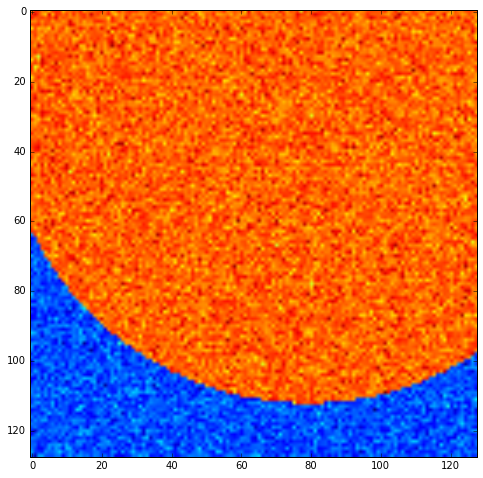

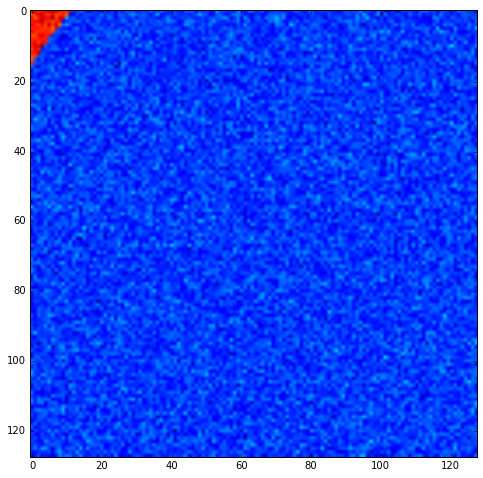

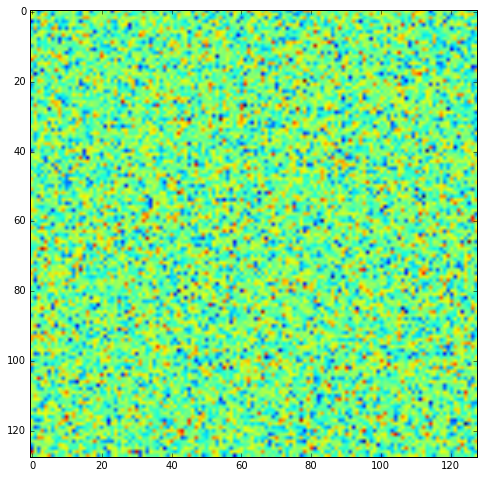

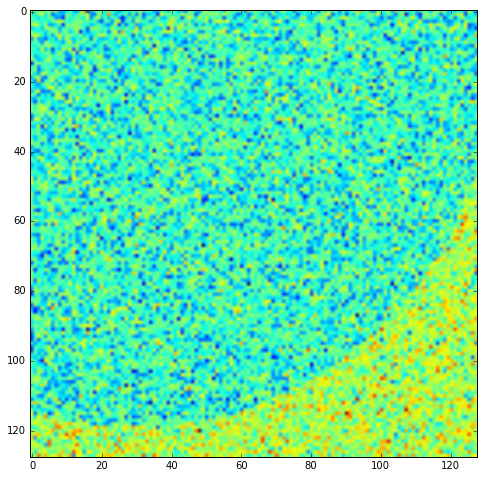

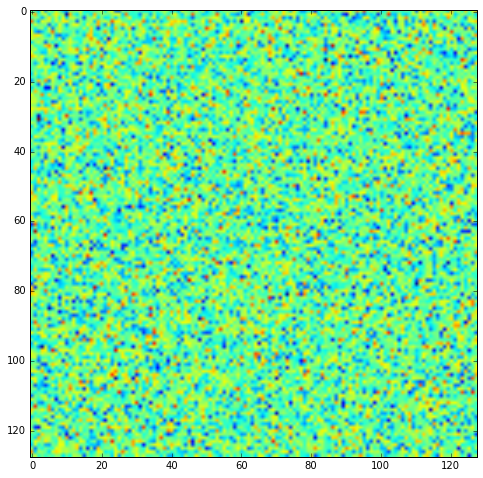

In [3]:
X,Y,Y_full = create_batch(nx,ny,5)

for i in range(5):
    plt.imshow(X[i,:,:])
    #plt.contour(Y[i,:,:,1],colors='black',linewidths=6)
    plt.show()

In [4]:
batch = 1
image_batch_input = tf.placeholder("float", shape=[batch, nx, ny])
image_batch = tf.reshape(image_batch_input, [batch,nx,ny,1])

keep_prob = tf.placeholder("float")
phase_train = tf.placeholder(tf.bool, name='phase_train')

label_batch_input = tf.placeholder("float", shape=[batch, nx, ny])
label_batch = tf.reshape(label_batch_input, [batch,nx,ny,1])

if network == 'CROP':
    crop_label_batch_input = tf.placeholder("float", shape=[batch, nx-184, ny-184])
    crop_label_batch = tf.reshape(crop_label_batch_input, [batch,nx-184,ny-184,1])

In [5]:
(((nx-180)/2+4)/2+4)/2+4

0

In [6]:
# For a square image nxn, the resulting prediction is of size (n-184)x(n-184)

n_class = 2
chanel_root = 32
field_of_view = 3
max_pool_size = 2

iterations = 10000
n_image = batch

def get_deconv_filter(f_shape):
    width = f_shape[0]
    height = f_shape[1]
    f = math.ceil(width/2.0)
    c = (2 * f - 1 - f % 2) / (2.0 * f)
    bilinear = np.zeros([f_shape[0], f_shape[1]])
    for x in range(width):
        for y in range(height):
            value = (1 - abs(x / f - c)) * (1 - abs(y / f - c))
            bilinear[x, y] = value
    weights = np.zeros(f_shape)
    for i in range(f_shape[2]):
        weights[:, :, i, i] = bilinear

    filt = tf.zeros_initializer(shape=weights.shape, dtype=tf.float32)
    filt = filt + weights
    return filt + 1e-4

def weight_variable(shape):
    initial = tf.truncated_normal(shape, stddev=0.1)
    return tf.Variable(initial)

def weight_variable_devonc(shape):
    #initial = 1.0/float(shape[0]*shape[1])
    #return tf.Variable(tf.add((np.ones(shape)*initial).astype(float32),tf.truncated_normal(shape, stddev=0.1)))
    return tf.Variable(tf.truncated_normal(shape, stddev=0.1))
    #return get_deconv_filter(shape)

def bias_variable(shape):
    initial = tf.constant(0.1, shape=shape)
    return tf.Variable(initial)

def conv2d(x, W,keep_prob_=None):
    conv_2d = tf.nn.conv2d(x, W, strides=[1, 1, 1, 1], padding='VALID')
    if keep_prob_ is not None:
        conv_2d = tf.nn.dropout(conv_2d, keep_prob_)
    return conv_2d

def deconv2d(x, W,stride):
    output_shape = tf.pack([tf.shape(x)[0], tf.shape(x)[1]*2, tf.shape(x)[2]*2, tf.shape(x)[3]/2])
    return tf.nn.conv2d_transpose(x, W, output_shape, strides=[1, stride, stride, 1], padding='VALID')

def max_pool(x,n):
    return tf.nn.max_pool(x, ksize=[1, n, n, 1], strides=[1, n, n, 1], padding='VALID')

def crop_and_concat(x1,x2,output_shape):
    #x1.set_shape(input_shape)
    x1_crop = tf.image.extract_glimpse(x1, [output_shape[1], output_shape[2]],np.zeros([output_shape[0],2]),centered=True)
    #x1_crop = tf.image.extract_glimpse(x1, [tf.shape(x2)[1], tf.shape(x2)[2]],tf.shape(x2)[0])
    return tf.concat(3,[x1_crop,x2]) 

def pixel_wise_softmax(output_map):
    exponential_map = tf.exp(output_map)
    evidence = tf.add(exponential_map,tf.reverse(exponential_map,[False,False,False,True]))
    return tf.div(exponential_map,evidence)

def relaxed_dice(y_,output_map,shape):
    epsilon = 1e-10
    slice_y = tf.slice(y_,[0,0,0,1],[shape[0],shape[1],shape[2],1])
    slice_output_map = tf.slice(output_map,[0,0,0,1],[shape[0],shape[1],shape[2],1])
    
    intersection = tf.reduce_sum(tf.mul(slice_y,slice_output_map),[1,2])
    average = tf.reduce_sum(tf.div(tf.add(slice_y,slice_output_map),tf.constant([2.0])),[1,2])
    
    dice = tf.div(intersection,tf.add(average,tf.constant([epsilon])))
    
    return tf.reduce_mean(dice)

if network == 'CROP':
    # Convolution 1
    W_conv1 = weight_variable([field_of_view, field_of_view, 1, chanel_root])
    b_conv1 = bias_variable([chanel_root])
    h_conv1 = tf.nn.relu(conv2d(image_batch, W_conv1,None) + b_conv1)

    # Convolution 2
    W_conv2 = weight_variable([field_of_view, field_of_view, chanel_root, chanel_root])
    b_conv2 = bias_variable([chanel_root])
    h_conv2 = tf.nn.relu(conv2d(h_conv1, W_conv2,keep_prob) + b_conv2)

    # Max Pool 1
    h_pool1 = max_pool(h_conv2, max_pool_size)

    # Convolution 3
    W_conv3 = weight_variable([field_of_view, field_of_view, chanel_root, 2*chanel_root])
    b_conv3 = bias_variable([2*chanel_root])
    h_conv3 = tf.nn.relu(conv2d(h_pool1, W_conv3,None) + b_conv3)

    # Convolution 4
    W_conv4 = weight_variable([field_of_view, field_of_view, 2*chanel_root, 2*chanel_root])
    b_conv4 = bias_variable([2*chanel_root])
    h_conv4 = tf.nn.relu(conv2d(h_conv3, W_conv4,keep_prob) + b_conv4)

    # Max Pool 2
    h_pool2 = max_pool(h_conv4, max_pool_size)

    # Convolution 5
    W_conv5 = weight_variable([field_of_view, field_of_view, 2*chanel_root, 4*chanel_root])
    b_conv5 = bias_variable([4*chanel_root])
    h_conv5 = tf.nn.relu(conv2d(h_pool2, W_conv5,None) + b_conv5)

    # Convolution 6
    W_conv6 = weight_variable([field_of_view, field_of_view, 4*chanel_root, 4*chanel_root])
    b_conv6 = bias_variable([4*chanel_root])
    h_conv6 = tf.nn.relu(conv2d(h_conv5, W_conv6,keep_prob) + b_conv6)

    # Max Pool 3
    h_pool3 = max_pool(h_conv6, max_pool_size)

    # Convolution 7
    W_conv7 = weight_variable([field_of_view, field_of_view, 4*chanel_root, 8*chanel_root])
    b_conv7 = bias_variable([8*chanel_root])
    h_conv7 = tf.nn.relu(conv2d(h_pool3, W_conv7,None) + b_conv7)

    # Convolution 8
    W_conv8 = weight_variable([field_of_view, field_of_view, 8*chanel_root, 8*chanel_root])
    b_conv8 = bias_variable([8*chanel_root])
    h_conv8 = tf.nn.relu(conv2d(h_conv7, W_conv8,keep_prob) + b_conv8)

    # Max Pool 4
    h_pool4 = max_pool(h_conv8, max_pool_size)

    # Convolution 9
    W_conv9 = weight_variable([field_of_view, field_of_view, 8*chanel_root, 16*chanel_root])
    b_conv9 = bias_variable([16*chanel_root])
    h_conv9 = tf.nn.relu(conv2d(h_pool4, W_conv9,None) + b_conv9)

    # Convolution 10
    W_conv10 = weight_variable([field_of_view, field_of_view, 16*chanel_root, 16*chanel_root])
    b_conv10 = bias_variable([16*chanel_root])
    h_conv10 = tf.nn.relu(conv2d(h_conv9, W_conv10,keep_prob) + b_conv10)

    # Deconvolution 1
    W_deconv_1 = weight_variable_devonc([max_pool_size, max_pool_size, 8*chanel_root, 16*chanel_root])
    b_deconv1 = bias_variable([8*chanel_root])
    h_deconv1 = tf.nn.relu(deconv2d(h_conv10, W_deconv_1, max_pool_size) + b_deconv1)
    h_deconv1_concat = crop_and_concat(h_conv8,h_deconv1,[n_image,(((nx-180)/2+4)/2+4)/2+4,(((ny-180)/2+4)/2+4)/2+4,8*chanel_root])

    # Convolution 11
    W_conv11 = weight_variable([field_of_view, field_of_view, 16*chanel_root, 8*chanel_root])
    b_conv11 = bias_variable([8*chanel_root])
    h_conv11 = tf.nn.relu(conv2d(h_deconv1_concat, W_conv11,None) + b_conv11)

    # Convolution 12
    W_conv12 = weight_variable([field_of_view, field_of_view, 8*chanel_root, 8*chanel_root])
    b_conv12 = bias_variable([8*chanel_root])
    h_conv12 = tf.nn.relu(conv2d(h_conv11, W_conv12,keep_prob) + b_conv12)

    # Deconvolution 2
    W_deconv_2 = weight_variable_devonc([max_pool_size, max_pool_size, 4*chanel_root, 8*chanel_root])
    b_deconv2 = bias_variable([4*chanel_root])
    h_deconv2 = tf.nn.relu(deconv2d(h_conv12, W_deconv_2, max_pool_size) + b_deconv2)
    h_deconv2_concat = crop_and_concat(h_conv6,h_deconv2,[n_image,((nx-180)/2+4)/2+4,((ny-180)/2+4)/2+4,4*chanel_root])

    # Convolution 13
    W_conv13 = weight_variable([field_of_view, field_of_view, 8*chanel_root, 4*chanel_root])
    b_conv13 = bias_variable([4*chanel_root])
    h_conv13 = tf.nn.relu(conv2d(h_deconv2_concat, W_conv13,None) + b_conv13)

    # Convolution 14
    W_conv14 = weight_variable([field_of_view, field_of_view, 4*chanel_root, 4*chanel_root])
    b_conv14 = bias_variable([4*chanel_root])
    h_conv14 = tf.nn.relu(conv2d(h_conv13, W_conv14,keep_prob) + b_conv14)

    # Deconvolution 3
    W_deconv_3 = weight_variable_devonc([max_pool_size, max_pool_size, 2*chanel_root, 4*chanel_root])
    b_deconv3 = bias_variable([2*chanel_root])
    h_deconv3 = tf.nn.relu(deconv2d(h_conv14, W_deconv_3, max_pool_size) + b_deconv3)
    h_deconv3_concat = crop_and_concat(h_conv4,h_deconv3,[n_image,(nx-180)/2+4,(ny-180)/2+4,2*chanel_root])

    # Convolution 15
    W_conv15 = weight_variable([field_of_view, field_of_view, 4*chanel_root, 2*chanel_root])
    b_conv15 = bias_variable([2*chanel_root])
    h_conv15 = tf.nn.relu(conv2d(h_deconv3_concat, W_conv15, None) + b_conv15)

    # Convolution 16
    W_conv16 = weight_variable([field_of_view, field_of_view, 2*chanel_root, 2*chanel_root])
    b_conv16 = bias_variable([2*chanel_root])
    h_conv16 = tf.nn.relu(conv2d(h_conv15, W_conv16,keep_prob) + b_conv16)

    # Deconvolution 4
    W_deconv_4 = weight_variable_devonc([max_pool_size, max_pool_size, chanel_root, 2*chanel_root])
    b_deconv4 = bias_variable([chanel_root])
    h_deconv4 = tf.nn.relu(deconv2d(h_conv16, W_deconv_4, max_pool_size) + b_deconv4)
    h_deconv4_concat = crop_and_concat(h_conv2,h_deconv4,[n_image,nx-180,ny-180,chanel_root])

    # Convolution 17
    W_conv17 = weight_variable([field_of_view, field_of_view, 2*chanel_root, chanel_root])
    b_conv17 = bias_variable([chanel_root])
    h_conv17 = tf.nn.relu(conv2d(h_deconv4_concat, W_conv17, None) + b_conv17)

    # Convolution 18
    W_conv18 = weight_variable([field_of_view, field_of_view, chanel_root, chanel_root])
    b_conv18 = bias_variable([chanel_root])
    h_conv18 = tf.nn.relu(conv2d(h_conv17, W_conv18,keep_prob) + b_conv18)

    # Output Map
    W_conv19 = weight_variable([1, 1, chanel_root, n_class])
    b_conv19 = bias_variable([n_class])
    h_conv19 = tf.nn.relu(conv2d(h_conv18, W_conv19, None) + b_conv19)
    #h_conv19 = tf.nn.relu(conv2d(h_conv18, W_conv19, None))

    #first shift the values of f so that the highest number is 0
    #max_val = tf.reduce_max(h_conv19)
    #h_conv19 = h_conv19 - max_val
    
    output_map = pixel_wise_softmax(h_conv19)
    pred = tf.argmax(output_map, dimension=3)

    net_parts = {
    'pool1': h_pool1,
    'pool2': h_pool2,
    'pool3': h_pool3,
    'pool4': h_pool4,
    'last_downconv': h_conv10,

    'deconv1': h_deconv1,
    'deconv2': h_deconv2,
    'deconv3': h_deconv3,
    'deconv4': h_deconv4,
    }

In [7]:
import nerveseg_input
import nerveseg
batch = 1

FLAGS = tf.app.flags.FLAGS
FLAGS.batch_size = batch


if network == 'MINE':
    output_map, pred, net_parts = nerveseg.inference(image_batch, keep_prob, phase_train)

Class ratio: 0.0120589042214


In [8]:
X, Y, Y_full = create_batch(nx,ny,batch)


/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:31: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


In [9]:
sess = tf.InteractiveSession()
sess.run(tf.initialize_all_variables())

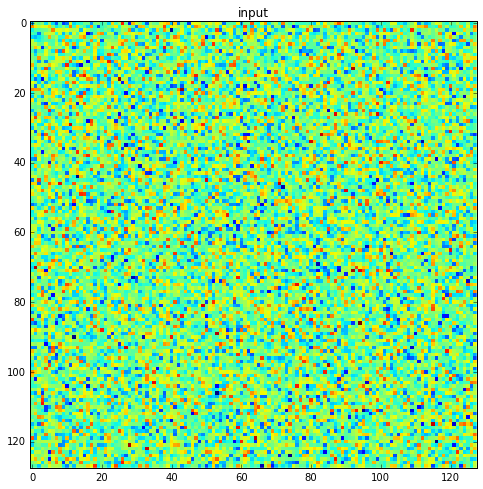

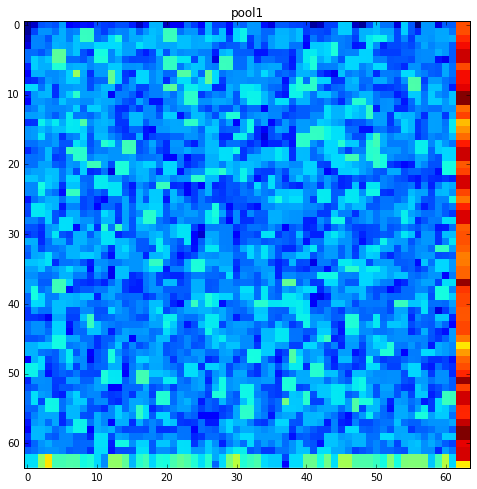

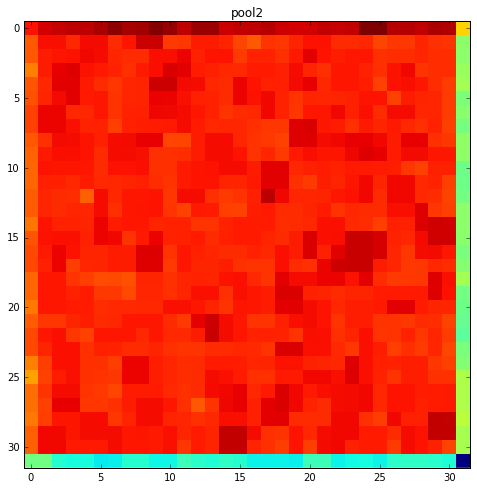

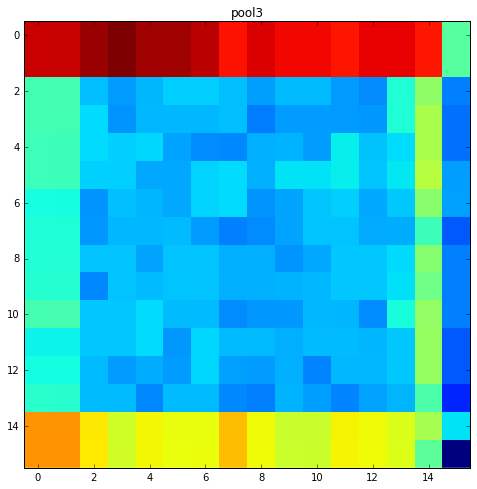

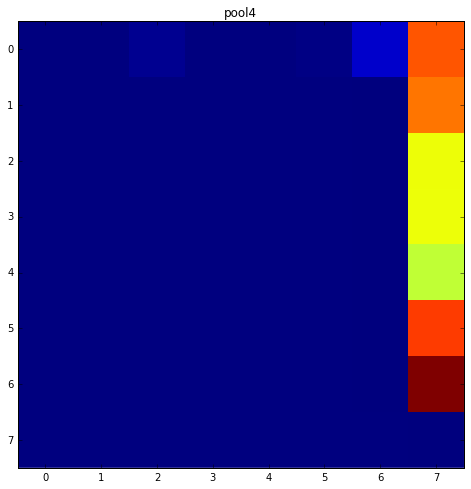

...

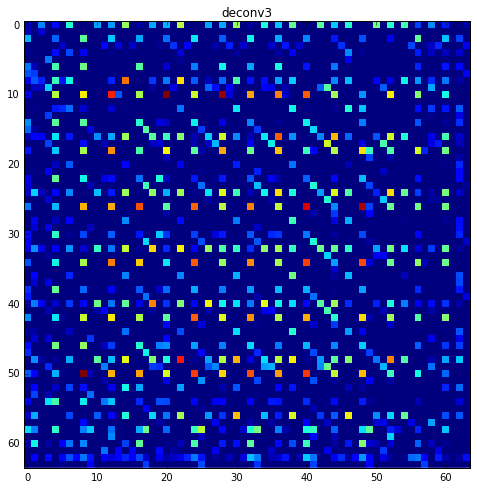

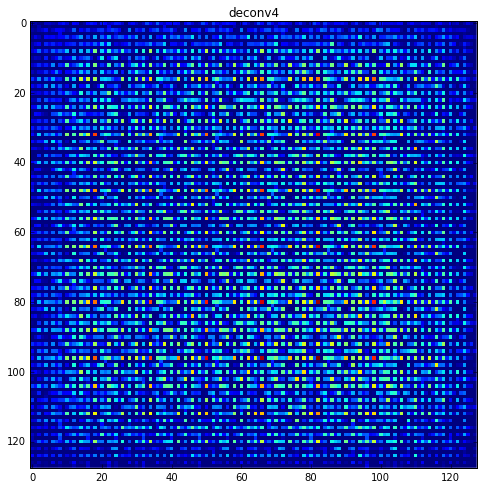

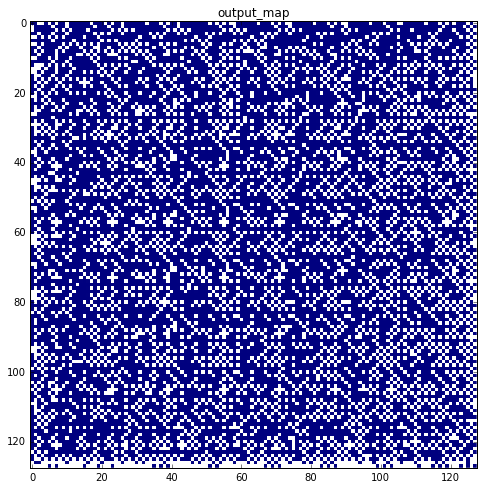

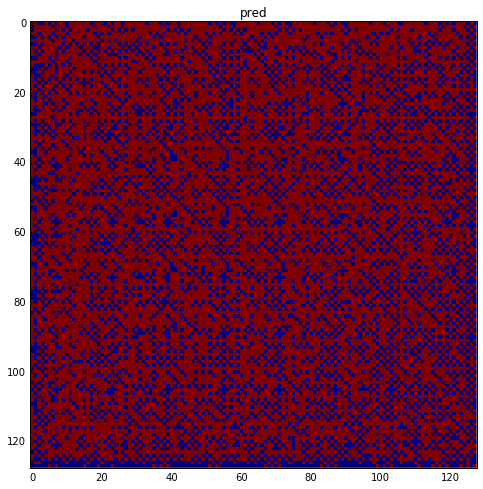

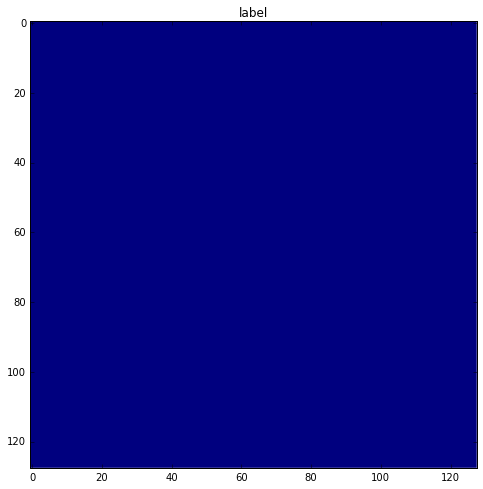

In [10]:

plt.title('input')
plt.imshow(X[0,:,:],interpolation='none')
plt.show()

feed_dict_eval = {
    image_batch_input: X,
    label_batch_input: Y_full,
    keep_prob: 1.0,
    phase_train: False,
} 

if network == 'CROP':
    feed_dict_eval[crop_label_batch_input] = Y

pool_1 = net_parts['pool1'].eval(feed_dict=feed_dict_eval)
pool_2 = net_parts['pool2'].eval(feed_dict=feed_dict_eval)
pool_3 = net_parts['pool3'].eval(feed_dict=feed_dict_eval)
pool_4 = net_parts['pool4'].eval(feed_dict=feed_dict_eval)
last_downconv = net_parts['last_downconv'].eval(feed_dict=feed_dict_eval)

plt.title('pool1')
plt.imshow(pool_1[0,:,:,0],interpolation='none')
plt.show()
plt.title('pool2')
plt.imshow(pool_2[0,:,:,0],interpolation='none')
plt.show()
plt.title('pool3')
plt.imshow(pool_3[0,:,:,0],interpolation='none')
plt.show()
plt.title('pool4')
plt.imshow(pool_4[0,:,:,1],interpolation='none')
plt.show()
plt.title('last_downconv')
plt.imshow(last_downconv[0,:,:,1],interpolation='none')
plt.show()


deconv_1 = net_parts['deconv1'].eval(feed_dict=feed_dict_eval)
deconv_2 = net_parts['deconv2'].eval(feed_dict=feed_dict_eval)
deconv_3 = net_parts['deconv3'].eval(feed_dict=feed_dict_eval)
deconv_4 = net_parts['deconv4'].eval(feed_dict=feed_dict_eval)

plt.title('deconv1')
plt.imshow(deconv_1[0,:,:,1],interpolation='none')
plt.show()
plt.title('deconv2')
plt.imshow(deconv_2[0,:,:,3],interpolation='none')
plt.show()
plt.title('deconv3')
plt.imshow(deconv_3[0,:,:,0],interpolation='none')
plt.show()
plt.title('deconv4')
plt.imshow(deconv_4[0,:,:,0],interpolation='none')
plt.show()

output_map_val = output_map.eval(feed_dict=feed_dict_eval)
result = pred.eval(feed_dict=feed_dict_eval)

plt.title('output_map')
plt.imshow(output_map_val[0,:,:,1],interpolation='none')
plt.show()

plt.title('pred')
plt.imshow(result[0,:,:],interpolation='none')
plt.show()

plt.title('label')
plt.imshow(Y_full[0,:,:],interpolation='none')
plt.show()

In [11]:
import nerveseg_train

if network == 'MINE':
    dice_placeholder = nerveseg_train.dice_coeff(pred, label_batch)
    dice_value = dice_placeholder.eval(feed_dict=feed_dict_eval)

    print(dice_value)

[ 0.83138973]


Filling train dict copy
No label, skipping 31_82
No label, skipping 31_83


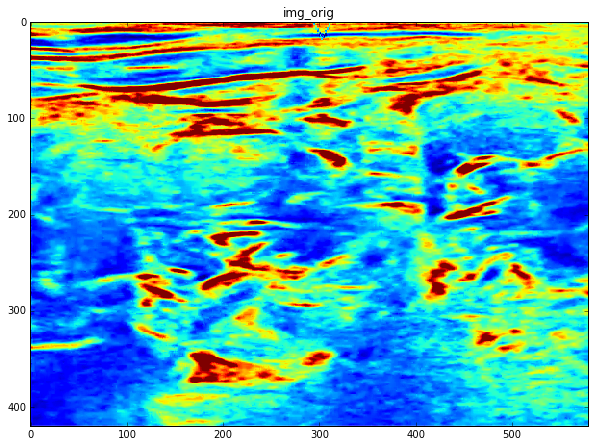

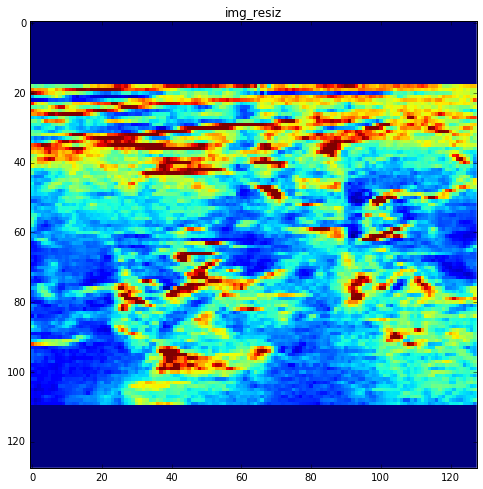

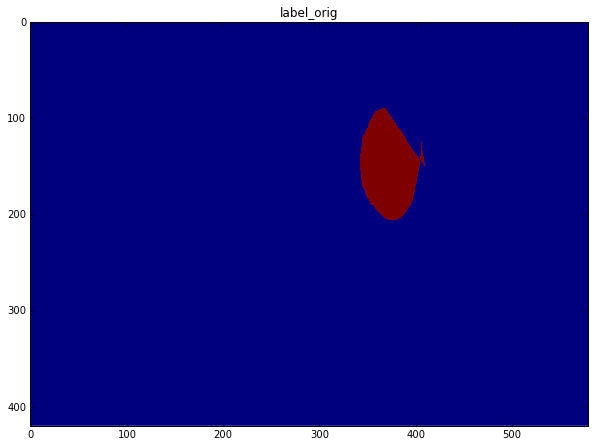

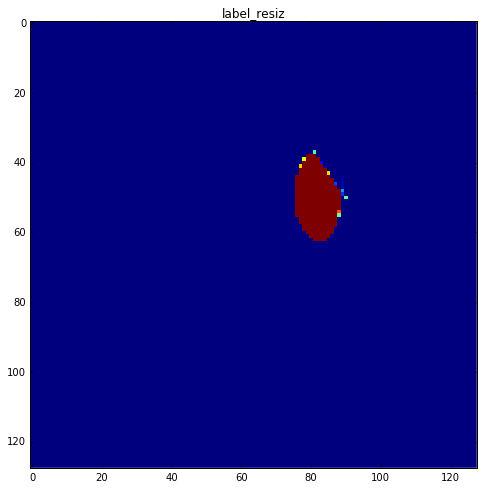

No label, skipping 31_81
No label, skipping 31_86
No label, skipping 31_87
No label, skipping 31_84


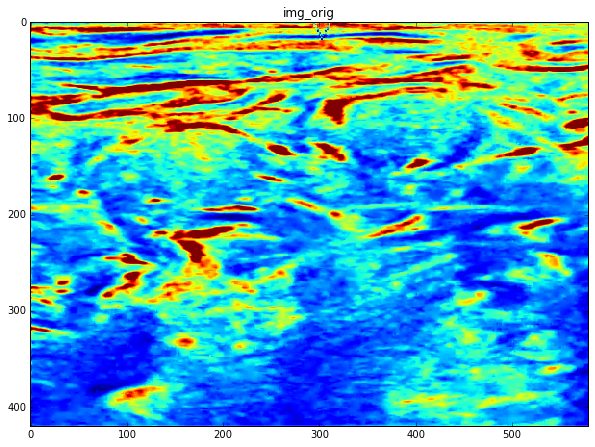

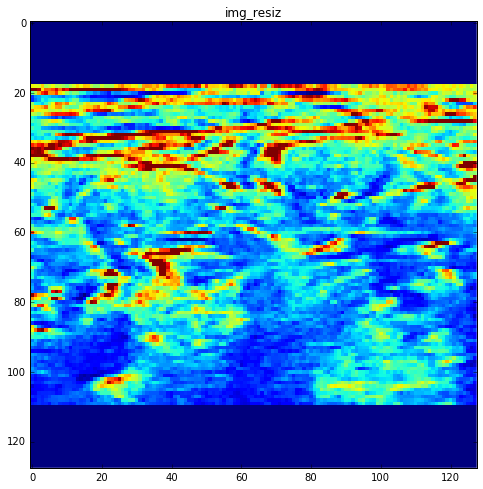

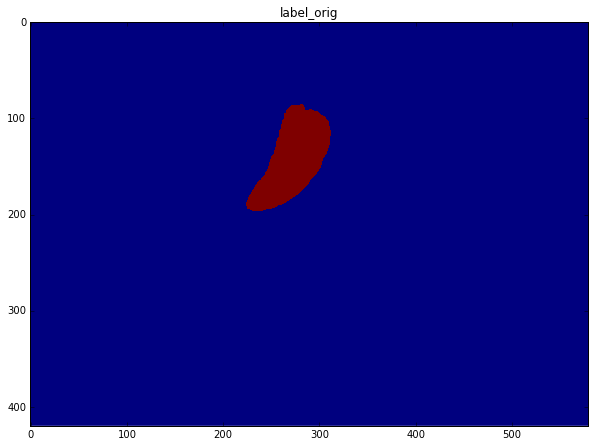

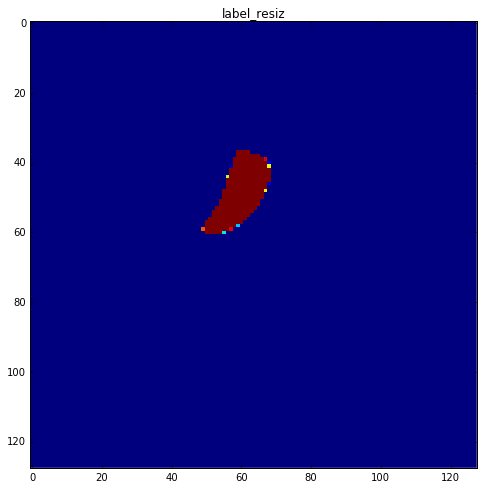

No label, skipping 31_88
No label, skipping 31_89


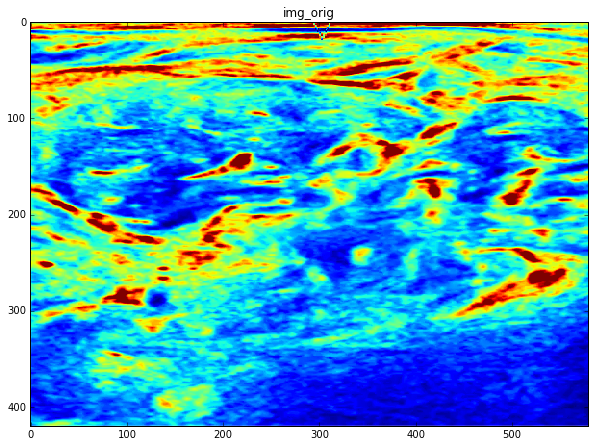

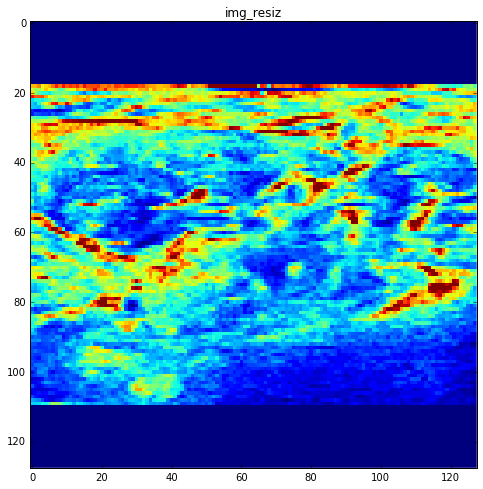

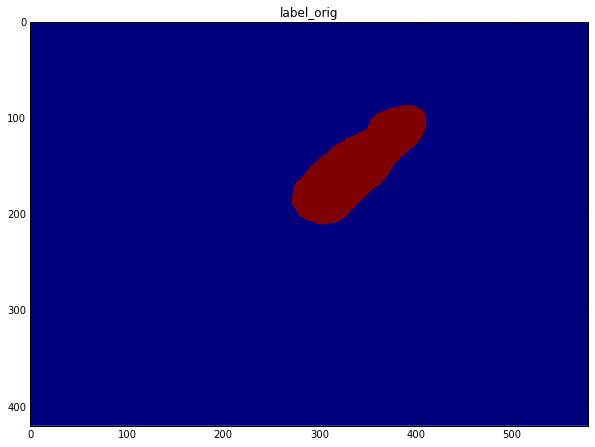

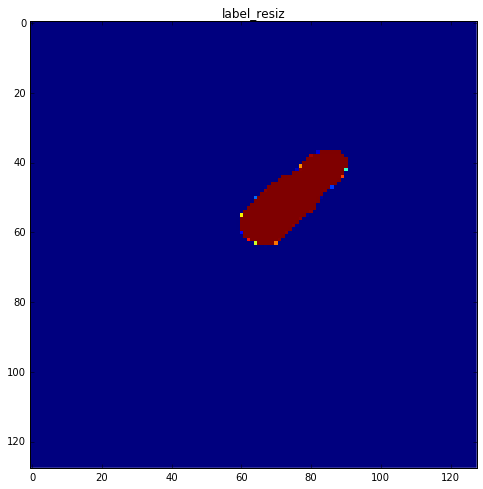

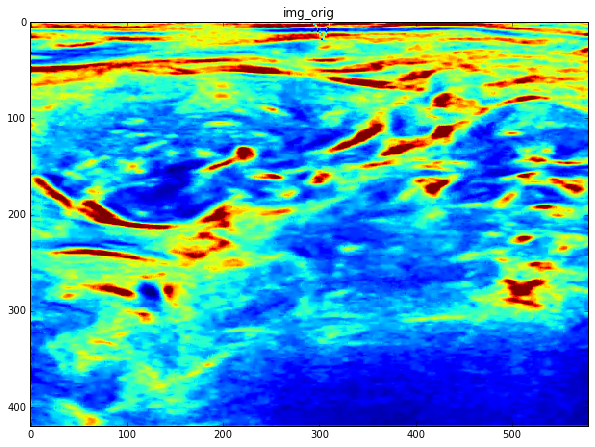

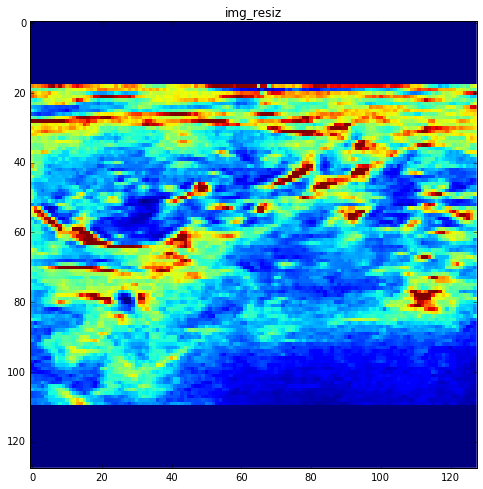

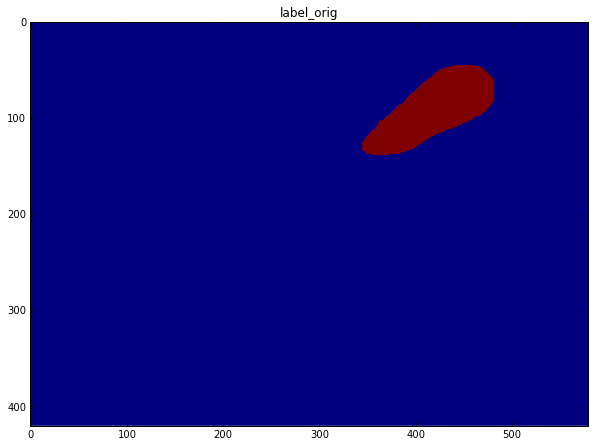

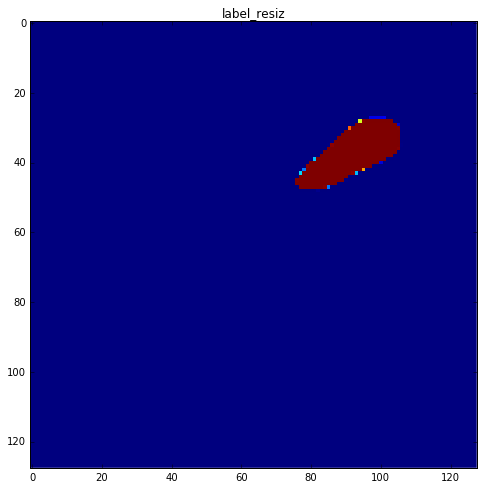

No label, skipping 29_54
No label, skipping 29_55
No label, skipping 29_56


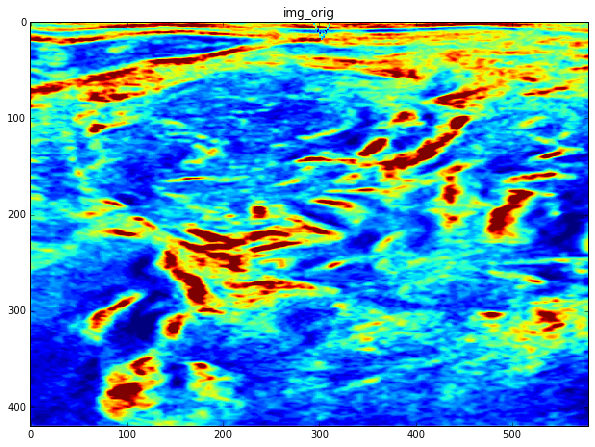

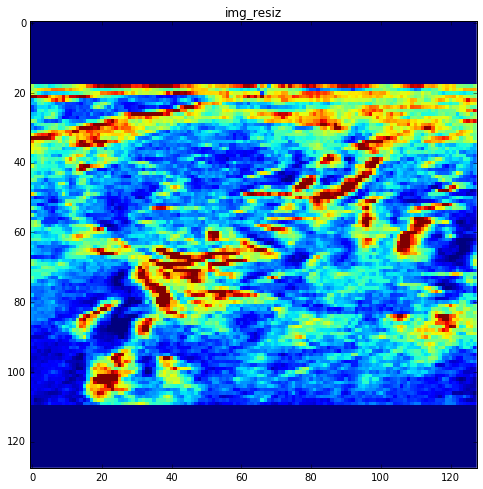

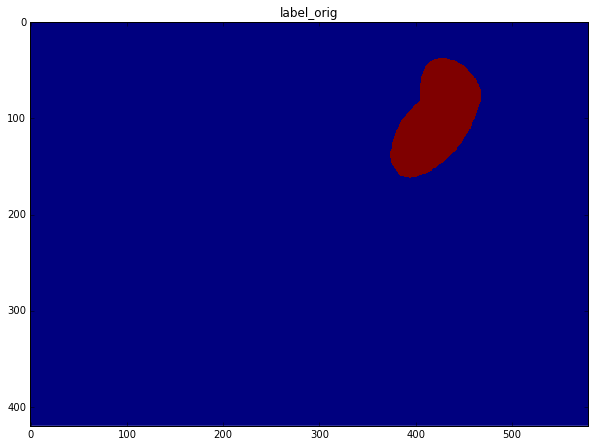

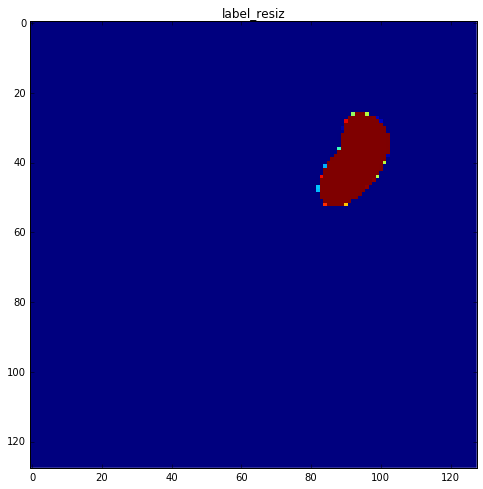

In [12]:
import nerveseg_input
import cv2

TRAIN_DICT = nerveseg_input.read_labeled_image_dir('/home/mtourne/data/nerveseg/train/png')
TRAIN_DICT_COPY = {}

target_dim = nx

img_mean = 99.4930907001
img_std = 56.6518606624

DEBUG=True

def print_img(img, name='No name'):
    plt.title(name)
    plt.imshow(img,interpolation='none')
    plt.show()

def pad_and_resize(img, pad_value=0):
    cols = 580
    rows = 420
    diff = cols - rows
    # add border of zeros to make a square
    img = cv2.copyMakeBorder(img,diff/2,diff/2,0,0,cv2.BORDER_CONSTANT,value=pad_value)
    # redimension the square to 256 pixels
    img = cv2.resize(img, (target_dim, target_dim), interpolation=cv2.INTER_CUBIC)
    return img

def my_deepcopy(train_dict_copy, train_dict):
    print("Filling train dict copy")
    for k, v in train_dict.iteritems():
        train_dict_copy[k] = v

def get_nerve_image(debug=False):
    found_mask = False
    while not found_mask:
        if len(TRAIN_DICT_COPY.keys()) <= 1:
            my_deepcopy(TRAIN_DICT_COPY, TRAIN_DICT)
        (image_name, (image_file, label_file)) = TRAIN_DICT_COPY.popitem()
        img = cv2.imread(image_file, cv2.IMREAD_GRAYSCALE)
        label = cv2.imread(label_file, cv2.IMREAD_GRAYSCALE)
        
        label = np.array(label)
        label_max = np.amax(label)
        if label_max == 0:
            print("No label, skipping {}".format(image_name))
        else:
            found_mask = True
    
    if debug:
        print_img(img, 'img_orig')

    #img = pad_and_resize(img, pad_value=img_mean)
    img = pad_and_resize(img, pad_value=0)
    if debug:
        print_img(img, 'img_resiz')
    
    if debug:
        print_img(label, 'label_orig')
        
    label = pad_and_resize(label)
    if debug: 
        print_img(label, 'label_resiz')
    
    img = np.array(img)
    img = img.astype('float32')
    
    label = label.astype('float32')

    #img -= img_mean
    #img /= img_std
    
    label /= 255.0 # scale masks to [0, 1]  
    
    return img, label

def get_nerve_batch(n_image):
    nx = target_dim
    ny = target_dim 
    X = np.zeros((n_image,nx,ny))
    if network == 'CROP':
        Y = np.zeros((n_image,nx-184,ny-184))
    else: 
        Y = 0
    Y_full = np.zeros((n_image,nx,ny))
    for i in xrange(n_image):
        X[i,:,:],Y_full[i,:,:] = get_nerve_image()
        if network == 'CROP':
            Y[i,:,:] = Y_full[i,92:nx-92,92:ny-92]

    return X,Y,Y_full
    
if DEBUG:
    for i in xrange(5):
        get_nerve_image(debug=True)

Class ratio: 0.0120589042214
cross entropy shape: (16384,)
step: 0, loss: 0.10655285418, dice: [ 0.02046958]


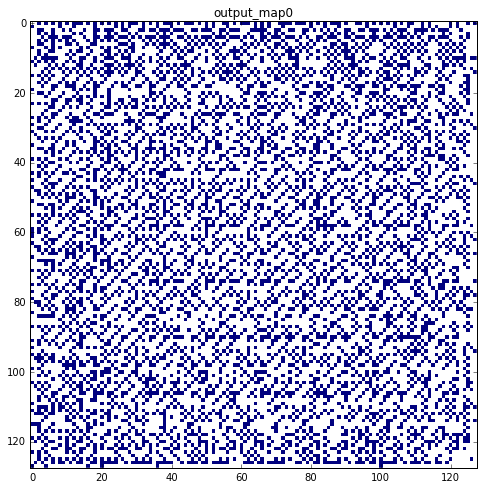

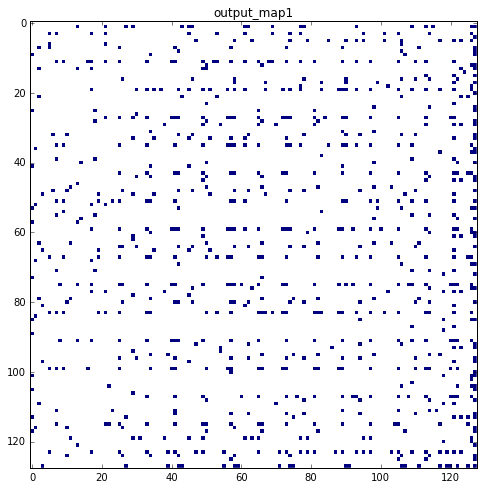

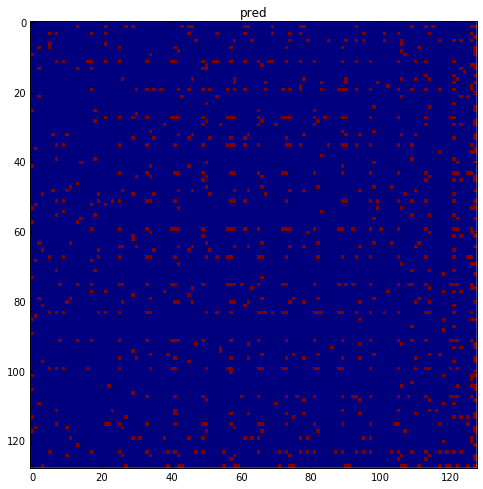

map0 max: nan, map1 max: nan, pred max: 1


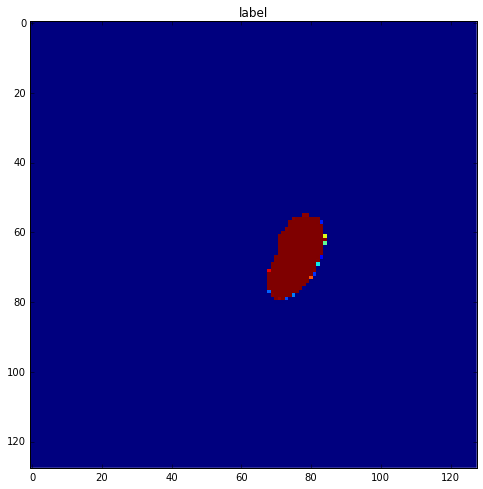

No label, skipping 13_66
No label, skipping 13_67
No label, skipping 13_60
No label, skipping 13_61
No label, skipping 25_111
No label, skipping 12_113
No label, skipping 33_84
No label, skipping 33_85
No label, skipping 33_86
No label, skipping 33_87
No label, skipping 33_80
No label, skipping 33_81
No label, skipping 33_82
No label, skipping 33_83
Filling train dict copy
No label, skipping 33_88
No label, skipping 33_89
No label, skipping 31_82
No label, skipping 31_83
step: 5, loss: 0.019752278924, dice: [ 0.03591878]
No label, skipping 31_81
No label, skipping 31_86
No label, skipping 31_87
No label, skipping 31_84
No label, skipping 31_88
No label, skipping 31_89
No label, skipping 29_54
No label, skipping 29_55
No label, skipping 29_56
No label, skipping 29_50
step: 10, loss: 0.0240328479558, dice: [ 0.08558983]
No label, skipping 29_53
No label, skipping 4_19
No label, skipping 4_14
No label, skipping 4_15
No label, skipping 4_17
No label, skipping 4_10
No label, skipping 4_12
N

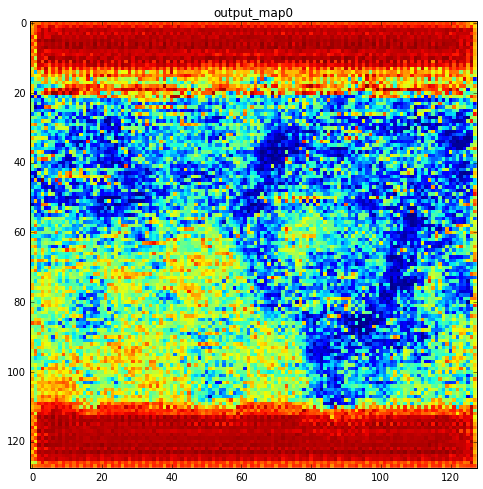

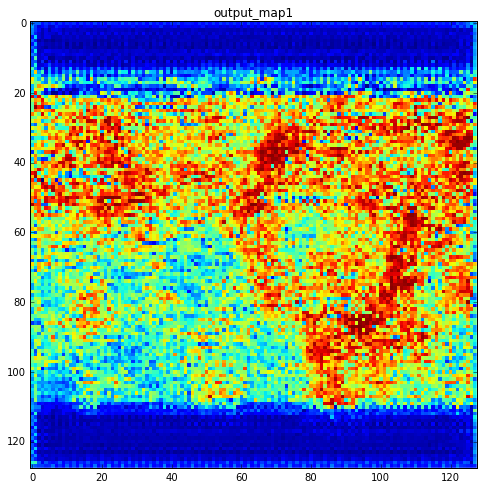

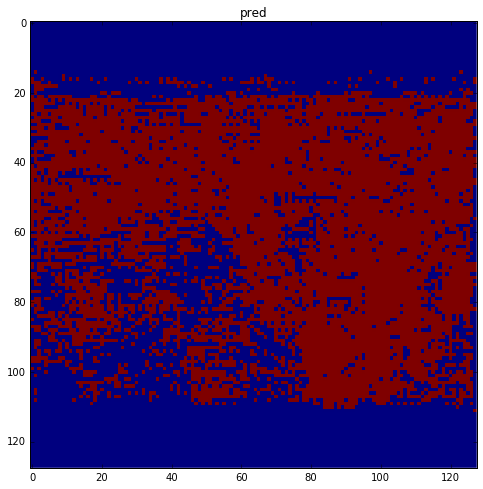

map0 max: 0.970423817635, map1 max: 0.999677062035, pred max: 1


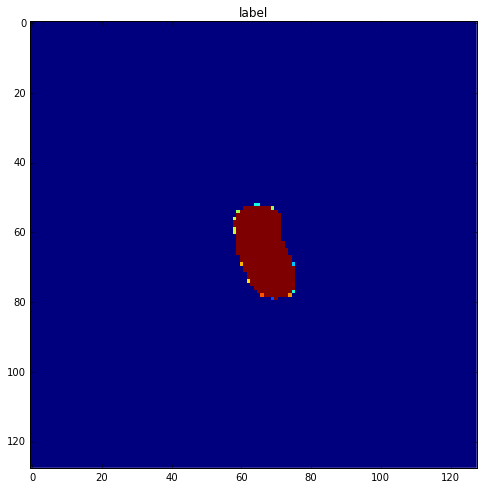

No label, skipping 30_57
No label, skipping 30_54
No label, skipping 30_52
No label, skipping 30_53
No label, skipping 30_50
No label, skipping 30_51
No label, skipping 5_22
No label, skipping 5_20
No label, skipping 5_21
No label, skipping 5_26
No label, skipping 5_27
No label, skipping 5_24
No label, skipping 5_25
No label, skipping 5_29
step: 105, loss: 0.0173848830163, dice: [ 0.11092974]
No label, skipping 45_103
No label, skipping 45_102
No label, skipping 45_101
No label, skipping 45_100
No label, skipping 45_107
No label, skipping 45_106
No label, skipping 45_104
No label, skipping 45_109
No label, skipping 45_108
No label, skipping 17_18
No label, skipping 17_15
No label, skipping 17_14
No label, skipping 11_100
No label, skipping 11_101
No label, skipping 11_102
step: 110, loss: 0.0220995973796, dice: [ 0.10835657]
No label, skipping 39_48
No label, skipping 39_49
No label, skipping 39_46
No label, skipping 39_47
No label, skipping 39_44
No label, skipping 39_45
No label, ski

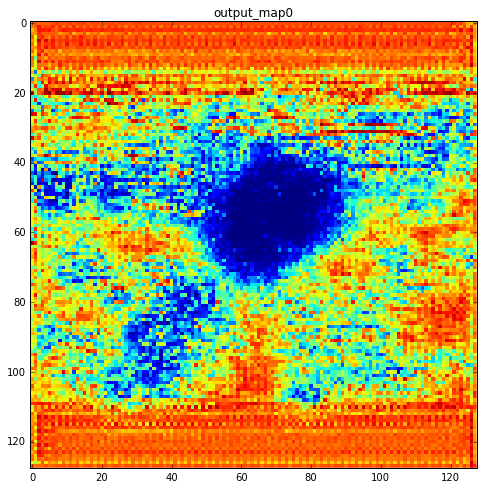

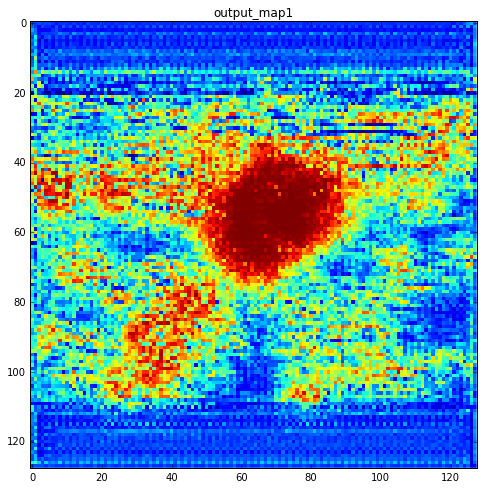

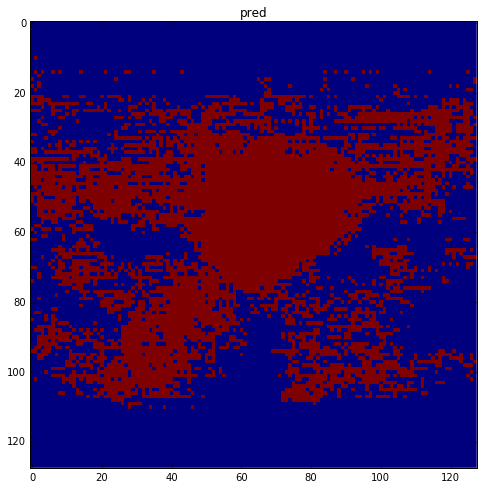

map0 max: 0.970564365387, map1 max: 0.999955952168, pred max: 1


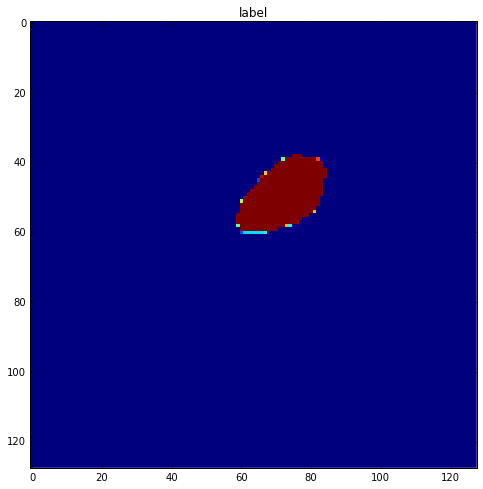

No label, skipping 11_47
No label, skipping 36_119
No label, skipping 5_108
No label, skipping 5_109
No label, skipping 5_105
No label, skipping 36_110
step: 205, loss: 0.00963546242565, dice: [ 0.10506182]
No label, skipping 5_100
No label, skipping 36_114
No label, skipping 36_115
No label, skipping 18_8
No label, skipping 18_9
No label, skipping 18_6
No label, skipping 18_5
step: 210, loss: 0.00903384946287, dice: [ 0.10779044]
No label, skipping 18_3
No label, skipping 18_1
No label, skipping 6_38
No label, skipping 6_30
No label, skipping 6_32
No label, skipping 6_33
No label, skipping 6_34
No label, skipping 6_35
No label, skipping 6_36
No label, skipping 6_37
No label, skipping 4_78
No label, skipping 4_79
No label, skipping 4_76
No label, skipping 4_77
No label, skipping 4_72
No label, skipping 4_73
No label, skipping 4_70
No label, skipping 4_71
No label, skipping 21_18
No label, skipping 21_19
No label, skipping 21_10
No label, skipping 21_11
No label, skipping 21_12
No label

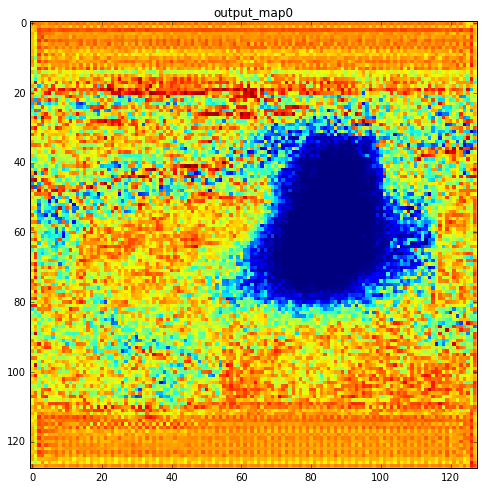

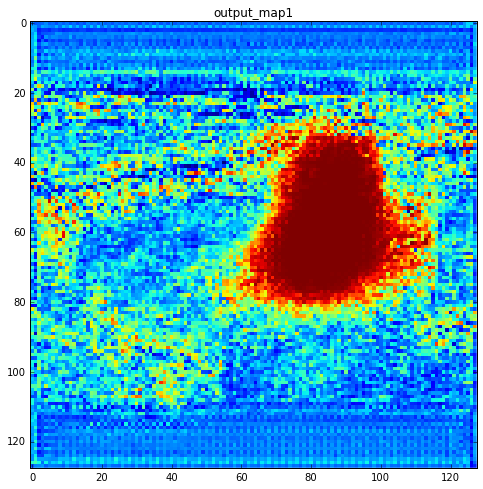

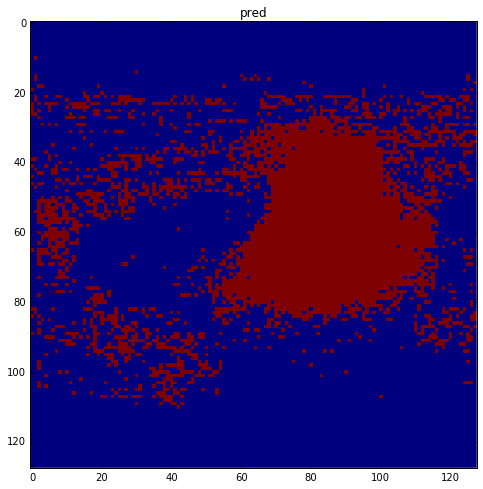

map0 max: 0.981300532818, map1 max: 1.0, pred max: 1


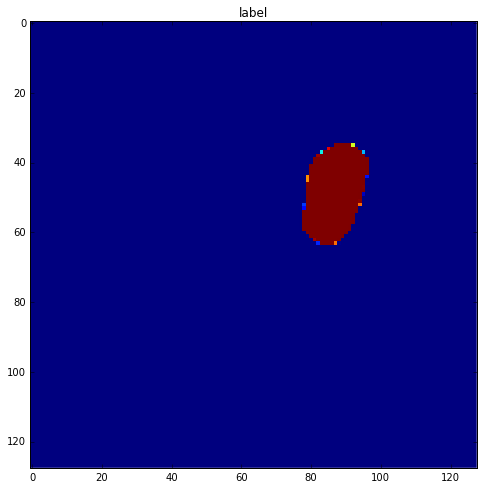

No label, skipping 7_53
step: 305, loss: 0.00746612809598, dice: [ 0.18299475]
No label, skipping 43_10
No label, skipping 43_13
No label, skipping 43_14
step: 310, loss: 0.0069130146876, dice: [ 0.21677962]
No label, skipping 43_16
No label, skipping 43_17
No label, skipping 43_19
No label, skipping 45_74
No label, skipping 45_75
No label, skipping 45_77
No label, skipping 45_70
No label, skipping 45_71
No label, skipping 45_72
No label, skipping 45_73
No label, skipping 45_78
No label, skipping 45_79
No label, skipping 10_25
step: 315, loss: 0.00884028617293, dice: [ 0.16481876]
No label, skipping 10_21
No label, skipping 10_20
No label, skipping 10_23
No label, skipping 10_22
No label, skipping 10_29
No label, skipping 46_113
No label, skipping 46_112
No label, skipping 46_111
No label, skipping 46_110
No label, skipping 46_117
No label, skipping 46_116
No label, skipping 46_114
No label, skipping 46_119
No label, skipping 46_118
No label, skipping 20_88
No label, skipping 20_81
No 

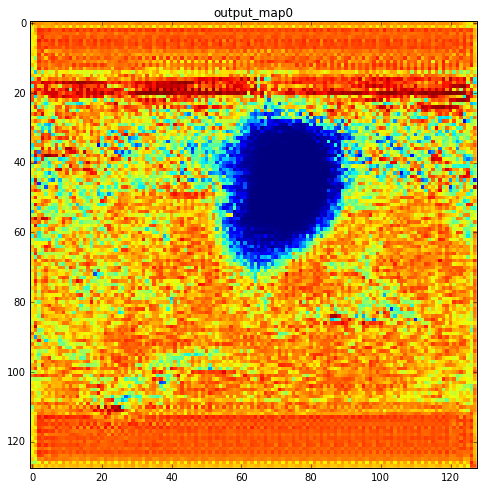

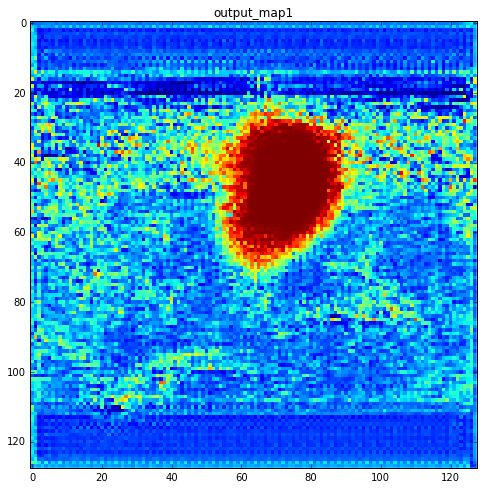

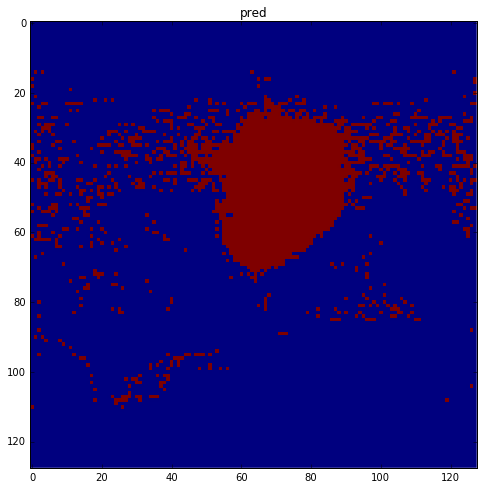

map0 max: 0.994562327862, map1 max: 0.999998748302, pred max: 1


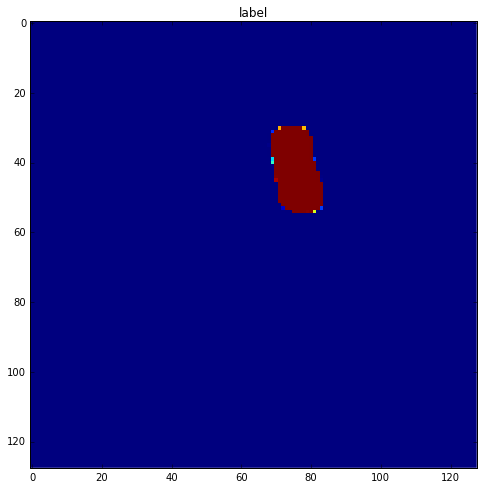

No label, skipping 27_47
No label, skipping 27_46
No label, skipping 27_41
No label, skipping 27_40
No label, skipping 27_43
No label, skipping 27_42
No label, skipping 27_49
No label, skipping 27_48
No label, skipping 19_35
No label, skipping 19_37
No label, skipping 19_31
No label, skipping 19_33
No label, skipping 2_92
No label, skipping 2_93
No label, skipping 2_90
No label, skipping 2_91
No label, skipping 2_96
No label, skipping 2_97
step: 405, loss: 0.00853386521339, dice: [ 0.24643798]
No label, skipping 2_95
No label, skipping 2_98
No label, skipping 2_99
No label, skipping 28_80
No label, skipping 28_81
No label, skipping 28_85
No label, skipping 28_86
No label, skipping 28_87
No label, skipping 28_88
step: 410, loss: 0.00639063678682, dice: [ 0.30571225]
No label, skipping 7_18
step: 415, loss: 0.00563225289807, dice: [ 0.35117996]
No label, skipping 33_71
No label, skipping 2_10
No label, skipping 19_13
step: 420, loss: 0.00761391688138, dice: [ 0.16263326]
No label, skippi

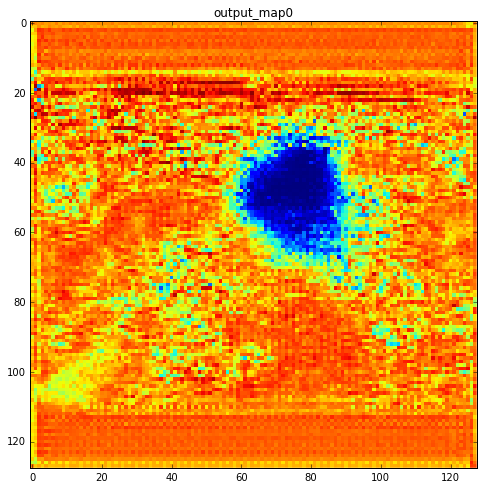

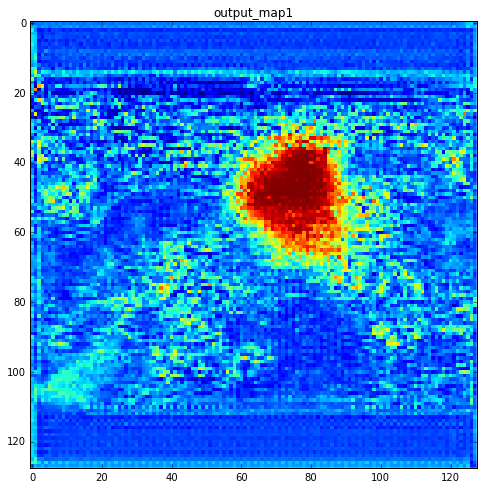

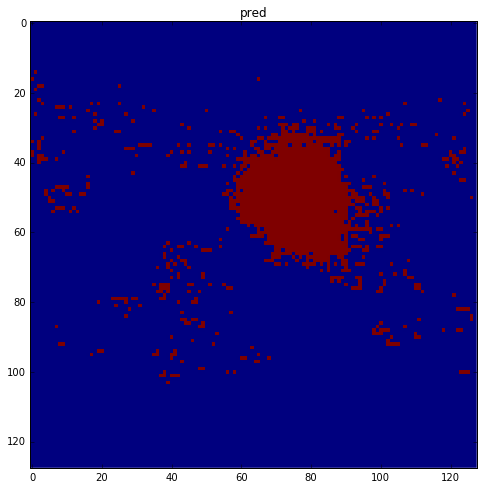

map0 max: 0.982267558575, map1 max: 0.999241411686, pred max: 1


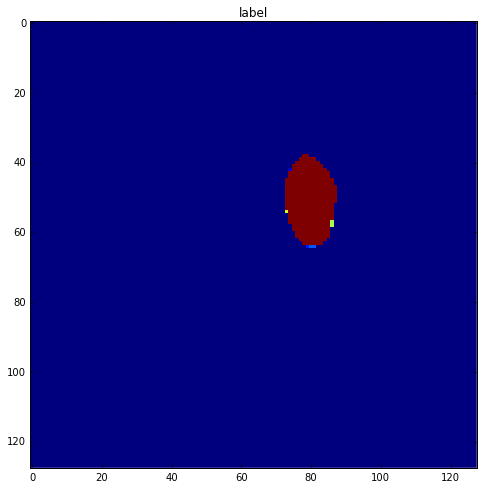

No label, skipping 40_60
No label, skipping 27_120
No label, skipping 40_62
No label, skipping 40_63
No label, skipping 40_64
No label, skipping 40_65
No label, skipping 40_66
No label, skipping 40_67
No label, skipping 40_68
No label, skipping 40_69
step: 505, loss: 0.00586746167392, dice: [ 0.32414308]
No label, skipping 19_74
No label, skipping 19_76
No label, skipping 38_63
No label, skipping 38_61
step: 510, loss: 0.00656603649259, dice: [ 0.22728866]
No label, skipping 38_67
No label, skipping 38_66
No label, skipping 38_65
No label, skipping 38_64
No label, skipping 38_68
No label, skipping 9_49
No label, skipping 9_44
step: 515, loss: 0.00783326756209, dice: [ 0.26129627]
No label, skipping 9_40
No label, skipping 9_42
step: 520, loss: 0.00738936662674, dice: [ 0.43681341]
No label, skipping 16_44
step: 525, loss: 0.0056120082736, dice: [ 0.35110784]
No label, skipping 34_96
No label, skipping 34_95
step: 530, loss: 0.00653946818784, dice: [ 0.29280105]
No label, skipping 34_90

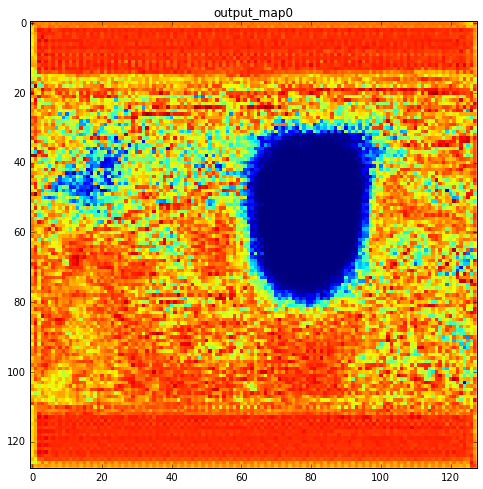

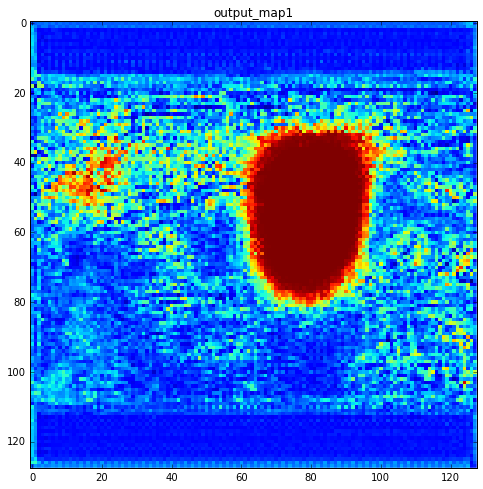

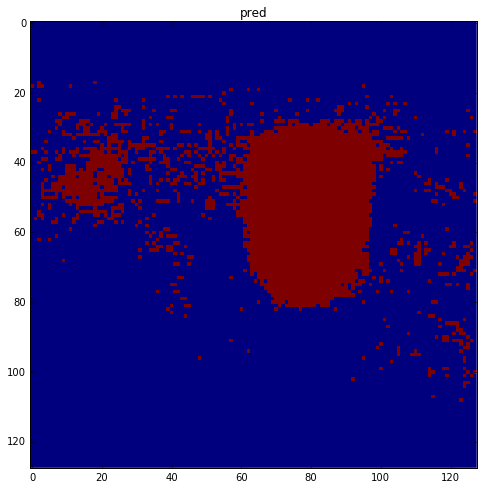

map0 max: 0.977778851986, map1 max: 1.0, pred max: 1


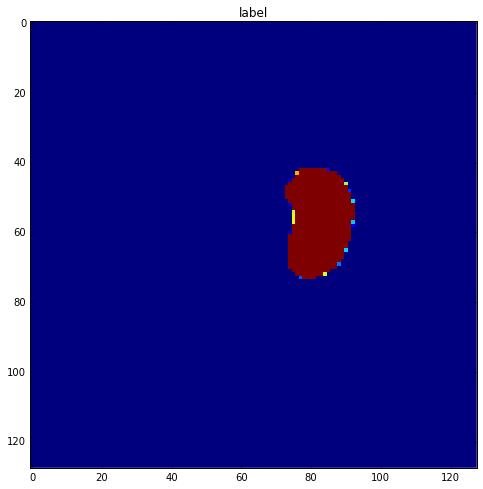

step: 605, loss: 0.00609437283128, dice: [ 0.25618094]
No label, skipping 9_66
No label, skipping 9_65
No label, skipping 24_9
No label, skipping 24_7
step: 610, loss: 0.00633910251781, dice: [ 0.35773656]
No label, skipping 24_3
No label, skipping 46_35
No label, skipping 46_37
No label, skipping 46_36
step: 615, loss: 0.0294183343649, dice: [ 0.02472384]
No label, skipping 46_30
No label, skipping 46_33
No label, skipping 46_32
No label, skipping 46_39
step: 620, loss: 0.00559638161212, dice: [ 0.31391332]
No label, skipping 37_48
step: 625, loss: 0.00751119013876, dice: [ 0.26466817]
No label, skipping 42_102
No label, skipping 42_103
step: 630, loss: 0.00530586764216, dice: [ 0.31302166]
No label, skipping 42_105
No label, skipping 44_73
No label, skipping 44_72
step: 635, loss: 0.00510657764971, dice: [ 0.32244223]
No label, skipping 44_75
No label, skipping 44_79
step: 640, loss: 0.00652325339615, dice: [ 0.3469727]
No label, skipping 46_75
No label, skipping 8_20
No label, skipp

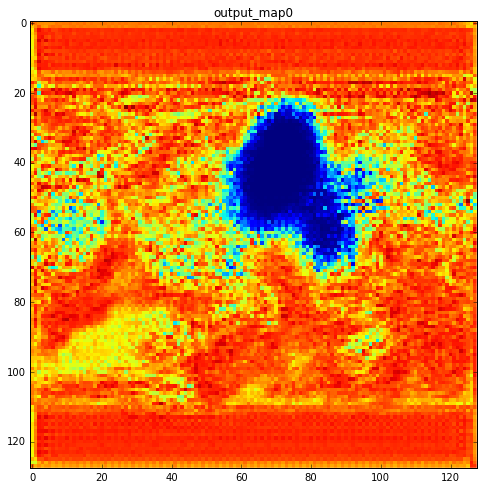

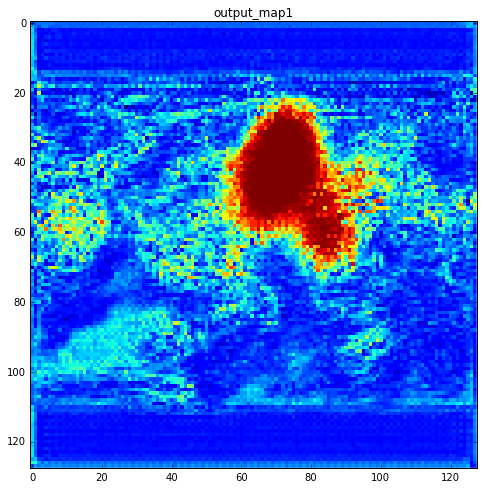

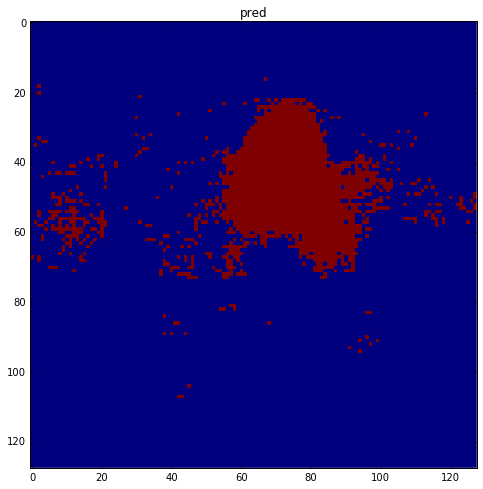

map0 max: 0.974716246128, map1 max: 0.999998867512, pred max: 1


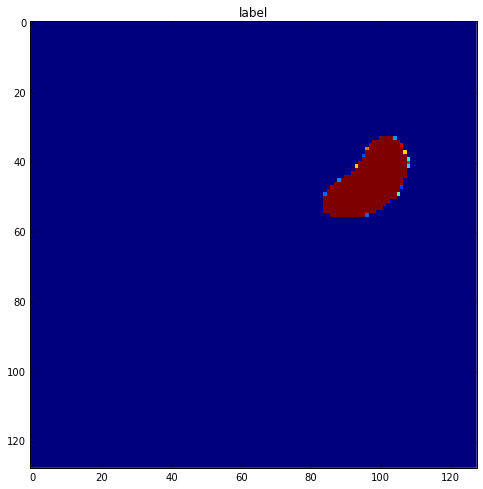

No label, skipping 38_24
No label, skipping 38_20
step: 705, loss: 0.00903224479407, dice: [ 0.18165749]
No label, skipping 16_88
No label, skipping 16_87
No label, skipping 16_86
step: 710, loss: 0.00518490560353, dice: [ 0.40057188]
No label, skipping 46_13
No label, skipping 46_12
No label, skipping 46_11
No label, skipping 46_17
No label, skipping 46_15
No label, skipping 46_14
No label, skipping 46_19
step: 715, loss: 0.016107885167, dice: [ 0.41678819]
No label, skipping 37_20
step: 720, loss: 0.00979250390083, dice: [ 0.2630313]
step: 725, loss: 0.00598536385223, dice: [ 0.19845118]
No label, skipping 15_2
No label, skipping 15_6
No label, skipping 15_5
step: 730, loss: 0.00566334743053, dice: [ 0.33042252]
No label, skipping 15_8
No label, skipping 3_26
No label, skipping 3_27
No label, skipping 3_21
No label, skipping 3_23
No label, skipping 3_28
step: 735, loss: 0.00636847596616, dice: [ 0.25074154]
No label, skipping 10_88
No label, skipping 10_82
No label, skipping 10_80
No

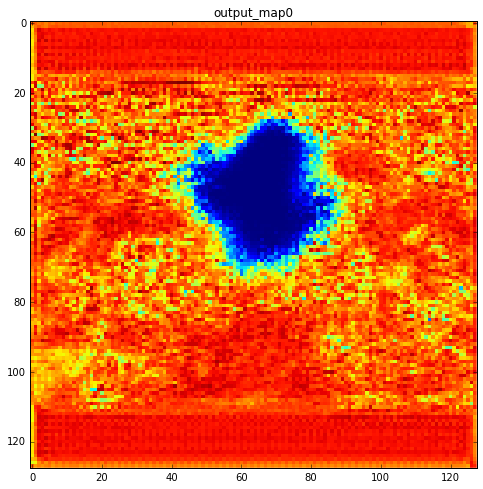

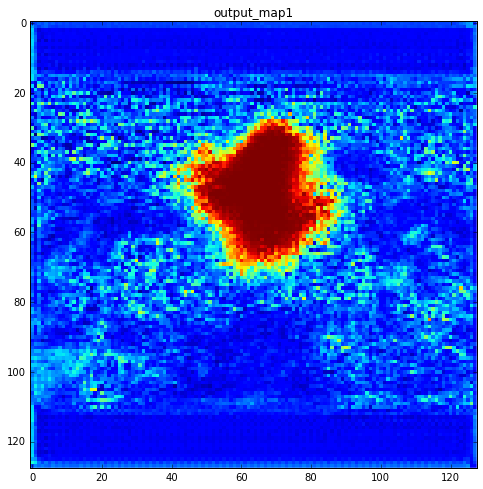

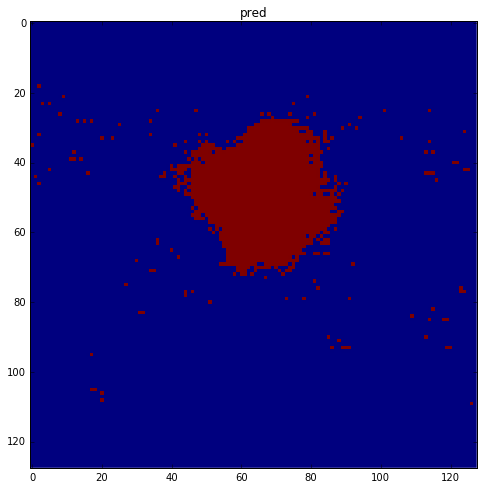

map0 max: 0.96281427145, map1 max: 0.99998986721, pred max: 1


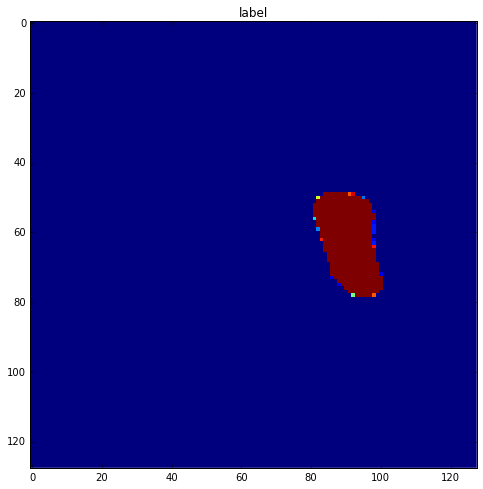

No label, skipping 31_33
No label, skipping 31_32
No label, skipping 31_31
No label, skipping 31_39
No label, skipping 22_113
No label, skipping 22_112
No label, skipping 4_87
No label, skipping 4_86
No label, skipping 4_85
No label, skipping 4_84
No label, skipping 4_83
No label, skipping 4_82
No label, skipping 4_80
No label, skipping 4_89
No label, skipping 4_88
No label, skipping 22_95
No label, skipping 22_94
No label, skipping 22_97
No label, skipping 22_96
No label, skipping 22_91
No label, skipping 22_90
No label, skipping 22_93
No label, skipping 22_99
No label, skipping 22_98
No label, skipping 19_99
No label, skipping 19_98
step: 805, loss: 0.00534456782043, dice: [ 0.35704178]
No label, skipping 19_92
No label, skipping 19_91
No label, skipping 19_94
step: 810, loss: 0.0126507105306, dice: [ 0.55838901]
No label, skipping 24_90
No label, skipping 24_97
step: 815, loss: 0.00674061803147, dice: [ 0.19938986]
No label, skipping 46_79
No label, skipping 46_78
No label, skipping

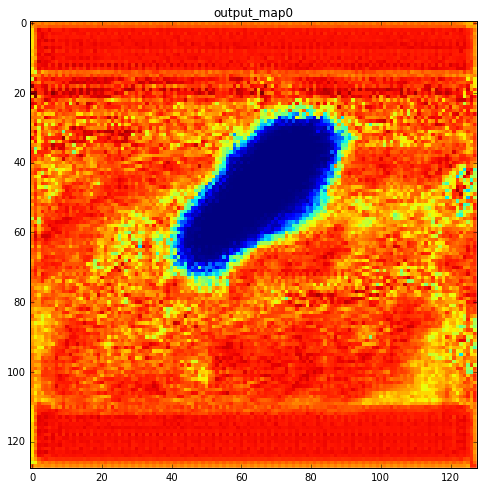

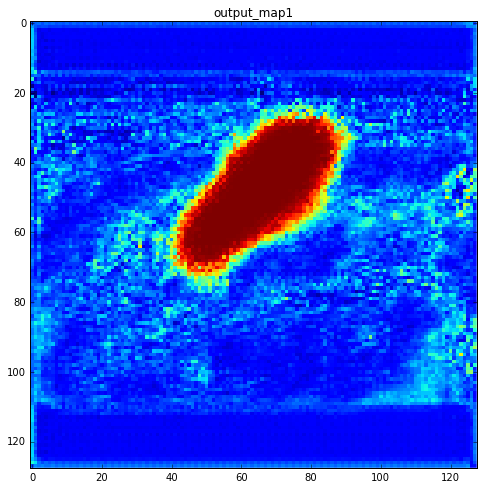

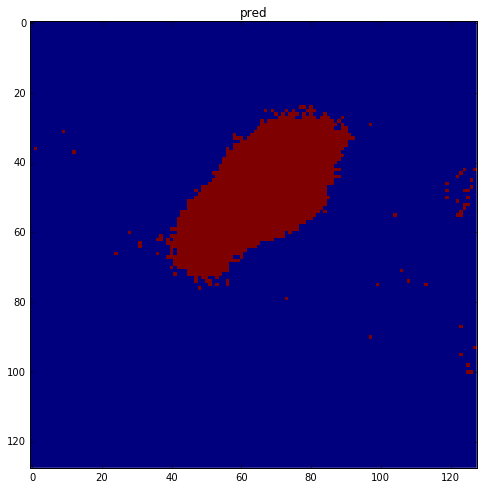

map0 max: 0.985579133034, map1 max: 0.999996483326, pred max: 1


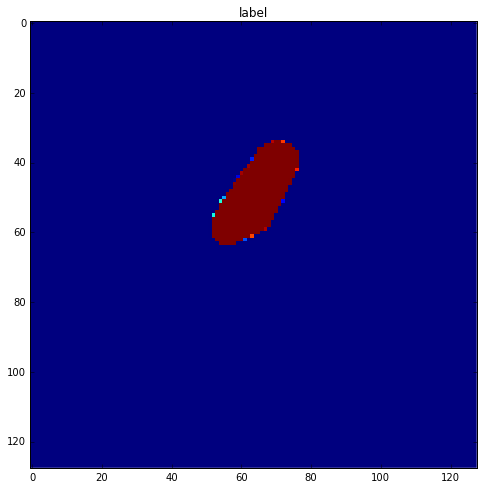

No label, skipping 35_4
No label, skipping 35_7
No label, skipping 1_94
No label, skipping 1_99
No label, skipping 1_98
step: 905, loss: 0.0226046722382, dice: [ 0.18355046]
No label, skipping 35_8
No label, skipping 34_18
No label, skipping 34_15
step: 910, loss: 0.00802900642157, dice: [ 0.38664651]
No label, skipping 3_68
No label, skipping 3_60
No label, skipping 3_61
No label, skipping 3_62
step: 915, loss: 0.0051056756638, dice: [ 0.42899787]
No label, skipping 3_65
No label, skipping 3_67
step: 920, loss: 0.00690391752869, dice: [ 0.25787956]
No label, skipping 46_52
No label, skipping 46_50
step: 925, loss: 0.00514748226851, dice: [ 0.30261034]
No label, skipping 46_59
No label, skipping 46_58
No label, skipping 24_109
No label, skipping 24_106
No label, skipping 24_100
No label, skipping 24_101
step: 930, loss: 0.0056443028152, dice: [ 0.40671912]
No label, skipping 8_82
No label, skipping 8_81
No label, skipping 3_2
No label, skipping 8_86
No label, skipping 3_7
step: 935, lo

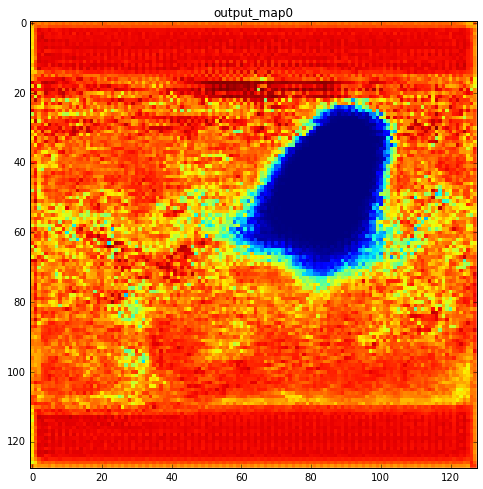

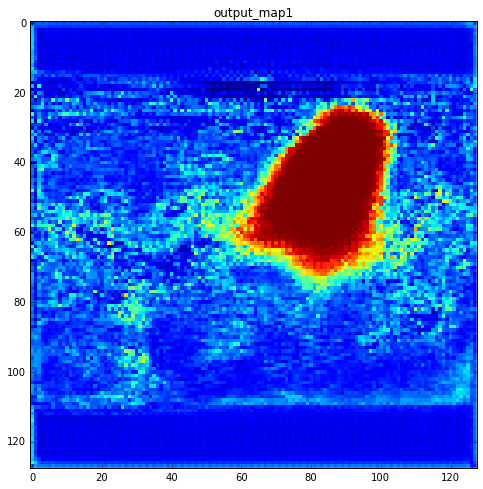

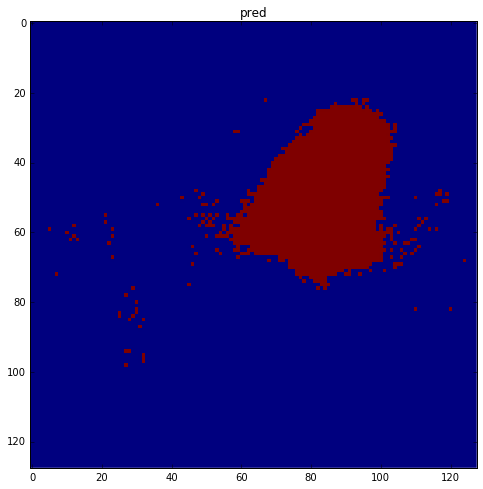

map0 max: 0.992071688175, map1 max: 1.0, pred max: 1


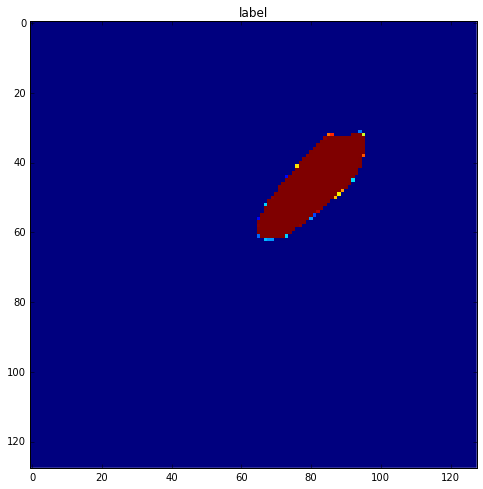

No label, skipping 29_69
No label, skipping 29_68
No label, skipping 27_1
No label, skipping 27_2
No label, skipping 27_3
No label, skipping 27_4
No label, skipping 27_5
No label, skipping 27_6
No label, skipping 27_7
No label, skipping 27_8
No label, skipping 27_9
step: 1005, loss: 0.00572199374437, dice: [ 0.36734194]
No label, skipping 20_56
No label, skipping 20_54
No label, skipping 20_59
step: 1010, loss: 0.00709844147786, dice: [ 0.31384772]
No label, skipping 38_81
No label, skipping 38_83
No label, skipping 38_82
No label, skipping 38_85
No label, skipping 38_84
No label, skipping 38_86
No label, skipping 38_89
No label, skipping 38_88
No label, skipping 21_86
No label, skipping 21_84
No label, skipping 21_83
step: 1015, loss: 0.00456921570003, dice: [ 0.35727483]
No label, skipping 21_80
No label, skipping 21_89
No label, skipping 21_88
step: 1020, loss: 0.00471592741087, dice: [ 0.31677344]
No label, skipping 34_30
No label, skipping 34_38
step: 1025, loss: 0.00573558313772,

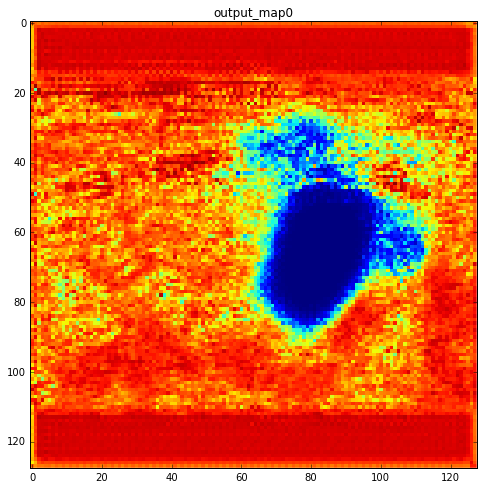

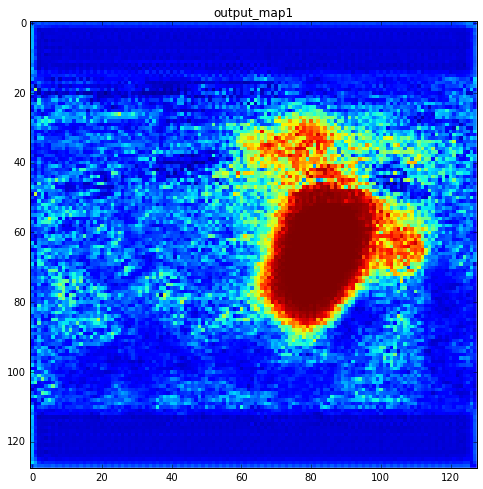

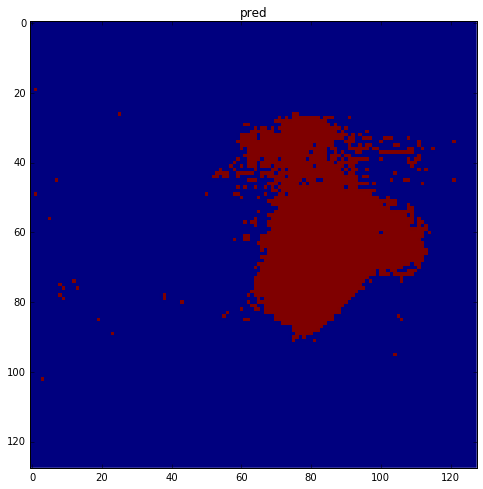

map0 max: 0.983053922653, map1 max: 1.0, pred max: 1


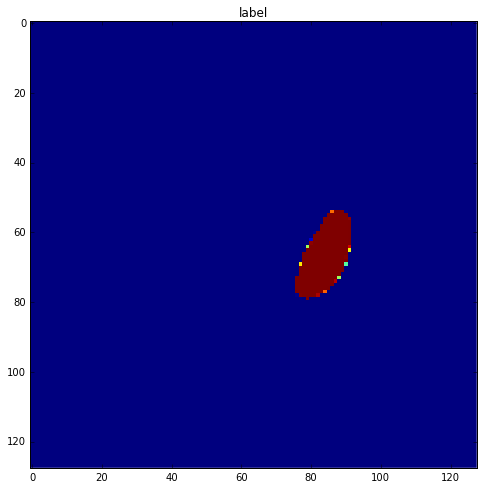

No label, skipping 13_72
No label, skipping 13_70
No label, skipping 13_77
No label, skipping 13_75
No label, skipping 33_99
No label, skipping 33_98
No label, skipping 33_93
No label, skipping 33_92
No label, skipping 33_91
No label, skipping 33_90
No label, skipping 33_97
No label, skipping 33_96
No label, skipping 33_95
No label, skipping 33_94
step: 1105, loss: 0.00501340068877, dice: [ 0.46543762]
No label, skipping 31_93
No label, skipping 31_92
No label, skipping 31_95
No label, skipping 31_94
No label, skipping 31_97
No label, skipping 31_99
No label, skipping 31_98
No label, skipping 38_1
step: 1110, loss: 0.0043664672412, dice: [ 0.25714812]
No label, skipping 30_110
No label, skipping 30_111
No label, skipping 29_43
No label, skipping 29_41
No label, skipping 29_47
step: 1115, loss: 0.00578403286636, dice: [ 0.46736786]
No label, skipping 29_45
No label, skipping 29_44
No label, skipping 29_48
No label, skipping 20_39
No label, skipping 20_31
No label, skipping 20_32
No labe

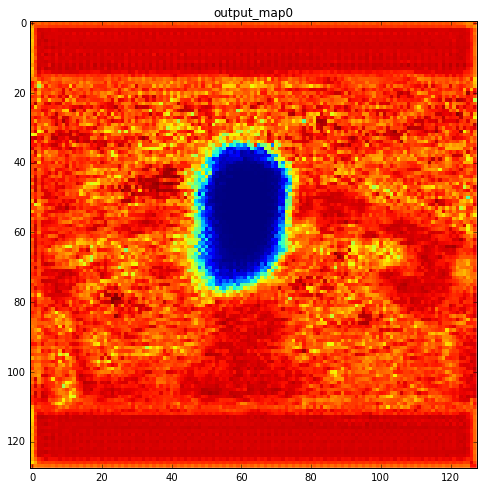

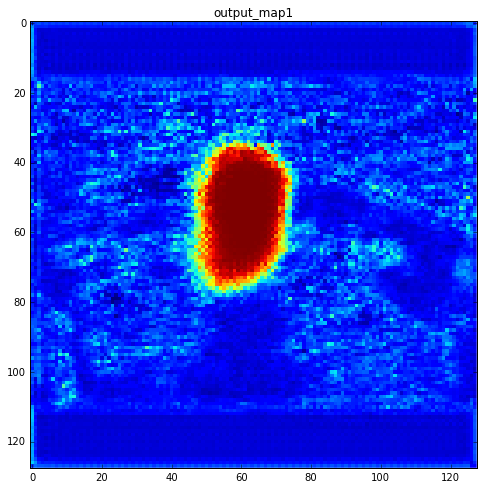

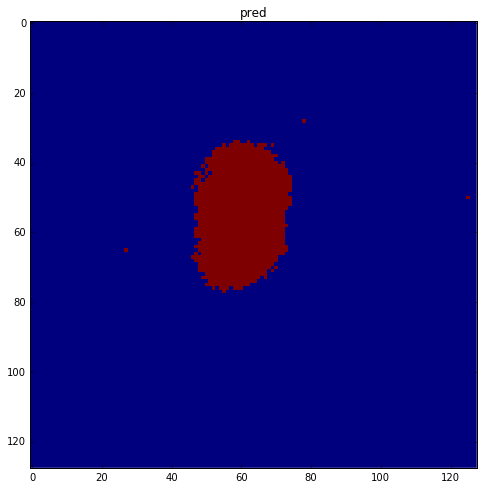

map0 max: 0.979298293591, map1 max: 0.999996185303, pred max: 1


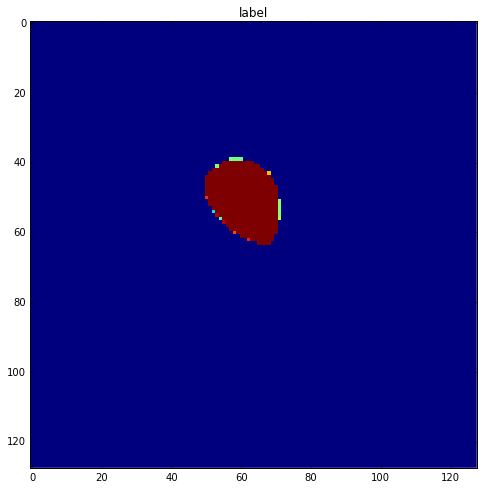

No label, skipping 16_106
step: 1205, loss: 0.0036078481935, dice: [ 0.64092714]
No label, skipping 35_6
No label, skipping 1_97
No label, skipping 1_95
No label, skipping 11_19
step: 1210, loss: 0.0041561643593, dice: [ 0.43065155]
No label, skipping 11_15
step: 1215, loss: 0.0040728347376, dice: [ 0.54260647]
No label, skipping 43_2
No label, skipping 43_1
No label, skipping 43_6
No label, skipping 43_5
step: 1220, loss: 0.00704578636214, dice: [ 0.77391934]
No label, skipping 13_10
step: 1225, loss: 0.00304378150031, dice: [ 0.61956048]
No label, skipping 13_17
No label, skipping 13_19
No label, skipping 29_28
step: 1230, loss: 0.00983414519578, dice: [ 0.1994089]
No label, skipping 29_24
No label, skipping 29_26
step: 1235, loss: 0.00481908069924, dice: [ 0.37603202]
No label, skipping 20_16
No label, skipping 20_12
No label, skipping 20_11
step: 1240, loss: 0.00325208948925, dice: [ 0.54868406]
No label, skipping 20_18
No label, skipping 22_18
No label, skipping 22_15
No label, sk

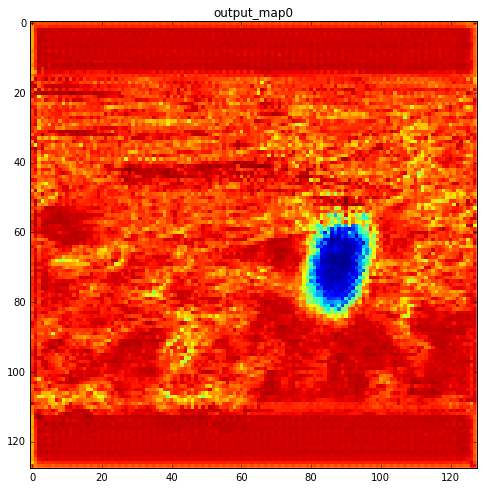

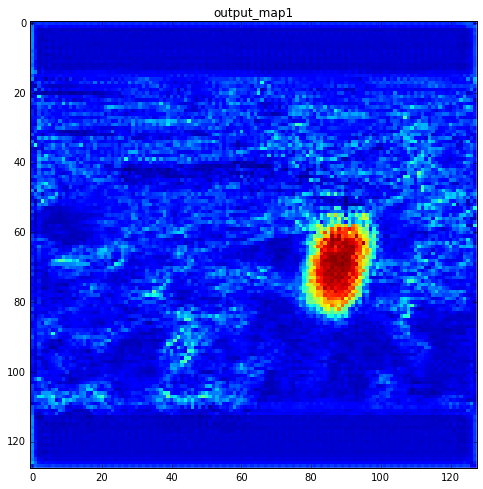

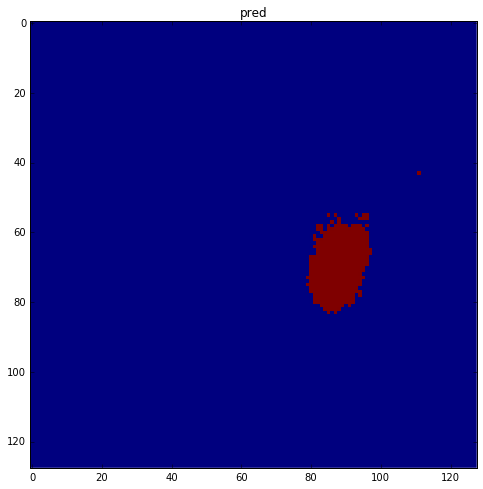

map0 max: 0.975572943687, map1 max: 0.994746446609, pred max: 1


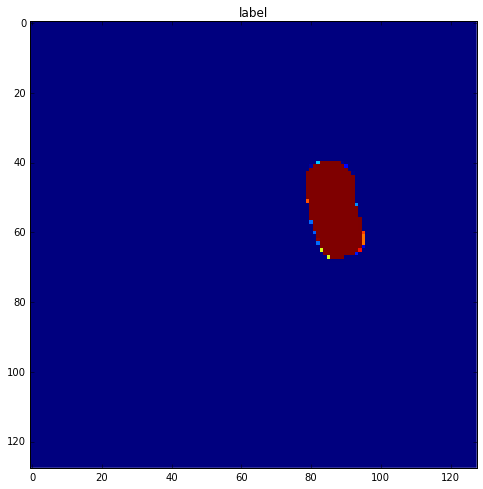

No label, skipping 13_34
No label, skipping 13_32
No label, skipping 13_30
No label, skipping 46_57
No label, skipping 46_55
No label, skipping 46_54
No label, skipping 46_53
step: 1305, loss: 0.00821611471474, dice: [ 0.80644548]
No label, skipping 32_13
No label, skipping 6_67
No label, skipping 6_66
No label, skipping 6_65
No label, skipping 6_64
No label, skipping 6_63
No label, skipping 6_62
No label, skipping 6_61
No label, skipping 6_60
No label, skipping 6_69
No label, skipping 6_68
No label, skipping 32_9
No label, skipping 32_4
No label, skipping 32_5
step: 1310, loss: 0.00438357051462, dice: [ 0.4759883]
No label, skipping 4_24
No label, skipping 4_21
step: 1315, loss: 0.00416927412152, dice: [ 0.58271772]
No label, skipping 4_22
No label, skipping 22_39
No label, skipping 22_38
No label, skipping 22_33
No label, skipping 22_32
No label, skipping 22_31
No label, skipping 22_30
No label, skipping 22_37
No label, skipping 22_35
No label, skipping 22_34
No label, skipping 21_21

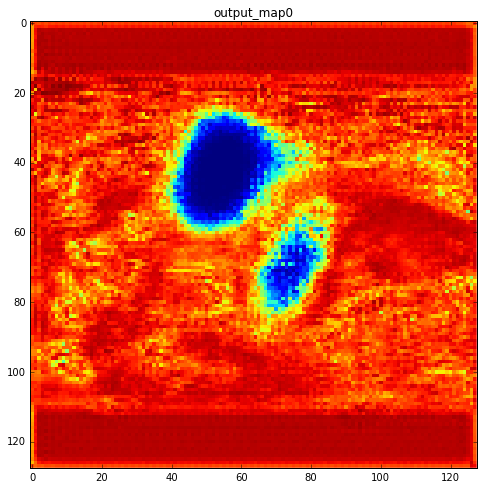

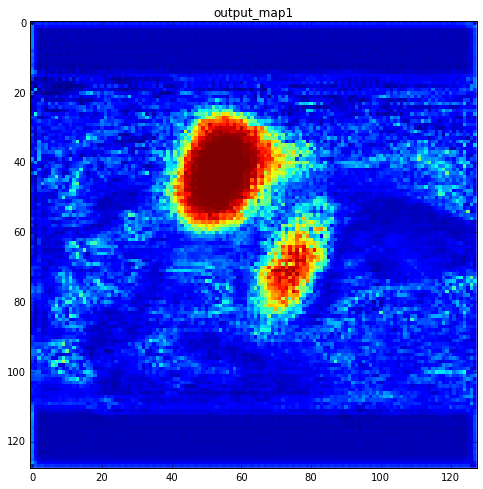

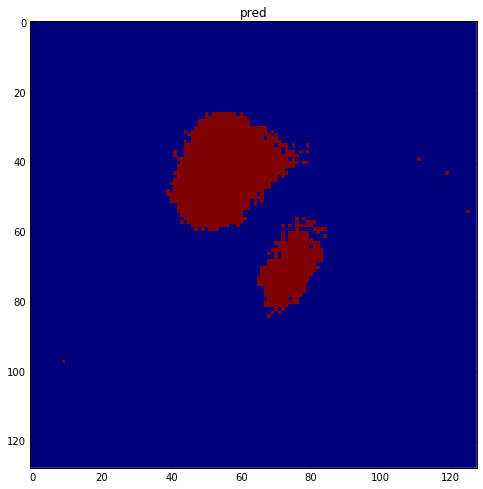

map0 max: 0.970979034901, map1 max: 0.999973475933, pred max: 1


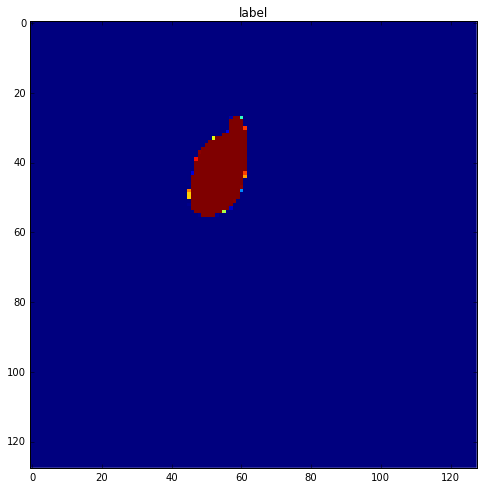

No label, skipping 34_116
No label, skipping 34_117
No label, skipping 22_51
No label, skipping 22_53
No label, skipping 22_52
No label, skipping 22_55
No label, skipping 22_54
No label, skipping 22_57
No label, skipping 22_56
No label, skipping 22_59
No label, skipping 22_58
No label, skipping 24_59
No label, skipping 24_57
No label, skipping 24_55
No label, skipping 24_53
step: 1405, loss: 0.0039867660962, dice: [ 0.35436764]
No label, skipping 13_1
step: 1410, loss: 0.00332079455256, dice: [ 0.49055326]
No label, skipping 13_4
No label, skipping 13_6
step: 1415, loss: 0.00709229987115, dice: [ 0.61350411]
No label, skipping 35_31
No label, skipping 35_30
No label, skipping 35_35
step: 1420, loss: 0.00561043992639, dice: [ 0.48600182]
No label, skipping 36_28
No label, skipping 36_20
No label, skipping 36_23
No label, skipping 36_25
step: 1425, loss: 0.00508802384138, dice: [ 0.45263636]
No label, skipping 36_27
No label, skipping 36_26
No label, skipping 17_48
No label, skipping 5_5

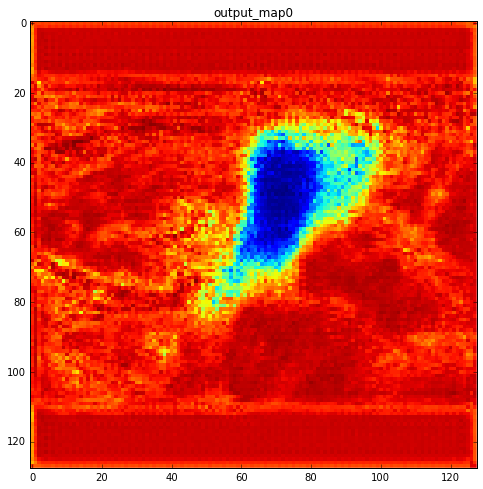

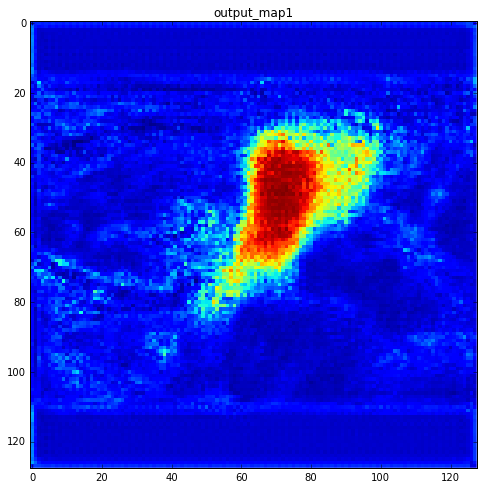

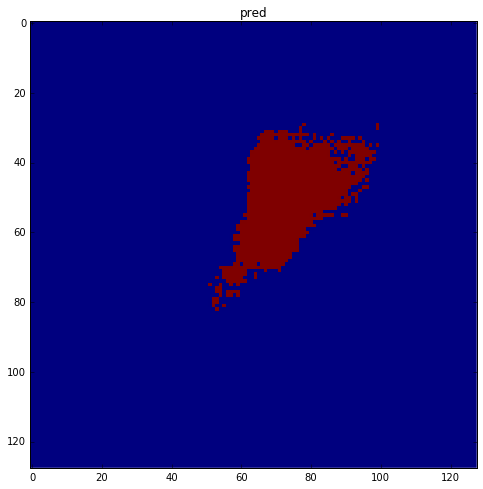

map0 max: 0.977836370468, map1 max: 0.996286511421, pred max: 1


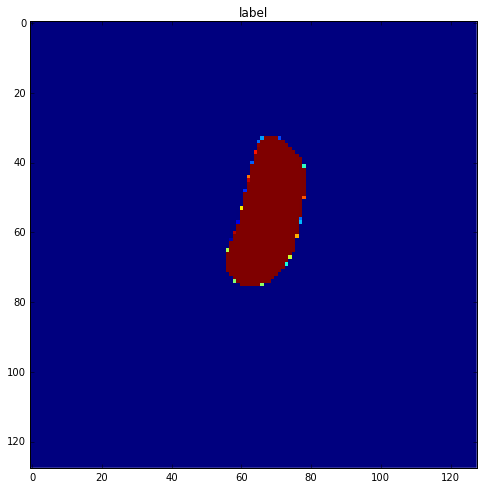

No label, skipping 46_44
No label, skipping 32_67
No label, skipping 46_47
No label, skipping 32_69
No label, skipping 32_68
No label, skipping 46_104
No label, skipping 46_105
No label, skipping 46_106
No label, skipping 46_107
No label, skipping 46_100
No label, skipping 46_101
No label, skipping 46_102
No label, skipping 46_103
No label, skipping 46_108
No label, skipping 46_109
No label, skipping 3_108
step: 1505, loss: 0.00781058287248, dice: [ 0.6082769]
No label, skipping 3_107
No label, skipping 3_104
No label, skipping 3_102
No label, skipping 3_100
No label, skipping 3_101
No label, skipping 20_97
No label, skipping 20_96
No label, skipping 20_95
step: 1510, loss: 0.00556818442419, dice: [ 0.22796716]
No label, skipping 20_91
No label, skipping 12_57
No label, skipping 12_54
step: 1515, loss: 0.00492243422195, dice: [ 0.48022494]
No label, skipping 12_50
No label, skipping 12_51
No label, skipping 12_58
No label, skipping 12_59
No label, skipping 25_34
step: 1520, loss: 0.006

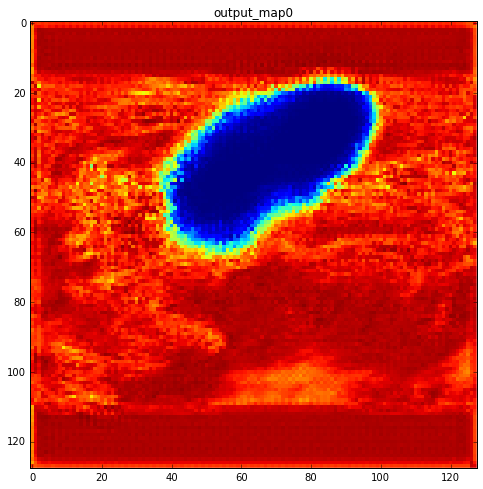

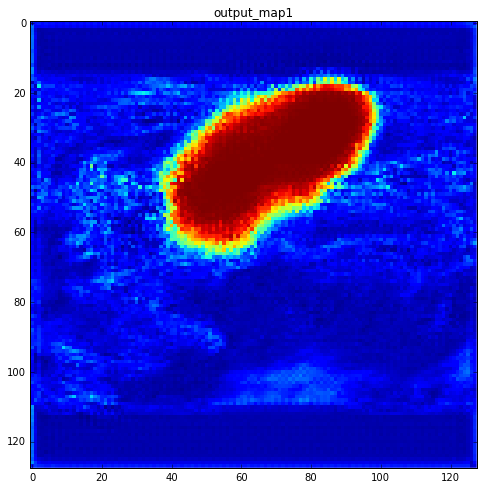

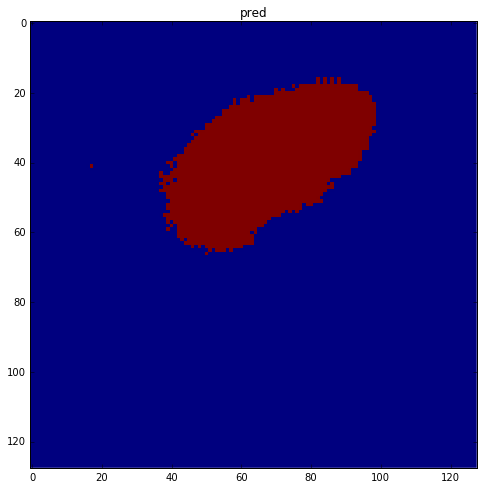

map0 max: 0.966617643833, map1 max: 0.999994575977, pred max: 1


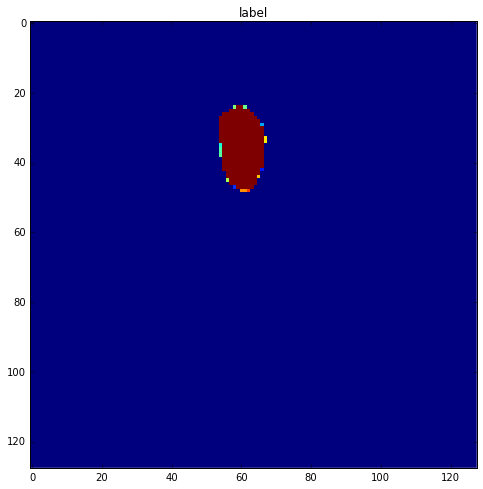

No label, skipping 17_70
No label, skipping 10_113
No label, skipping 10_6
No label, skipping 10_5
step: 1605, loss: 0.00500535033643, dice: [ 0.25646439]
step: 1610, loss: 0.00521821947768, dice: [ 0.38143679]
No label, skipping 28_95
No label, skipping 28_94
No label, skipping 28_93
No label, skipping 28_92
No label, skipping 28_90
No label, skipping 28_99
No label, skipping 19_113
No label, skipping 19_112
No label, skipping 19_111
No label, skipping 19_110
No label, skipping 19_117
No label, skipping 19_115
No label, skipping 33_18
No label, skipping 19_118
No label, skipping 4_120
step: 1615, loss: 0.00392044568434, dice: [ 0.54675359]
No label, skipping 1_63
No label, skipping 1_60
No label, skipping 19_25
No label, skipping 19_20
No label, skipping 1_65
No label, skipping 1_68
No label, skipping 1_69
No label, skipping 40_59
step: 1620, loss: 0.00571603886783, dice: [ 0.22031946]
No label, skipping 8_4
No label, skipping 8_5
No label, skipping 8_2
No label, skipping 8_3
No label

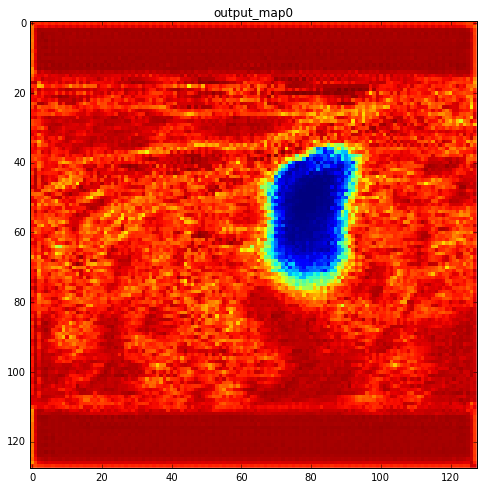

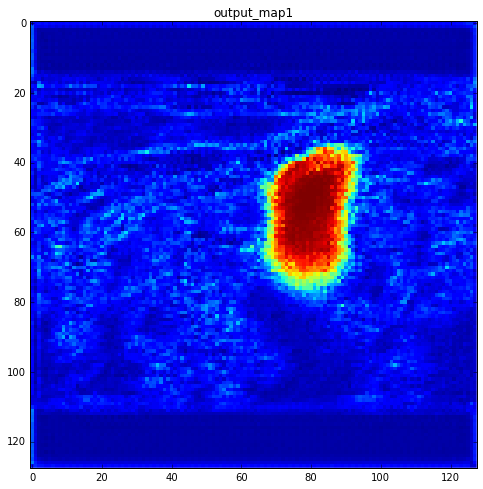

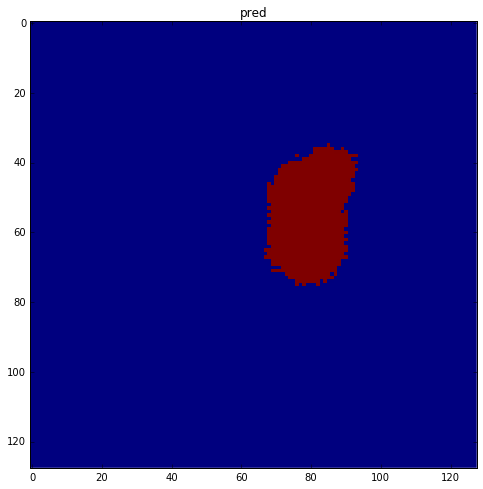

map0 max: 0.975724339485, map1 max: 0.99837654829, pred max: 1


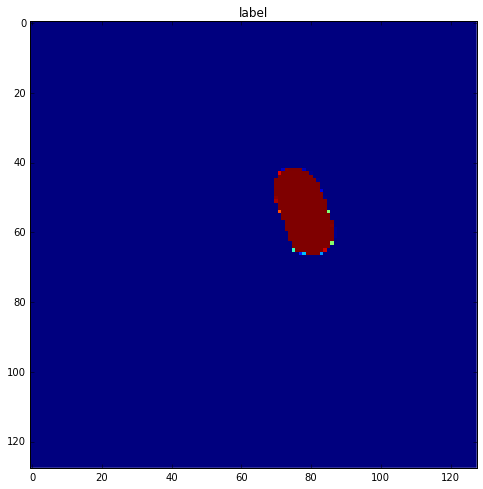

No label, skipping 28_110
No label, skipping 37_70
No label, skipping 37_72
step: 1705, loss: 0.00515383807942, dice: [ 0.29571262]
No label, skipping 12_30
No label, skipping 12_31
No label, skipping 12_32
No label, skipping 12_34
No label, skipping 12_35
No label, skipping 12_36
No label, skipping 12_37
No label, skipping 12_38
No label, skipping 12_39
No label, skipping 8_19
No label, skipping 8_11
No label, skipping 8_12
No label, skipping 8_13
No label, skipping 8_14
No label, skipping 8_15
step: 1710, loss: 0.0195795577019, dice: [ 0.01573293]
No label, skipping 8_17
No label, skipping 8_101
No label, skipping 8_100
No label, skipping 8_103
No label, skipping 8_105
No label, skipping 8_107
No label, skipping 8_106
No label, skipping 8_109
No label, skipping 8_108
No label, skipping 35_96
No label, skipping 18_28
No label, skipping 18_25
No label, skipping 18_27
No label, skipping 18_26
step: 1715, loss: 0.0226826108992, dice: [ 0.00494877]
No label, skipping 18_20
No label, skipp

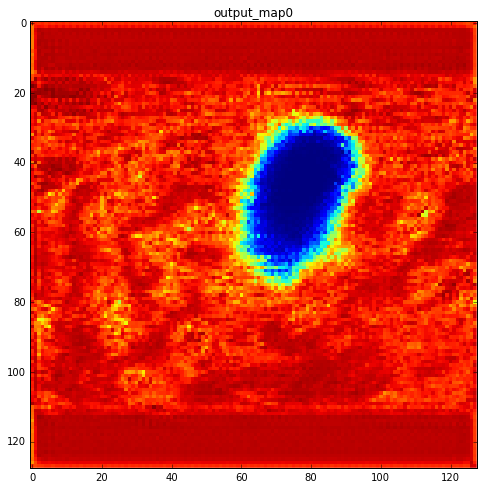

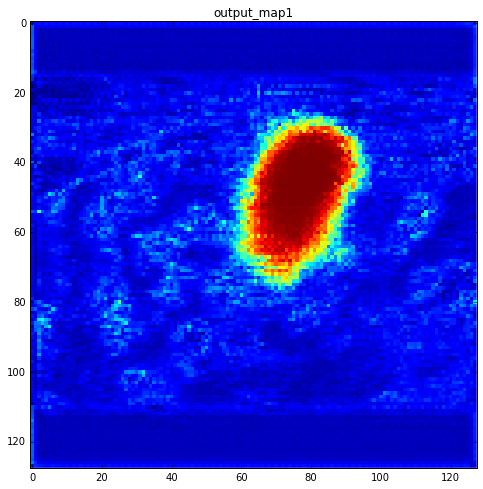

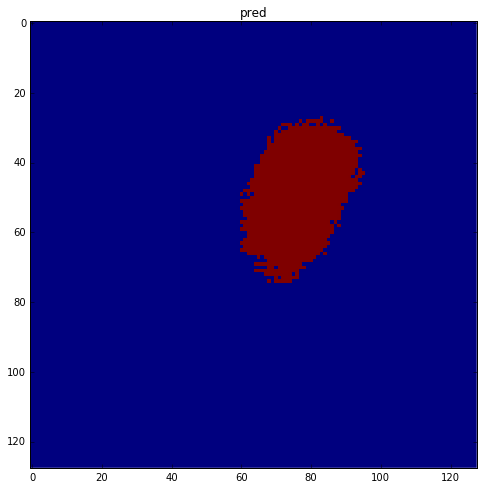

map0 max: 0.985053658485, map1 max: 0.999842822552, pred max: 1


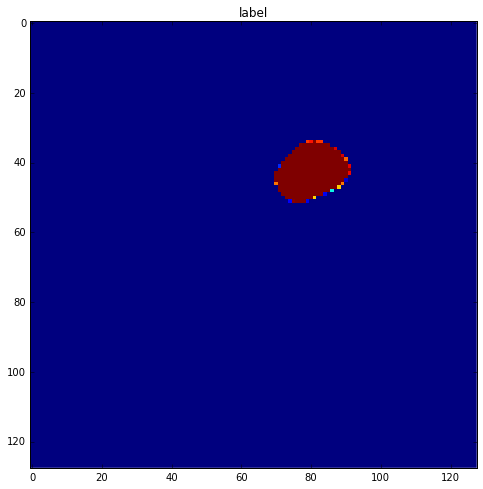

No label, skipping 34_3
No label, skipping 8_36
No label, skipping 8_37
No label, skipping 8_35
No label, skipping 8_32
No label, skipping 8_33
step: 1805, loss: 0.00420084083453, dice: [ 0.50698572]
No label, skipping 8_39
No label, skipping 23_16
step: 1810, loss: 0.00587774720043, dice: [ 0.29445341]
No label, skipping 23_12
step: 1815, loss: 0.00283548771404, dice: [ 0.52951801]
No label, skipping 25_19
No label, skipping 25_15
step: 1820, loss: 0.00256137922406, dice: [ 0.4656212]
No label, skipping 25_12
No label, skipping 42_95
step: 1825, loss: 0.00316903553903, dice: [ 0.42745882]
No label, skipping 17_118
No label, skipping 17_115
No label, skipping 17_114
No label, skipping 17_117
No label, skipping 17_116
No label, skipping 17_111
No label, skipping 17_110
No label, skipping 42_98
step: 1830, loss: 0.00272712018341, dice: [ 0.58864355]
No label, skipping 26_103
No label, skipping 26_100
No label, skipping 26_101
No label, skipping 26_106
No label, skipping 26_107
step: 1835

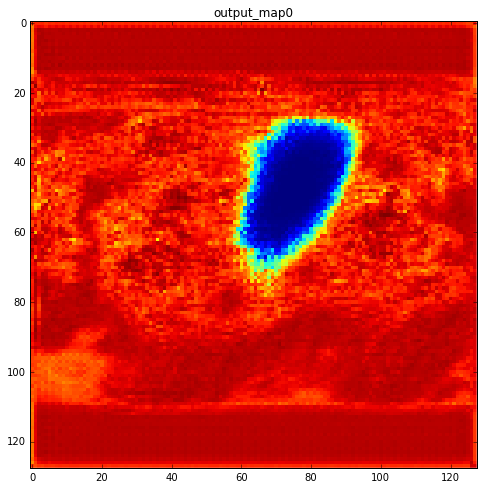

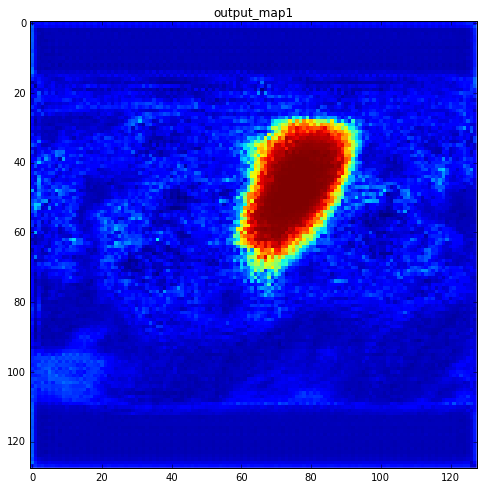

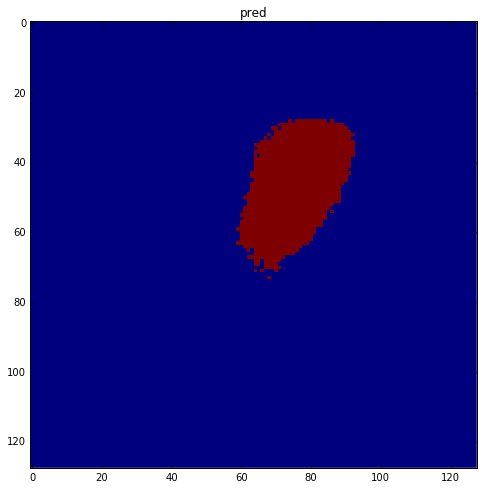

map0 max: 0.986738920212, map1 max: 0.999832212925, pred max: 1


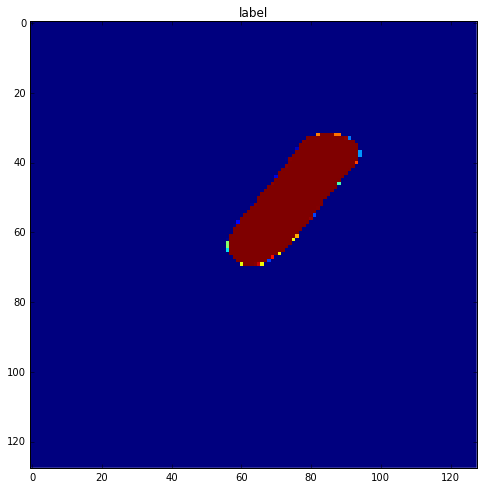

No label, skipping 44_68
No label, skipping 44_64
step: 1905, loss: 0.00380902620964, dice: [ 0.3562097]
No label, skipping 44_61
No label, skipping 14_101
No label, skipping 39_99
No label, skipping 14_102
No label, skipping 14_105
No label, skipping 14_104
No label, skipping 14_107
No label, skipping 39_98
step: 1910, loss: 0.0068938289769, dice: [ 0.70112443]
No label, skipping 18_61
No label, skipping 18_60
No label, skipping 18_63
No label, skipping 18_62
No label, skipping 18_65
No label, skipping 18_64
No label, skipping 18_67
No label, skipping 18_66
No label, skipping 18_69
No label, skipping 18_68
step: 1915, loss: 0.00276846718043, dice: [ 0.37252995]
No label, skipping 39_93
No label, skipping 23_33
No label, skipping 47_79
step: 1920, loss: 0.00265858252533, dice: [ 0.42390218]
No label, skipping 25_72
No label, skipping 25_70
No label, skipping 25_71
No label, skipping 25_76
No label, skipping 25_77
No label, skipping 25_74
step: 1925, loss: 0.00390220293775, dice: [ 0.44

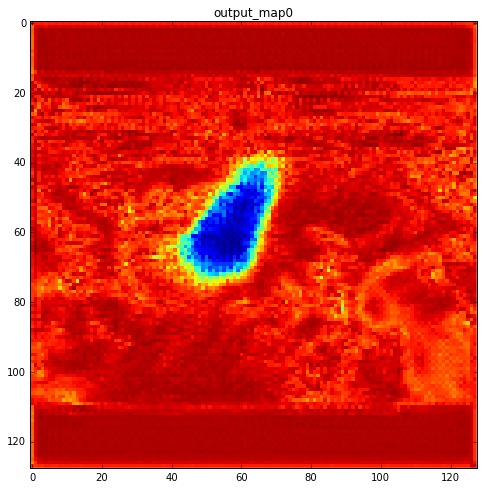

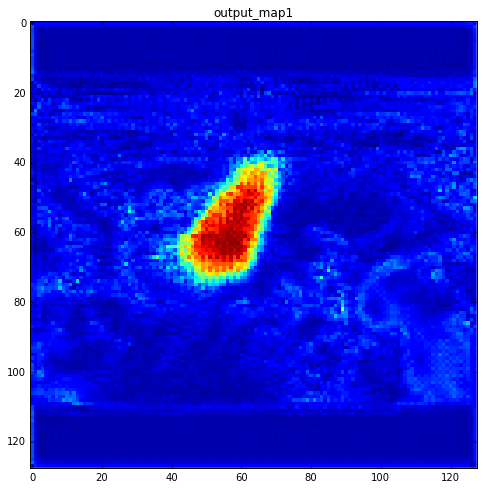

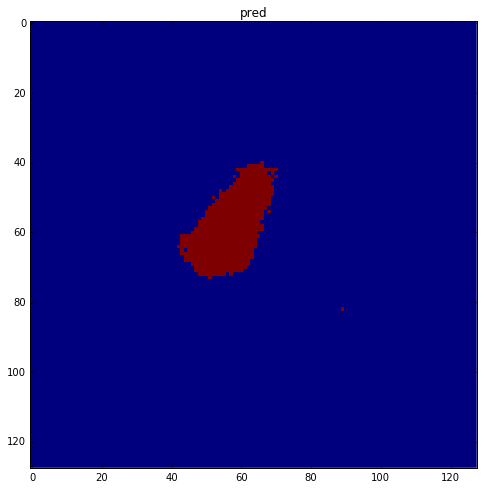

map0 max: 0.984017252922, map1 max: 0.977817833424, pred max: 1


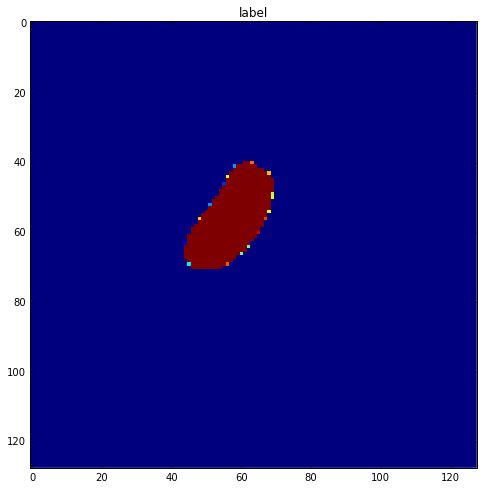

No label, skipping 10_99
No label, skipping 12_92
No label, skipping 12_93
No label, skipping 12_90
No label, skipping 12_91
No label, skipping 12_96
No label, skipping 12_97
No label, skipping 12_94
No label, skipping 12_95
No label, skipping 12_99
No label, skipping 44_101
No label, skipping 44_106
No label, skipping 44_107
step: 2005, loss: 0.00521326484159, dice: [ 0.30415335]
No label, skipping 44_105
No label, skipping 44_109
No label, skipping 35_116
No label, skipping 35_111
No label, skipping 35_110
step: 2010, loss: 0.00406014220789, dice: [ 0.48880929]
No label, skipping 35_119
No label, skipping 14_120
No label, skipping 18_49
No label, skipping 18_47
No label, skipping 39_120
step: 2015, loss: 0.00331218889914, dice: [ 0.53685945]
No label, skipping 18_43
No label, skipping 18_42
No label, skipping 23_59
step: 2020, loss: 0.00289520947263, dice: [ 0.45591217]
No label, skipping 23_56
No label, skipping 23_54
No label, skipping 42_92
No label, skipping 47_29
No label, skipp

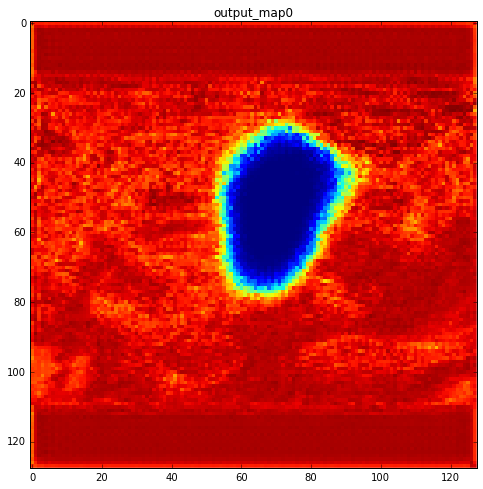

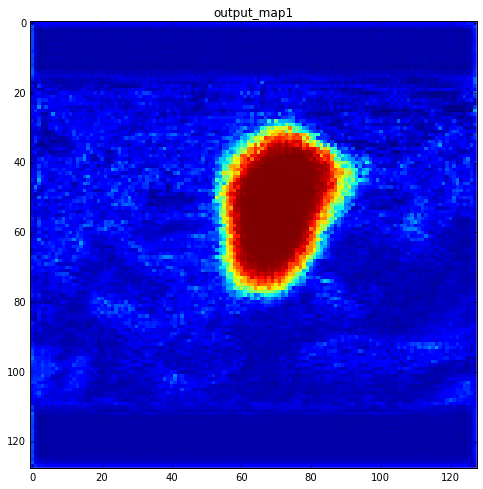

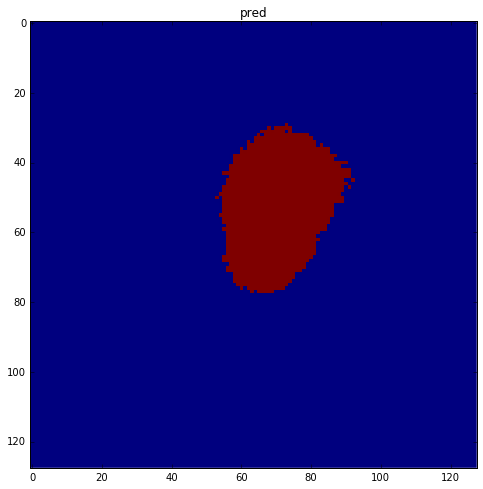

map0 max: 0.982409834862, map1 max: 0.999995648861, pred max: 1


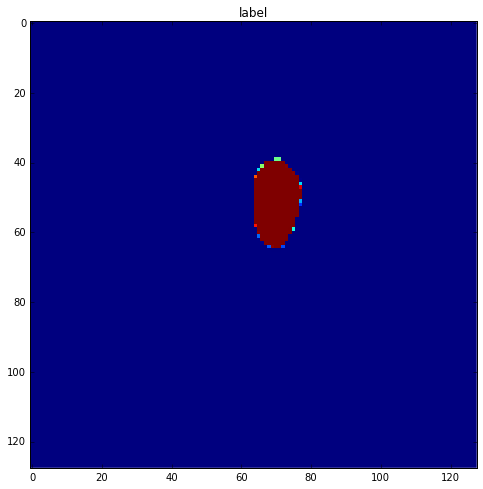

No label, skipping 26_87
No label, skipping 26_85
No label, skipping 44_23
step: 2105, loss: 0.00258043827489, dice: [ 0.48070404]
No label, skipping 44_26
No label, skipping 44_29
No label, skipping 30_8
No label, skipping 30_9
step: 2110, loss: 0.006586314179, dice: [ 0.63255709]
No label, skipping 30_6
No label, skipping 30_7
No label, skipping 8_90
No label, skipping 8_91
No label, skipping 8_92
No label, skipping 8_93
No label, skipping 8_94
No label, skipping 8_95
No label, skipping 8_96
No label, skipping 8_97
No label, skipping 8_98
No label, skipping 8_99
No label, skipping 30_114
step: 2115, loss: 0.00413596071303, dice: [ 0.20577481]
No label, skipping 30_116
No label, skipping 30_117
No label, skipping 38_4
No label, skipping 30_112
No label, skipping 30_113
No label, skipping 30_118
No label, skipping 30_119
No label, skipping 23_70
No label, skipping 23_71
step: 2120, loss: 0.00312528666109, dice: [ 0.46801314]
No label, skipping 23_76
step: 2125, loss: 0.00242188293487, 

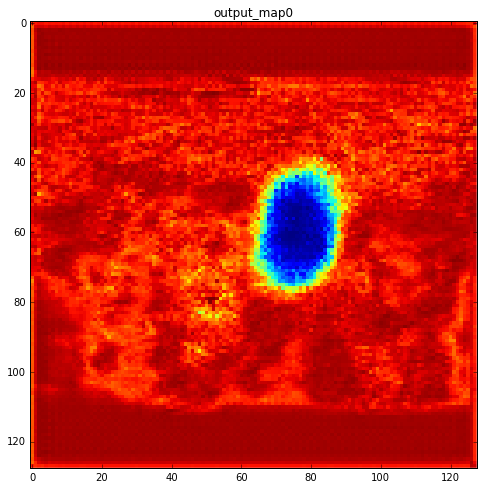

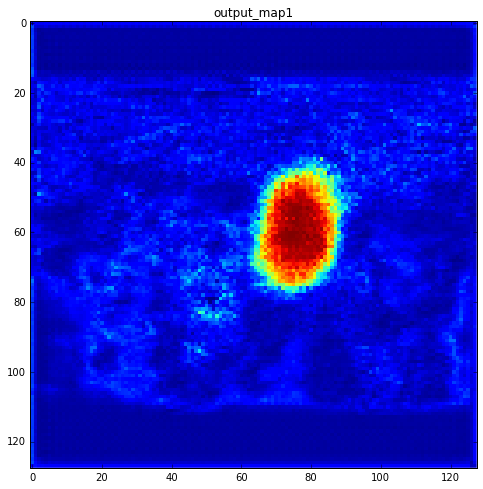

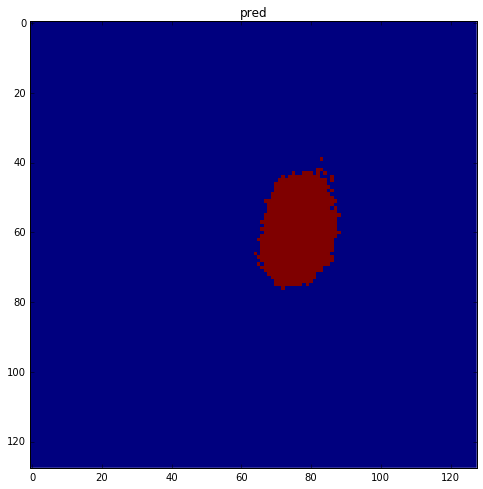

map0 max: 0.970992803574, map1 max: 0.994652152061, pred max: 1


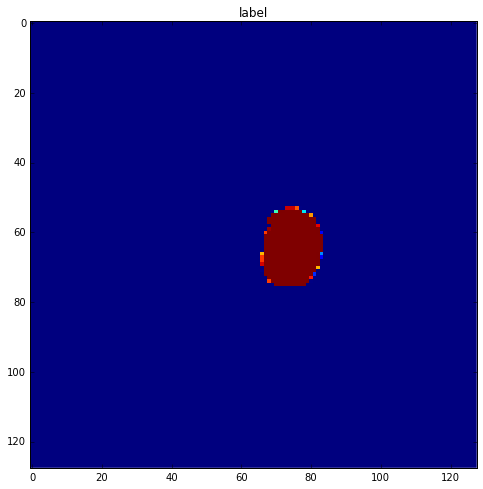

step: 2205, loss: 0.00243861693889, dice: [ 0.51918495]
step: 2210, loss: 0.00289302598685, dice: [ 0.52382094]
No label, skipping 21_112
No label, skipping 21_113
No label, skipping 21_110
No label, skipping 21_111
No label, skipping 21_116
No label, skipping 21_117
No label, skipping 21_114
No label, skipping 21_115
No label, skipping 21_119
No label, skipping 25_94
No label, skipping 25_95
No label, skipping 15_48
No label, skipping 25_91
No label, skipping 25_92
No label, skipping 25_93
No label, skipping 15_44
No label, skipping 15_46
No label, skipping 15_47
No label, skipping 25_98
No label, skipping 25_99
step: 2215, loss: 0.00569659331813, dice: [ 0.32631436]
No label, skipping 47_61
No label, skipping 47_60
No label, skipping 47_63
No label, skipping 47_62
No label, skipping 47_65
No label, skipping 47_64
No label, skipping 47_67
No label, skipping 47_66
No label, skipping 47_69
No label, skipping 47_68
No label, skipping 14_54
No label, skipping 14_55
No label, skipping 27_9

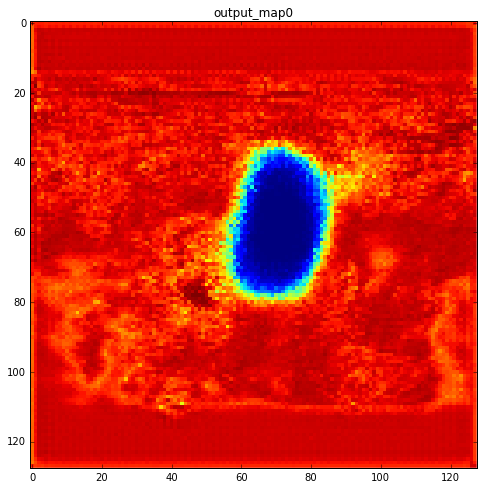

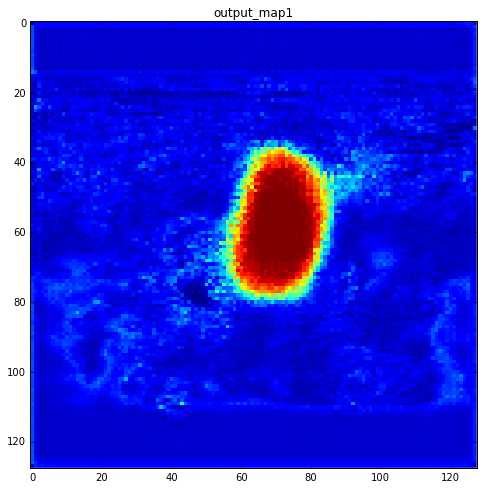

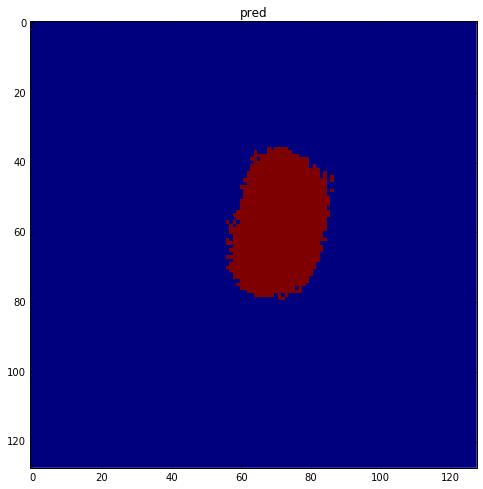

map0 max: 0.996516406536, map1 max: 0.999868392944, pred max: 1


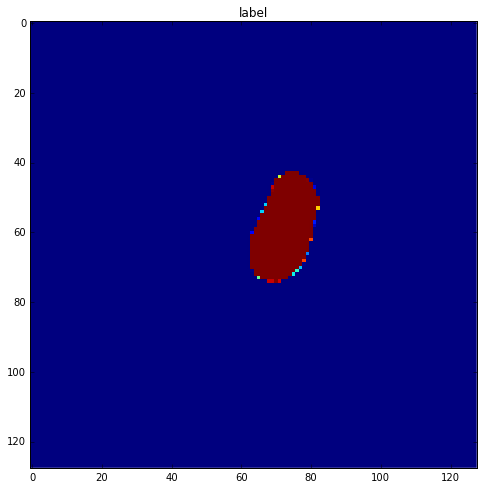

No label, skipping 39_85
No label, skipping 14_33
No label, skipping 14_30
No label, skipping 14_31
No label, skipping 14_36
No label, skipping 14_37
No label, skipping 14_34
No label, skipping 14_35
step: 2305, loss: 0.00545890117064, dice: [ 0.34618822]
No label, skipping 31_120
No label, skipping 29_108
No label, skipping 29_100
No label, skipping 29_103
No label, skipping 29_105
No label, skipping 29_104
step: 2310, loss: 0.00324460980482, dice: [ 0.36128041]
No label, skipping 25_115
No label, skipping 16_110
No label, skipping 16_111
No label, skipping 16_112
No label, skipping 16_113
No label, skipping 16_115
No label, skipping 16_118
No label, skipping 16_119
No label, skipping 15_80
No label, skipping 12_115
step: 2315, loss: 0.0030869205948, dice: [ 0.42042097]
No label, skipping 11_25
step: 2320, loss: 0.00249870866537, dice: [ 0.45597348]
No label, skipping 12_117
No label, skipping 2_15
No label, skipping 12_110
No label, skipping 12_111
No label, skipping 13_66
No label, 

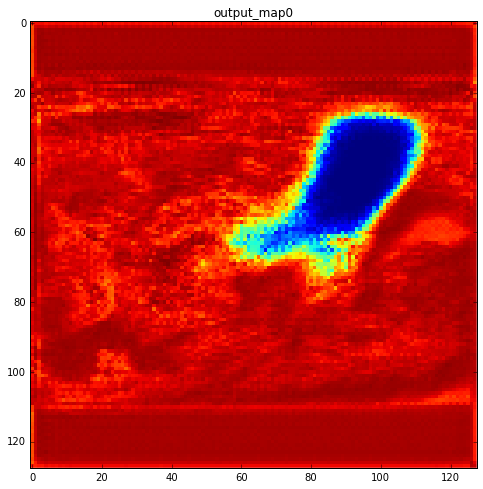

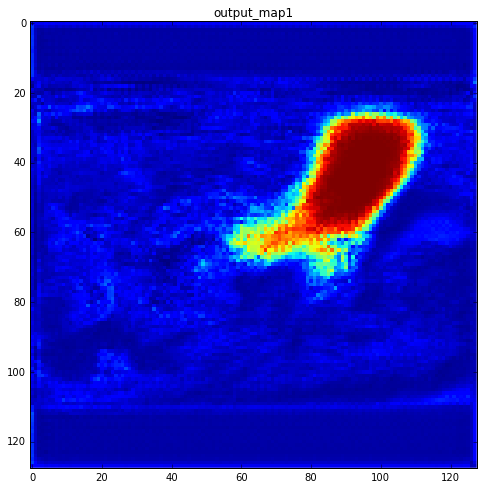

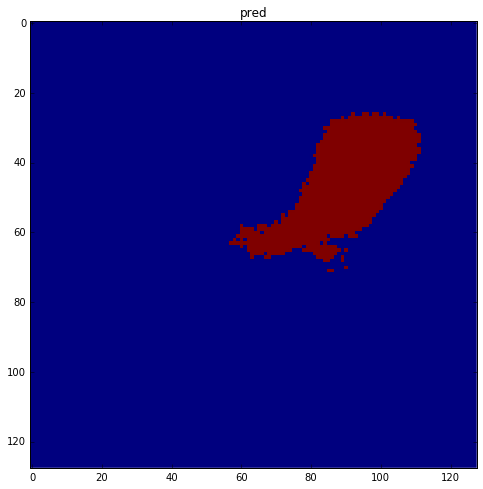

map0 max: 0.982061505318, map1 max: 0.999953627586, pred max: 1


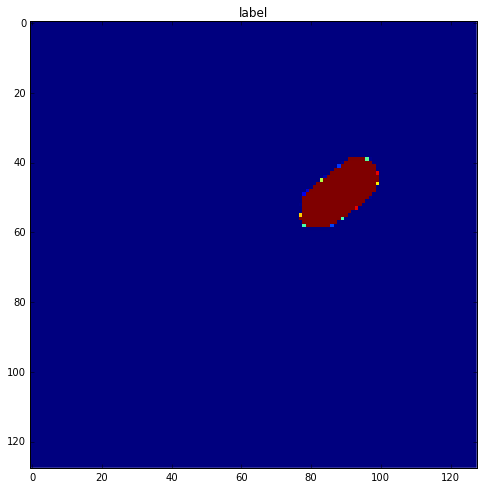

No label, skipping 29_30
No label, skipping 29_31
No label, skipping 29_36
No label, skipping 4_38
No label, skipping 4_32
No label, skipping 4_33
No label, skipping 4_30
step: 2405, loss: 0.00265177688561, dice: [ 0.54076844]
No label, skipping 4_36
No label, skipping 4_37
No label, skipping 4_34
No label, skipping 21_54
No label, skipping 21_55
No label, skipping 21_57
No label, skipping 21_50
No label, skipping 21_51
No label, skipping 21_53
No label, skipping 21_58
No label, skipping 21_59
No label, skipping 31_3
No label, skipping 31_2
No label, skipping 31_5
step: 2410, loss: 0.01828934066, dice: [ 0.5450598]
No label, skipping 31_7
No label, skipping 31_6
No label, skipping 31_9
No label, skipping 31_8
No label, skipping 3_94
No label, skipping 3_91
No label, skipping 3_90
No label, skipping 3_92
No label, skipping 3_99
No label, skipping 3_98
No label, skipping 39_9
No label, skipping 39_8
No label, skipping 39_1
No label, skipping 39_3
No label, skipping 39_2
No label, skippin

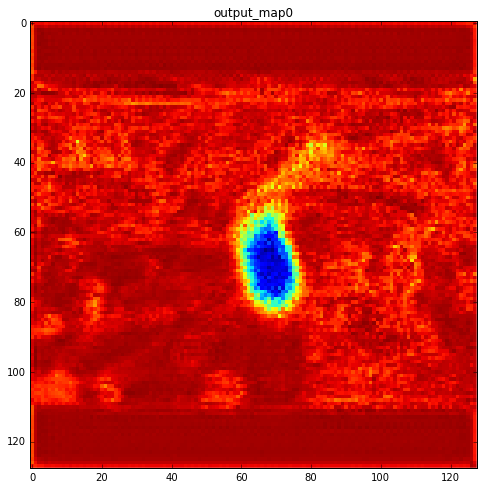

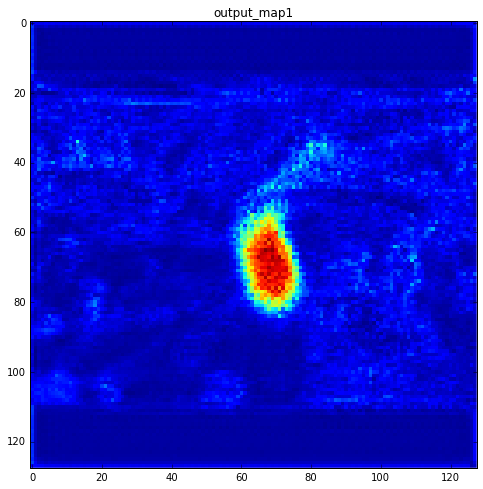

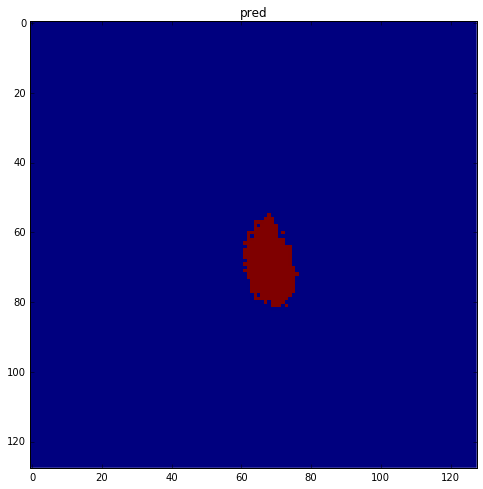

map0 max: 0.982408702374, map1 max: 0.953660309315, pred max: 1


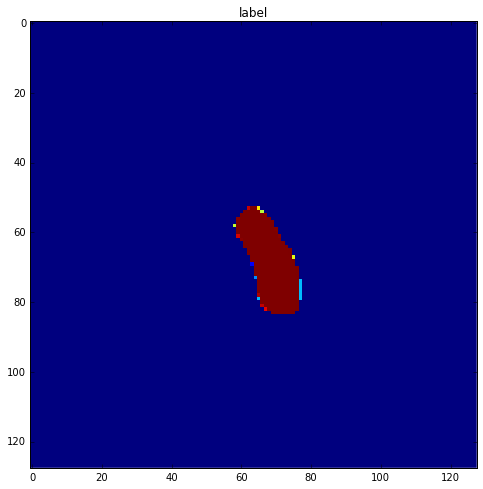

No label, skipping 30_76
No label, skipping 30_77
No label, skipping 30_70
No label, skipping 30_71
No label, skipping 30_72
No label, skipping 30_73
No label, skipping 30_78
No label, skipping 5_49
No label, skipping 5_40
No label, skipping 5_41
No label, skipping 5_43
No label, skipping 5_45
No label, skipping 5_46
step: 2505, loss: 0.00247697625309, dice: [ 0.49824181]
No label, skipping 39_64
No label, skipping 39_65
No label, skipping 39_66
No label, skipping 39_67
No label, skipping 39_60
No label, skipping 39_61
No label, skipping 39_62
No label, skipping 39_63
No label, skipping 39_68
No label, skipping 39_69
No label, skipping 25_109
No label, skipping 25_108
No label, skipping 25_105
No label, skipping 25_104
No label, skipping 25_106
No label, skipping 25_101
No label, skipping 25_100
No label, skipping 25_103
No label, skipping 25_102
No label, skipping 7_91
No label, skipping 7_93
step: 2510, loss: 0.0100867701694, dice: [ 0.63279104]
No label, skipping 7_97
No label, skip

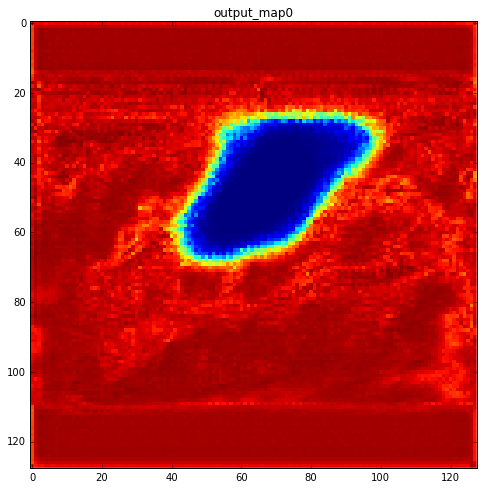

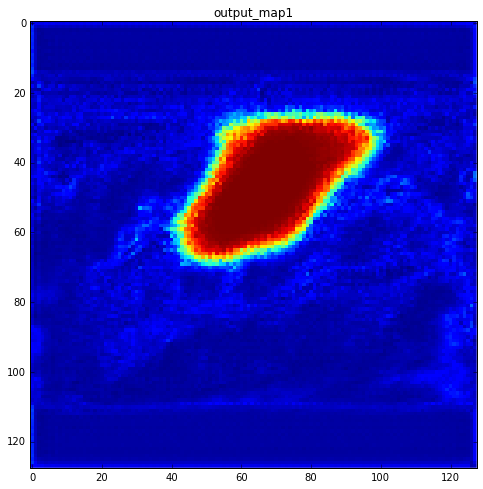

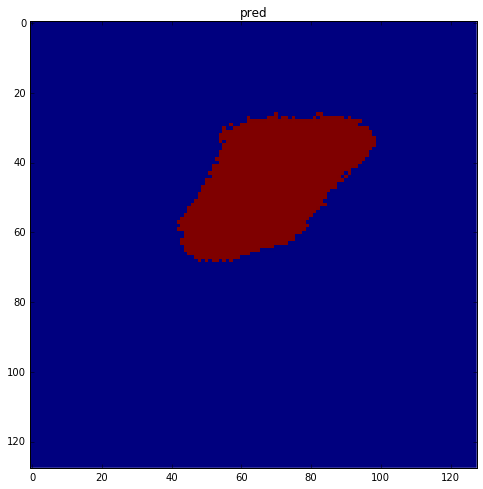

map0 max: 0.981668770313, map1 max: 0.999996721745, pred max: 1


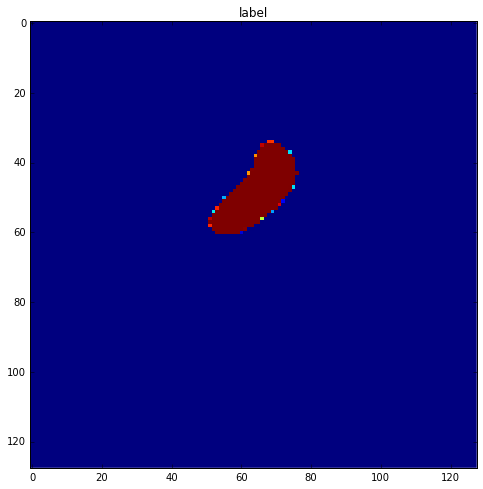

No label, skipping 35_41
No label, skipping 35_44
No label, skipping 35_45
step: 2605, loss: 0.00253979442641, dice: [ 0.43167451]
No label, skipping 36_12
No label, skipping 36_14
No label, skipping 36_15
No label, skipping 36_17
No label, skipping 36_18
No label, skipping 36_19
step: 2610, loss: 0.00230430508964, dice: [ 0.66671371]
No label, skipping 30_32
No label, skipping 30_33
No label, skipping 30_34
No label, skipping 30_35
No label, skipping 30_37
No label, skipping 5_88
No label, skipping 5_89
No label, skipping 5_84
No label, skipping 5_86
No label, skipping 5_87
No label, skipping 5_80
No label, skipping 5_81
No label, skipping 5_82
No label, skipping 47_116
step: 2615, loss: 0.0116368886083, dice: [ 0.72414303]
No label, skipping 47_114
No label, skipping 47_115
No label, skipping 47_112
No label, skipping 47_113
No label, skipping 47_110
No label, skipping 47_111
No label, skipping 47_118
No label, skipping 47_119
No label, skipping 15_88
No label, skipping 15_89
No labe

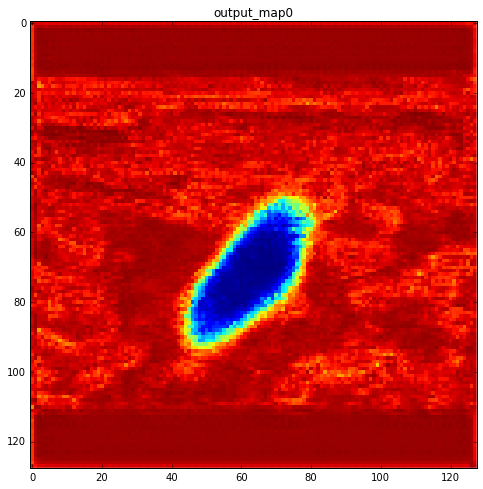

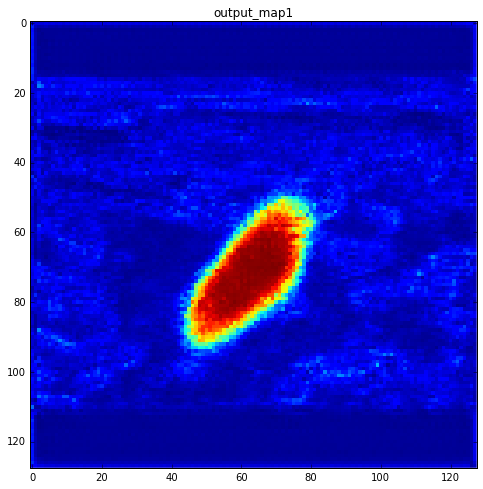

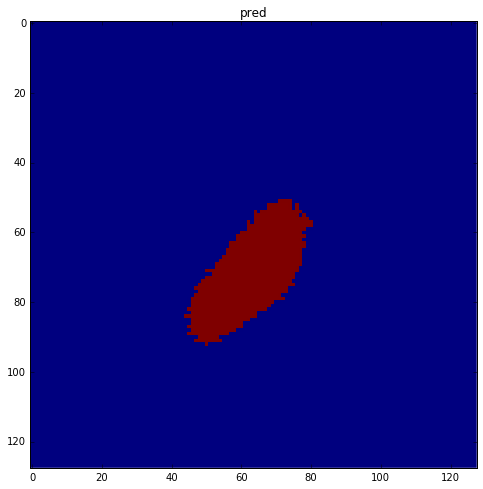

map0 max: 0.982798695564, map1 max: 0.99254244566, pred max: 1


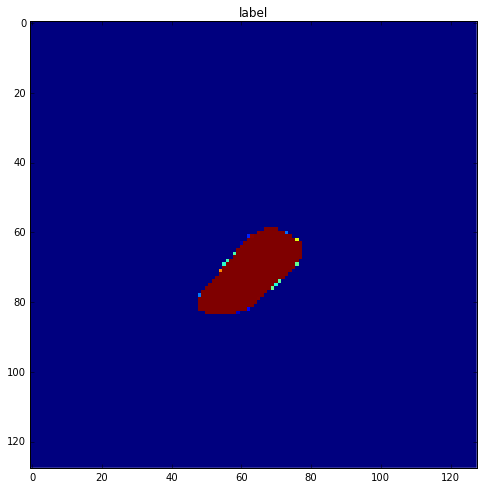

No label, skipping 14_6
No label, skipping 14_7
No label, skipping 14_4
No label, skipping 14_5
No label, skipping 29_98
No label, skipping 29_99
No label, skipping 29_91
No label, skipping 29_93
No label, skipping 29_94
No label, skipping 29_96
No label, skipping 29_97
step: 2705, loss: 0.00269210967235, dice: [ 0.43391448]
No label, skipping 1_100
No label, skipping 1_102
No label, skipping 1_103
No label, skipping 1_105
step: 2710, loss: 0.00307787465863, dice: [ 0.39822081]
No label, skipping 8_46
No label, skipping 8_45
No label, skipping 8_43
No label, skipping 8_42
No label, skipping 8_41
No label, skipping 8_40
No label, skipping 8_49
No label, skipping 18_105
No label, skipping 18_104
No label, skipping 18_107
No label, skipping 18_106
No label, skipping 18_101
No label, skipping 18_100
No label, skipping 18_103
No label, skipping 18_102
No label, skipping 18_108
No label, skipping 20_120
step: 2715, loss: 0.00453922431916, dice: [ 0.21249126]
No label, skipping 38_108
No labe

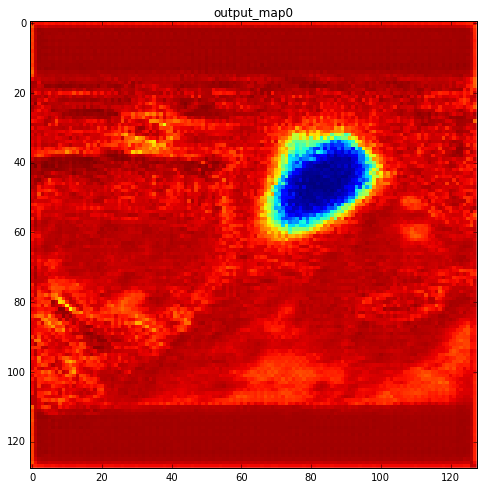

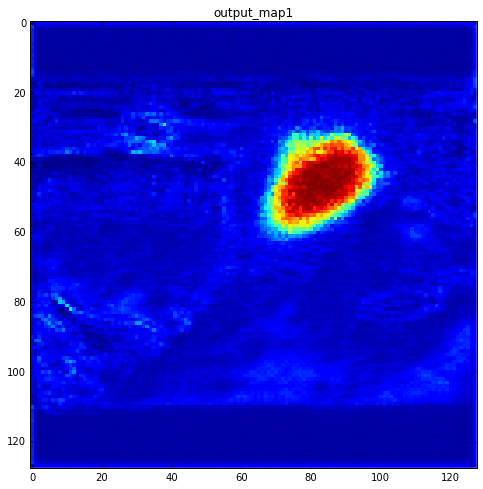

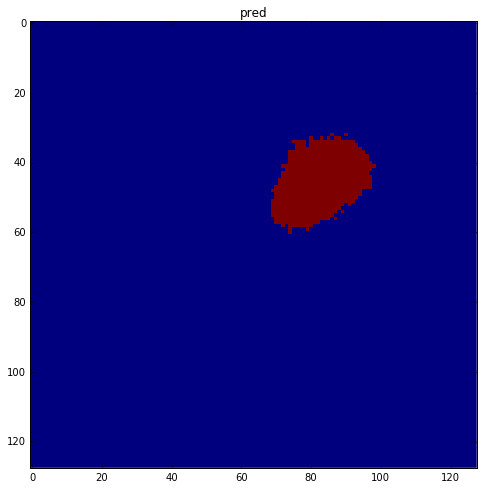

map0 max: 0.992257118225, map1 max: 0.99385279417, pred max: 1


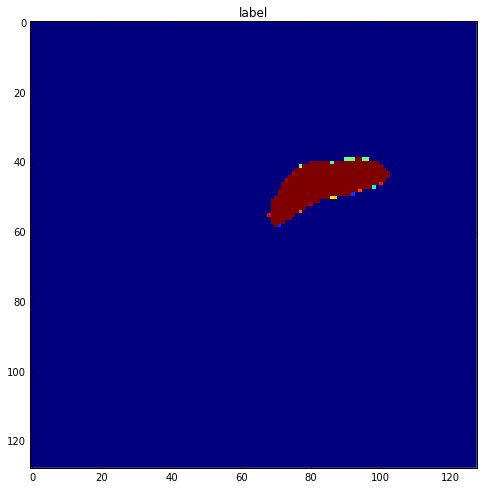

step: 2805, loss: 0.00207418669015, dice: [ 0.66069138]
No label, skipping 7_105
No label, skipping 7_109
No label, skipping 40_96
No label, skipping 40_91
No label, skipping 33_113
No label, skipping 33_112
No label, skipping 33_111
No label, skipping 33_110
No label, skipping 33_117
No label, skipping 33_116
No label, skipping 33_115
No label, skipping 33_114
No label, skipping 33_119
No label, skipping 33_118
No label, skipping 27_63
No label, skipping 27_62
No label, skipping 27_61
No label, skipping 27_60
No label, skipping 27_67
No label, skipping 27_66
No label, skipping 27_65
No label, skipping 27_64
No label, skipping 27_69
No label, skipping 27_68
No label, skipping 28_68
No label, skipping 28_66
step: 2810, loss: 0.00200552353635, dice: [ 0.54901075]
No label, skipping 28_65
No label, skipping 28_61
step: 2815, loss: 0.00257303123362, dice: [ 0.47599161]
step: 2820, loss: 0.00225280644372, dice: [ 0.54307371]
No label, skipping 31_55
No label, skipping 31_54
No label, skippi

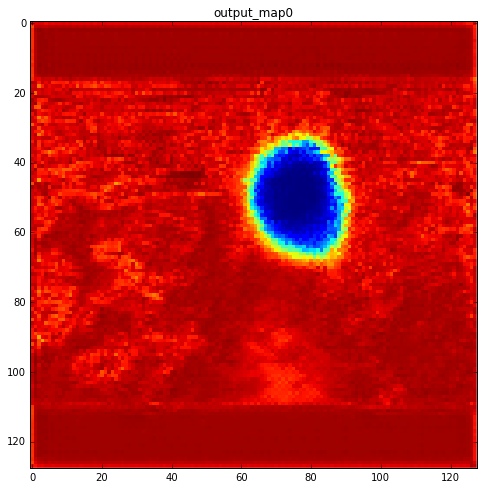

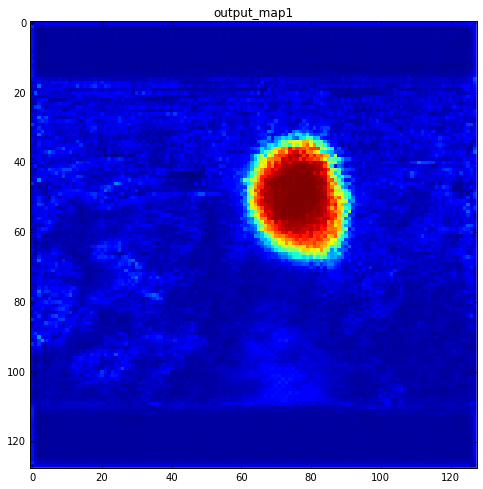

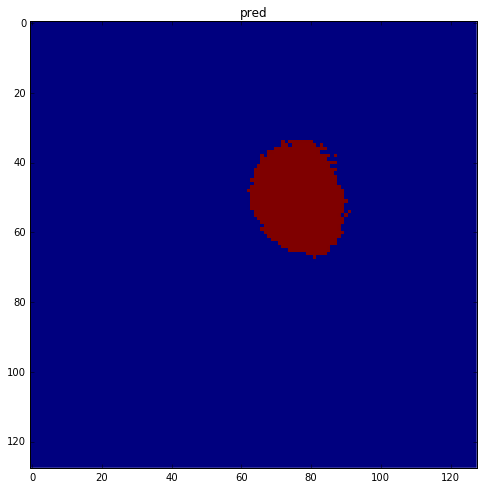

map0 max: 0.987353384495, map1 max: 0.998094797134, pred max: 1


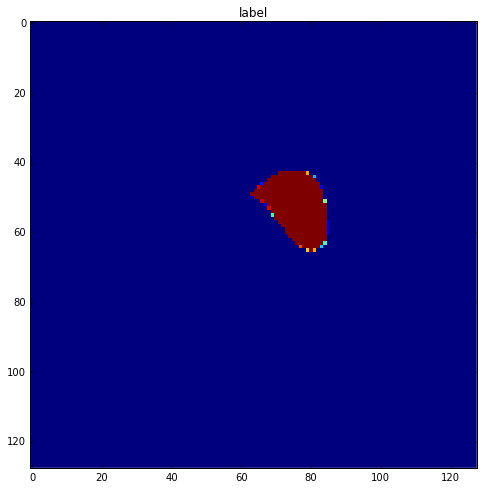

No label, skipping 36_94
No label, skipping 36_96
No label, skipping 36_97
No label, skipping 33_7
No label, skipping 33_4
No label, skipping 33_2
No label, skipping 33_1
No label, skipping 33_9
No label, skipping 33_8
No label, skipping 33_35
No label, skipping 33_34
No label, skipping 33_37
No label, skipping 33_36
No label, skipping 33_31
No label, skipping 33_30
No label, skipping 33_33
No label, skipping 33_32
No label, skipping 33_39
No label, skipping 33_38
No label, skipping 28_44
step: 2905, loss: 0.0020086991135, dice: [ 0.60069305]
No label, skipping 28_46
No label, skipping 28_47
No label, skipping 28_40
No label, skipping 28_41
No label, skipping 28_48
No label, skipping 28_49
No label, skipping 15_120
No label, skipping 42_56
No label, skipping 31_73
No label, skipping 31_72
No label, skipping 31_77
step: 2910, loss: 0.00282894051634, dice: [ 0.70808339]
No label, skipping 31_75
No label, skipping 31_74
No label, skipping 31_79
No label, skipping 31_78
No label, skipping 

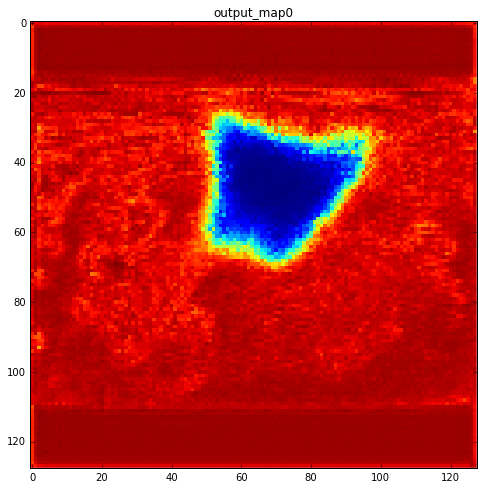

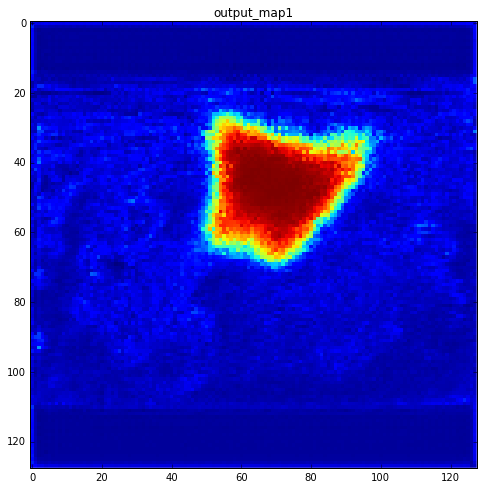

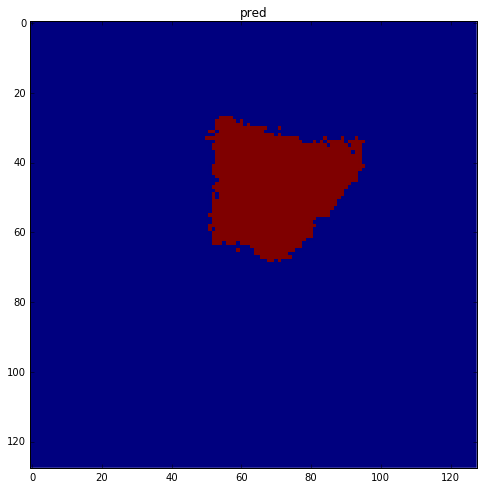

map0 max: 0.9888869524, map1 max: 0.998818337917, pred max: 1


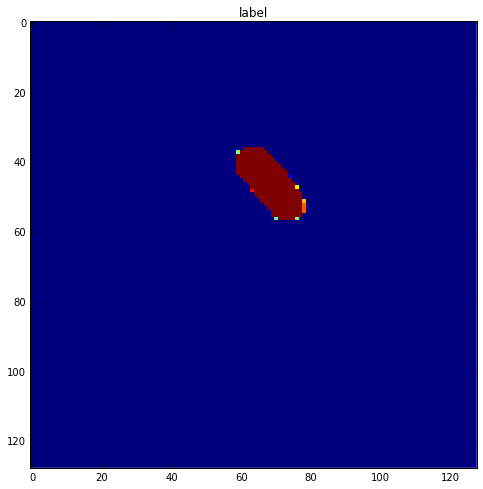

No label, skipping 27_25
No label, skipping 27_24
No label, skipping 27_23
No label, skipping 27_22
No label, skipping 27_20
No label, skipping 27_29
No label, skipping 27_28
No label, skipping 1_62
No label, skipping 19_24
step: 3005, loss: 0.00282425573096, dice: [ 0.45186526]
No label, skipping 1_64
No label, skipping 33_13
No label, skipping 33_10
No label, skipping 2_38
No label, skipping 2_39
No label, skipping 33_14
No label, skipping 2_34
No label, skipping 2_35
No label, skipping 2_36
No label, skipping 2_37
No label, skipping 2_30
No label, skipping 2_31
No label, skipping 2_32
No label, skipping 2_33
step: 3010, loss: 0.00308101414703, dice: [ 0.46462649]
No label, skipping 28_20
No label, skipping 28_21
No label, skipping 28_26
No label, skipping 28_24
No label, skipping 28_25
No label, skipping 28_28
No label, skipping 28_29
No label, skipping 8_6
No label, skipping 8_7
No label, skipping 15_100
No label, skipping 15_102
No label, skipping 15_103
No label, skipping 15_104


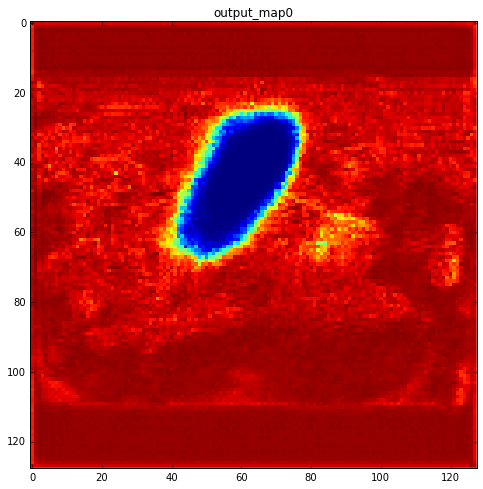

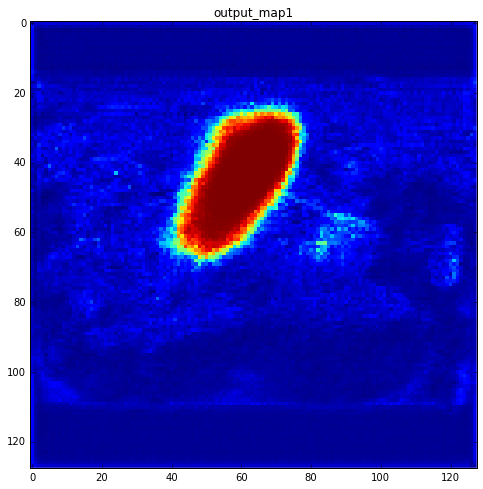

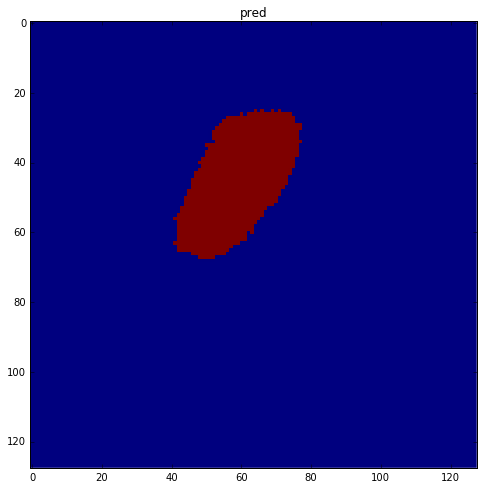

map0 max: 0.979786813259, map1 max: 0.999994516373, pred max: 1


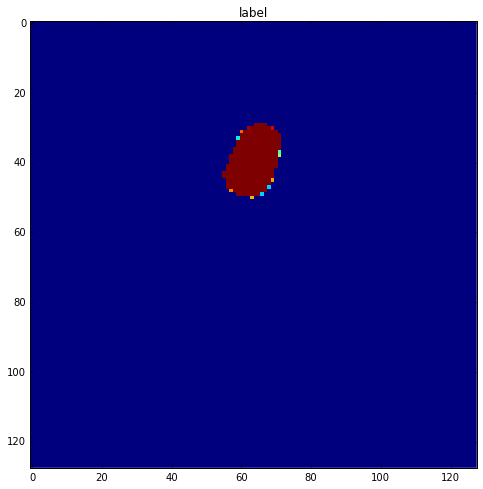

No label, skipping 25_47
No label, skipping 25_46
No label, skipping 25_45
No label, skipping 25_42
No label, skipping 25_41
No label, skipping 25_40
No label, skipping 25_49
No label, skipping 17_95
No label, skipping 17_94
No label, skipping 17_97
step: 3105, loss: 0.00449494551867, dice: [ 0.36988041]
No label, skipping 17_91
No label, skipping 17_93
No label, skipping 17_92
No label, skipping 17_99
No label, skipping 17_98
No label, skipping 14_87
No label, skipping 14_86
No label, skipping 14_85
No label, skipping 14_84
No label, skipping 14_83
No label, skipping 14_82
No label, skipping 14_81
No label, skipping 14_80
No label, skipping 14_89
No label, skipping 11_92
step: 3110, loss: 0.0020134174265, dice: [ 0.56002814]
step: 3115, loss: 0.00196226336993, dice: [ 0.46535546]
No label, skipping 11_98
No label, skipping 33_79
No label, skipping 33_78
No label, skipping 2_18
No label, skipping 2_19
No label, skipping 2_13
No label, skipping 33_73
No label, skipping 33_72
No label, s

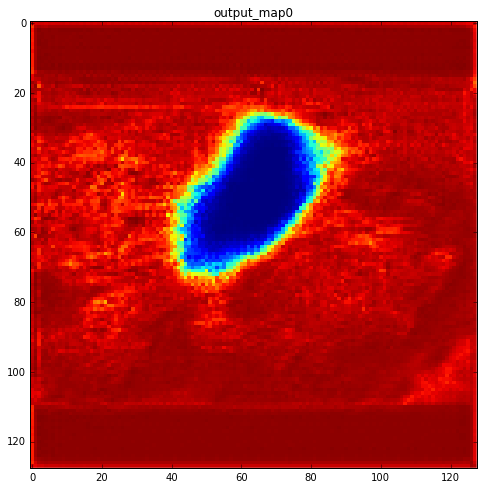

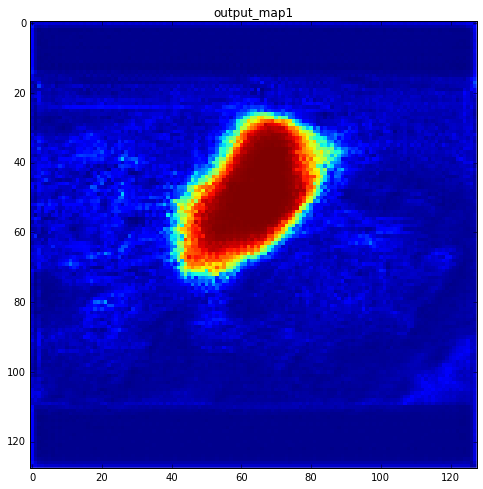

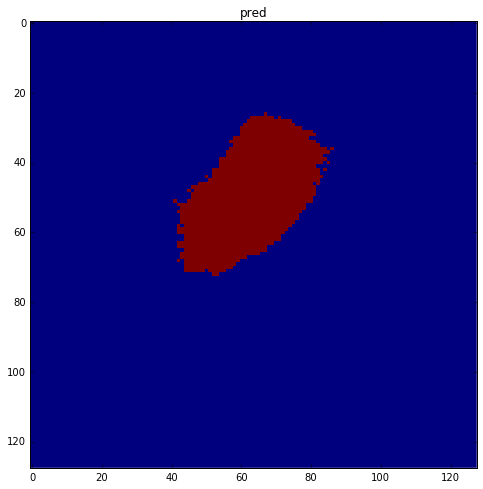

map0 max: 0.981858670712, map1 max: 0.999876737595, pred max: 1


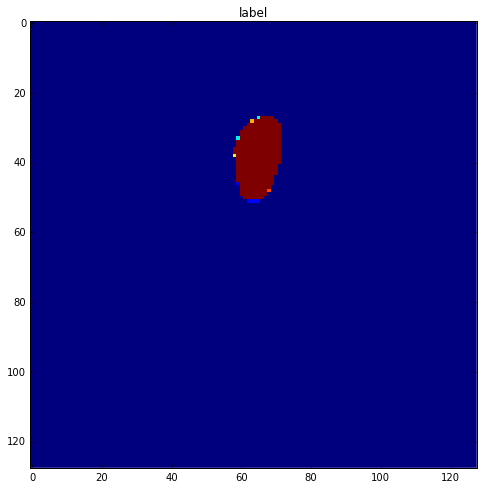

No label, skipping 42_43
No label, skipping 42_48
No label, skipping 15_75
No label, skipping 15_74
step: 3205, loss: 0.0023107714951, dice: [ 0.51757812]
No label, skipping 15_76
No label, skipping 15_71
No label, skipping 15_70
No label, skipping 15_72
No label, skipping 40_5
No label, skipping 40_4
No label, skipping 40_7
No label, skipping 40_6
No label, skipping 14_69
No label, skipping 14_68
No label, skipping 40_3
No label, skipping 40_2
No label, skipping 14_65
No label, skipping 14_64
No label, skipping 14_67
No label, skipping 14_61
No label, skipping 40_8
No label, skipping 14_63
No label, skipping 14_62
step: 3210, loss: 0.00293356063776, dice: [ 0.45987186]
No label, skipping 1_81
No label, skipping 1_83
No label, skipping 19_81
No label, skipping 19_82
No label, skipping 2_70
No label, skipping 33_56
No label, skipping 2_72
No label, skipping 2_73
No label, skipping 33_53
No label, skipping 2_75
No label, skipping 33_51
No label, skipping 2_78
No label, skipping 2_79
step

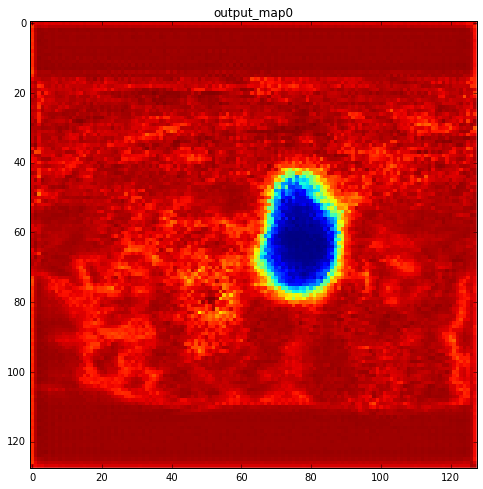

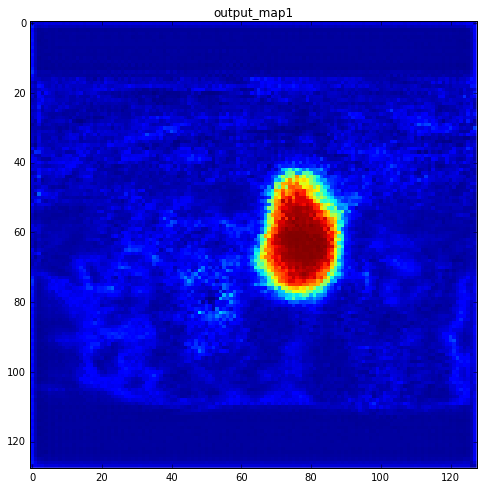

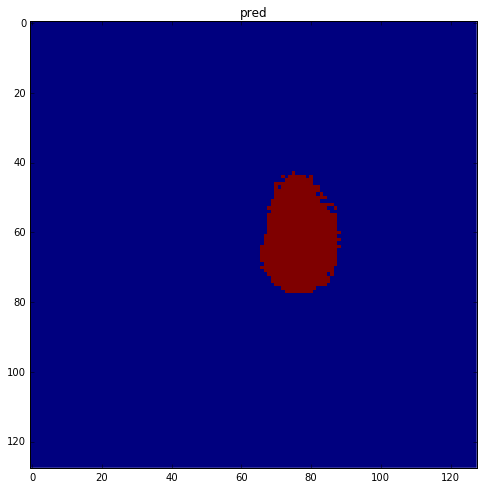

map0 max: 0.984969615936, map1 max: 0.997000157833, pred max: 1


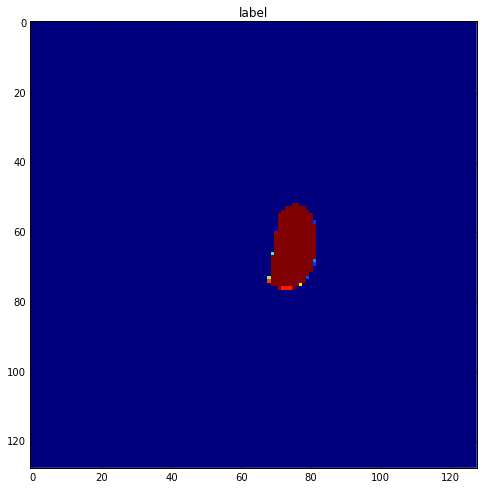

No label, skipping 25_82
No label, skipping 25_81
No label, skipping 25_80
No label, skipping 47_19
No label, skipping 25_85
No label, skipping 27_81
No label, skipping 27_80
No label, skipping 27_83
No label, skipping 27_82
No label, skipping 27_85
No label, skipping 27_84
No label, skipping 27_87
No label, skipping 27_86
No label, skipping 27_89
No label, skipping 27_88
No label, skipping 14_49
No label, skipping 14_48
No label, skipping 14_43
step: 3305, loss: 0.00475910957903, dice: [ 0.49428385]
No label, skipping 14_40
No label, skipping 14_46
No label, skipping 14_45
No label, skipping 14_44
No label, skipping 39_109
No label, skipping 39_102
No label, skipping 39_103
No label, skipping 39_100
No label, skipping 39_101
No label, skipping 39_106
No label, skipping 39_107
No label, skipping 39_104
No label, skipping 39_105
No label, skipping 19_10
No label, skipping 1_78
step: 3310, loss: 0.00593403773382, dice: [ 0.29545599]
No label, skipping 9_8
No label, skipping 9_6
No label,

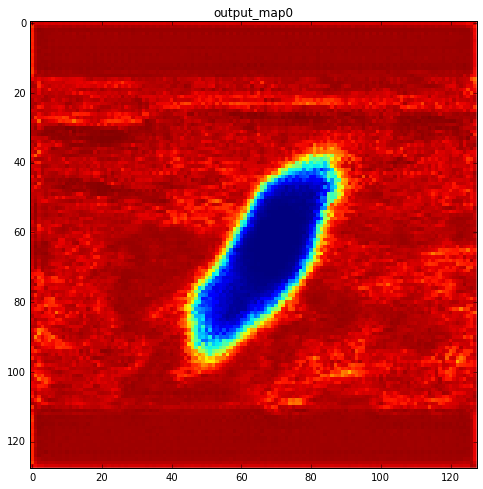

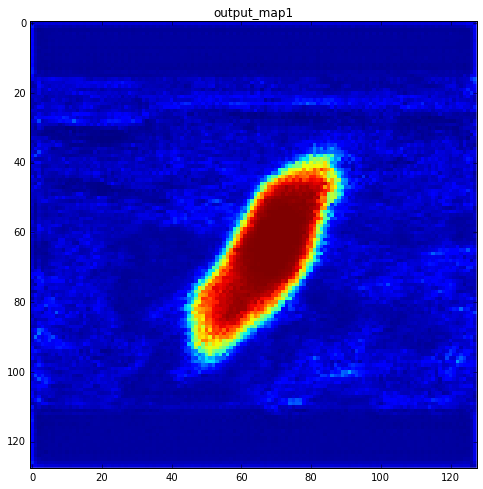

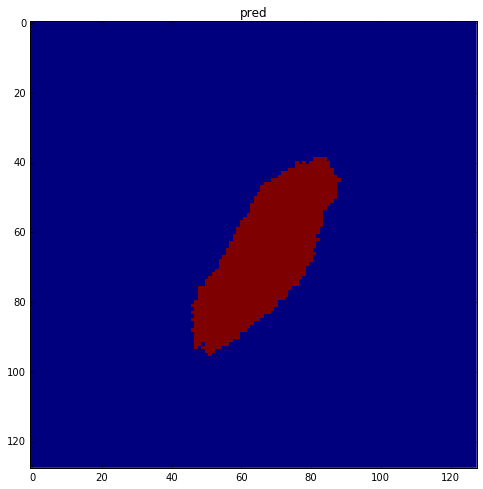

map0 max: 0.990703821182, map1 max: 0.999880075455, pred max: 1


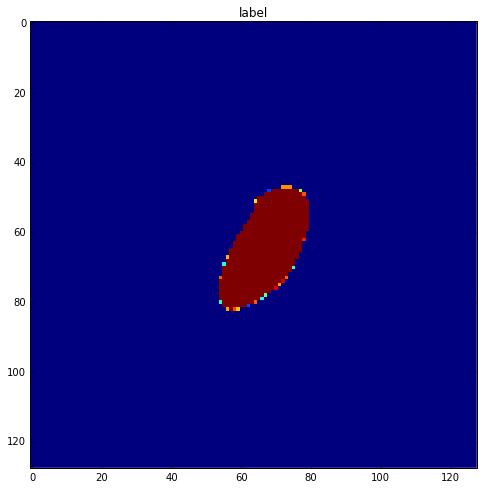

No label, skipping 14_25
No label, skipping 14_27
No label, skipping 14_29
No label, skipping 14_28
No label, skipping 25_116
No label, skipping 39_72
No label, skipping 39_71
No label, skipping 31_111
step: 3405, loss: 0.0035009351559, dice: [ 0.28551921]
No label, skipping 31_114
No label, skipping 31_117
No label, skipping 31_116
No label, skipping 31_119
No label, skipping 39_77
No label, skipping 39_76
No label, skipping 29_118
No label, skipping 29_119
No label, skipping 39_75
No label, skipping 29_113
No label, skipping 29_111
No label, skipping 29_116
No label, skipping 29_114
No label, skipping 29_115
No label, skipping 16_120
step: 3410, loss: 0.00369081413373, dice: [ 0.51355624]
No label, skipping 11_38
No label, skipping 11_37
No label, skipping 11_31
No label, skipping 11_33
step: 3415, loss: 0.00284748477861, dice: [ 0.42305699]
No label, skipping 7_9
No label, skipping 7_6
step: 3420, loss: 0.00429373048246, dice: [ 0.59968054]
No label, skipping 7_3
No label, skipping 

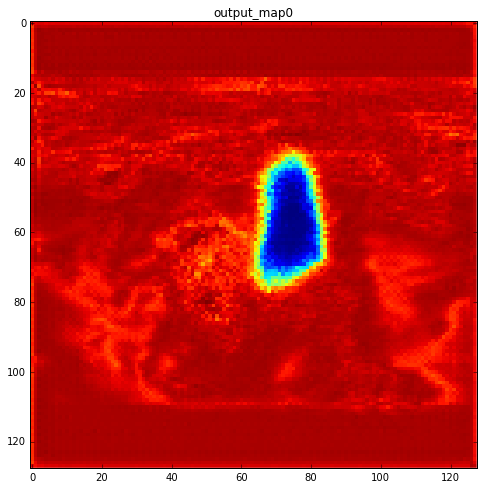

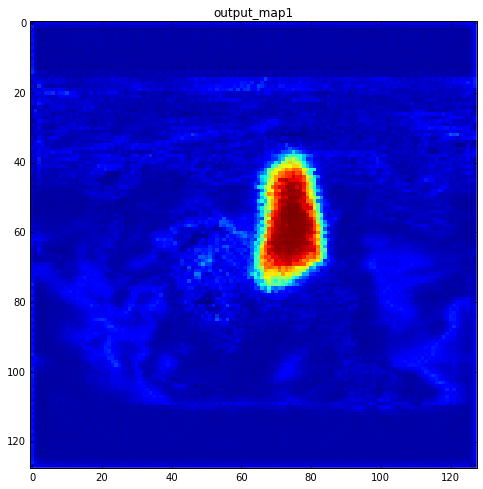

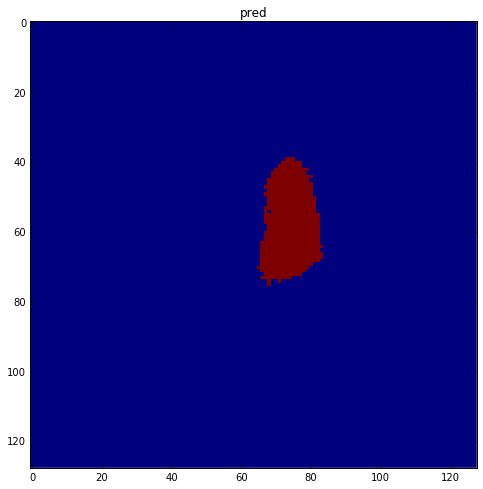

map0 max: 0.992974042892, map1 max: 0.995247483253, pred max: 1


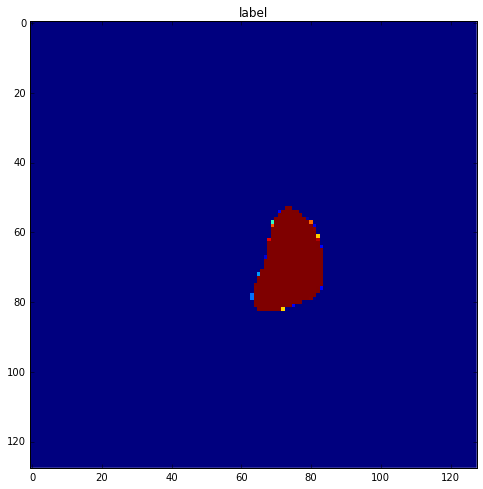

No label, skipping 47_51
No label, skipping 47_53
No label, skipping 47_55
step: 3505, loss: 0.00523729110137, dice: [ 0.34100616]
No label, skipping 11_104
No label, skipping 11_105
No label, skipping 17_17
No label, skipping 11_107
No label, skipping 17_11
No label, skipping 17_10
No label, skipping 17_13
No label, skipping 11_103
step: 3510, loss: 0.0021088749636, dice: [ 0.51268381]
No label, skipping 41_112
step: 3515, loss: 0.00206779735163, dice: [ 0.61113799]
No label, skipping 44_1
No label, skipping 44_7
step: 3520, loss: 0.002561500296, dice: [ 0.45696437]
No label, skipping 44_8
No label, skipping 1_93
No label, skipping 16_109
No label, skipping 16_106
step: 3525, loss: 0.00232556625269, dice: [ 0.63498849]
No label, skipping 35_6
No label, skipping 1_97
No label, skipping 1_95
step: 3530, loss: 0.00264628673904, dice: [ 0.43993175]
No label, skipping 11_19
step: 3535, loss: 0.00333390431479, dice: [ 0.3468608]
No label, skipping 11_15
No label, skipping 43_2
No label, ski

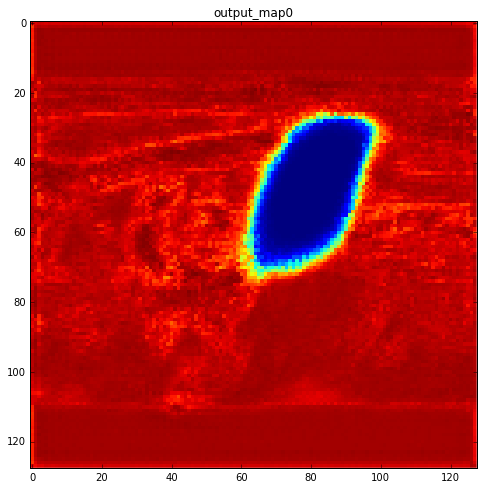

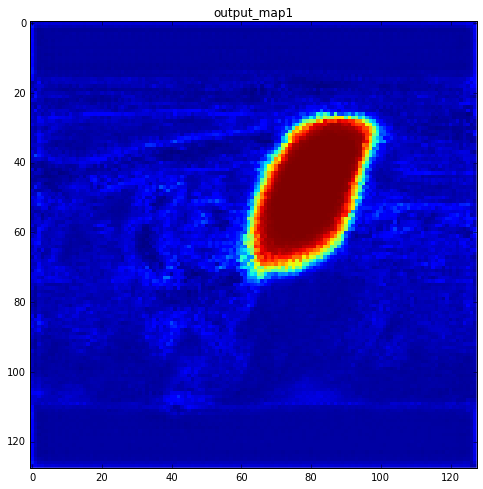

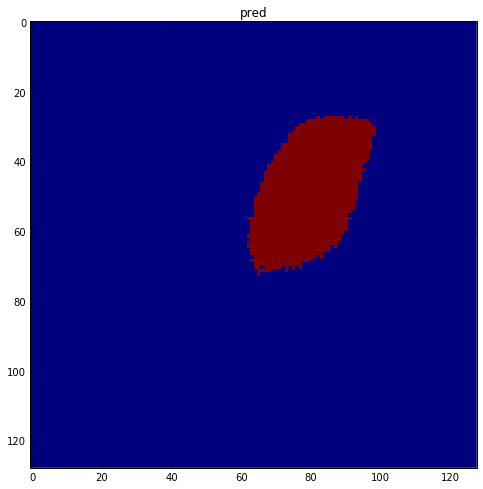

map0 max: 0.990780413151, map1 max: 0.999999523163, pred max: 1


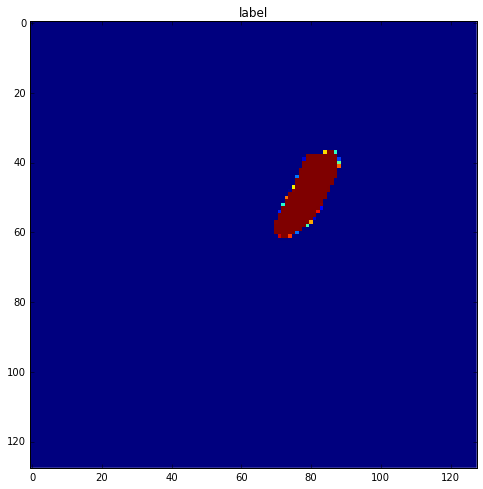

No label, skipping 41_70
No label, skipping 41_74
No label, skipping 41_76
No label, skipping 41_77
No label, skipping 6_118
No label, skipping 6_119
No label, skipping 6_114
No label, skipping 6_115
No label, skipping 6_116
No label, skipping 6_117
No label, skipping 6_110
No label, skipping 6_111
No label, skipping 6_112
No label, skipping 6_113
step: 3605, loss: 0.0019443302881, dice: [ 0.53660852]
No label, skipping 45_115
No label, skipping 45_116
No label, skipping 45_117
No label, skipping 45_110
No label, skipping 45_111
No label, skipping 45_112
No label, skipping 45_113
No label, skipping 45_119
No label, skipping 39_59
No label, skipping 39_58
No label, skipping 39_55
No label, skipping 39_54
No label, skipping 39_57
No label, skipping 39_56
No label, skipping 39_51
No label, skipping 39_50
No label, skipping 39_53
No label, skipping 39_52
No label, skipping 17_39
No label, skipping 17_38
No label, skipping 17_33
No label, skipping 17_32
No label, skipping 17_30
step: 3610, 

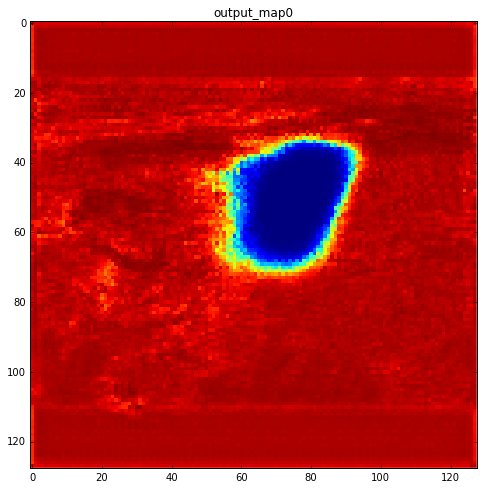

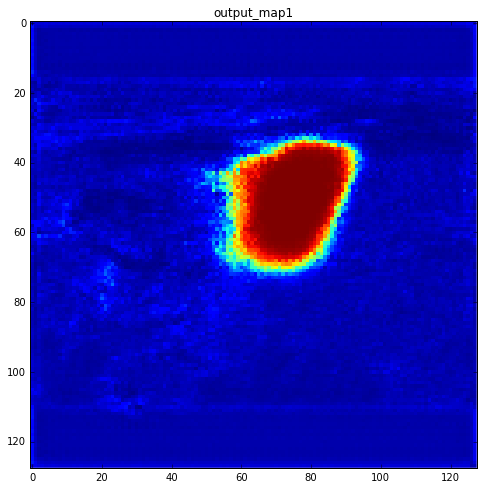

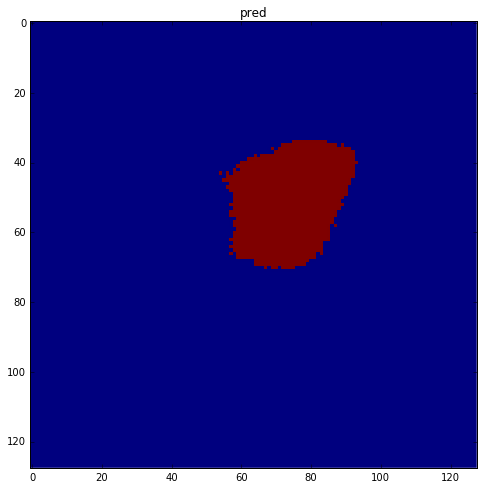

map0 max: 0.993685603142, map1 max: 0.999995350838, pred max: 1


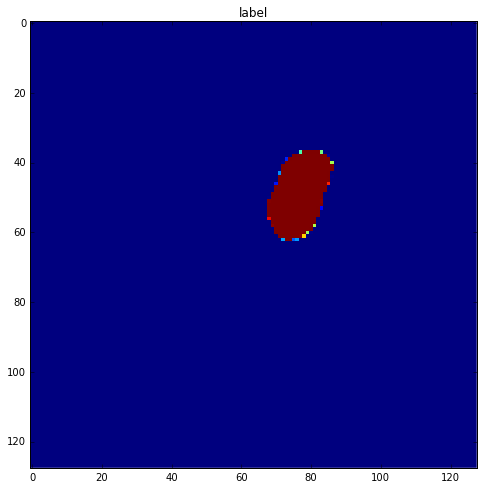

No label, skipping 43_48
No label, skipping 3_3
No label, skipping 8_80
No label, skipping 8_87
No label, skipping 11_58
No label, skipping 11_57
No label, skipping 11_56
step: 3705, loss: 0.00384205835871, dice: [ 0.49336249]
No label, skipping 8_84
No label, skipping 11_53
No label, skipping 11_52
No label, skipping 5_113
No label, skipping 5_111
No label, skipping 5_110
No label, skipping 5_117
step: 3710, loss: 0.00193438481074, dice: [ 0.50321752]
No label, skipping 5_115
No label, skipping 5_119
No label, skipping 5_118
No label, skipping 6_49
No label, skipping 6_44
No label, skipping 6_47
step: 3715, loss: 0.00306164310314, dice: [ 0.57812595]
No label, skipping 6_41
No label, skipping 6_40
No label, skipping 6_43
No label, skipping 6_42
No label, skipping 4_43
No label, skipping 4_42
No label, skipping 4_40
step: 3720, loss: 0.00341998040676, dice: [ 0.53783631]
No label, skipping 4_49
No label, skipping 4_48
No label, skipping 34_118
No label, skipping 34_119
No label, skippi

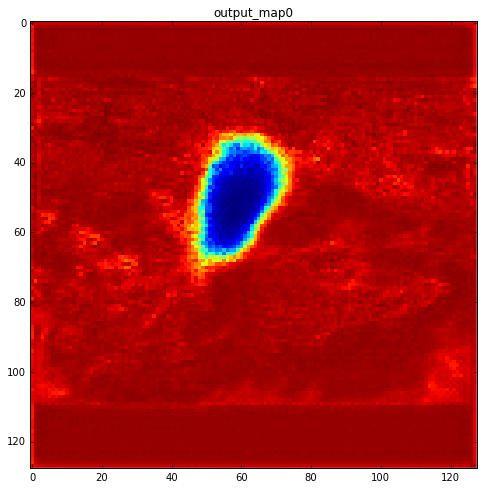

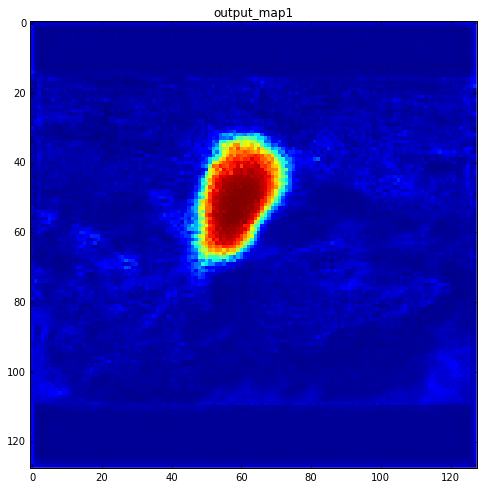

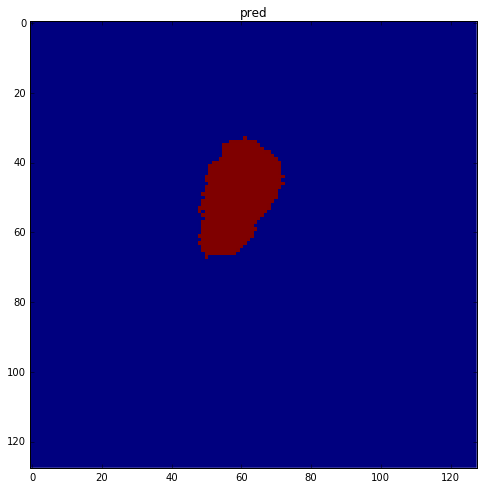

map0 max: 0.984790503979, map1 max: 0.995927751064, pred max: 1


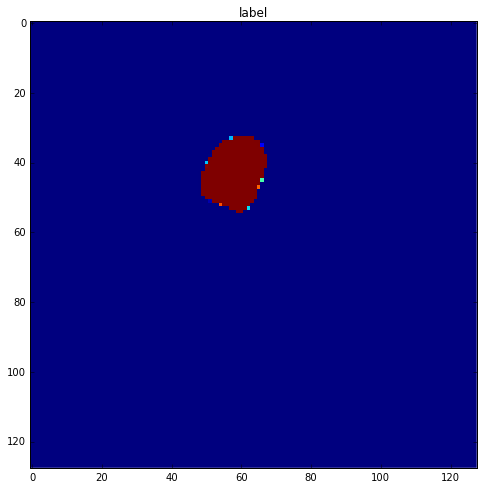

No label, skipping 15_99
No label, skipping 15_95
No label, skipping 15_94
No label, skipping 15_93
No label, skipping 15_92
No label, skipping 15_91
No label, skipping 39_39
No label, skipping 39_38
No label, skipping 39_37
No label, skipping 39_36
No label, skipping 39_35
No label, skipping 39_34
No label, skipping 39_33
No label, skipping 39_32
No label, skipping 39_31
No label, skipping 39_30
No label, skipping 5_58
No label, skipping 7_48
step: 3805, loss: 0.00254013785161, dice: [ 0.55889201]
No label, skipping 7_42
No label, skipping 7_40
No label, skipping 7_46
No label, skipping 7_47
No label, skipping 19_79
step: 3810, loss: 0.00351923261769, dice: [ 0.35858899]
No label, skipping 40_61
No label, skipping 42_2
No label, skipping 1_19
step: 3815, loss: 0.00182582857087, dice: [ 0.49141645]
No label, skipping 40_15
No label, skipping 40_14
No label, skipping 40_17
No label, skipping 1_18
No label, skipping 40_11
No label, skipping 40_10
No label, skipping 40_13
No label, skippi

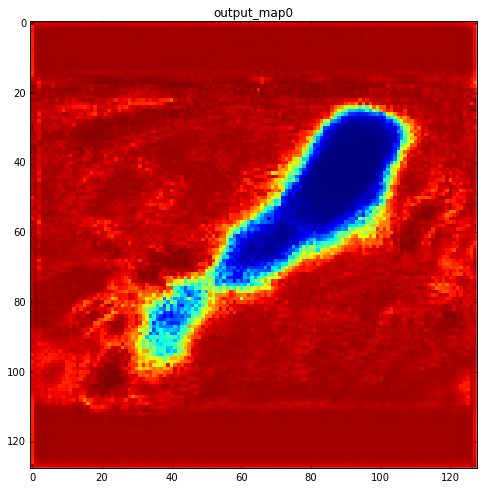

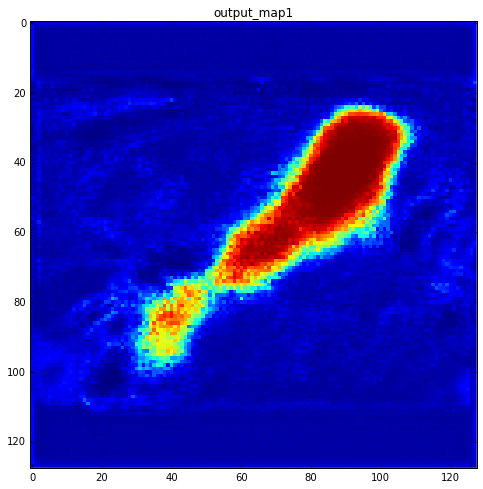

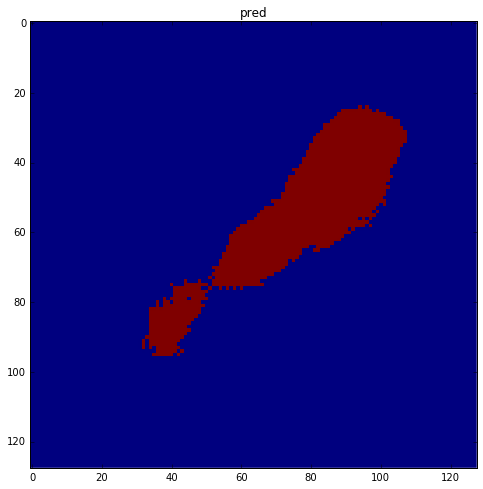

map0 max: 0.99319922924, map1 max: 0.999924242496, pred max: 1


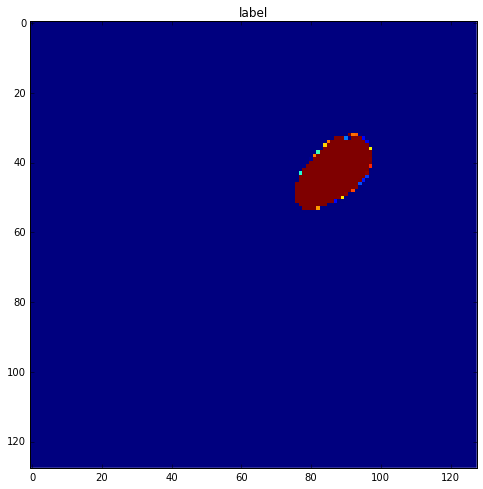

No label, skipping 1_117
No label, skipping 1_116
No label, skipping 1_115
No label, skipping 1_114
No label, skipping 1_112
step: 3905, loss: 0.00196936260909, dice: [ 0.48503622]
No label, skipping 1_110
No label, skipping 12_78
No label, skipping 12_79
No label, skipping 12_74
No label, skipping 12_76
No label, skipping 12_77
No label, skipping 12_71
No label, skipping 12_72
No label, skipping 12_73
No label, skipping 8_54
No label, skipping 8_57
step: 3910, loss: 0.00211611320265, dice: [ 0.62857825]
No label, skipping 8_51
No label, skipping 8_52
No label, skipping 8_53
No label, skipping 8_58
No label, skipping 8_59
No label, skipping 25_7
No label, skipping 25_4
No label, skipping 25_5
No label, skipping 25_2
No label, skipping 25_3
No label, skipping 25_1
No label, skipping 25_9
No label, skipping 18_116
No label, skipping 18_117
No label, skipping 18_114
No label, skipping 18_115
No label, skipping 18_112
No label, skipping 18_113
No label, skipping 18_110
No label, skipping 1

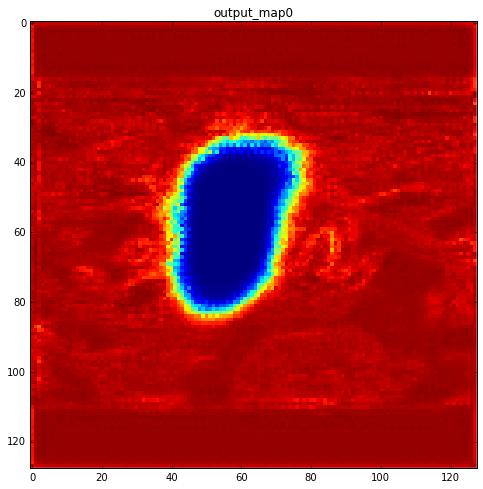

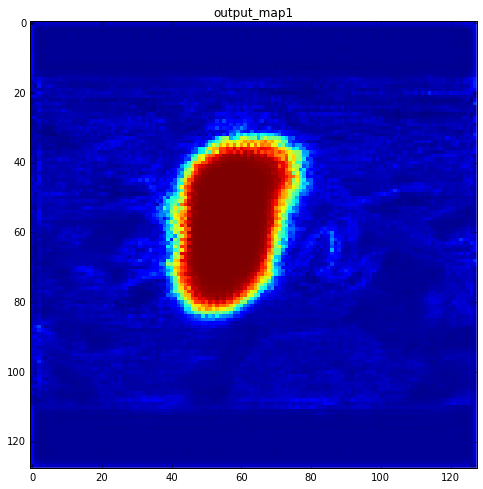

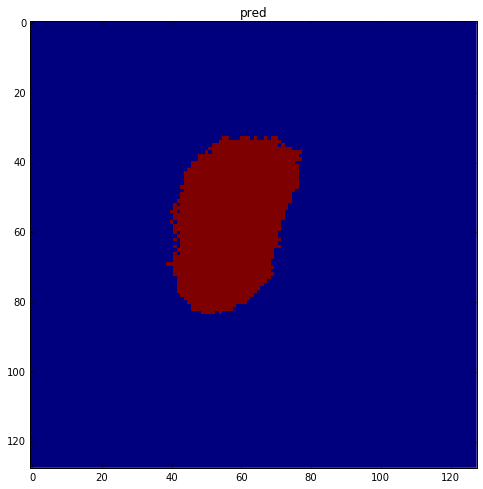

map0 max: 0.990099072456, map1 max: 0.999999046326, pred max: 1


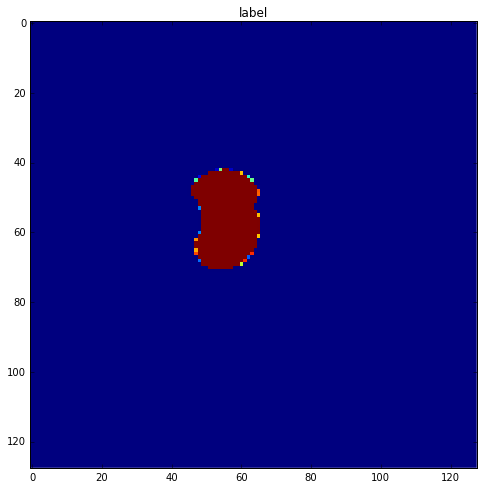

No label, skipping 16_31
No label, skipping 46_9
No label, skipping 46_8
step: 4005, loss: 0.00208175438456, dice: [ 0.49450874]
No label, skipping 32_101
No label, skipping 32_100
step: 4010, loss: 0.00202996097505, dice: [ 0.53038275]
No label, skipping 10_78
No label, skipping 10_79
No label, skipping 10_73
No label, skipping 10_71
No label, skipping 10_76
No label, skipping 10_77
No label, skipping 10_74
No label, skipping 10_75
No label, skipping 32_83
No label, skipping 32_81
step: 4015, loss: 0.00247575808316, dice: [ 0.75638163]
No label, skipping 32_85
No label, skipping 41_92
No label, skipping 32_89
step: 4020, loss: 0.00293323327787, dice: [ 0.41872987]
step: 4025, loss: 0.00236275466159, dice: [ 0.69562268]
No label, skipping 28_110
No label, skipping 37_70
No label, skipping 37_72
No label, skipping 12_30
No label, skipping 12_31
No label, skipping 12_32
step: 4030, loss: 0.0166457630694, dice: [ 0.58144242]
No label, skipping 12_34
No label, skipping 12_35
No label, skip

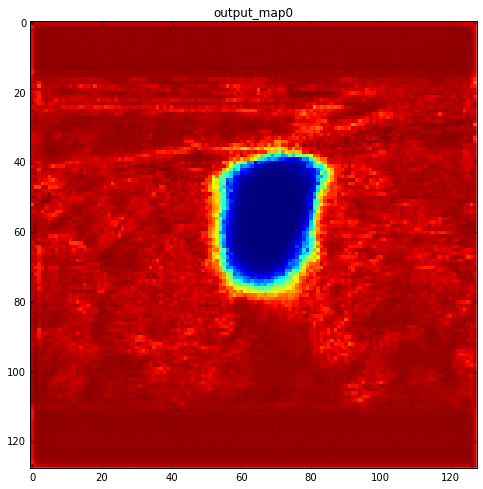

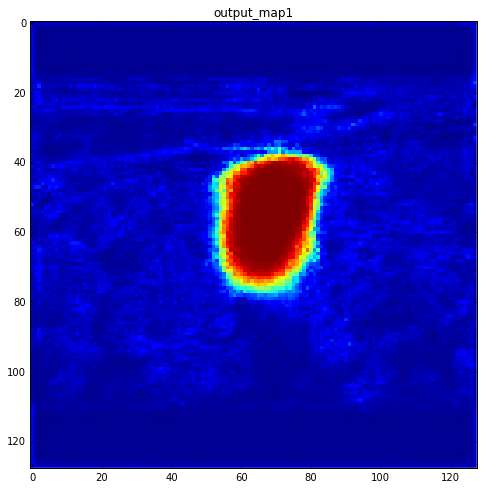

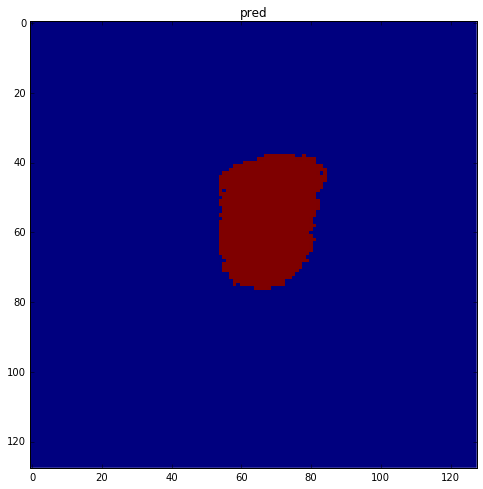

map0 max: 0.990367412567, map1 max: 0.999958336353, pred max: 1


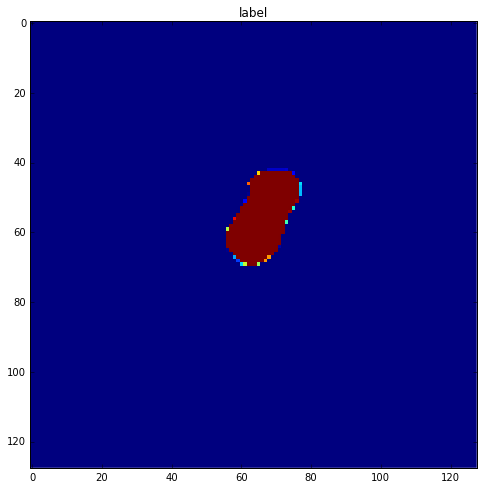

step: 4105, loss: 0.00166023988277, dice: [ 0.68326318]
No label, skipping 10_50
No label, skipping 10_51
No label, skipping 10_53
step: 4110, loss: 0.00236261473037, dice: [ 0.68945229]
No label, skipping 10_56
No label, skipping 10_57
No label, skipping 10_59
step: 4115, loss: 0.0030918084085, dice: [ 0.77950972]
No label, skipping 44_45
No label, skipping 44_48
step: 4120, loss: 0.00181869766675, dice: [ 0.48204669]
No label, skipping 8_120
No label, skipping 34_9
No label, skipping 34_4
step: 4125, loss: 0.00203449930996, dice: [ 0.42934719]
No label, skipping 34_3
No label, skipping 8_36
No label, skipping 8_37
No label, skipping 8_35
No label, skipping 8_32
No label, skipping 8_33
step: 4130, loss: 0.00269639282487, dice: [ 0.75980556]
No label, skipping 8_39
No label, skipping 23_16
No label, skipping 23_12
step: 4135, loss: 0.00214971299283, dice: [ 0.46742111]
No label, skipping 25_19
step: 4140, loss: 0.00187028222717, dice: [ 0.59314489]
No label, skipping 25_15
No label, sk

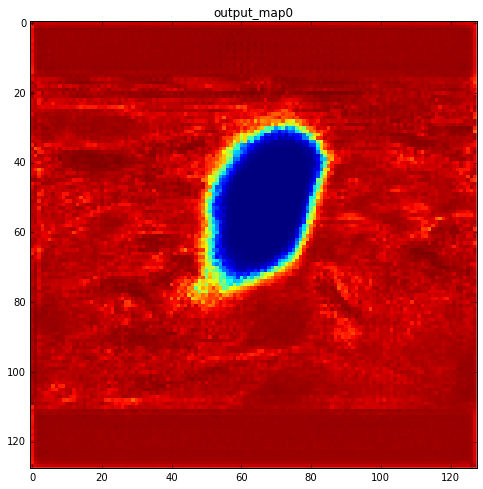

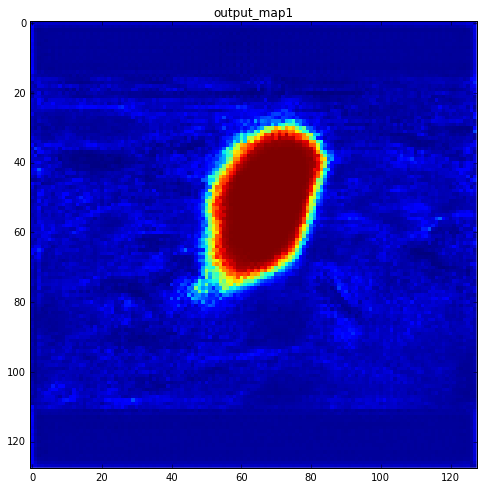

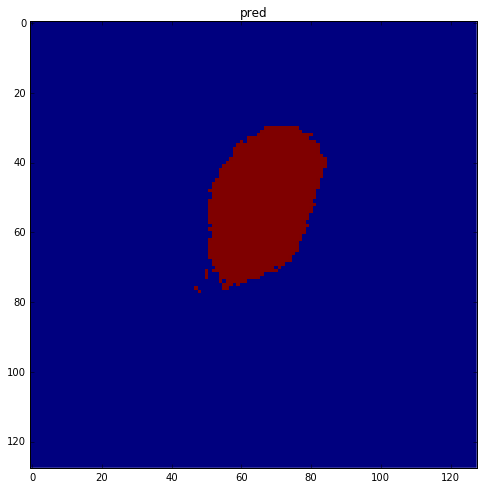

map0 max: 0.993214964867, map1 max: 1.0, pred max: 1


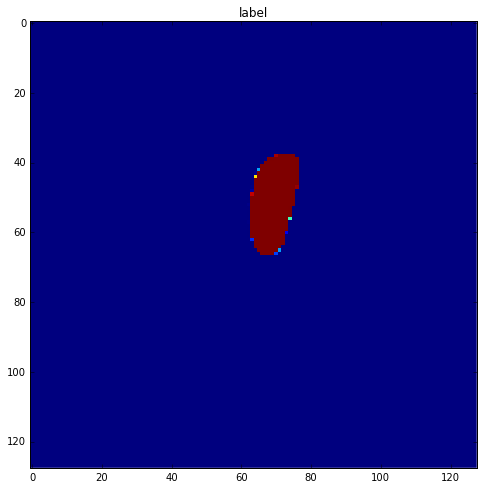

step: 4205, loss: 0.00157014210708, dice: [ 0.62598884]
step: 4210, loss: 0.00469771260396, dice: [ 0.38485405]
No label, skipping 9_76
No label, skipping 9_73
step: 4215, loss: 0.00225345534272, dice: [ 0.48675898]
No label, skipping 9_79
No label, skipping 9_78
No label, skipping 42_115
step: 4220, loss: 0.00158681173343, dice: [ 0.49397293]
No label, skipping 42_111
No label, skipping 44_68
step: 4225, loss: 0.00377775076777, dice: [ 0.34849498]
No label, skipping 44_64
No label, skipping 44_61
step: 4230, loss: 0.00190844095778, dice: [ 0.55371225]
No label, skipping 14_101
No label, skipping 39_99
No label, skipping 14_102
No label, skipping 14_105
No label, skipping 14_104
No label, skipping 14_107
No label, skipping 39_98
No label, skipping 18_61
No label, skipping 18_60
No label, skipping 18_63
No label, skipping 18_62
No label, skipping 18_65
No label, skipping 18_64
No label, skipping 18_67
No label, skipping 18_66
No label, skipping 18_69
No label, skipping 18_68
step: 4235,

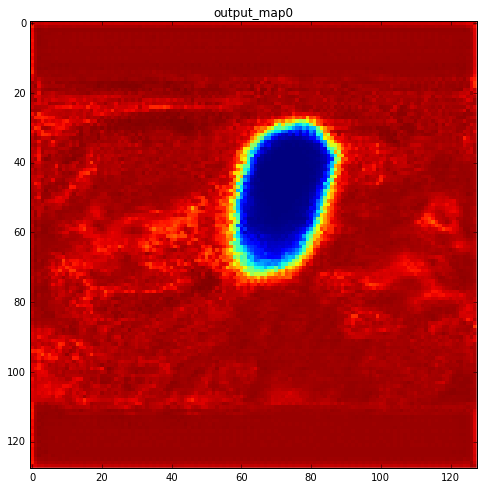

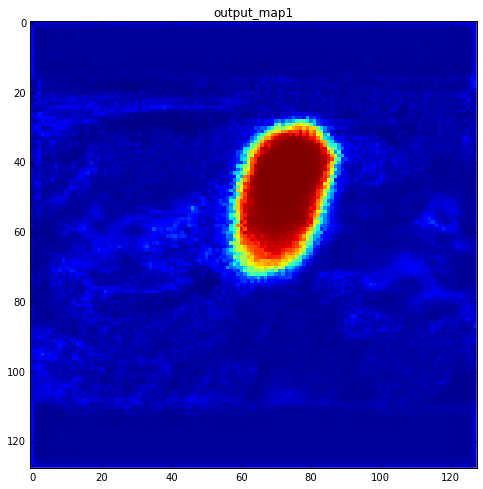

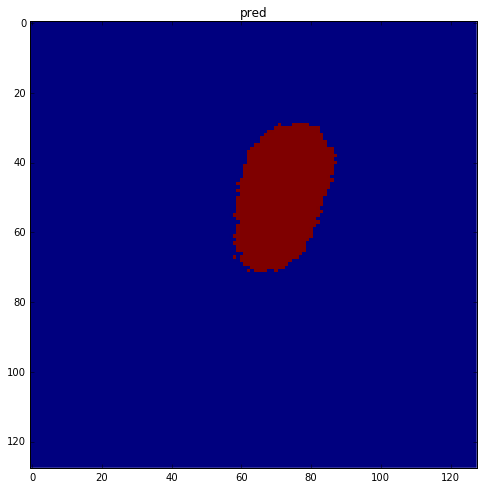

map0 max: 0.991571485996, map1 max: 0.999865353107, pred max: 1


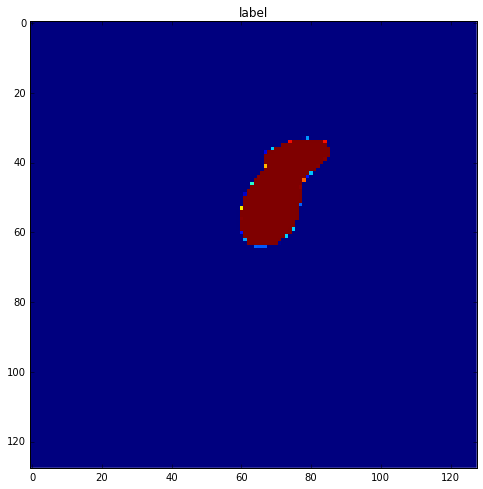

No label, skipping 32_23
No label, skipping 37_18
step: 4305, loss: 0.0109075587243, dice: [ 0.80984968]
step: 4310, loss: 0.00520786223933, dice: [ 0.73843247]
No label, skipping 9_17
step: 4315, loss: 0.00174789037555, dice: [ 0.45589125]
No label, skipping 9_15
No label, skipping 9_19
No label, skipping 9_18
No label, skipping 3_37
No label, skipping 3_36
No label, skipping 3_34
No label, skipping 3_33
No label, skipping 3_32
No label, skipping 3_31
No label, skipping 3_39
No label, skipping 10_94
step: 4320, loss: 0.00986949633807, dice: [ 0.75024354]
No label, skipping 10_96
No label, skipping 10_90
No label, skipping 10_92
No label, skipping 10_93
No label, skipping 10_99
No label, skipping 12_92
No label, skipping 12_93
No label, skipping 12_90
No label, skipping 12_91
No label, skipping 12_96
No label, skipping 12_97
No label, skipping 12_94
No label, skipping 12_95
No label, skipping 12_99
step: 4325, loss: 0.00524763064459, dice: [ 0.38372689]
No label, skipping 44_101
No lab

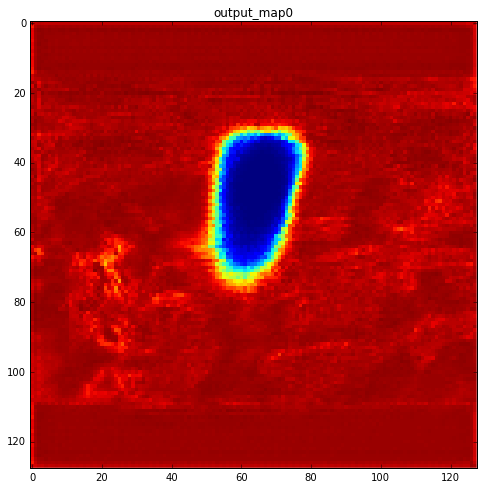

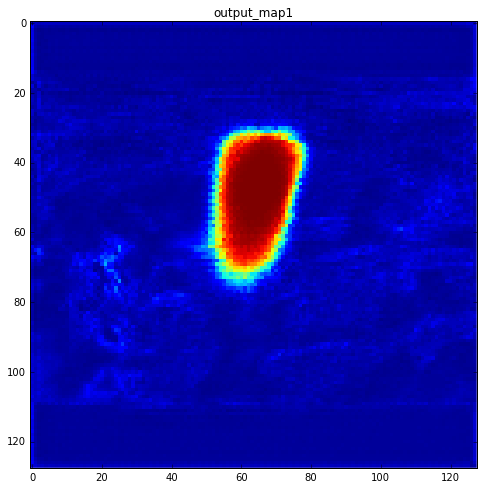

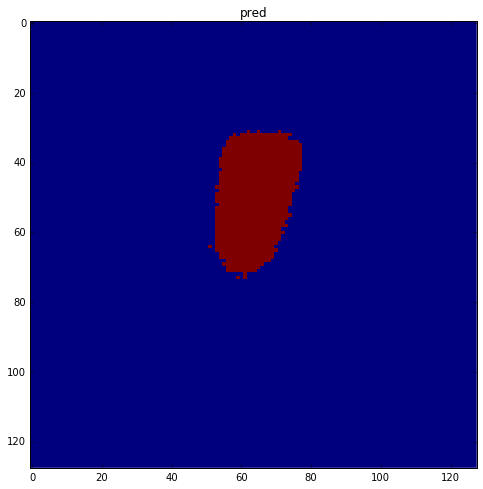

map0 max: 0.990539133549, map1 max: 0.999793708324, pred max: 1


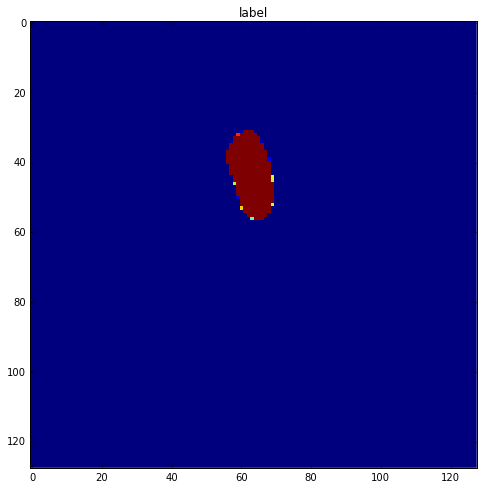

No label, skipping 1_82
No label, skipping 19_87
No label, skipping 1_84
No label, skipping 1_86
No label, skipping 19_88
step: 4405, loss: 0.00233955495059, dice: [ 0.5120675]
No label, skipping 24_88
No label, skipping 24_89
No label, skipping 24_85
No label, skipping 24_87
No label, skipping 24_80
No label, skipping 24_82
No label, skipping 24_83
No label, skipping 46_68
No label, skipping 46_69
No label, skipping 46_62
No label, skipping 46_63
No label, skipping 46_60
No label, skipping 46_61
No label, skipping 46_66
No label, skipping 46_67
No label, skipping 46_64
No label, skipping 46_65
step: 4410, loss: 0.00184606807306, dice: [ 0.50948429]
No label, skipping 9_30
No label, skipping 9_32
No label, skipping 9_34
No label, skipping 9_36
No label, skipping 3_19
step: 4415, loss: 0.00184735213406, dice: [ 0.4445793]
No label, skipping 3_16
No label, skipping 3_11
No label, skipping 3_10
step: 4420, loss: 0.00366801349446, dice: [ 0.46123666]
No label, skipping 26_88
No label, skip

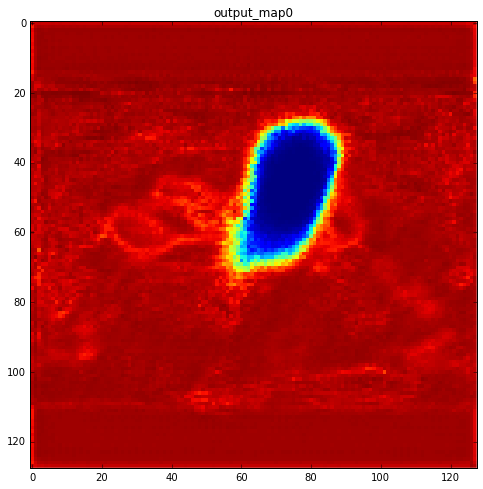

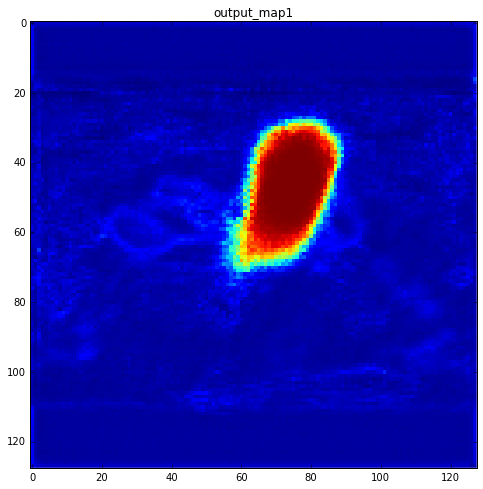

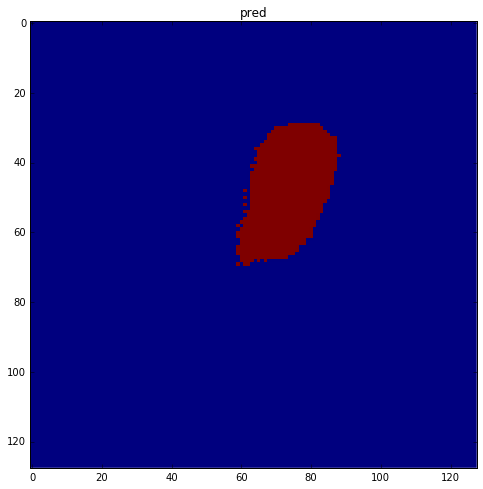

map0 max: 0.994491517544, map1 max: 0.999902784824, pred max: 1


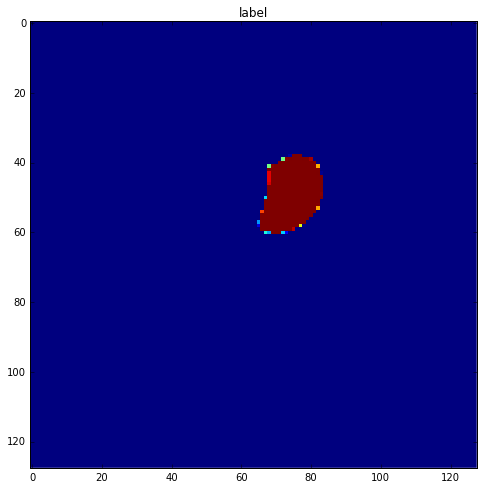

No label, skipping 23_96
step: 4505, loss: 0.00219810800627, dice: [ 0.68886459]
No label, skipping 39_82
No label, skipping 41_29
No label, skipping 39_83
step: 4510, loss: 0.00218486925587, dice: [ 0.5316903]
No label, skipping 41_20
step: 4515, loss: 0.00155595736578, dice: [ 0.58081627]
No label, skipping 23_6
No label, skipping 23_7
step: 4520, loss: 0.00169086642563, dice: [ 0.48878431]
No label, skipping 10_116
No label, skipping 10_117
No label, skipping 10_114
No label, skipping 10_115
No label, skipping 10_112
No label, skipping 10_110
No label, skipping 10_111
No label, skipping 39_84
step: 4525, loss: 0.00139564345591, dice: [ 0.54529041]
step: 4530, loss: 0.00212282245047, dice: [ 0.68652332]
No label, skipping 21_112
No label, skipping 21_113
No label, skipping 21_110
No label, skipping 21_111
No label, skipping 21_116
No label, skipping 21_117
No label, skipping 21_114
No label, skipping 21_115
No label, skipping 21_119
No label, skipping 25_94
No label, skipping 25_95
s

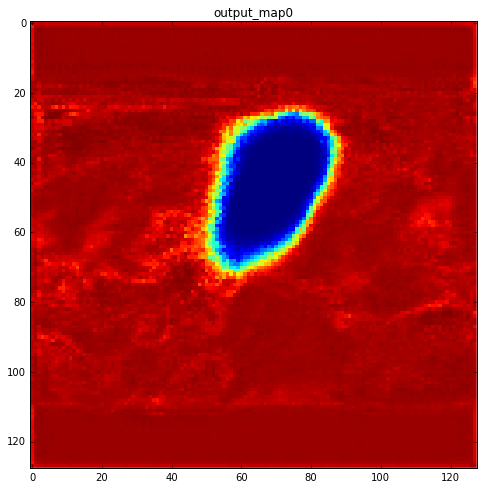

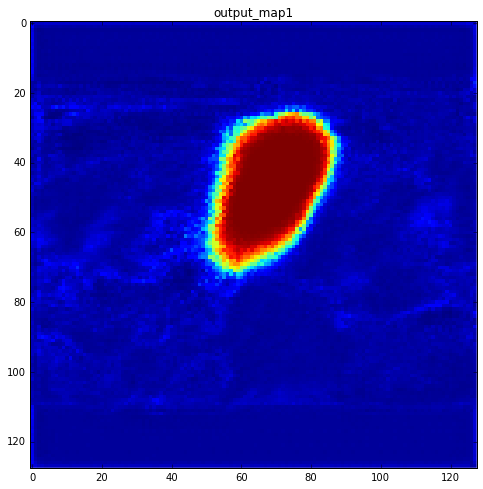

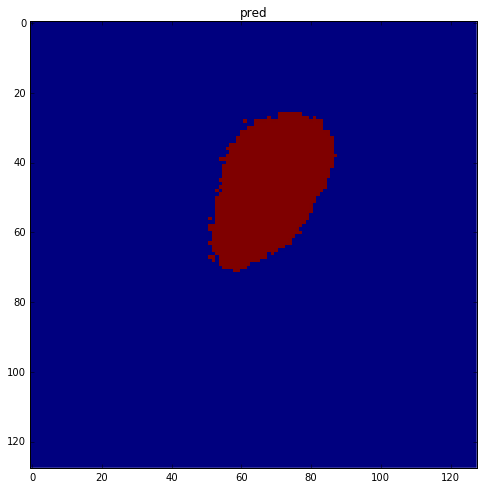

map0 max: 0.991986691952, map1 max: 0.999999940395, pred max: 1


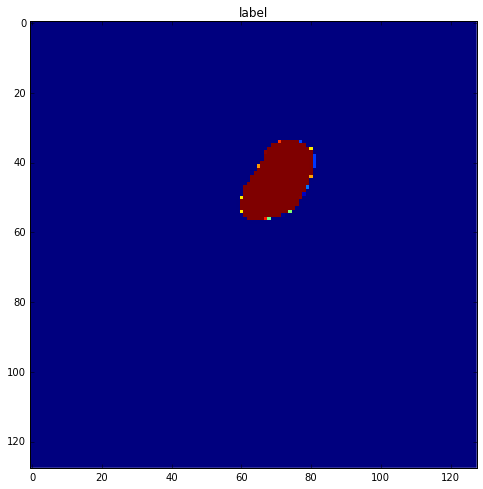

No label, skipping 30_99
No label, skipping 39_86
No label, skipping 30_92
No label, skipping 30_93
No label, skipping 30_90
No label, skipping 30_91
No label, skipping 30_97
No label, skipping 30_94
No label, skipping 30_95
No label, skipping 39_87
step: 4605, loss: 0.00245429947972, dice: [ 0.41373771]
No label, skipping 41_47
step: 4610, loss: 0.00219595083036, dice: [ 0.49600056]
No label, skipping 11_29
No label, skipping 6_120
No label, skipping 40_106
No label, skipping 40_107
No label, skipping 40_104
No label, skipping 40_105
No label, skipping 40_102
No label, skipping 40_103
No label, skipping 40_100
No label, skipping 40_101
No label, skipping 40_108
No label, skipping 40_109
No label, skipping 19_42
No label, skipping 38_12
No label, skipping 19_49
step: 4615, loss: 0.00308151403442, dice: [ 0.39223912]
No label, skipping 15_23
No label, skipping 15_21
step: 4620, loss: 0.00137098610867, dice: [ 0.62553275]
No label, skipping 39_88
No label, skipping 39_89
No label, skippi

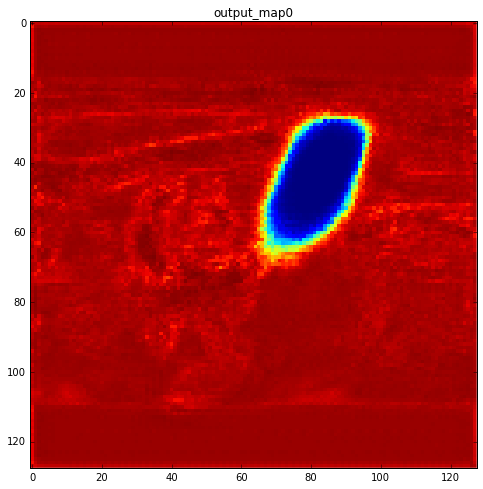

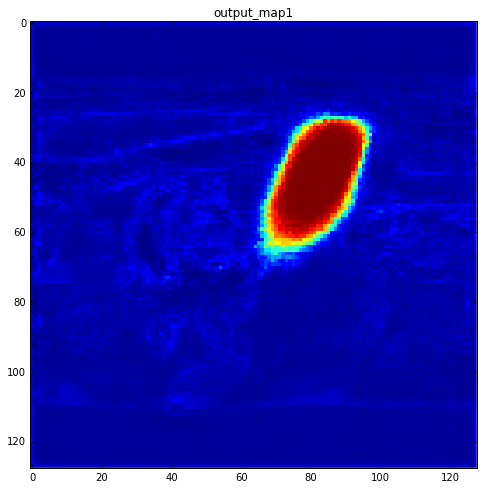

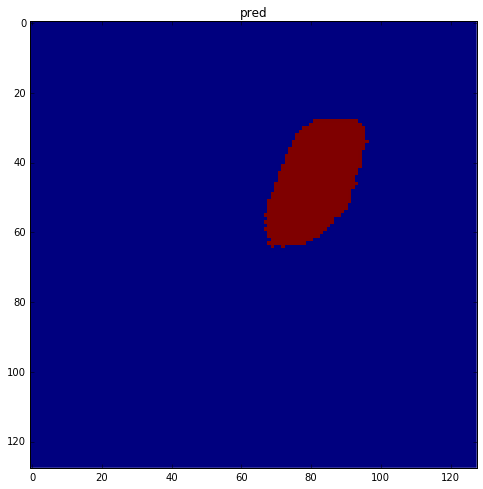

map0 max: 0.993665456772, map1 max: 0.999984264374, pred max: 1


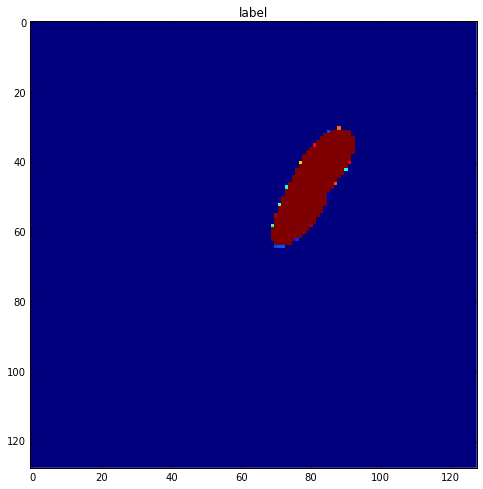

No label, skipping 41_60
No label, skipping 6_103
No label, skipping 6_102
No label, skipping 6_100
No label, skipping 6_107
No label, skipping 6_106
No label, skipping 6_105
No label, skipping 6_104
No label, skipping 6_109
No label, skipping 40_120
No label, skipping 45_120
No label, skipping 11_118
step: 4705, loss: 0.00343206804246, dice: [ 0.49432424]
No label, skipping 11_111
No label, skipping 11_110
No label, skipping 11_116
No label, skipping 14_18
No label, skipping 14_19
No label, skipping 14_10
No label, skipping 14_11
No label, skipping 14_12
No label, skipping 14_13
step: 4710, loss: 0.00757987145334, dice: [ 0.49280015]
No label, skipping 14_15
No label, skipping 14_16
No label, skipping 14_17
No label, skipping 41_104
step: 4715, loss: 0.00156060536392, dice: [ 0.66641521]
No label, skipping 33_19
No label, skipping 29_120
step: 4720, loss: 0.00206397823058, dice: [ 0.58741266]
No label, skipping 6_74
No label, skipping 6_75
No label, skipping 6_76
No label, skipping 6_

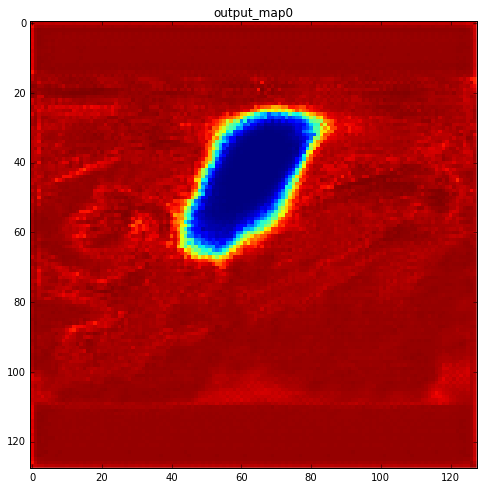

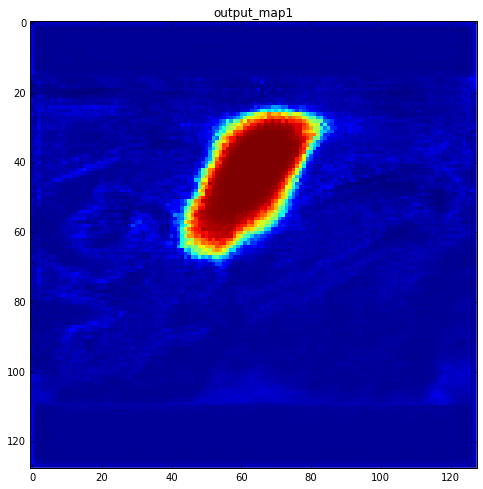

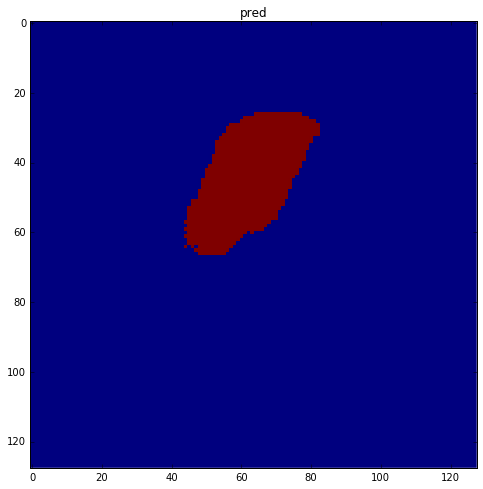

map0 max: 0.992257416248, map1 max: 0.999969780445, pred max: 1


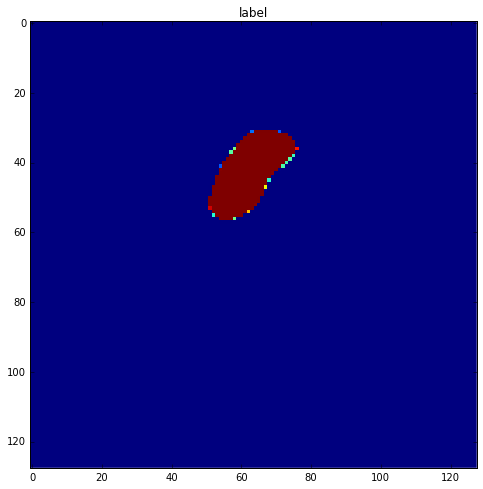

No label, skipping 24_66
No label, skipping 24_67
No label, skipping 24_68
step: 4805, loss: 0.0013848397648, dice: [ 0.54542559]
No label, skipping 26_22
step: 4810, loss: 0.00164266349748, dice: [ 0.63913882]
No label, skipping 26_25
No label, skipping 26_27
No label, skipping 16_108
No label, skipping 16_102
step: 4815, loss: 0.00211117323488, dice: [ 0.46225277]
step: 4820, loss: 0.00188971776515, dice: [ 0.45229021]
No label, skipping 30_76
No label, skipping 30_77
No label, skipping 30_70
No label, skipping 30_71
No label, skipping 30_72
No label, skipping 30_73
No label, skipping 30_78
step: 4825, loss: 0.00192828208674, dice: [ 0.44356498]
No label, skipping 5_49
No label, skipping 5_40
No label, skipping 5_41
No label, skipping 5_43
No label, skipping 5_45
No label, skipping 5_46
No label, skipping 39_64
No label, skipping 39_65
No label, skipping 39_66
No label, skipping 39_67
No label, skipping 39_60
No label, skipping 39_61
No label, skipping 39_62
No label, skipping 39_63


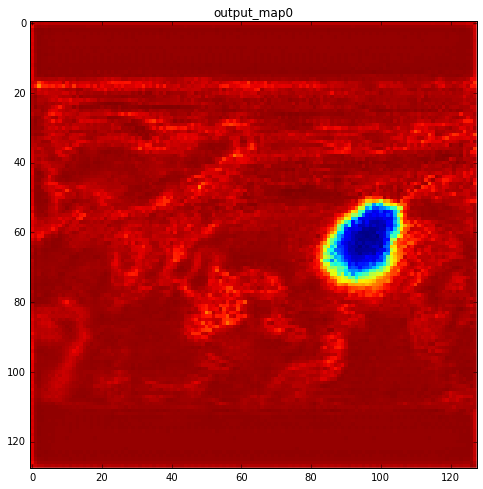

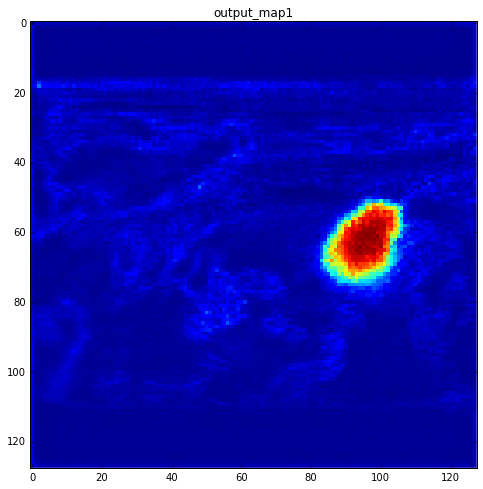

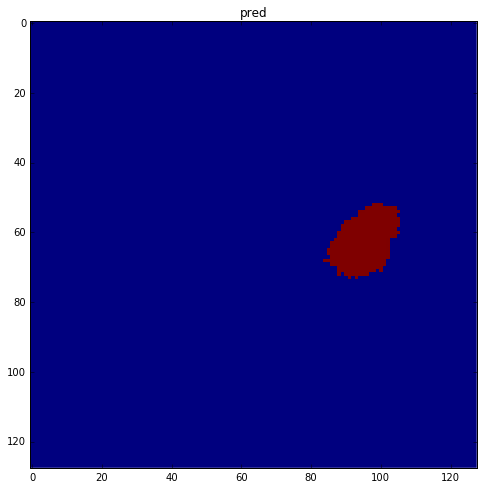

map0 max: 0.994579851627, map1 max: 0.971218109131, pred max: 1


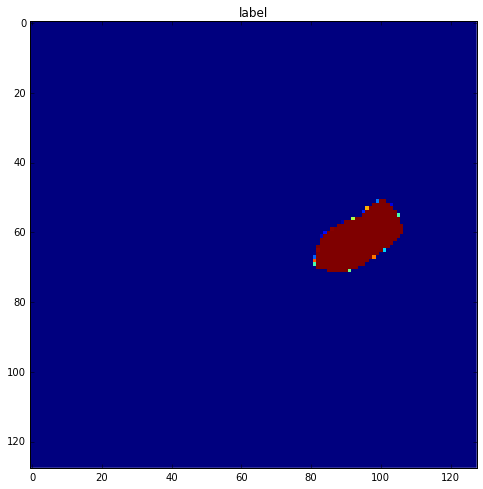

No label, skipping 45_53
No label, skipping 45_51
No label, skipping 23_109
No label, skipping 23_106
step: 4905, loss: 0.00217495998368, dice: [ 0.46175581]
No label, skipping 23_103
step: 4910, loss: 0.00271855364554, dice: [ 0.61419058]
No label, skipping 6_17
No label, skipping 6_14
No label, skipping 6_15
No label, skipping 6_10
No label, skipping 6_11
No label, skipping 6_18
No label, skipping 6_19
No label, skipping 3_119
No label, skipping 3_118
step: 4915, loss: 0.00225968239829, dice: [ 0.40909919]
No label, skipping 3_116
No label, skipping 3_110
No label, skipping 3_112
No label, skipping 12_44
No label, skipping 12_47
No label, skipping 12_46
No label, skipping 12_40
No label, skipping 12_43
step: 4920, loss: 0.00958644226193, dice: [ 0.74845159]
No label, skipping 12_49
No label, skipping 12_48
No label, skipping 38_120
No label, skipping 22_68
No label, skipping 22_69
No label, skipping 22_60
No label, skipping 22_61
No label, skipping 22_63
No label, skipping 22_64
No l

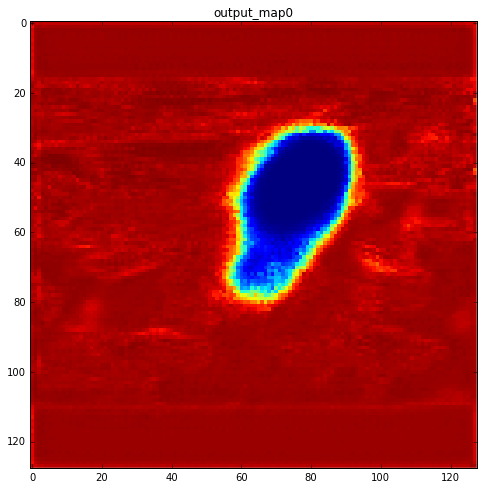

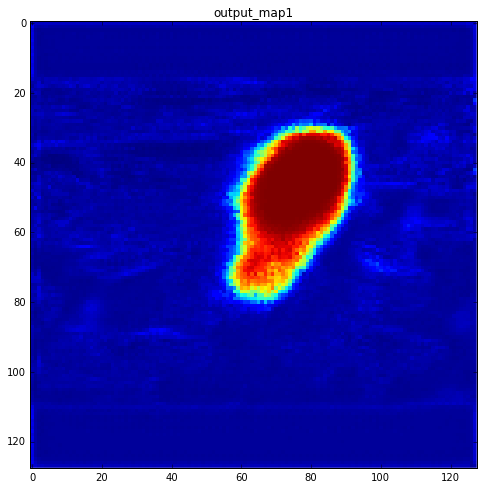

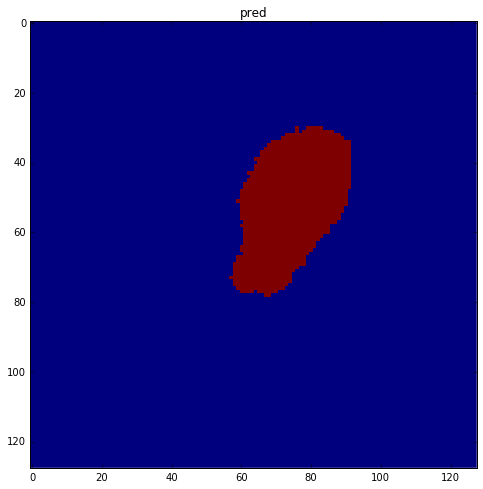

map0 max: 0.995261609554, map1 max: 0.999993383884, pred max: 1


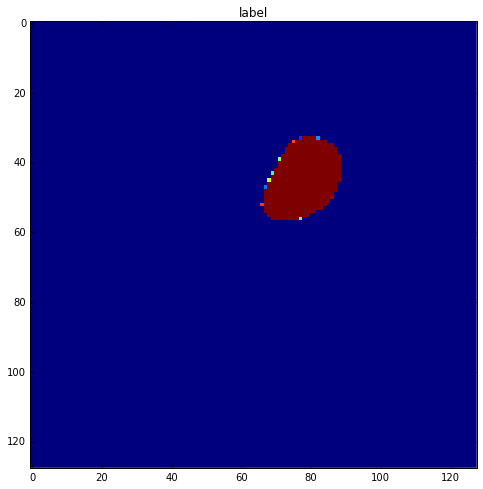

No label, skipping 19_39
No label, skipping 1_59
No label, skipping 1_58
No label, skipping 2_120
No label, skipping 40_28
No label, skipping 40_29
No label, skipping 40_24
No label, skipping 40_25
No label, skipping 40_26
No label, skipping 40_27
No label, skipping 40_21
No label, skipping 40_22
No label, skipping 40_23
No label, skipping 45_12
No label, skipping 45_13
No label, skipping 45_10
No label, skipping 45_11
No label, skipping 45_16
No label, skipping 45_17
No label, skipping 45_14
No label, skipping 45_15
No label, skipping 45_18
No label, skipping 9_88
No label, skipping 9_89
step: 5005, loss: 0.00194160966203, dice: [ 0.69542927]
No label, skipping 9_81
No label, skipping 9_82
No label, skipping 9_83
No label, skipping 9_84
No label, skipping 9_87
step: 5010, loss: 0.00260813254863, dice: [ 0.61966729]
No label, skipping 37_110
step: 5015, loss: 0.00207922747359, dice: [ 0.50048339]
No label, skipping 22_108
No label, skipping 22_109
No label, skipping 22_104
No label, sk

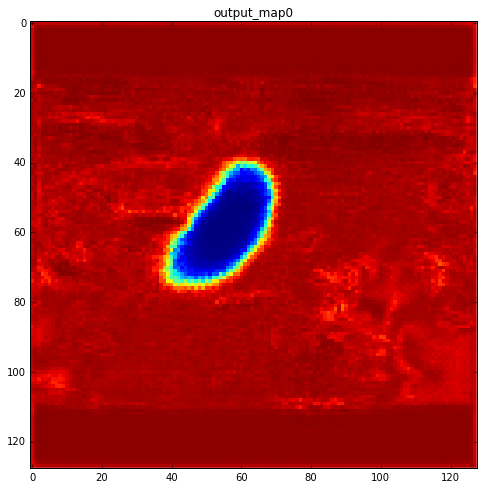

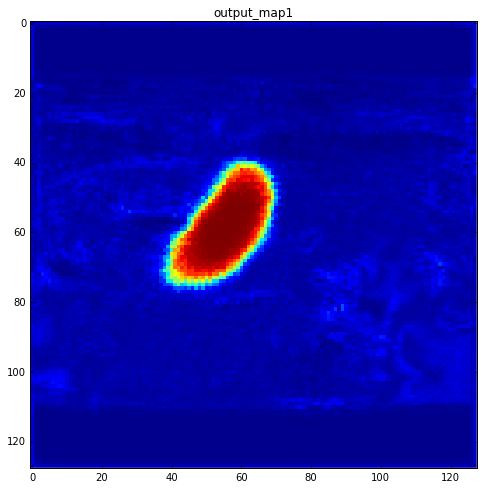

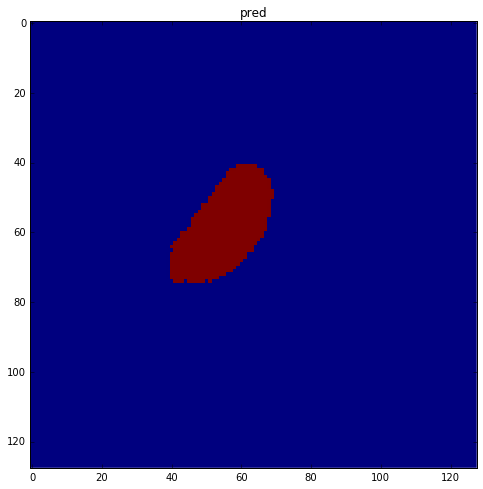

map0 max: 0.993134200573, map1 max: 0.998421251774, pred max: 1


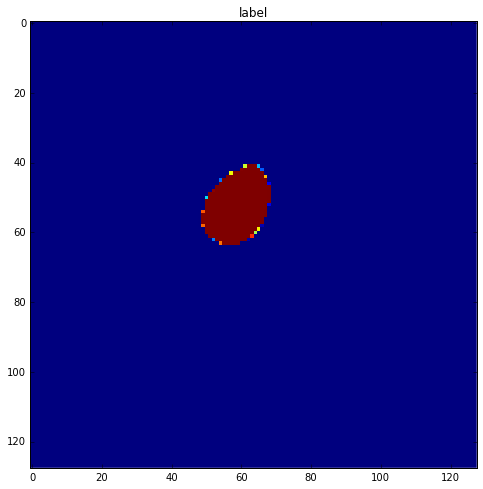

No label, skipping 10_67
No label, skipping 10_66
No label, skipping 37_80
step: 5105, loss: 0.00211221678182, dice: [ 0.5400452]
No label, skipping 37_87
No label, skipping 22_120
No label, skipping 12_27
No label, skipping 12_26
No label, skipping 12_25
No label, skipping 12_23
step: 5110, loss: 0.00147486559581, dice: [ 0.58640635]
No label, skipping 12_20
No label, skipping 12_29
No label, skipping 12_28
No label, skipping 8_69
No label, skipping 8_68
No label, skipping 8_65
No label, skipping 8_64
No label, skipping 8_67
No label, skipping 8_61
No label, skipping 8_60
No label, skipping 8_63
No label, skipping 8_62
No label, skipping 38_118
No label, skipping 35_98
No label, skipping 40_99
No label, skipping 18_120
No label, skipping 35_94
No label, skipping 35_97
No label, skipping 20_102
step: 5115, loss: 0.00787147227675, dice: [ 0.77811801]
No label, skipping 20_105
No label, skipping 20_107
No label, skipping 20_108
No label, skipping 20_109
No label, skipping 38_112
No label

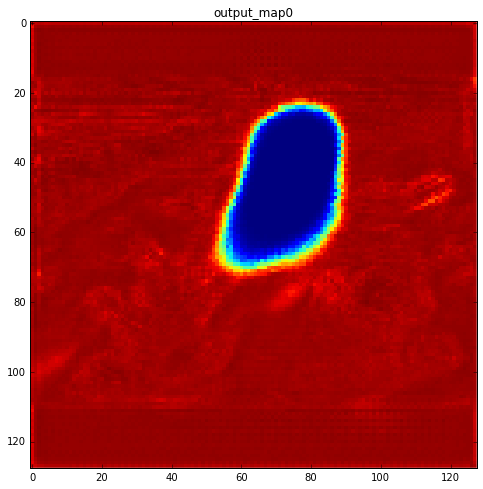

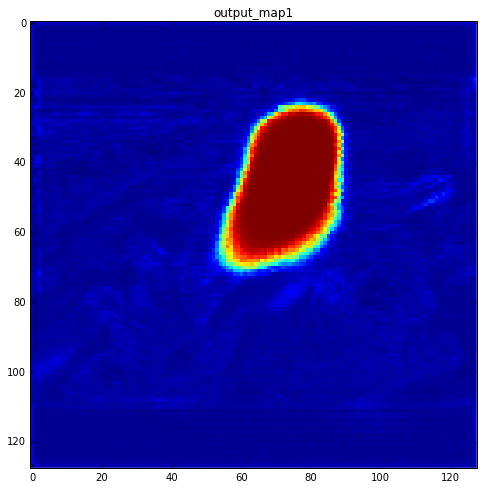

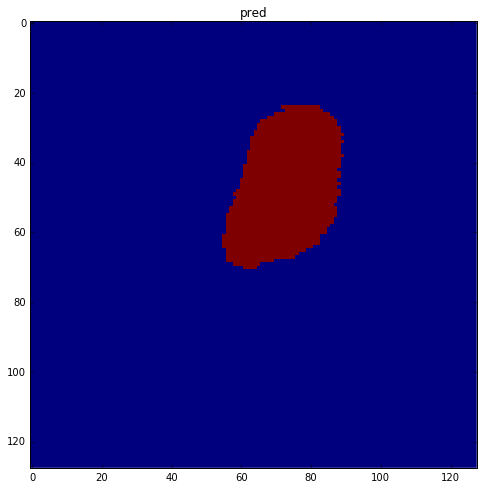

map0 max: 0.991609692574, map1 max: 1.0, pred max: 1


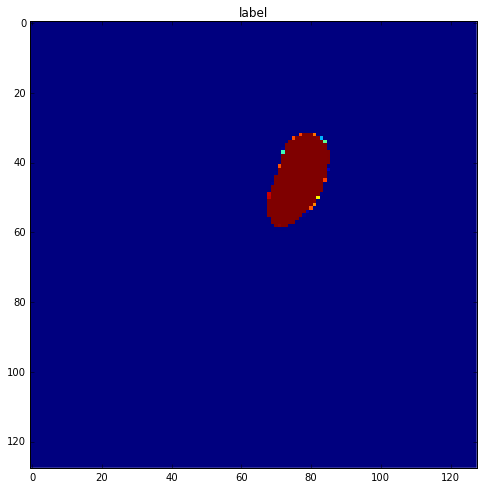

No label, skipping 44_54
No label, skipping 44_51
step: 5205, loss: 0.00457778945565, dice: [ 0.87749243]
No label, skipping 44_59
No label, skipping 8_112
No label, skipping 8_113
No label, skipping 8_111
No label, skipping 8_116
No label, skipping 8_114
No label, skipping 8_115
No label, skipping 8_118
No label, skipping 8_119
No label, skipping 18_38
step: 5210, loss: 0.0549989677966, dice: [ 0.00348842]
No label, skipping 18_37
No label, skipping 18_32
No label, skipping 18_33
No label, skipping 18_30
No label, skipping 18_31
No label, skipping 28_117
No label, skipping 28_116
step: 5215, loss: 0.00248372694477, dice: [ 0.43199545]
No label, skipping 28_112
No label, skipping 28_118
No label, skipping 47_98
No label, skipping 47_99
No label, skipping 47_94
No label, skipping 47_95
No label, skipping 47_96
No label, skipping 47_97
No label, skipping 47_90
step: 5220, loss: 0.0457219406962, dice: [ 0.00319137]
No label, skipping 47_92
No label, skipping 47_93
No label, skipping 17_10

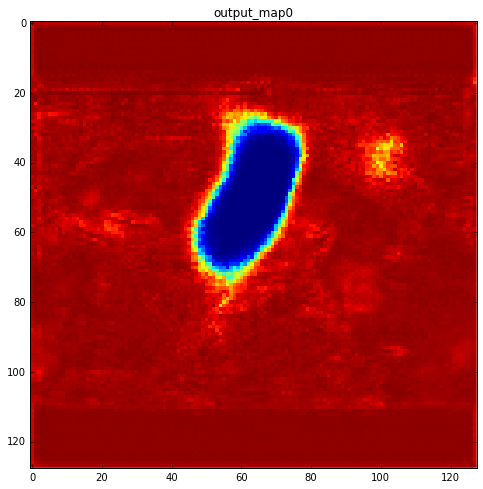

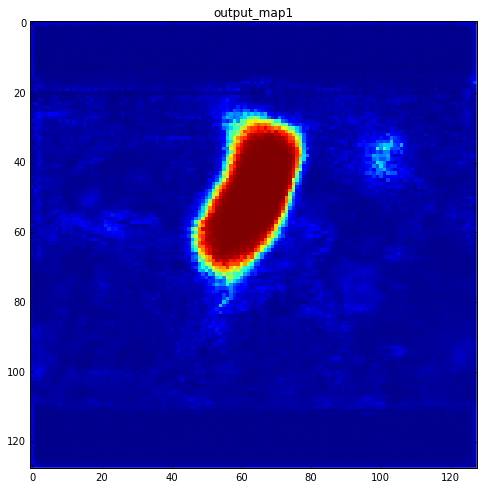

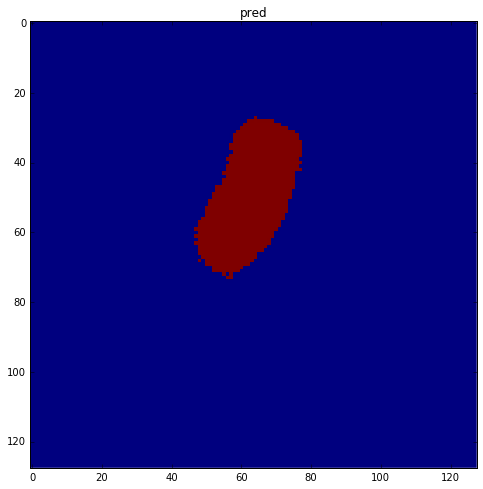

map0 max: 0.991221904755, map1 max: 0.999998569489, pred max: 1


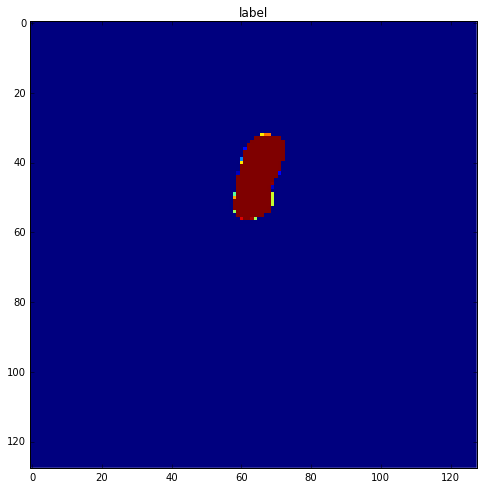

No label, skipping 23_26
step: 5305, loss: 0.00262251496315, dice: [ 0.46739131]
No label, skipping 23_28
No label, skipping 25_69
No label, skipping 25_68
No label, skipping 25_60
No label, skipping 25_63
No label, skipping 25_62
No label, skipping 25_65
No label, skipping 25_64
No label, skipping 25_66
step: 5310, loss: 0.00134453154169, dice: [ 0.77046204]
step: 5315, loss: 0.00185390398838, dice: [ 0.79041076]
No label, skipping 42_87
No label, skipping 42_88
No label, skipping 26_119
No label, skipping 26_118
No label, skipping 26_113
step: 5320, loss: 0.0011726327939, dice: [ 0.64828897]
No label, skipping 26_114
No label, skipping 26_117
No label, skipping 26_116
No label, skipping 27_25
No label, skipping 27_24
No label, skipping 27_23
No label, skipping 27_22
No label, skipping 27_20
No label, skipping 27_29
No label, skipping 27_28
No label, skipping 1_62
step: 5325, loss: 0.00321562285535, dice: [ 0.52651322]
No label, skipping 19_24
No label, skipping 1_64
No label, skippin

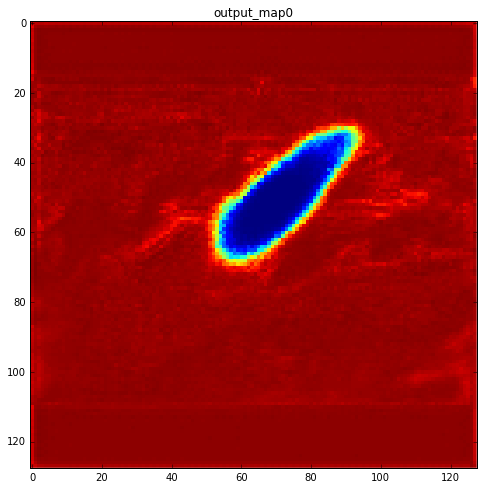

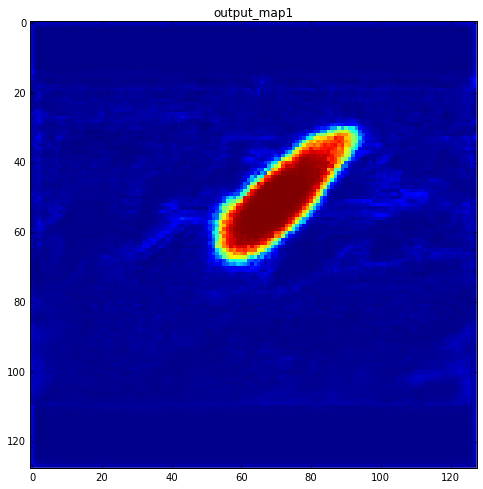

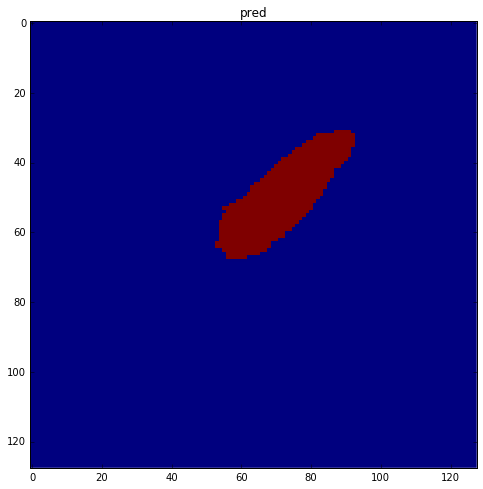

map0 max: 0.987213730812, map1 max: 0.999801576138, pred max: 1


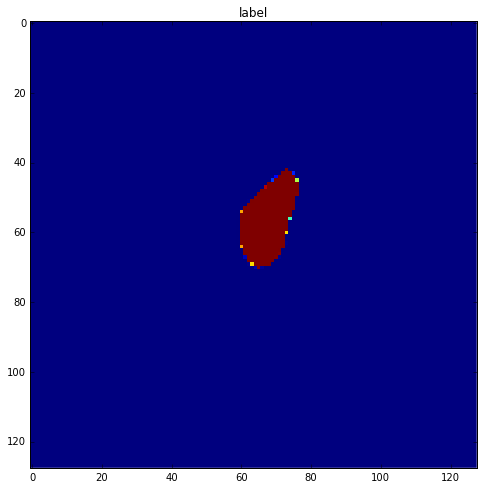

No label, skipping 35_102
No label, skipping 35_101
No label, skipping 35_108
step: 5405, loss: 0.0051712365821, dice: [ 0.8409391]
No label, skipping 35_81
No label, skipping 16_14
No label, skipping 18_72
No label, skipping 18_73
No label, skipping 18_70
No label, skipping 18_71
No label, skipping 18_76
No label, skipping 18_77
No label, skipping 18_74
No label, skipping 18_75
No label, skipping 18_78
No label, skipping 18_79
No label, skipping 23_40
step: 5410, loss: 0.00120792596135, dice: [ 0.65561032]
No label, skipping 23_45
No label, skipping 16_18
step: 5415, loss: 0.00160520605277, dice: [ 0.59982824]
step: 5420, loss: 0.00166996568441, dice: [ 0.50242549]
No label, skipping 42_63
No label, skipping 25_47
No label, skipping 25_46
No label, skipping 25_45
step: 5425, loss: 0.00715663144365, dice: [ 0.81082386]
No label, skipping 25_42
No label, skipping 25_41
No label, skipping 25_40
No label, skipping 25_49
No label, skipping 17_95
No label, skipping 17_94
No label, skipping 

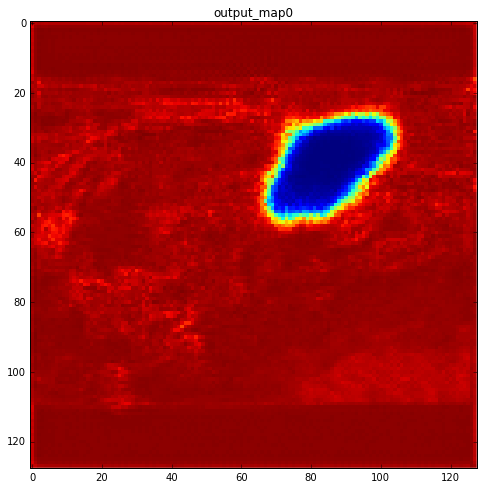

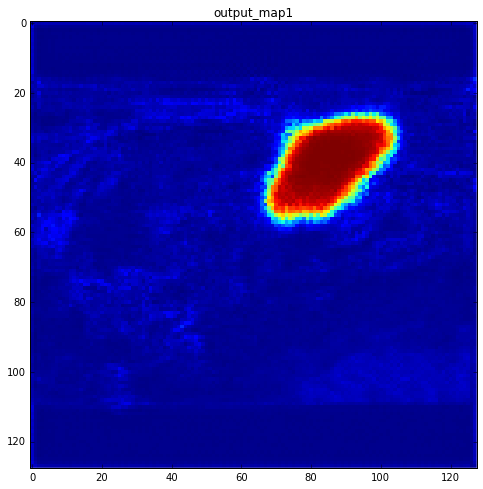

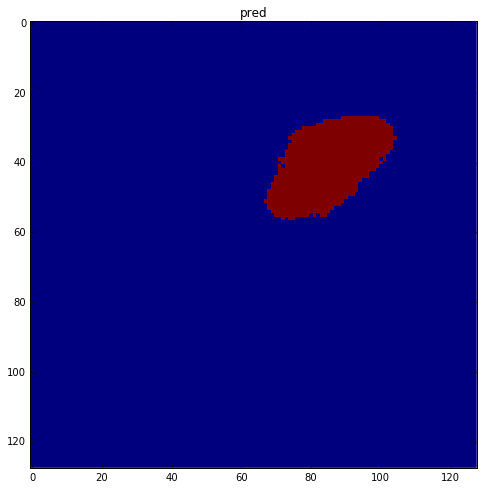

map0 max: 0.990295529366, map1 max: 0.998170375824, pred max: 1


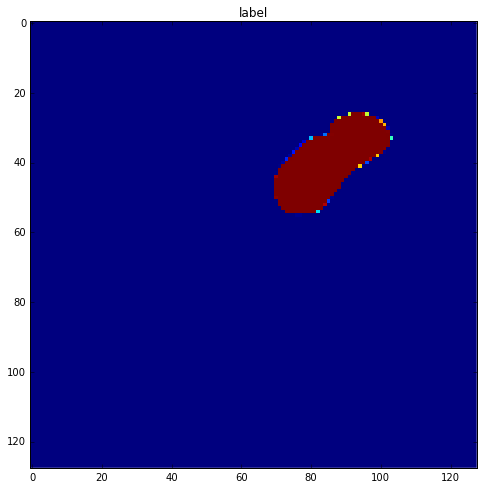

No label, skipping 17_20
No label, skipping 43_73
No label, skipping 17_22
No label, skipping 17_23
No label, skipping 30_120
No label, skipping 18_50
step: 5505, loss: 0.00608540698886, dice: [ 0.8314212]
No label, skipping 18_56
No label, skipping 18_57
No label, skipping 23_66
step: 5510, loss: 0.00265105837025, dice: [ 0.52340186]
No label, skipping 23_62
step: 5515, loss: 0.00174066494219, dice: [ 0.51999402]
No label, skipping 23_68
No label, skipping 47_38
No label, skipping 47_34
No label, skipping 47_32
No label, skipping 47_33
No label, skipping 47_30
No label, skipping 47_31
step: 5520, loss: 0.00202582217753, dice: [ 0.5138697]
step: 5525, loss: 0.00204254221171, dice: [ 0.49493501]
No label, skipping 42_43
No label, skipping 42_48
No label, skipping 15_75
No label, skipping 15_74
No label, skipping 15_76
No label, skipping 15_71
No label, skipping 15_70
No label, skipping 15_72
step: 5530, loss: 0.00190621521324, dice: [ 0.65191883]
No label, skipping 40_5
No label, skippi

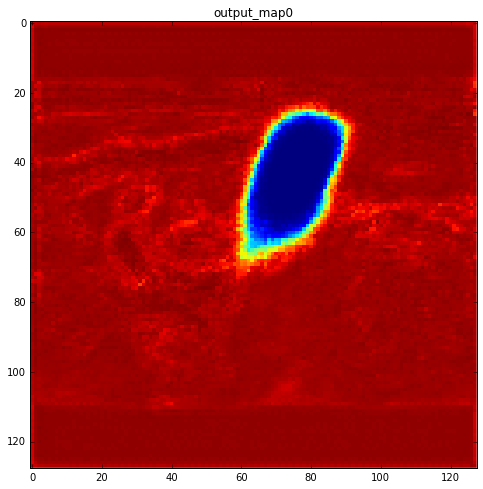

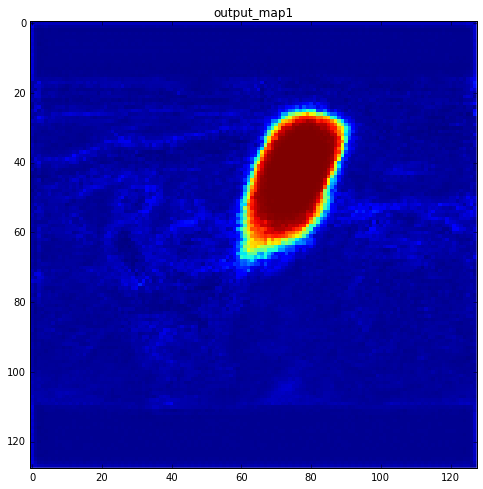

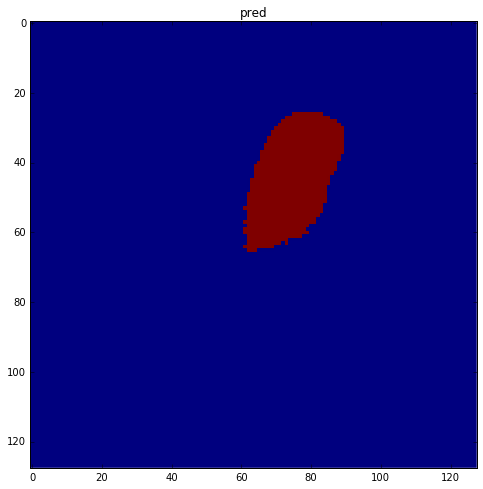

map0 max: 0.993782937527, map1 max: 0.999998092651, pred max: 1


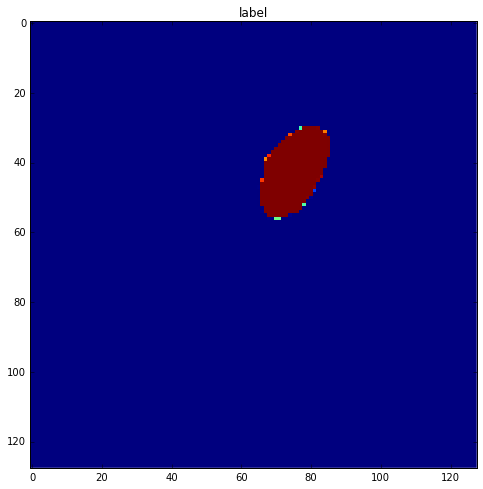

No label, skipping 41_11
step: 5605, loss: 0.00128470908385, dice: [ 0.56606114]
step: 5610, loss: 0.00120044406503, dice: [ 0.76900649]
No label, skipping 15_53
No label, skipping 15_52
step: 5615, loss: 0.0030022743158, dice: [ 0.44876459]
step: 5620, loss: 0.00384435942397, dice: [ 0.78805542]
No label, skipping 47_14
No label, skipping 47_15
No label, skipping 25_88
No label, skipping 47_11
step: 5625, loss: 0.00118620181456, dice: [ 0.55906951]
No label, skipping 25_82
No label, skipping 25_81
No label, skipping 25_80
No label, skipping 47_19
No label, skipping 25_85
No label, skipping 27_81
No label, skipping 27_80
No label, skipping 27_83
No label, skipping 27_82
No label, skipping 27_85
No label, skipping 27_84
No label, skipping 27_87
No label, skipping 27_86
No label, skipping 27_89
No label, skipping 27_88
No label, skipping 14_49
No label, skipping 14_48
No label, skipping 14_43
No label, skipping 14_40
step: 5630, loss: 0.00330366846174, dice: [ 0.45822623]
No label, skipp

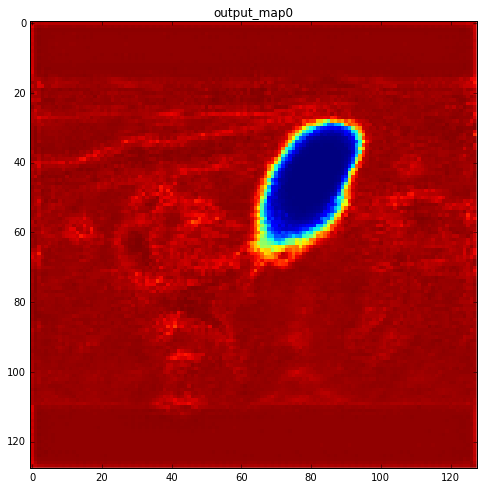

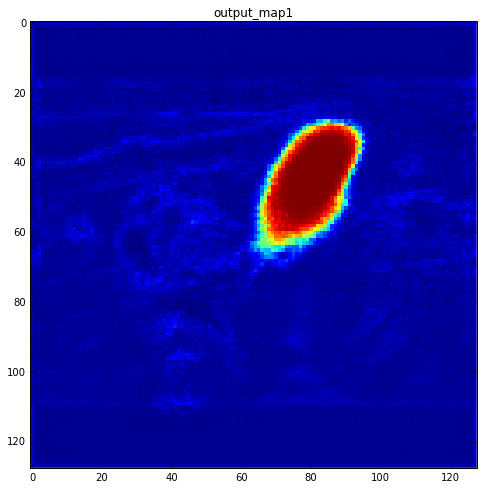

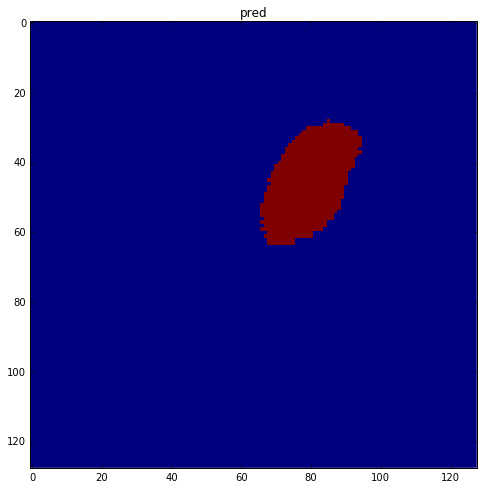

map0 max: 0.991914629936, map1 max: 0.999940276146, pred max: 1


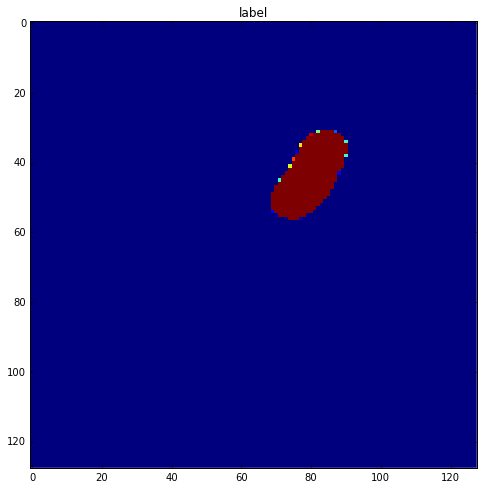

No label, skipping 1_6
No label, skipping 1_5
step: 5705, loss: 0.00128742563538, dice: [ 0.71965373]
No label, skipping 1_9
No label, skipping 1_8
No label, skipping 33_57
No label, skipping 10_108
No label, skipping 2_71
No label, skipping 10_105
No label, skipping 10_107
No label, skipping 10_106
No label, skipping 10_101
No label, skipping 33_55
No label, skipping 10_103
No label, skipping 10_102
No label, skipping 33_54
No label, skipping 2_74
step: 5710, loss: 0.00126917543821, dice: [ 0.63537186]
No label, skipping 2_76
No label, skipping 21_101
No label, skipping 21_100
No label, skipping 21_103
No label, skipping 21_102
No label, skipping 21_105
No label, skipping 21_104
No label, skipping 21_107
No label, skipping 21_106
No label, skipping 21_108
No label, skipping 15_39
step: 5715, loss: 0.00243926886469, dice: [ 0.47379643]
No label, skipping 15_35
No label, skipping 15_34
No label, skipping 47_72
No label, skipping 47_73
No label, skipping 47_70
No label, skipping 47_71
st

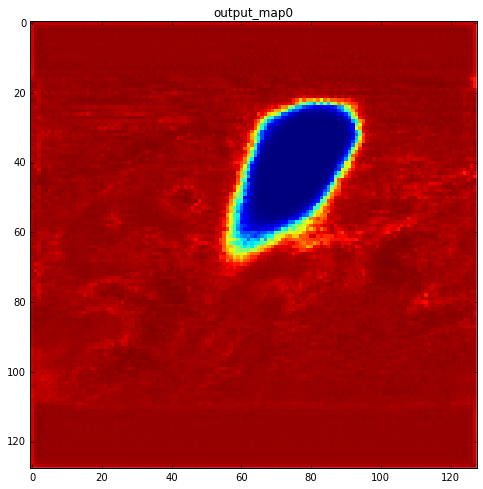

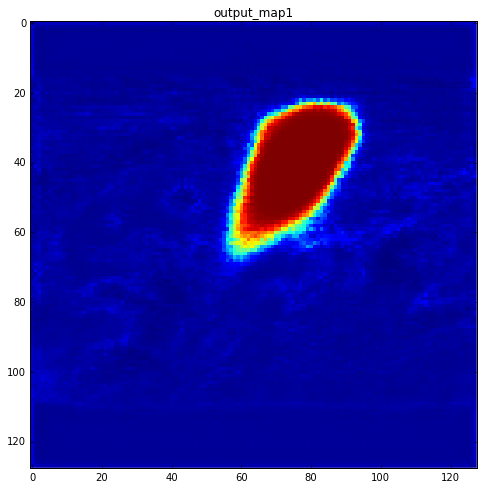

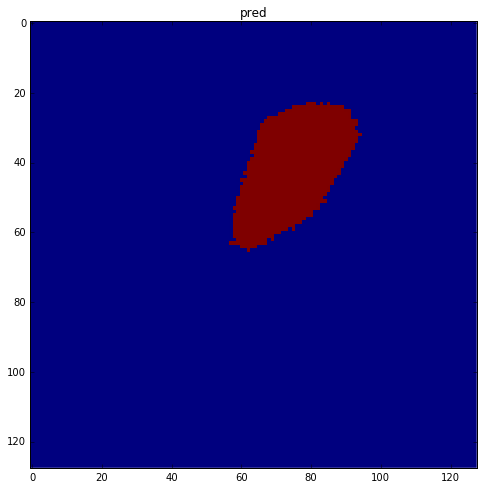

map0 max: 0.996427059174, map1 max: 1.0, pred max: 1


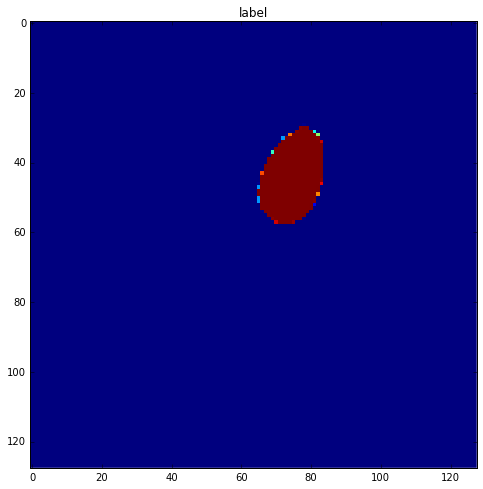

No label, skipping 44_93
No label, skipping 44_92
No label, skipping 44_94
No label, skipping 44_96
No label, skipping 44_99
No label, skipping 40_92
No label, skipping 12_112
No label, skipping 43_42
No label, skipping 43_41
step: 5805, loss: 0.00165529549122, dice: [ 0.74378818]
No label, skipping 43_46
No label, skipping 43_45
No label, skipping 43_44
step: 5810, loss: 0.00172735739034, dice: [ 0.50987637]
No label, skipping 41_57
step: 5815, loss: 0.00154712761287, dice: [ 0.80936515]
No label, skipping 10_120
No label, skipping 40_115
No label, skipping 40_114
No label, skipping 40_117
No label, skipping 40_116
No label, skipping 40_111
No label, skipping 40_110
No label, skipping 40_113
No label, skipping 40_112
No label, skipping 40_119
No label, skipping 40_118
No label, skipping 21_120
No label, skipping 15_17
No label, skipping 15_15
No label, skipping 15_11
No label, skipping 15_10
step: 5820, loss: 0.00176270492375, dice: [ 0.59991771]
No label, skipping 47_59
No label, ski

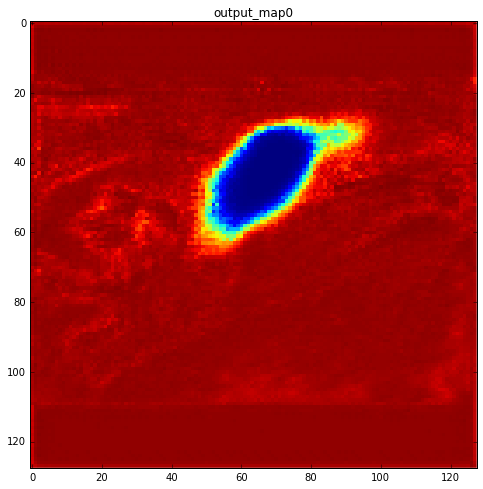

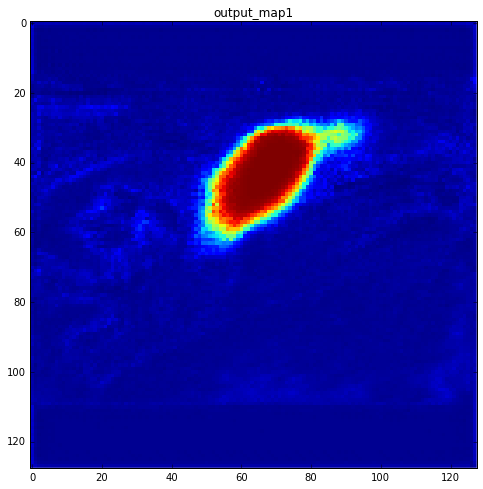

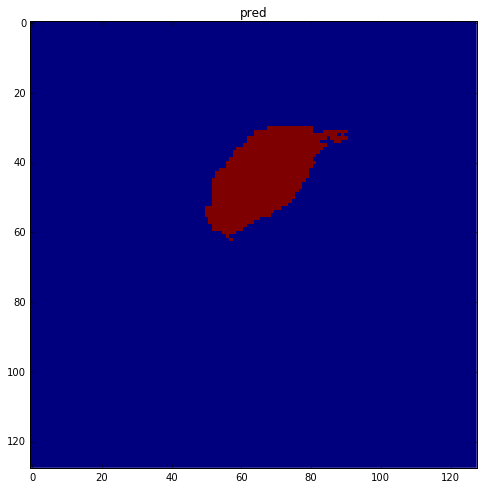

map0 max: 0.993267834187, map1 max: 0.999849438667, pred max: 1


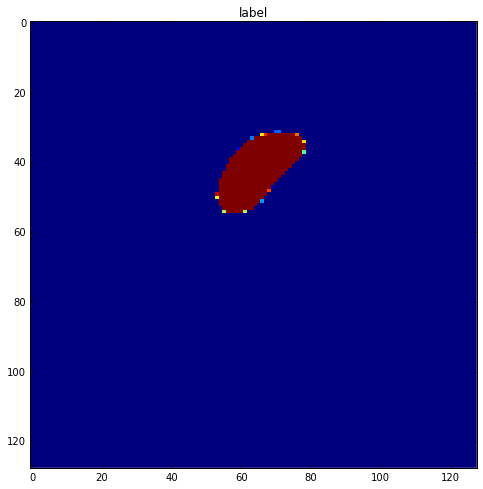

No label, skipping 24_11
No label, skipping 24_10
No label, skipping 24_15
No label, skipping 24_14
No label, skipping 3_88
No label, skipping 3_89
No label, skipping 3_82
No label, skipping 3_83
No label, skipping 3_80
No label, skipping 3_86
No label, skipping 3_87
No label, skipping 3_85
No label, skipping 26_11
No label, skipping 26_10
No label, skipping 26_13
No label, skipping 26_12
No label, skipping 26_15
No label, skipping 26_14
step: 5905, loss: 0.00137443817221, dice: [ 0.56196868]
No label, skipping 36_65
No label, skipping 36_67
step: 5910, loss: 0.00177056004759, dice: [ 0.47266731]
No label, skipping 36_61
No label, skipping 36_63
No label, skipping 36_62
No label, skipping 30_49
No label, skipping 30_48
No label, skipping 30_45
No label, skipping 30_44
No label, skipping 30_47
No label, skipping 30_46
No label, skipping 30_41
No label, skipping 30_40
No label, skipping 30_43
No label, skipping 30_42
No label, skipping 43_108
No label, skipping 43_101
No label, skipping 

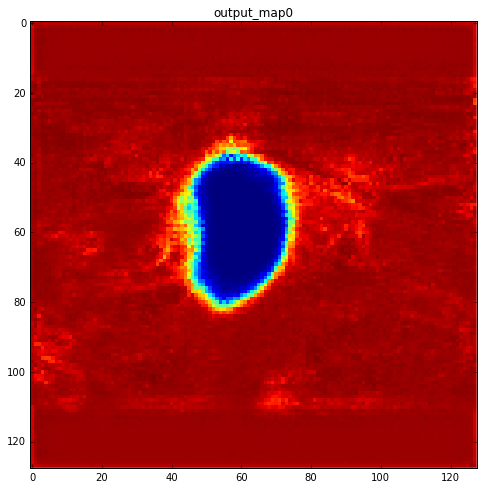

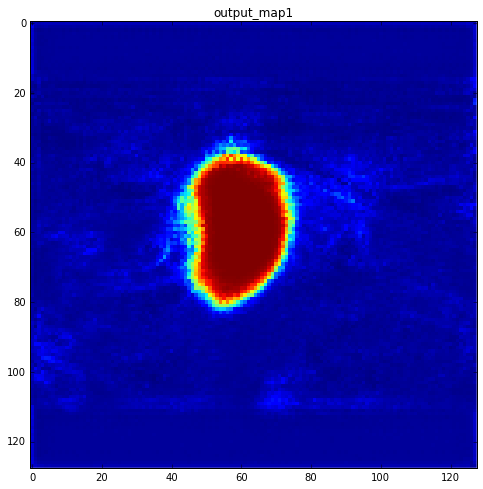

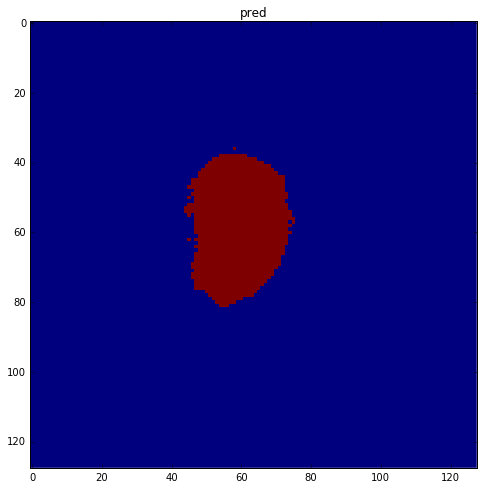

map0 max: 0.996204733849, map1 max: 0.999996960163, pred max: 1


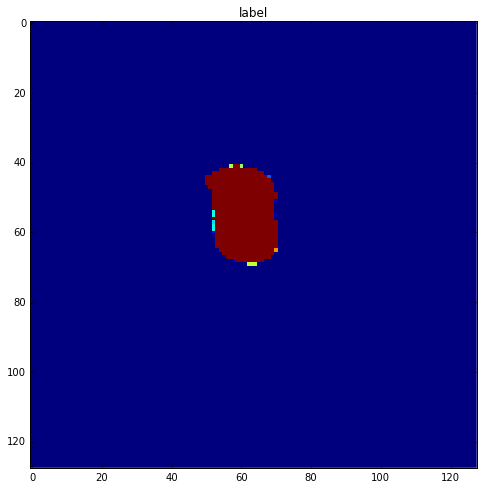

No label, skipping 2_65
No label, skipping 2_64
step: 6005, loss: 0.00201058923267, dice: [ 0.51260644]
No label, skipping 34_81
No label, skipping 34_88
No label, skipping 39_79
No label, skipping 39_78
No label, skipping 25_118
No label, skipping 25_119
No label, skipping 39_73
step: 6010, loss: 0.00767642445862, dice: [ 0.81953722]
No label, skipping 25_114
No label, skipping 39_70
No label, skipping 25_112
No label, skipping 25_113
No label, skipping 25_110
No label, skipping 7_84
step: 6015, loss: 0.00211743498221, dice: [ 0.57662928]
No label, skipping 7_88
No label, skipping 7_89
No label, skipping 17_51
No label, skipping 17_50
No label, skipping 17_53
No label, skipping 17_55
step: 6020, loss: 0.00285488343798, dice: [ 0.37724179]
No label, skipping 17_56
No label, skipping 17_59
No label, skipping 43_48
No label, skipping 3_3
No label, skipping 8_80
No label, skipping 8_87
step: 6025, loss: 0.00255362316966, dice: [ 0.42859024]
No label, skipping 11_58
No label, skipping 11_5

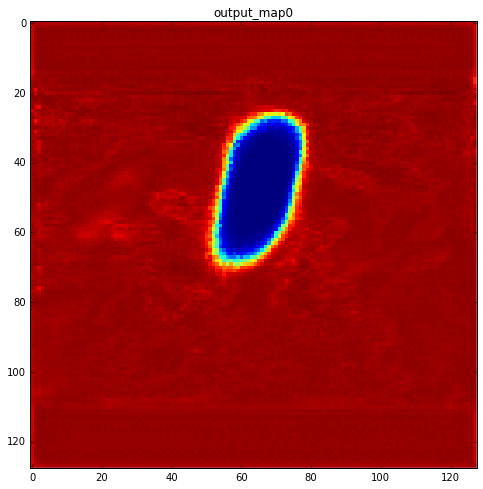

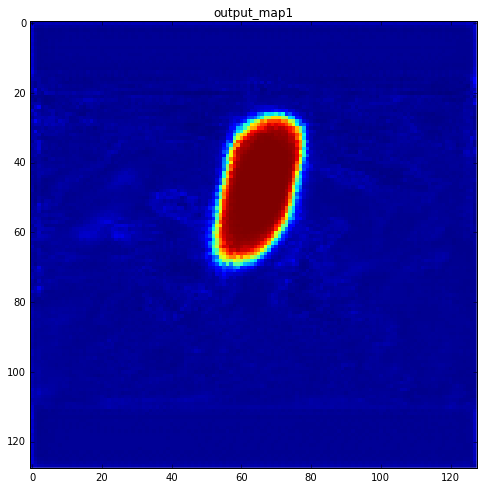

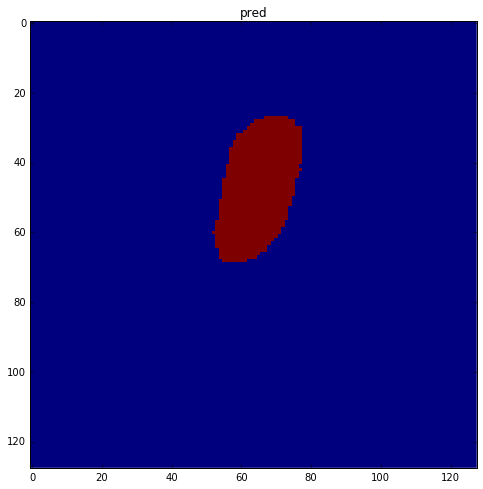

map0 max: 0.993947684765, map1 max: 0.99999243021, pred max: 1


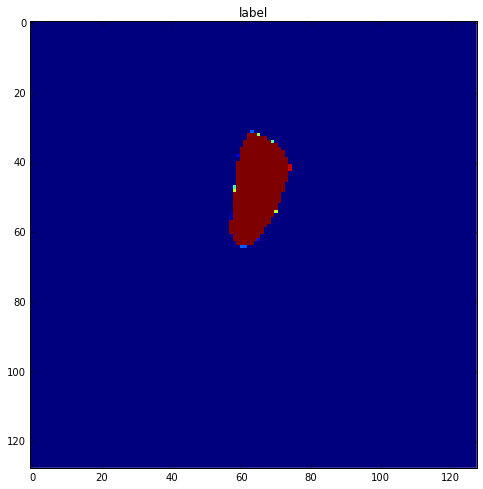

No label, skipping 6_28
No label, skipping 6_23
No label, skipping 6_22
No label, skipping 6_21
No label, skipping 6_20
No label, skipping 6_27
No label, skipping 6_26
No label, skipping 6_25
No label, skipping 5_104
step: 6105, loss: 0.00388106005266, dice: [ 0.46109411]
No label, skipping 5_101
No label, skipping 5_102
No label, skipping 46_120
No label, skipping 5_103
No label, skipping 4_69
No label, skipping 4_68
No label, skipping 4_61
No label, skipping 4_60
No label, skipping 4_62
No label, skipping 4_65
No label, skipping 4_64
No label, skipping 4_67
No label, skipping 4_66
No label, skipping 22_79
No label, skipping 22_78
No label, skipping 22_77
No label, skipping 22_76
No label, skipping 22_75
step: 6110, loss: 0.00301976362243, dice: [ 0.84619772]
No label, skipping 22_73
No label, skipping 22_71
No label, skipping 22_70
No label, skipping 47_16
No label, skipping 47_17
No label, skipping 25_87
No label, skipping 25_86
No label, skipping 35_59
step: 6115, loss: 0.002009694

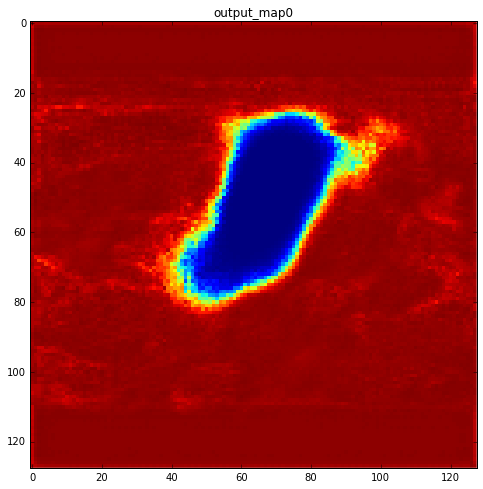

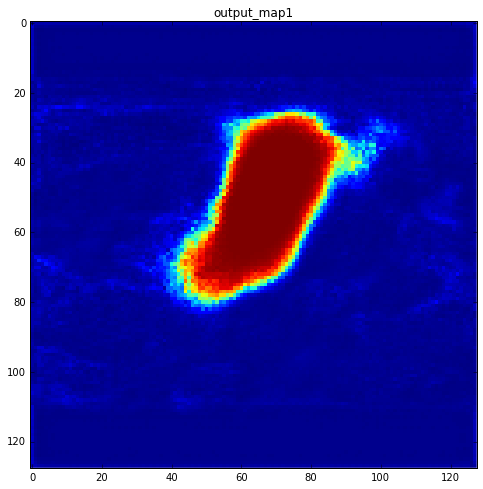

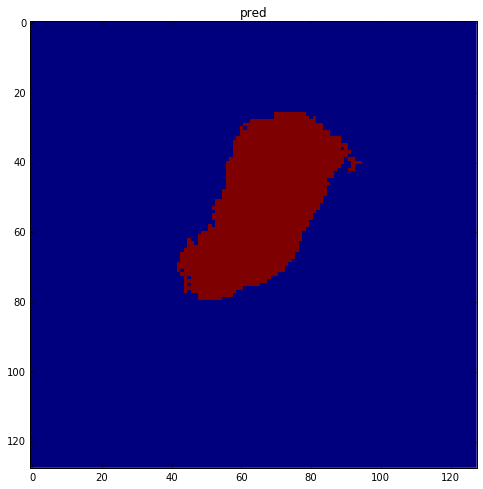

map0 max: 0.989983618259, map1 max: 0.999999880791, pred max: 1


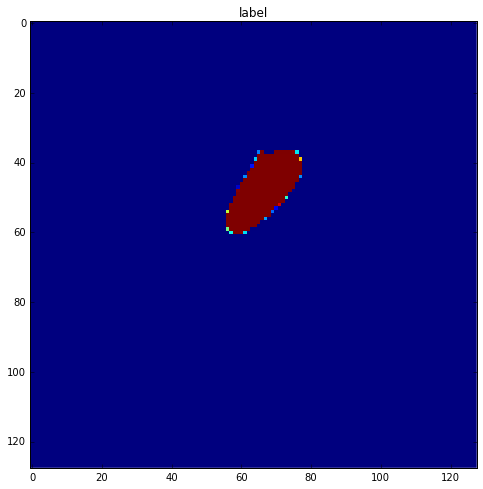

No label, skipping 6_94
No label, skipping 6_95
No label, skipping 6_92
step: 6205, loss: 0.00504652550444, dice: [ 0.80853152]
No label, skipping 37_100
step: 6210, loss: 0.0019766157493, dice: [ 0.58759403]
No label, skipping 37_106
No label, skipping 10_34
step: 6215, loss: 0.00215896824375, dice: [ 0.73142022]
No label, skipping 10_33
No label, skipping 10_39
No label, skipping 29_89
No label, skipping 29_87
No label, skipping 29_86
step: 6220, loss: 0.00262707634829, dice: [ 0.69335467]
No label, skipping 29_83
No label, skipping 29_81
step: 6225, loss: 0.00158866972197, dice: [ 0.56704527]
No label, skipping 1_117
No label, skipping 1_116
No label, skipping 1_115
No label, skipping 1_114
No label, skipping 1_112
No label, skipping 1_110
No label, skipping 12_78
No label, skipping 12_79
No label, skipping 12_74
No label, skipping 12_76
No label, skipping 12_77
step: 6230, loss: 0.00879232399166, dice: [ 0.59156913]
No label, skipping 12_71
No label, skipping 12_72
No label, skippi

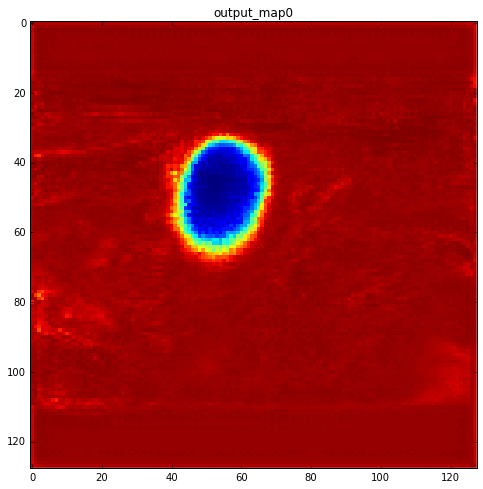

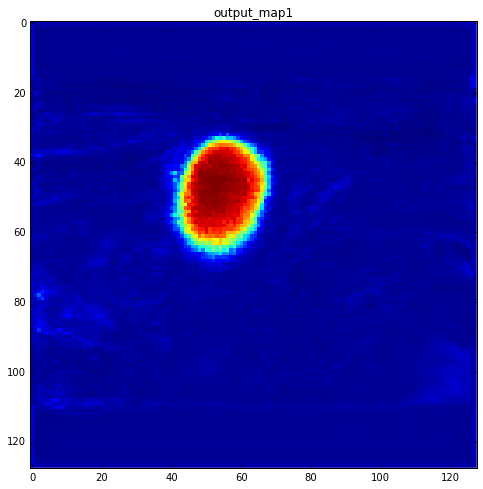

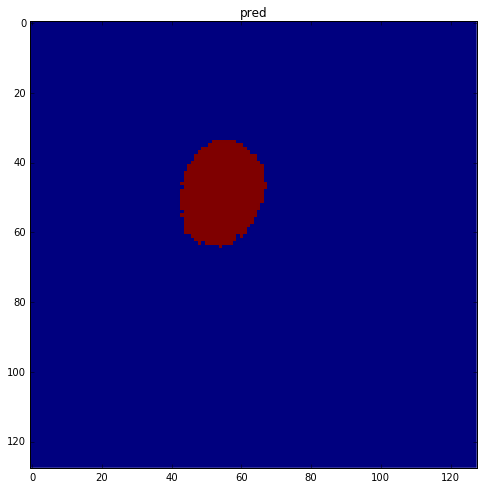

map0 max: 0.994809746742, map1 max: 0.993313550949, pred max: 1


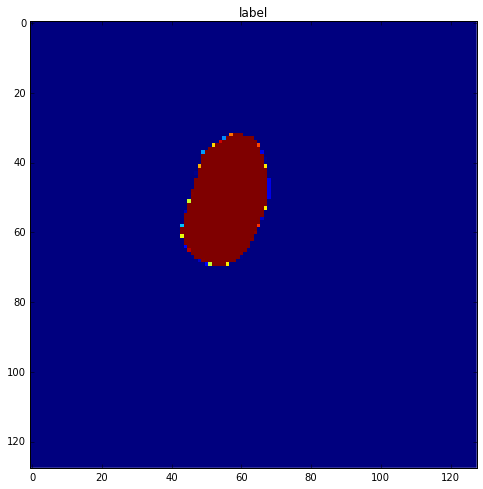

No label, skipping 33_104
No label, skipping 33_105
No label, skipping 33_106
No label, skipping 33_107
No label, skipping 33_100
No label, skipping 33_101
No label, skipping 33_102
No label, skipping 33_103
No label, skipping 33_108
No label, skipping 33_109
No label, skipping 27_91
No label, skipping 14_50
No label, skipping 14_51
No label, skipping 14_52
No label, skipping 27_56
No label, skipping 27_57
No label, skipping 27_55
No label, skipping 27_52
No label, skipping 27_53
No label, skipping 27_50
No label, skipping 27_51
No label, skipping 27_58
No label, skipping 27_59
No label, skipping 2_89
No label, skipping 2_88
No label, skipping 2_85
No label, skipping 2_87
No label, skipping 2_86
step: 6305, loss: 0.0063839009963, dice: [ 0.81636155]
No label, skipping 2_80
No label, skipping 2_83
No label, skipping 2_82
No label, skipping 28_78
No label, skipping 28_74
No label, skipping 28_77
No label, skipping 28_76
No label, skipping 28_71
No label, skipping 28_70
No label, skipping

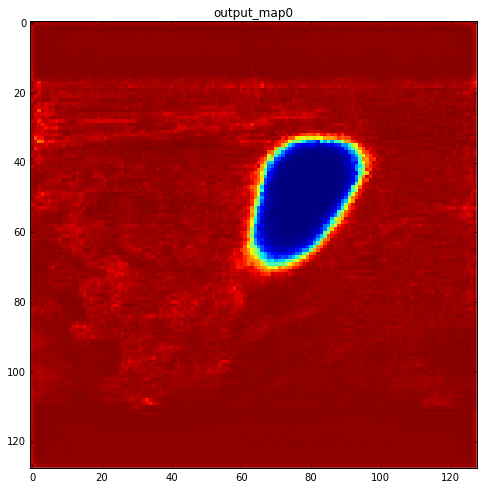

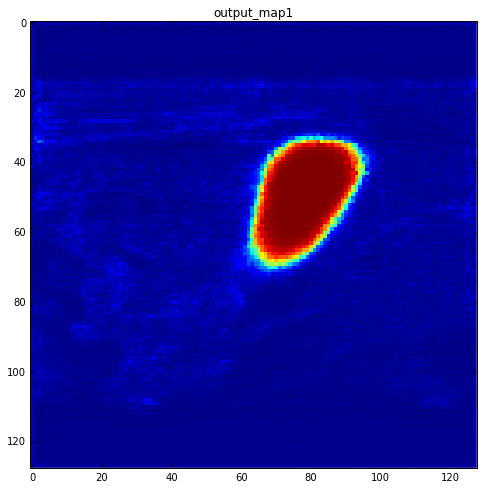

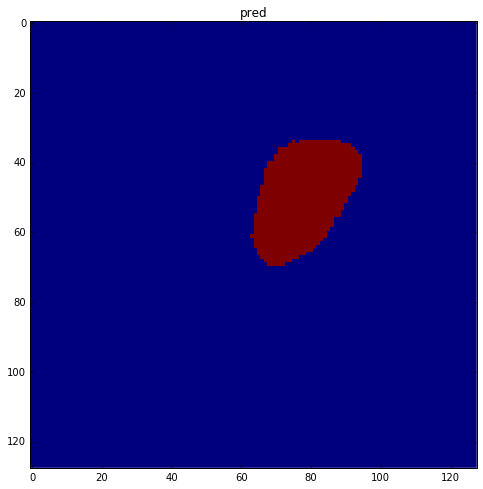

map0 max: 0.991991639137, map1 max: 0.999970853329, pred max: 1


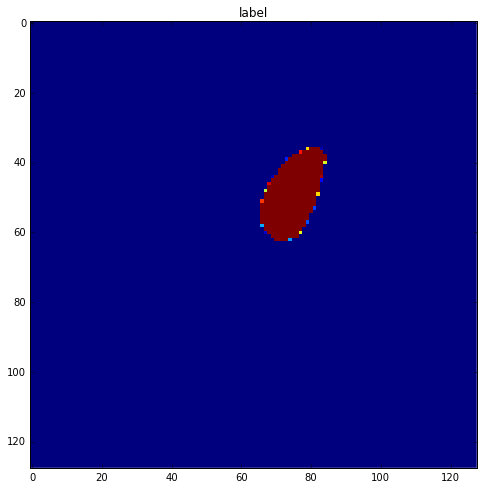

No label, skipping 1_26
No label, skipping 1_25
No label, skipping 38_78
No label, skipping 38_79
No label, skipping 1_21
No label, skipping 38_74
No label, skipping 38_75
step: 6405, loss: 0.00174885231536, dice: [ 0.60087258]
No label, skipping 38_70
No label, skipping 1_28
No label, skipping 9_59
step: 6410, loss: 0.00267553632148, dice: [ 0.49091589]
No label, skipping 9_54
No label, skipping 9_51
No label, skipping 9_50
No label, skipping 16_59
step: 6415, loss: 0.00261670956388, dice: [ 0.52624971]
No label, skipping 16_51
No label, skipping 16_56
No label, skipping 16_57
step: 6420, loss: 0.014591563493, dice: [ 0.73609185]
No label, skipping 6_89
No label, skipping 6_88
No label, skipping 6_81
No label, skipping 6_80
No label, skipping 6_83
No label, skipping 6_82
No label, skipping 6_84
No label, skipping 6_87
No label, skipping 6_86
step: 6425, loss: 0.00209116493352, dice: [ 0.71649396]
step: 6430, loss: 0.00254118000157, dice: [ 0.43954751]
No label, skipping 10_50
No label

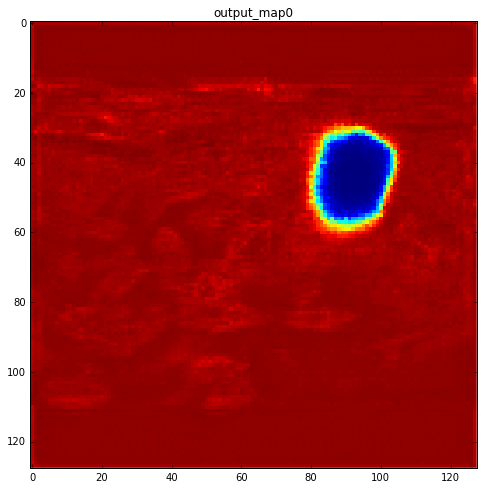

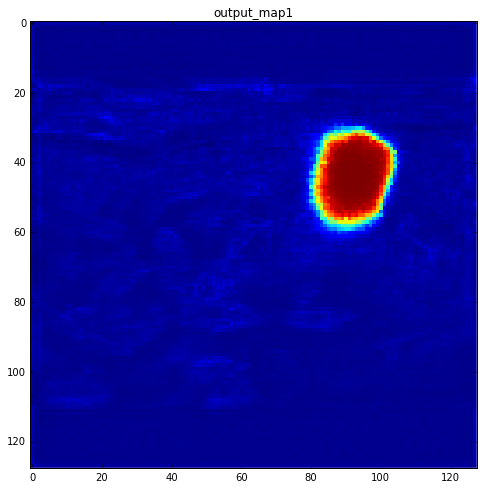

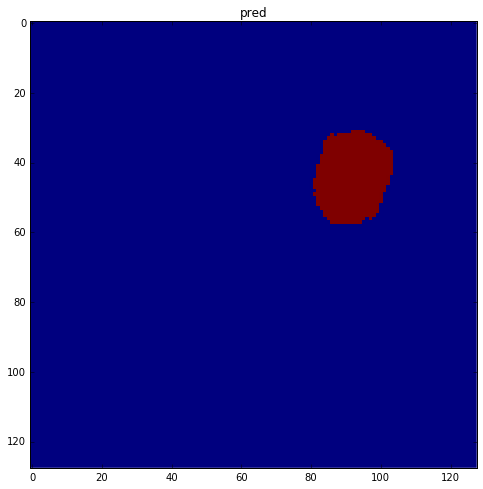

map0 max: 0.993901729584, map1 max: 0.998995900154, pred max: 1


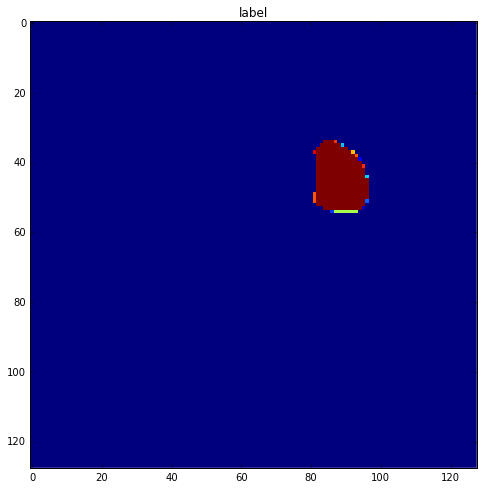

No label, skipping 28_39
No label, skipping 28_38
No label, skipping 31_68
No label, skipping 31_69
No label, skipping 31_66
No label, skipping 31_67
No label, skipping 31_60
No label, skipping 31_61
No label, skipping 31_62
No label, skipping 31_63
step: 6505, loss: 0.00285521894693, dice: [ 0.38358781]
No label, skipping 19_43
No label, skipping 19_45
No label, skipping 19_47
step: 6510, loss: 0.00181620090734, dice: [ 0.51405948]
No label, skipping 38_10
No label, skipping 38_17
No label, skipping 38_14
No label, skipping 38_15
No label, skipping 16_70
No label, skipping 16_72
step: 6515, loss: 0.00122710992582, dice: [ 0.70198977]
No label, skipping 16_75
No label, skipping 16_76
No label, skipping 46_26
step: 6520, loss: 0.066526144743, dice: [ 0.0024292]
No label, skipping 46_25
No label, skipping 46_22
No label, skipping 46_23
No label, skipping 46_20
No label, skipping 46_21
No label, skipping 46_28
No label, skipping 46_29
step: 6525, loss: 0.00683097075671, dice: [ 0.845047]


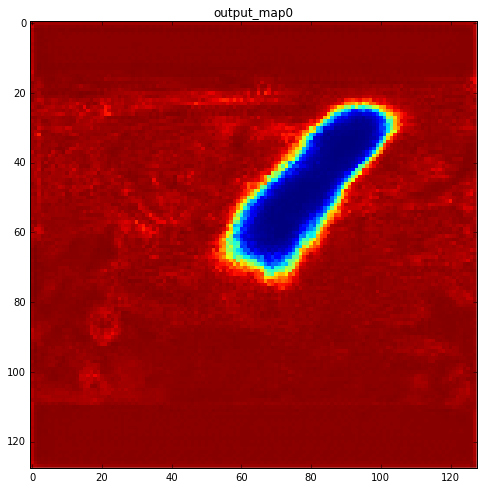

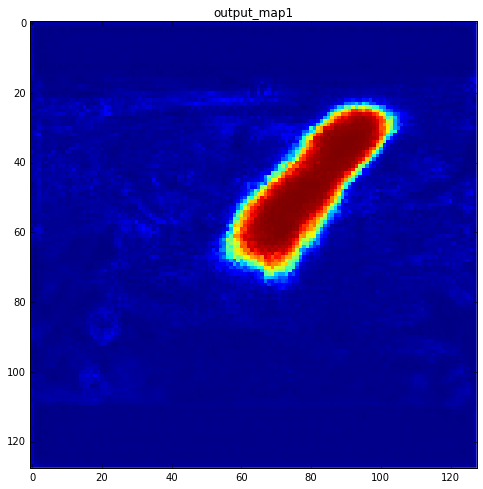

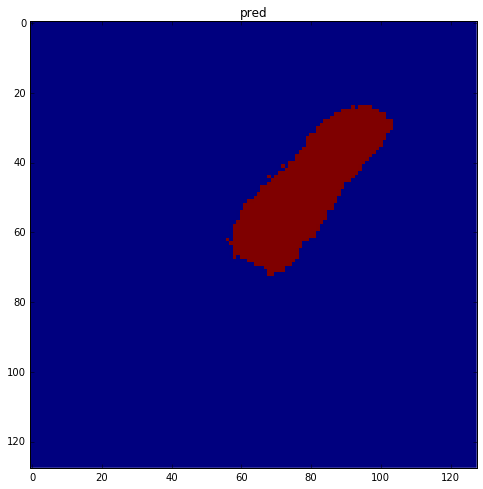

map0 max: 0.991523087025, map1 max: 0.997936367989, pred max: 1


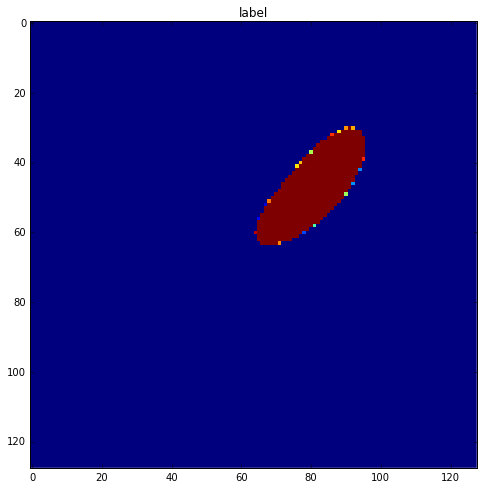

No label, skipping 15_114
No label, skipping 15_113
No label, skipping 15_111
No label, skipping 15_110
No label, skipping 4_94
step: 6605, loss: 0.00133477139752, dice: [ 0.67321187]
No label, skipping 4_97
No label, skipping 4_91
No label, skipping 4_92
No label, skipping 4_93
No label, skipping 4_98
No label, skipping 4_99
No label, skipping 27_103
No label, skipping 27_102
No label, skipping 27_101
No label, skipping 40_85
No label, skipping 27_107
No label, skipping 27_106
No label, skipping 27_105
No label, skipping 27_104
No label, skipping 38_30
No label, skipping 38_31
No label, skipping 38_33
No label, skipping 38_34
No label, skipping 38_36
No label, skipping 38_37
step: 6610, loss: 0.00195089471526, dice: [ 0.4837333]
No label, skipping 16_99
step: 6615, loss: 0.00165670854039, dice: [ 0.67409098]
No label, skipping 16_92
No label, skipping 16_91
No label, skipping 32_29
No label, skipping 32_28
step: 6620, loss: 0.00203533191234, dice: [ 0.49761233]
No label, skipping 32_2

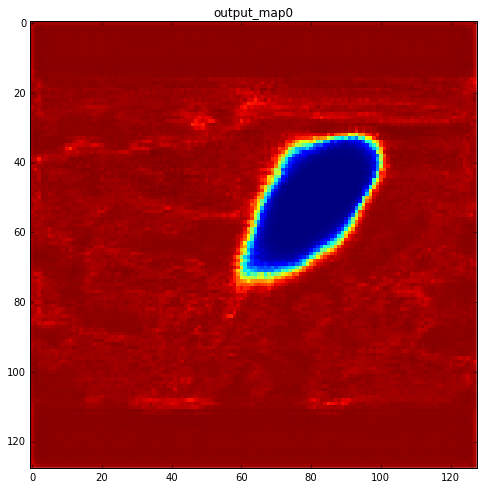

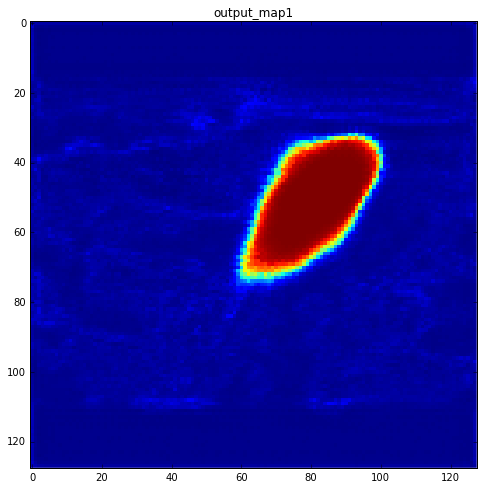

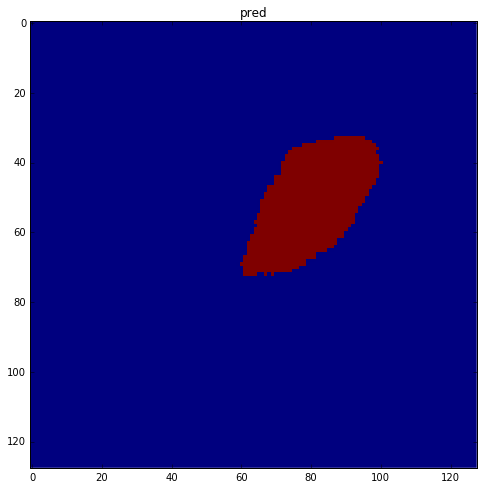

map0 max: 0.994493424892, map1 max: 0.999995291233, pred max: 1


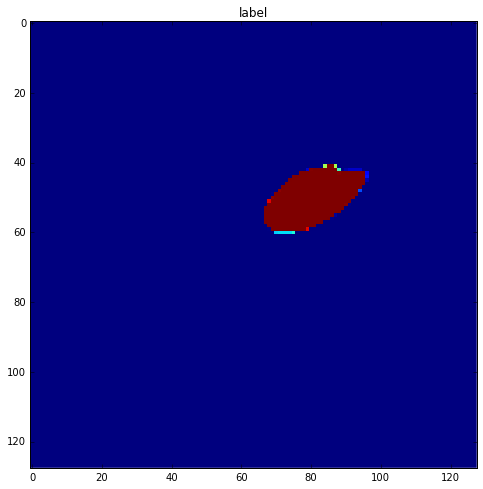

No label, skipping 11_83
No label, skipping 16_68
No label, skipping 33_68
No label, skipping 33_69
No label, skipping 33_63
No label, skipping 33_60
No label, skipping 33_61
No label, skipping 33_66
No label, skipping 33_67
No label, skipping 33_65
step: 6705, loss: 0.00252783834003, dice: [ 0.50379938]
No label, skipping 13_82
No label, skipping 13_83
No label, skipping 13_84
step: 6710, loss: 0.00196919008158, dice: [ 0.48884842]
No label, skipping 31_20
No label, skipping 31_21
No label, skipping 31_23
No label, skipping 31_27
No label, skipping 31_28
step: 6715, loss: 0.00289667304605, dice: [ 0.54211515]
No label, skipping 13_109
No label, skipping 13_102
No label, skipping 13_103
No label, skipping 13_100
No label, skipping 13_101
No label, skipping 13_106
No label, skipping 13_107
No label, skipping 13_104
No label, skipping 45_8
No label, skipping 45_9
No label, skipping 45_1
No label, skipping 45_2
No label, skipping 45_3
No label, skipping 45_4
No label, skipping 45_6
No lab

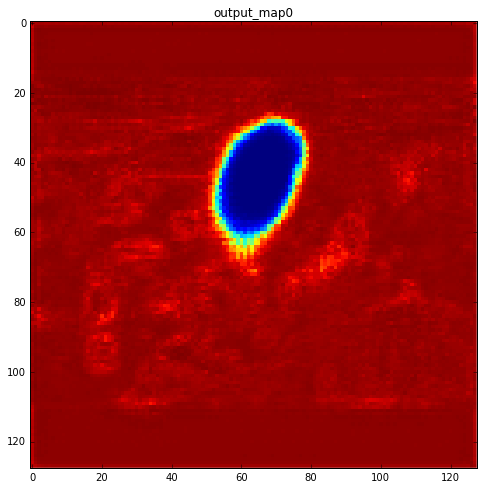

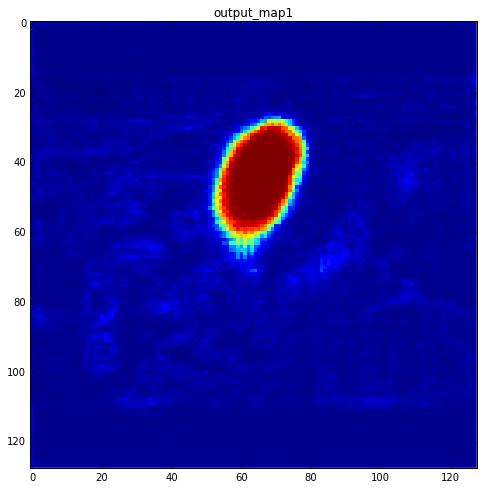

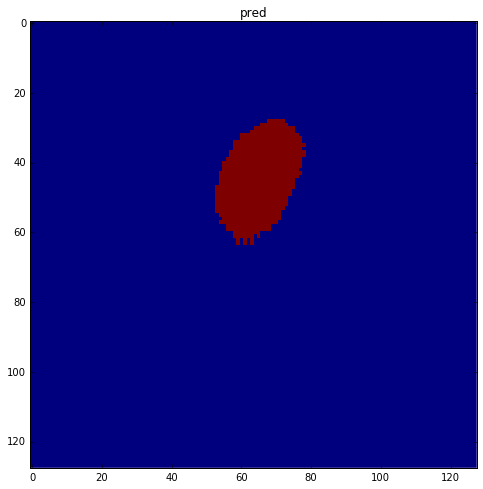

map0 max: 0.993924379349, map1 max: 0.999997437, pred max: 1


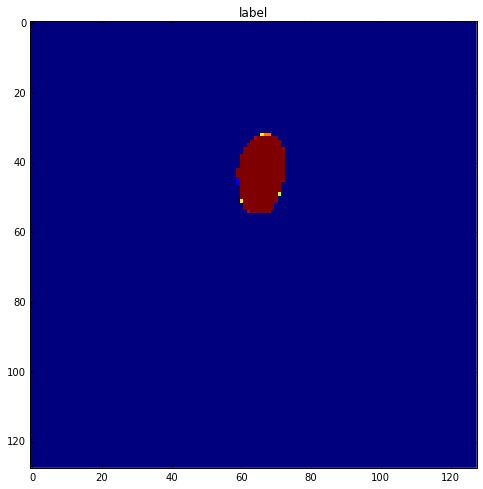

No label, skipping 34_26
No label, skipping 34_25
No label, skipping 34_24
No label, skipping 40_98
No label, skipping 3_79
step: 6805, loss: 0.00192357553169, dice: [ 0.48659793]
No label, skipping 3_72
No label, skipping 3_71
No label, skipping 3_75
No label, skipping 3_74
step: 6810, loss: 0.00242939940654, dice: [ 0.64555365]
No label, skipping 32_63
No label, skipping 46_46
step: 6815, loss: 0.00141080550384, dice: [ 0.75429016]
No label, skipping 46_48
No label, skipping 46_49
No label, skipping 24_118
step: 6820, loss: 0.00150295929052, dice: [ 0.62216455]
No label, skipping 24_117
No label, skipping 24_116
No label, skipping 23_96
step: 6825, loss: 0.0015334446216, dice: [ 0.69320846]
step: 6830, loss: 0.00209750863723, dice: [ 0.86538893]
No label, skipping 39_82
No label, skipping 41_29
No label, skipping 39_83
step: 6835, loss: 0.00130240793806, dice: [ 0.62705612]
No label, skipping 41_20
step: 6840, loss: 0.00256189098582, dice: [ 0.76768976]
No label, skipping 23_6
No lab

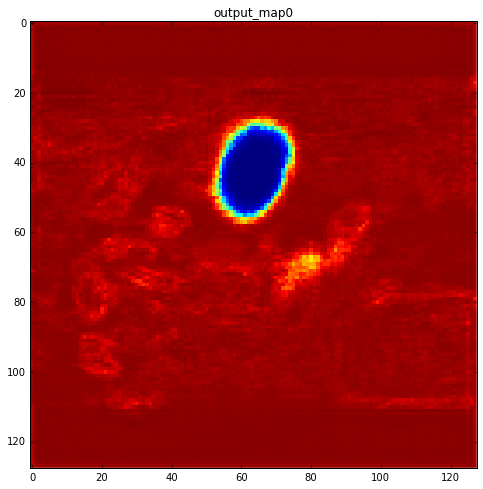

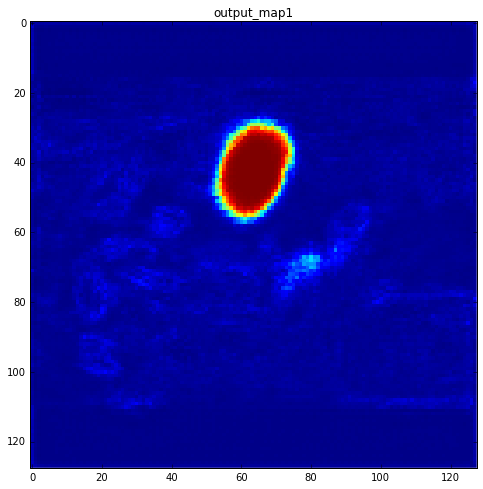

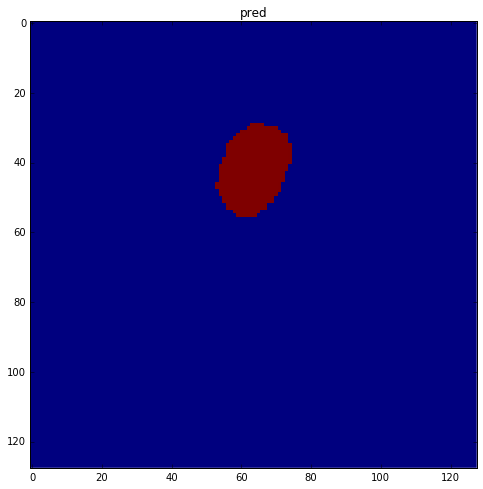

map0 max: 0.994210660458, map1 max: 0.999952077866, pred max: 1


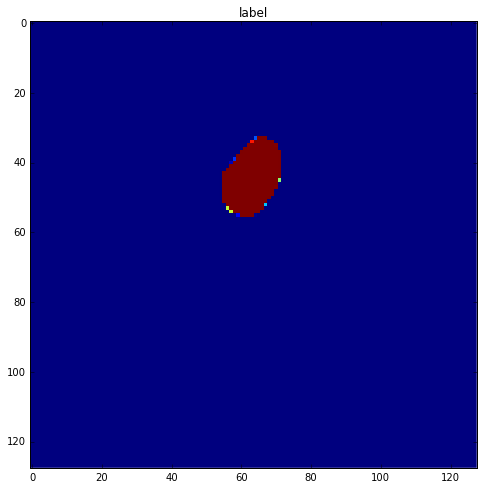

No label, skipping 34_48
No label, skipping 46_93
step: 6905, loss: 0.00325773190707, dice: [ 0.45477149]
No label, skipping 46_91
No label, skipping 32_54
No label, skipping 46_96
No label, skipping 46_95
No label, skipping 46_94
No label, skipping 3_51
No label, skipping 3_50
No label, skipping 3_53
No label, skipping 3_52
No label, skipping 3_55
No label, skipping 3_54
No label, skipping 3_59
step: 6910, loss: 0.00140251661651, dice: [ 0.50613636]
No label, skipping 26_44
No label, skipping 26_42
No label, skipping 26_43
step: 6915, loss: 0.00147850031499, dice: [ 0.55130434]
No label, skipping 26_41
No label, skipping 32_45
step: 6920, loss: 0.00174450839404, dice: [ 0.52646691]
No label, skipping 32_43
No label, skipping 30_99
No label, skipping 39_86
No label, skipping 30_92
No label, skipping 30_93
No label, skipping 30_90
No label, skipping 30_91
step: 6925, loss: 0.00581968994811, dice: [ 0.77425569]
No label, skipping 30_97
No label, skipping 30_94
No label, skipping 30_95
No

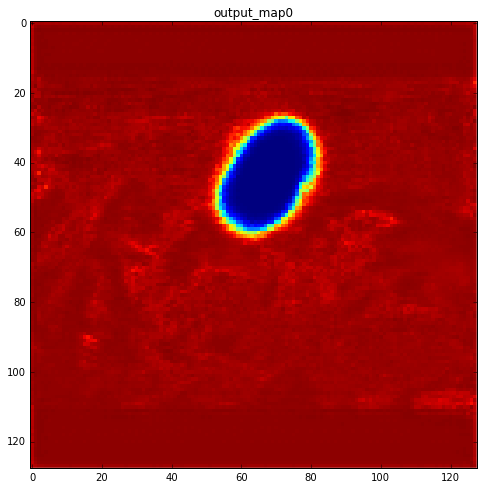

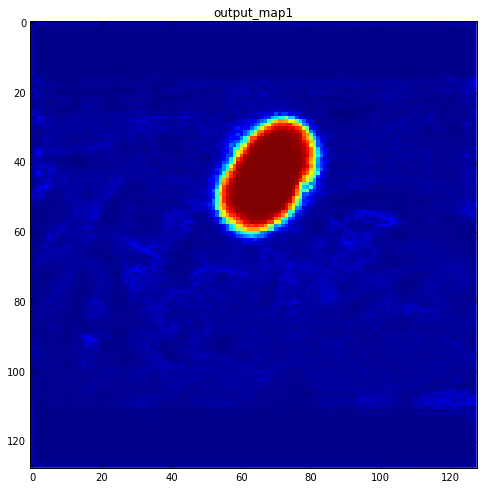

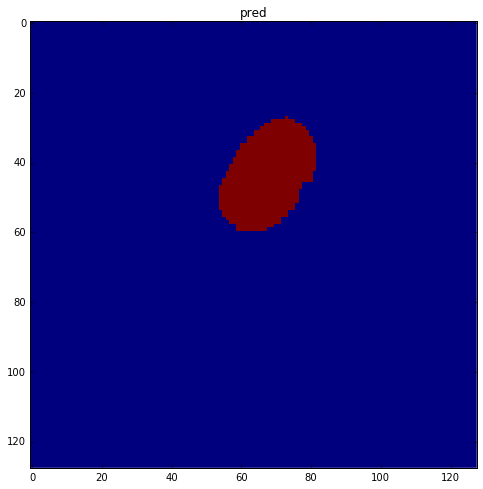

map0 max: 0.996505320072, map1 max: 0.999998450279, pred max: 1


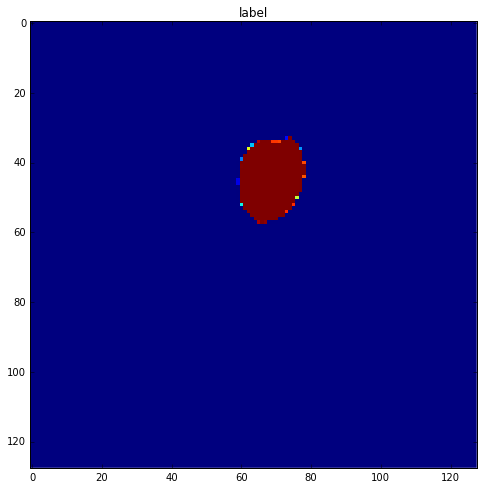

No label, skipping 24_28
No label, skipping 24_26
No label, skipping 24_27
No label, skipping 24_24
No label, skipping 24_25
No label, skipping 24_20
No label, skipping 24_21
No label, skipping 26_64
step: 7005, loss: 0.00139625777956, dice: [ 0.52147067]
No label, skipping 26_67
No label, skipping 26_60
No label, skipping 26_61
No label, skipping 26_62
No label, skipping 26_63
No label, skipping 46_84
No label, skipping 46_85
No label, skipping 46_86
No label, skipping 46_80
No label, skipping 46_81
No label, skipping 46_82
No label, skipping 46_83
No label, skipping 46_88
No label, skipping 46_89
No label, skipping 44_82
No label, skipping 44_80
No label, skipping 44_81
step: 7010, loss: 0.00115214905236, dice: [ 0.6471588]
No label, skipping 44_84
No label, skipping 44_88
No label, skipping 47_8
No label, skipping 47_9
No label, skipping 47_7
step: 7015, loss: 0.0115760648623, dice: [ 0.7713992]
No label, skipping 47_5
No label, skipping 47_2
No label, skipping 47_1
No label, skippi

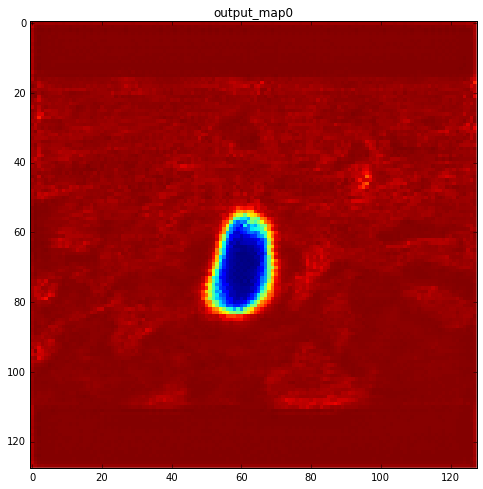

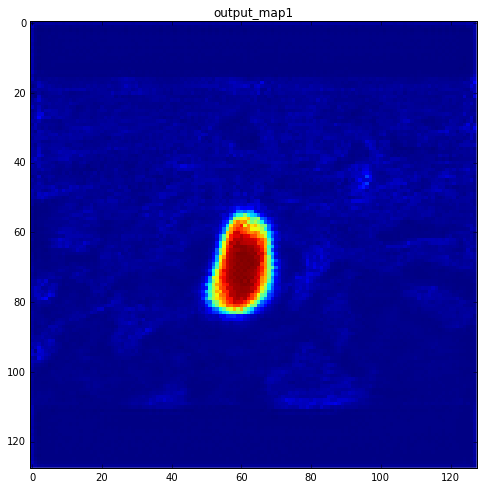

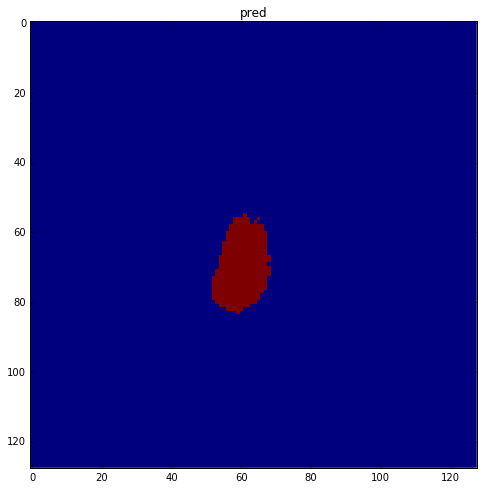

map0 max: 0.991868793964, map1 max: 0.980536401272, pred max: 1


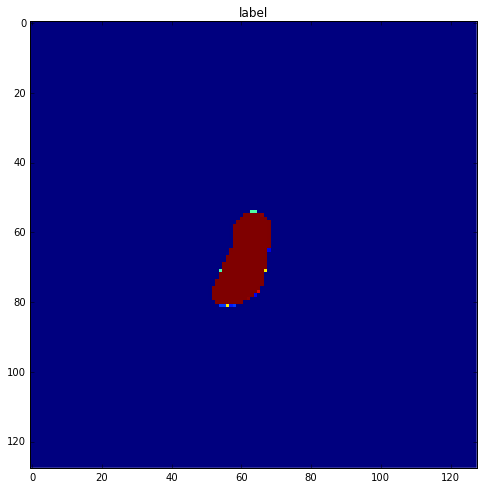

No label, skipping 13_23
No label, skipping 13_26
step: 7105, loss: 0.0022858409211, dice: [ 0.59141374]
No label, skipping 6_52
No label, skipping 6_53
No label, skipping 6_51
No label, skipping 6_56
No label, skipping 6_54
No label, skipping 6_55
No label, skipping 6_59
No label, skipping 29_10
No label, skipping 29_11
step: 7110, loss: 0.00241976813413, dice: [ 0.45973006]
step: 7115, loss: 0.00238232477568, dice: [ 0.64007646]
No label, skipping 4_50
No label, skipping 4_51
No label, skipping 4_52
No label, skipping 4_54
No label, skipping 4_55
No label, skipping 4_56
No label, skipping 4_58
No label, skipping 21_32
No label, skipping 21_33
No label, skipping 21_30
No label, skipping 21_31
No label, skipping 21_36
step: 7120, loss: 0.0015666752588, dice: [ 0.64585972]
No label, skipping 21_34
No label, skipping 21_35
No label, skipping 21_38
No label, skipping 21_39
No label, skipping 22_24
No label, skipping 22_25
No label, skipping 22_26
No label, skipping 22_27
No label, skippin

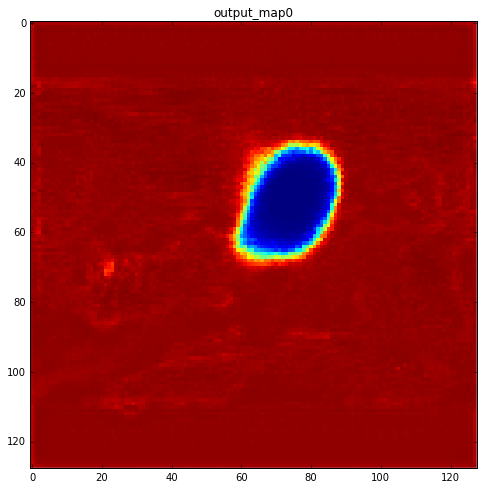

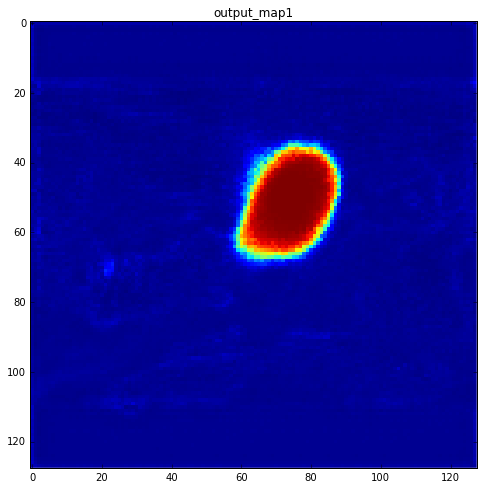

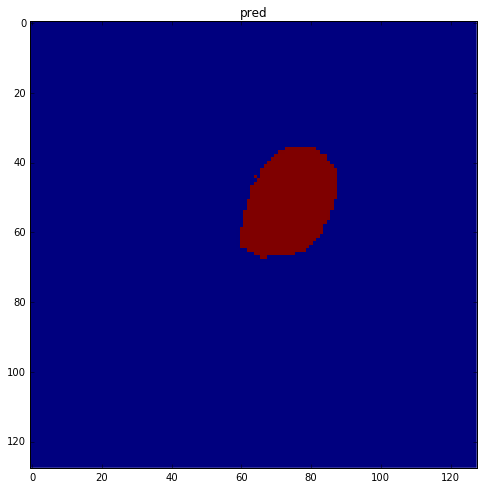

map0 max: 0.995879471302, map1 max: 0.999589443207, pred max: 1


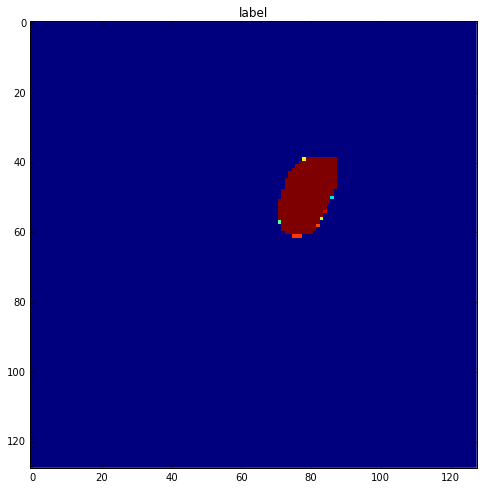

No label, skipping 36_31
No label, skipping 36_37
No label, skipping 36_35
No label, skipping 30_13
No label, skipping 30_10
No label, skipping 30_11
No label, skipping 30_16
No label, skipping 30_17
No label, skipping 30_14
No label, skipping 30_15
No label, skipping 30_18
No label, skipping 30_19
No label, skipping 5_67
No label, skipping 5_64
step: 7205, loss: 0.00104806665331, dice: [ 0.59474415]
No label, skipping 5_62
No label, skipping 5_60
No label, skipping 5_61
No label, skipping 5_68
No label, skipping 5_69
No label, skipping 7_78
step: 7210, loss: 0.00170852721203, dice: [ 0.55180937]
No label, skipping 7_72
step: 7215, loss: 0.00346695561893, dice: [ 0.84011459]
No label, skipping 17_68
No label, skipping 17_69
No label, skipping 43_33
No label, skipping 17_62
step: 7220, loss: 0.00120726239402, dice: [ 0.65763998]
No label, skipping 17_65
No label, skipping 17_66
No label, skipping 17_67
No label, skipping 45_58
No label, skipping 45_59
No label, skipping 45_56
No label, 

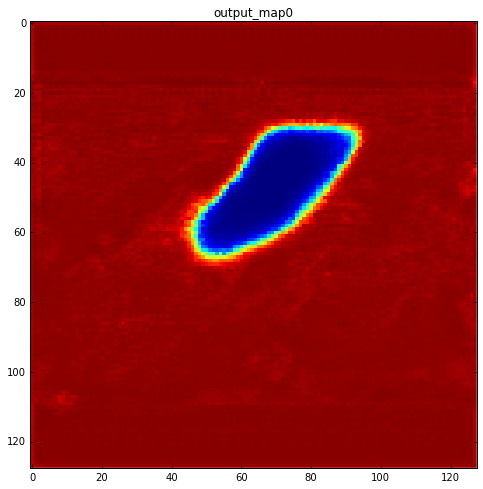

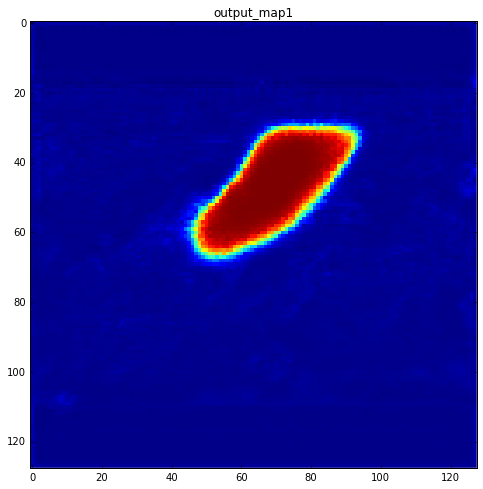

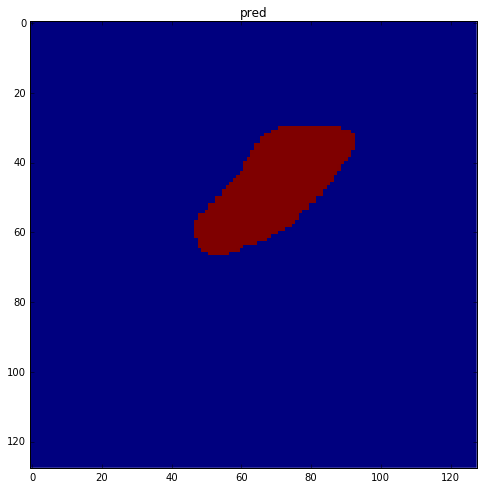

map0 max: 0.994610607624, map1 max: 0.999929666519, pred max: 1


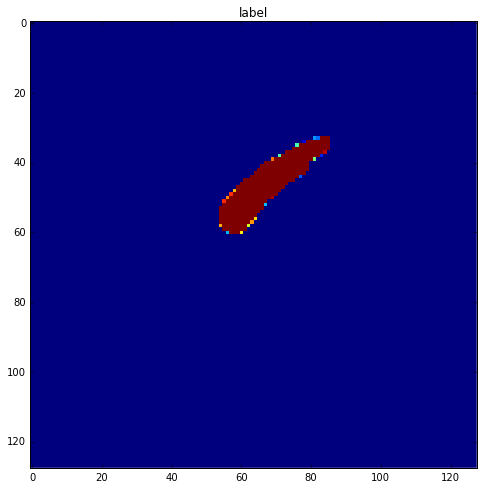

No label, skipping 21_8
No label, skipping 21_9
No label, skipping 21_2
No label, skipping 21_3
No label, skipping 21_1
No label, skipping 21_4
No label, skipping 21_5
step: 7305, loss: 0.00144697364885, dice: [ 0.65613019]
No label, skipping 19_100
No label, skipping 19_102
No label, skipping 19_103
No label, skipping 19_108
No label, skipping 19_109
No label, skipping 28_9
No label, skipping 28_8
No label, skipping 28_3
No label, skipping 28_2
No label, skipping 28_7
No label, skipping 28_6
No label, skipping 28_5
No label, skipping 28_4
No label, skipping 7_32
step: 7310, loss: 0.00149203708861, dice: [ 0.68965352]
No label, skipping 7_36
No label, skipping 7_35
step: 7315, loss: 0.00150147022214, dice: [ 0.73524046]
No label, skipping 4_119
No label, skipping 4_116
No label, skipping 4_117
No label, skipping 4_114
No label, skipping 4_112
No label, skipping 4_113
No label, skipping 4_110
No label, skipping 4_111
No label, skipping 1_55
step: 7320, loss: 0.0016195694916, dice: [ 0.5

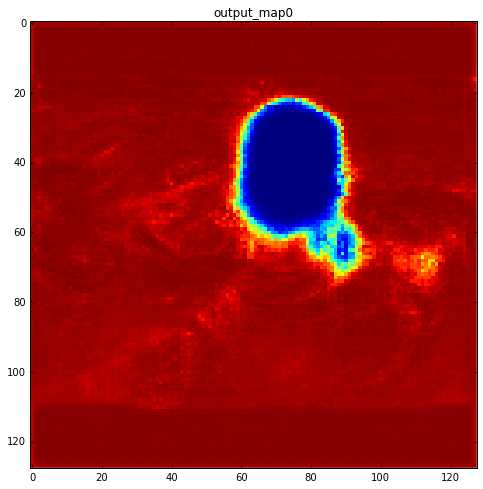

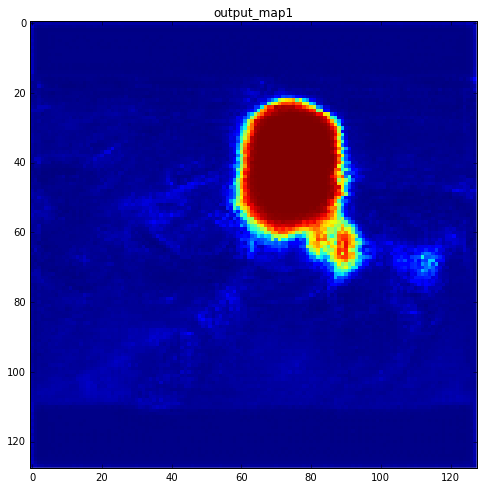

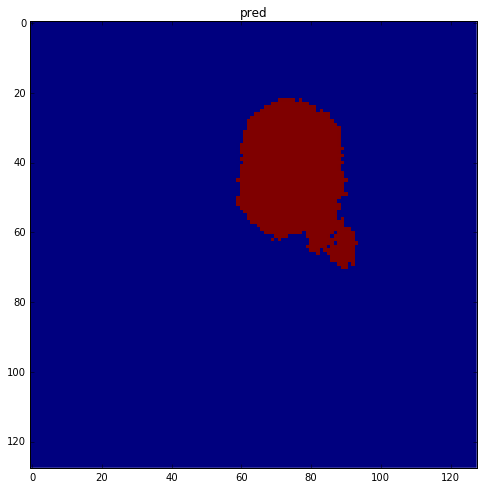

map0 max: 0.994899392128, map1 max: 1.0, pred max: 1


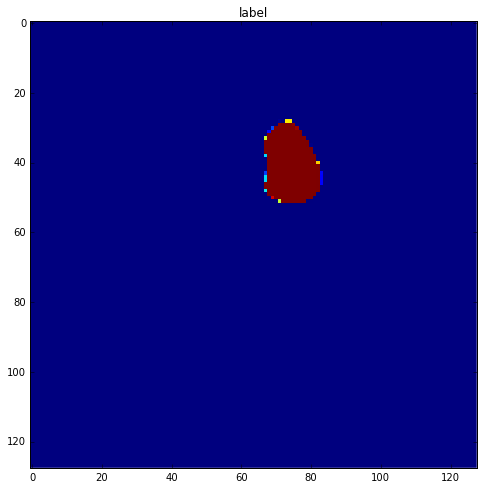

No label, skipping 38_40
No label, skipping 38_49
No label, skipping 38_48
step: 7405, loss: 0.00124369142577, dice: [ 0.68377137]
No label, skipping 16_26
step: 7410, loss: 0.00144715700299, dice: [ 0.72429121]
No label, skipping 16_28
step: 7415, loss: 0.00128179765306, dice: [ 0.66667879]
No label, skipping 32_111
step: 7420, loss: 0.0296626910567, dice: [ 0.70389163]
No label, skipping 10_69
No label, skipping 10_61
No label, skipping 10_63
No label, skipping 10_62
No label, skipping 10_65
No label, skipping 10_67
No label, skipping 10_66
No label, skipping 37_80
step: 7425, loss: 0.00216594780795, dice: [ 0.51153886]
No label, skipping 37_87
No label, skipping 22_120
step: 7430, loss: 0.00219629984349, dice: [ 0.49992746]
No label, skipping 12_27
No label, skipping 12_26
No label, skipping 12_25
No label, skipping 12_23
No label, skipping 12_20
No label, skipping 12_29
No label, skipping 12_28
No label, skipping 8_69
No label, skipping 8_68
No label, skipping 8_65
No label, skippi

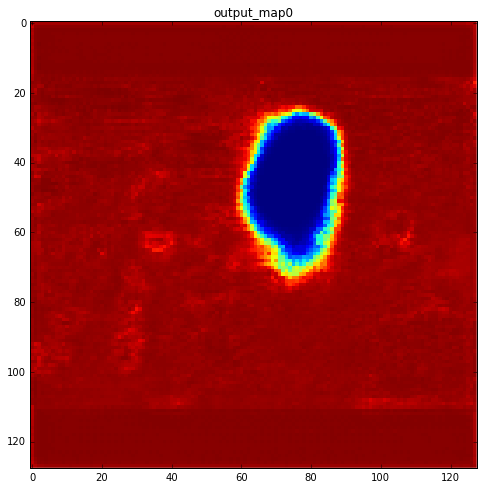

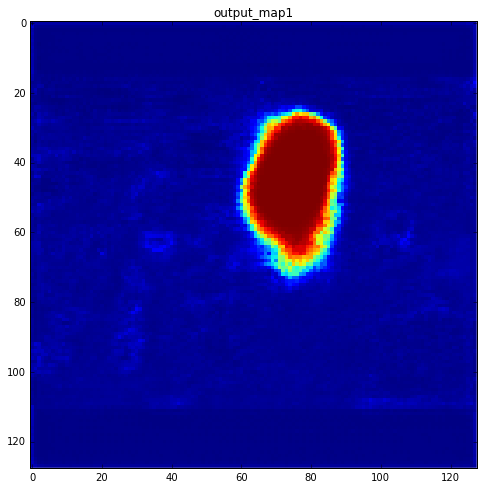

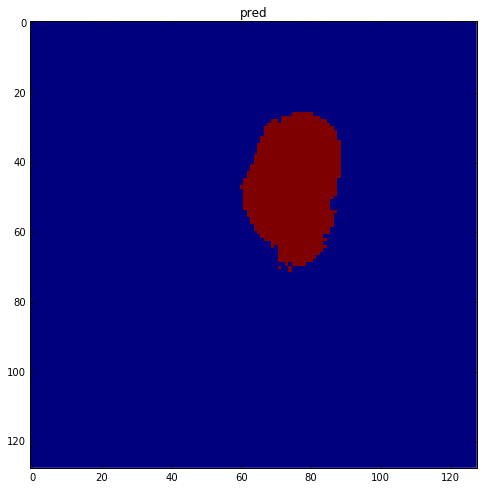

map0 max: 0.994511604309, map1 max: 1.0, pred max: 1


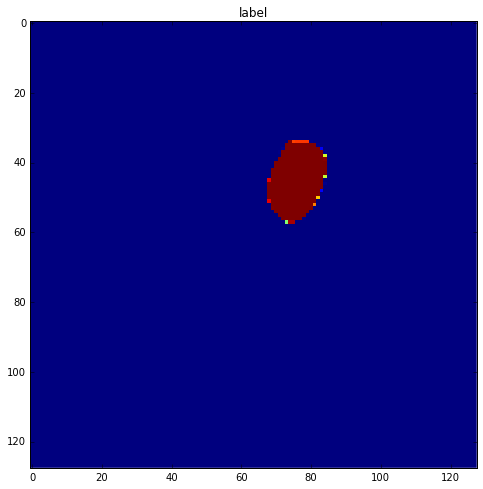

No label, skipping 34_98
No label, skipping 34_99
No label, skipping 6_98
No label, skipping 6_99
No label, skipping 6_96
No label, skipping 6_97
step: 7505, loss: 0.00168275251053, dice: [ 0.62479949]
No label, skipping 6_93
No label, skipping 6_90
No label, skipping 37_67
step: 7510, loss: 0.00132903258782, dice: [ 0.49899444]
step: 7515, loss: 0.00176404777449, dice: [ 0.52998894]
No label, skipping 10_47
No label, skipping 10_44
No label, skipping 10_43
step: 7520, loss: 0.00195581559092, dice: [ 0.86528373]
No label, skipping 10_40
No label, skipping 47_120
No label, skipping 44_54
step: 7525, loss: 0.00292997993529, dice: [ 0.90101737]
No label, skipping 44_51
No label, skipping 44_59
No label, skipping 8_112
No label, skipping 8_113
step: 7530, loss: 0.00328568276018, dice: [ 0.88791955]
No label, skipping 8_111
No label, skipping 8_116
No label, skipping 8_114
No label, skipping 8_115
No label, skipping 8_118
No label, skipping 8_119
No label, skipping 18_38
No label, skipping 

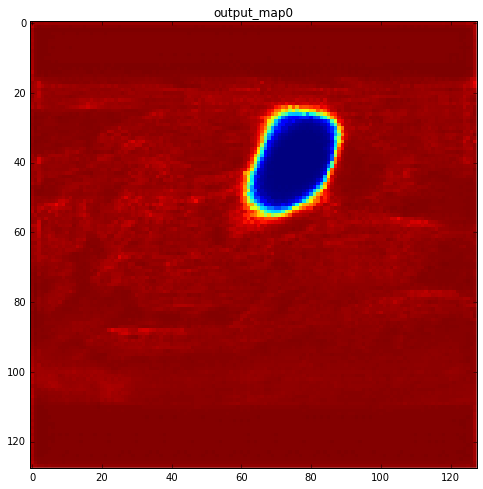

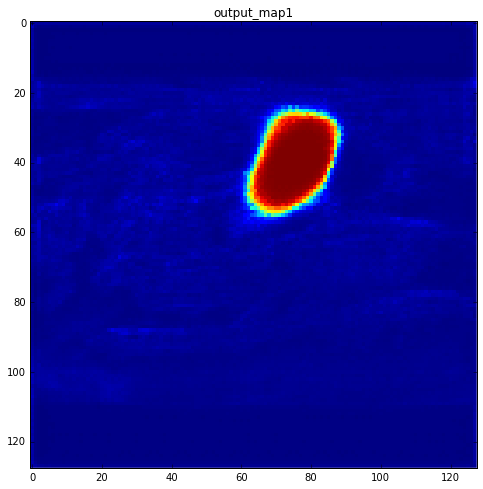

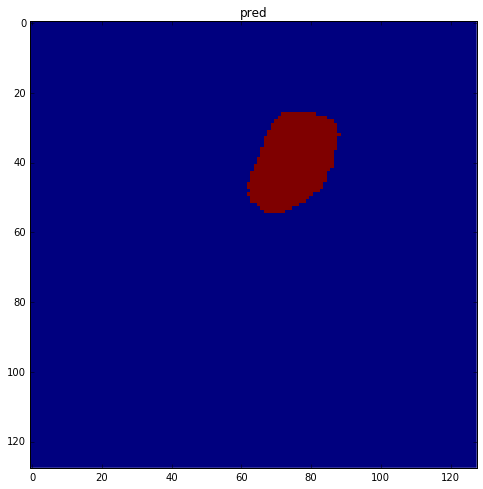

map0 max: 0.992430925369, map1 max: 0.999837994576, pred max: 1


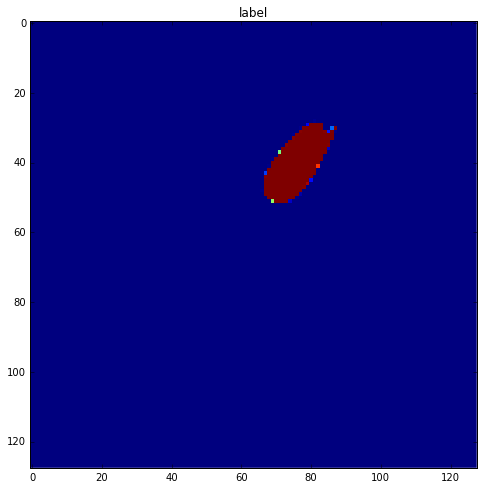

No label, skipping 44_73
No label, skipping 44_72
step: 7605, loss: 0.00149622128811, dice: [ 0.55746013]
No label, skipping 44_75
No label, skipping 44_79
No label, skipping 46_75
step: 7610, loss: 0.00148219417315, dice: [ 0.77023387]
No label, skipping 8_20
No label, skipping 8_23
No label, skipping 8_22
step: 7615, loss: 0.00245862500742, dice: [ 0.75695521]
No label, skipping 8_27
No label, skipping 8_26
No label, skipping 8_29
No label, skipping 8_28
No label, skipping 14_110
No label, skipping 14_111
No label, skipping 14_116
No label, skipping 14_117
No label, skipping 14_114
No label, skipping 14_118
No label, skipping 14_119
No label, skipping 18_14
No label, skipping 18_15
No label, skipping 18_16
No label, skipping 18_10
No label, skipping 18_11
No label, skipping 18_12
step: 7620, loss: 0.00324656930752, dice: [ 0.54694575]
No label, skipping 18_19
step: 7625, loss: 0.00143813306931, dice: [ 0.63321877]
No label, skipping 23_26
No label, skipping 23_28
No label, skipping 2

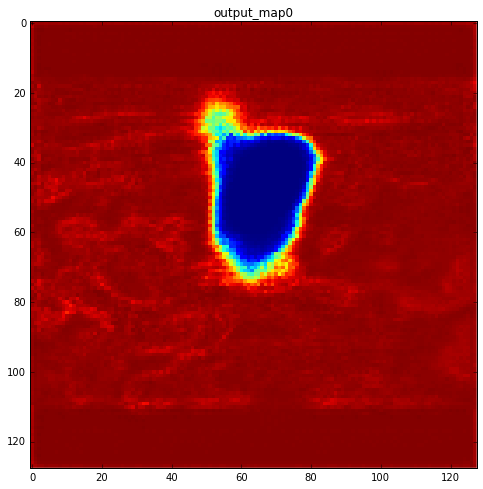

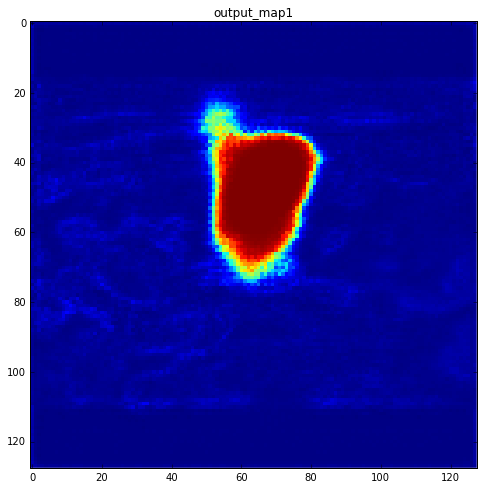

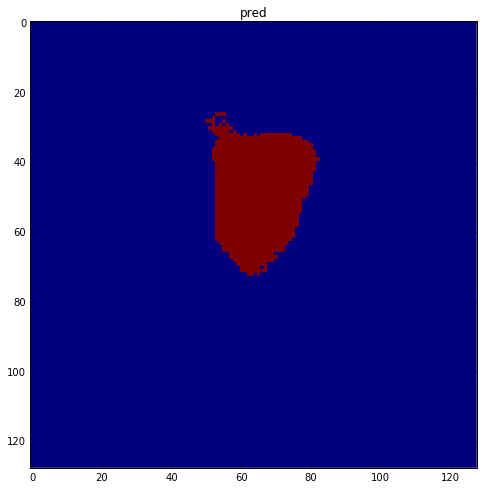

map0 max: 0.993973612785, map1 max: 1.0, pred max: 1


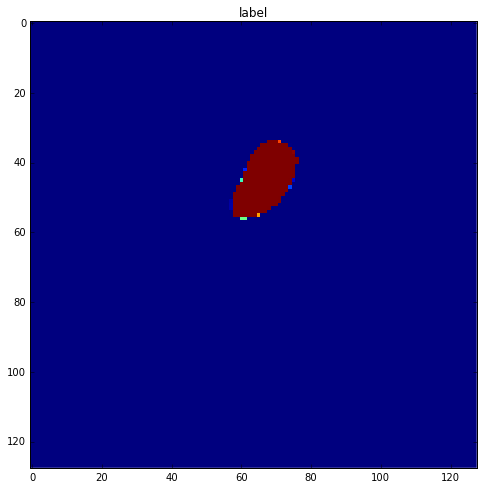

No label, skipping 3_26
No label, skipping 3_27
No label, skipping 3_21
No label, skipping 3_23
No label, skipping 3_28
step: 7705, loss: 0.00147051375825, dice: [ 0.67455161]
No label, skipping 10_88
No label, skipping 10_82
No label, skipping 10_80
No label, skipping 10_86
No label, skipping 10_85
No label, skipping 12_81
No label, skipping 12_80
No label, skipping 12_83
No label, skipping 12_82
step: 7710, loss: 0.000969470653217, dice: [ 0.74282628]
No label, skipping 12_84
No label, skipping 12_87
No label, skipping 12_86
No label, skipping 12_89
No label, skipping 12_88
No label, skipping 44_19
No label, skipping 44_13
step: 7715, loss: 0.00122220418416, dice: [ 0.65161359]
step: 7720, loss: 0.0322024933994, dice: [ 0.68473405]
No label, skipping 38_101
No label, skipping 35_102
step: 7725, loss: 0.0364031903446, dice: [ 0.65091342]
No label, skipping 35_101
No label, skipping 35_108
No label, skipping 35_81
No label, skipping 16_14
No label, skipping 18_72
No label, skipping 18_

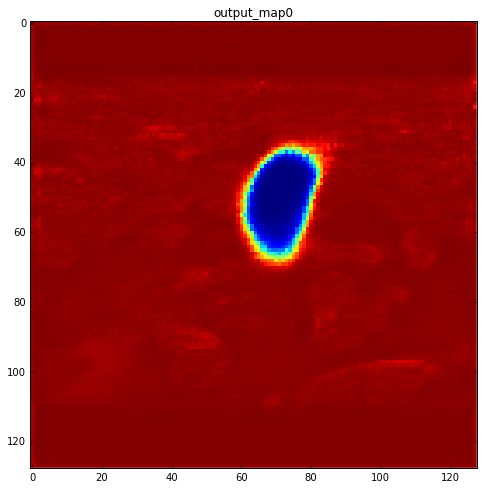

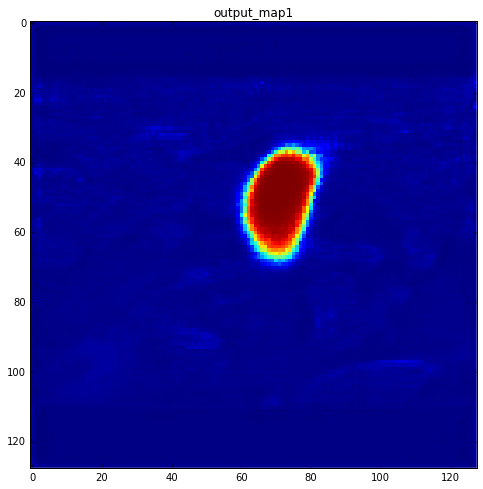

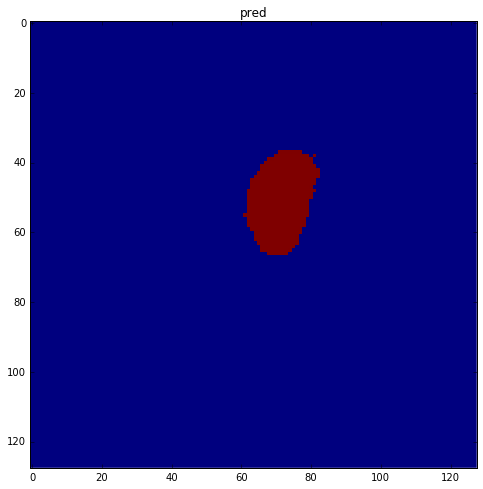

map0 max: 0.993025541306, map1 max: 0.999391436577, pred max: 1


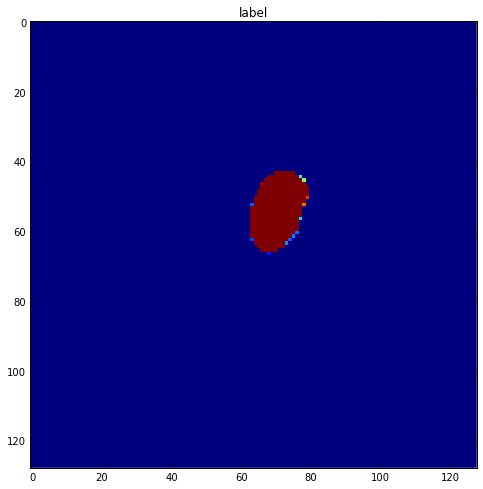

No label, skipping 26_90
No label, skipping 26_92
No label, skipping 26_94
No label, skipping 26_97
No label, skipping 24_120
No label, skipping 44_37
step: 7805, loss: 0.00187170144636, dice: [ 0.59223437]
No label, skipping 44_31
step: 7810, loss: 0.00133672577795, dice: [ 0.66654462]
No label, skipping 5_3
No label, skipping 5_1
No label, skipping 5_6
No label, skipping 5_5
No label, skipping 5_4
No label, skipping 5_9
step: 7815, loss: 0.00124193564989, dice: [ 0.68881905]
No label, skipping 44_115
step: 7820, loss: 0.000945679959841, dice: [ 0.58308095]
No label, skipping 44_117
No label, skipping 44_119
No label, skipping 17_24
No label, skipping 17_25
No label, skipping 43_74
No label, skipping 17_20
No label, skipping 43_73
No label, skipping 17_22
No label, skipping 17_23
No label, skipping 30_120
step: 7825, loss: 0.00202791299671, dice: [ 0.70013052]
No label, skipping 18_50
step: 7830, loss: 0.00191474554595, dice: [ 0.43274316]
No label, skipping 18_56
No label, skipping 1

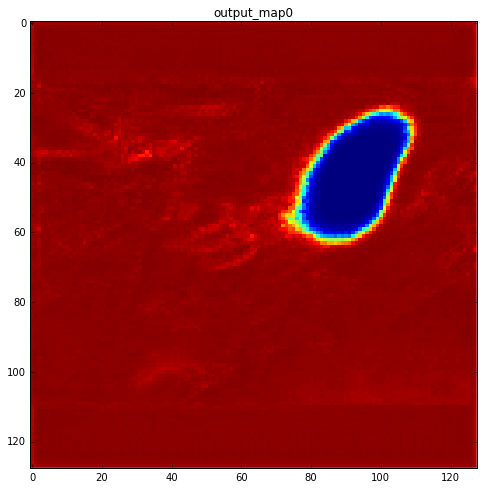

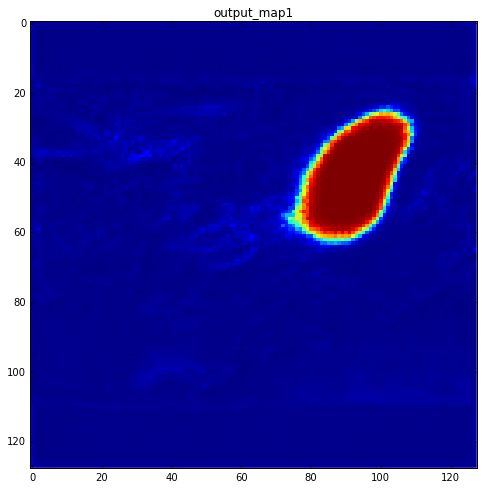

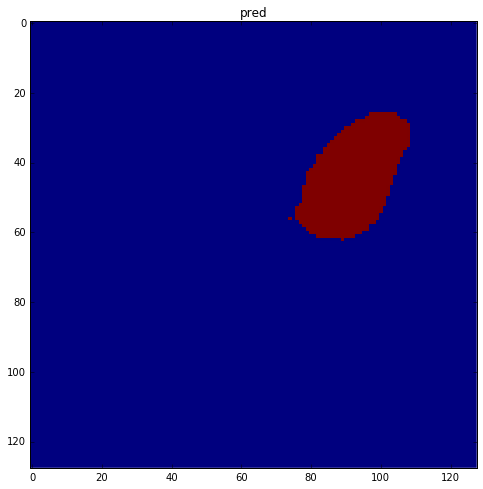

map0 max: 0.994143545628, map1 max: 0.999996542931, pred max: 1


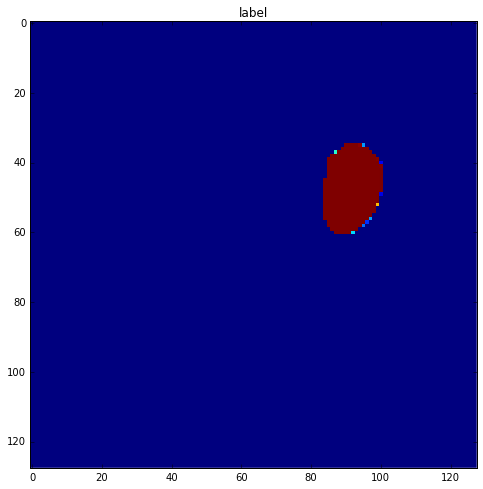

No label, skipping 8_82
No label, skipping 8_81
No label, skipping 3_2
No label, skipping 8_86
No label, skipping 3_7
step: 7905, loss: 0.000976781127974, dice: [ 0.62215918]
No label, skipping 8_88
No label, skipping 30_102
No label, skipping 30_107
No label, skipping 30_106
No label, skipping 30_105
No label, skipping 30_104
No label, skipping 30_109
step: 7910, loss: 0.00194343738258, dice: [ 0.62265134]
No label, skipping 40_1
No label, skipping 23_88
No label, skipping 40_9
No label, skipping 23_81
No label, skipping 23_80
step: 7915, loss: 0.00184788659681, dice: [ 0.56282854]
step: 7920, loss: 0.00115330668632, dice: [ 0.6643936]
step: 7925, loss: 0.00117376178969, dice: [ 0.64467621]
No label, skipping 41_11
step: 7930, loss: 0.00144780415576, dice: [ 0.54963243]
step: 7935, loss: 0.00114199507516, dice: [ 0.70960635]
No label, skipping 15_53
No label, skipping 15_52
step: 7940, loss: 0.00464820675552, dice: [ 0.7781629]
No label, skipping 47_14
No label, skipping 47_15
No labe

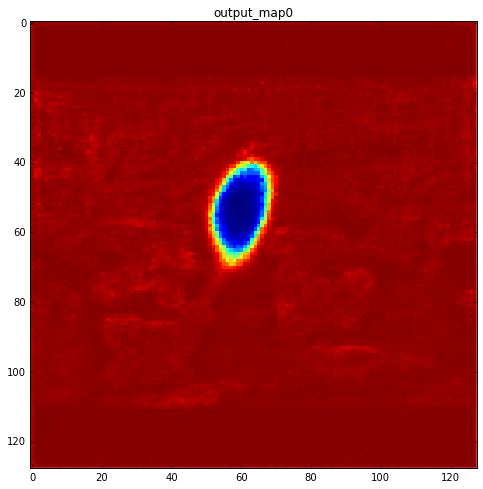

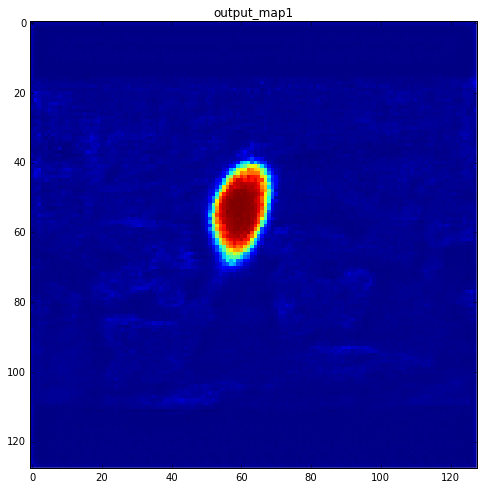

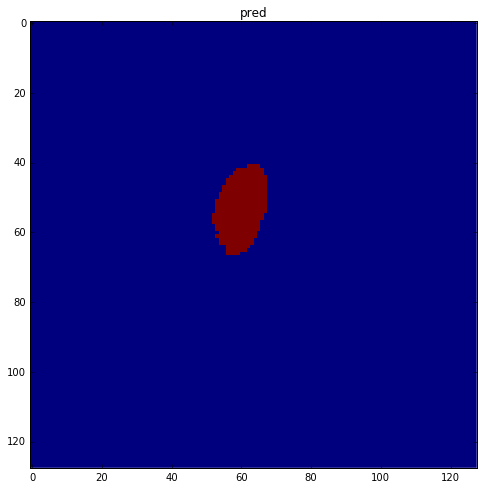

map0 max: 0.993866682053, map1 max: 0.991639375687, pred max: 1


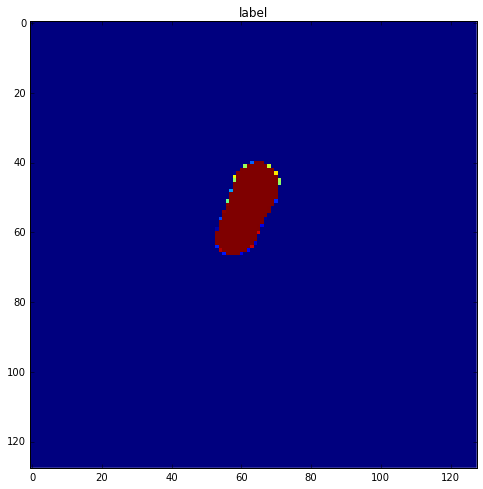

No label, skipping 26_57
No label, skipping 26_51
No label, skipping 26_50
No label, skipping 26_53
No label, skipping 32_72
No label, skipping 32_70
step: 8005, loss: 0.00127245043404, dice: [ 0.63826364]
step: 8010, loss: 0.000896048673894, dice: [ 0.69559866]
No label, skipping 30_89
No label, skipping 30_88
No label, skipping 30_81
No label, skipping 30_80
No label, skipping 30_85
No label, skipping 30_84
No label, skipping 30_86
No label, skipping 12_1
No label, skipping 12_2
No label, skipping 12_4
No label, skipping 12_5
No label, skipping 12_6
step: 8015, loss: 0.00228223646991, dice: [ 0.5112446]
No label, skipping 12_8
No label, skipping 12_9
step: 8020, loss: 0.00147899193689, dice: [ 0.52702695]
step: 8025, loss: 0.00113238045014, dice: [ 0.66006321]
No label, skipping 1_6
No label, skipping 1_5
step: 8030, loss: 0.00154512457084, dice: [ 0.45349124]
No label, skipping 1_9
No label, skipping 1_8
No label, skipping 33_57
No label, skipping 10_108
No label, skipping 2_71
No l

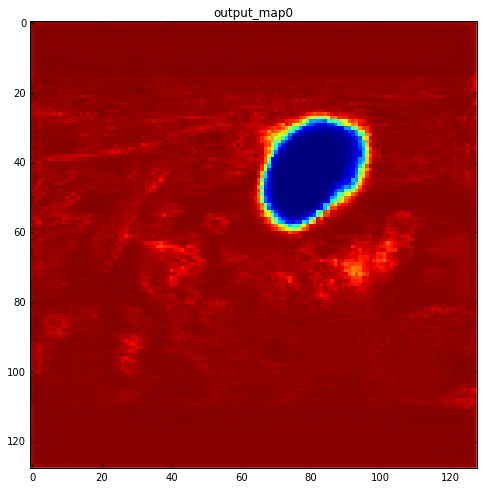

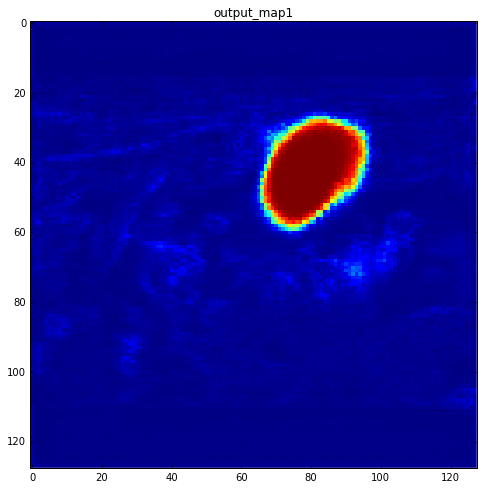

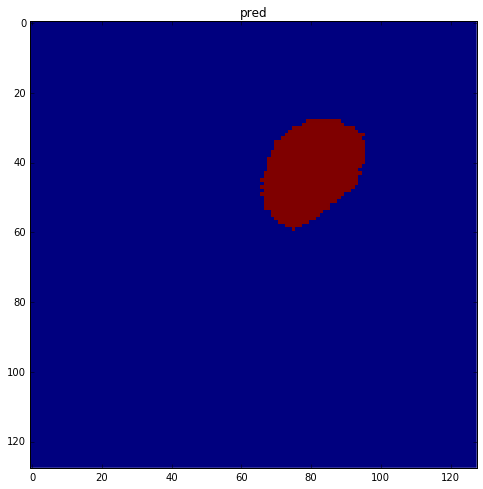

map0 max: 0.994160652161, map1 max: 0.999999821186, pred max: 1


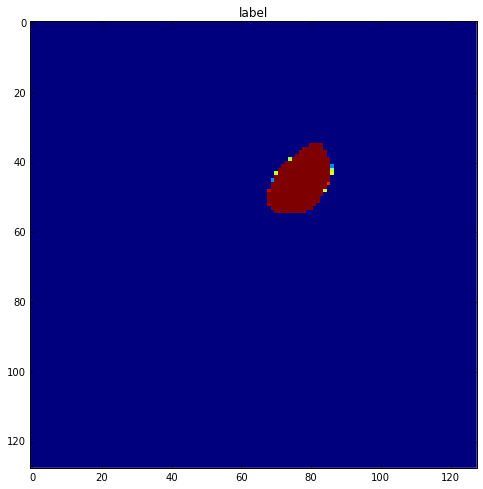

step: 8105, loss: 0.00210782140493, dice: [ 0.55313784]
No label, skipping 24_35
step: 8110, loss: 0.00116347358562, dice: [ 0.62860042]
No label, skipping 24_33
No label, skipping 12_116
No label, skipping 26_79
No label, skipping 26_78
No label, skipping 26_71
No label, skipping 26_70
No label, skipping 26_77
No label, skipping 26_76
No label, skipping 26_75
step: 8115, loss: 0.00106239726301, dice: [ 0.72551751]
No label, skipping 46_99
No label, skipping 46_98
No label, skipping 46_90
No label, skipping 46_97
step: 8120, loss: 0.00148200802505, dice: [ 0.56410545]
No label, skipping 44_91
No label, skipping 44_93
No label, skipping 44_92
No label, skipping 44_94
step: 8125, loss: 0.0012580921175, dice: [ 0.59284747]
No label, skipping 44_96
No label, skipping 44_99
No label, skipping 40_92
No label, skipping 12_112
No label, skipping 43_42
No label, skipping 43_41
No label, skipping 43_46
No label, skipping 43_45
No label, skipping 43_44
step: 8130, loss: 0.00280867004767, dice: [ 

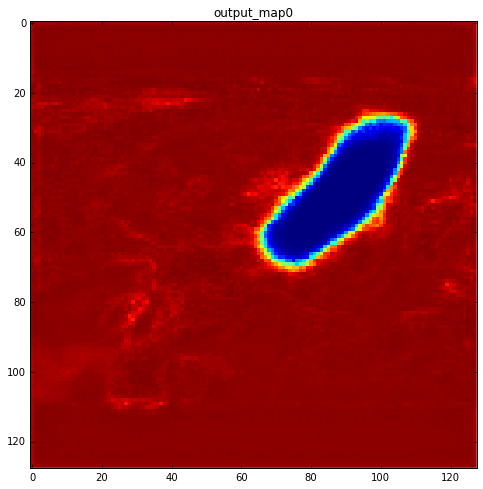

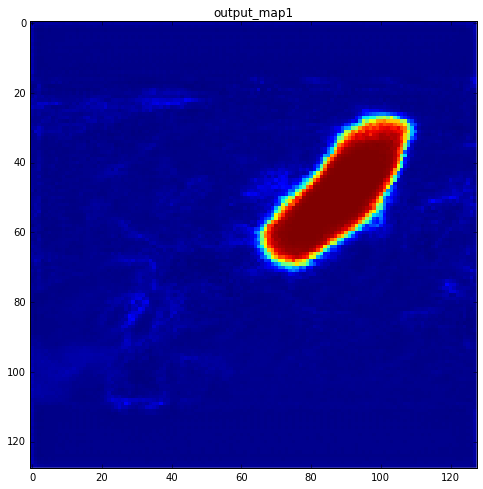

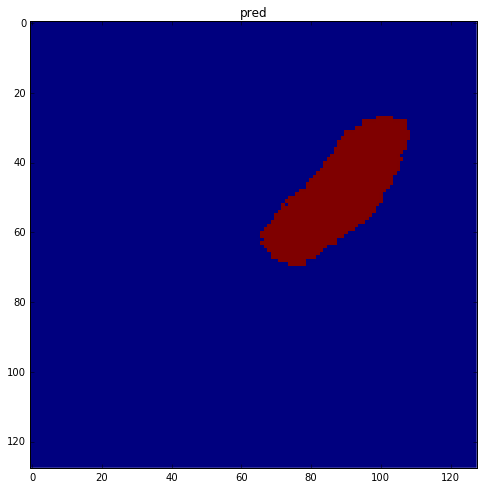

map0 max: 0.995181202888, map1 max: 0.999960005283, pred max: 1


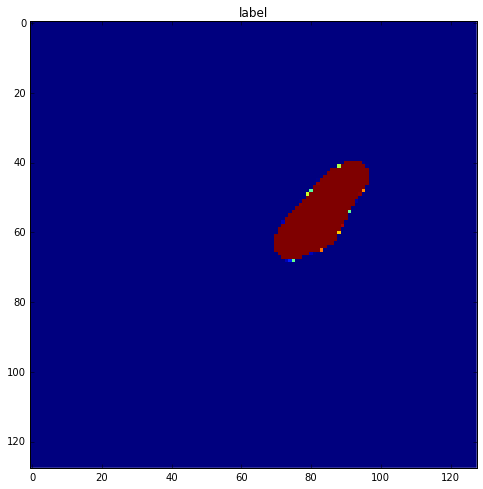

No label, skipping 29_24
No label, skipping 29_26
No label, skipping 20_16
step: 8205, loss: 0.0013183883857, dice: [ 0.76592028]
No label, skipping 20_12
No label, skipping 20_11
No label, skipping 20_18
step: 8210, loss: 0.0508646406233, dice: [ 0.33892256]
No label, skipping 22_18
No label, skipping 22_15
No label, skipping 22_14
No label, skipping 22_17
No label, skipping 22_16
No label, skipping 22_10
No label, skipping 22_13
No label, skipping 21_49
No label, skipping 21_48
No label, skipping 21_43
No label, skipping 21_41
No label, skipping 21_47
No label, skipping 21_46
No label, skipping 21_45
No label, skipping 21_44
No label, skipping 34_78
step: 8215, loss: 0.0016902963398, dice: [ 0.54941595]
No label, skipping 34_70
No label, skipping 34_73
No label, skipping 34_74
No label, skipping 34_76
No label, skipping 34_77
step: 8220, loss: 0.0417428053916, dice: [ 0.48267785]
No label, skipping 24_11
No label, skipping 24_10
step: 8225, loss: 0.00153000745922, dice: [ 0.50021976]

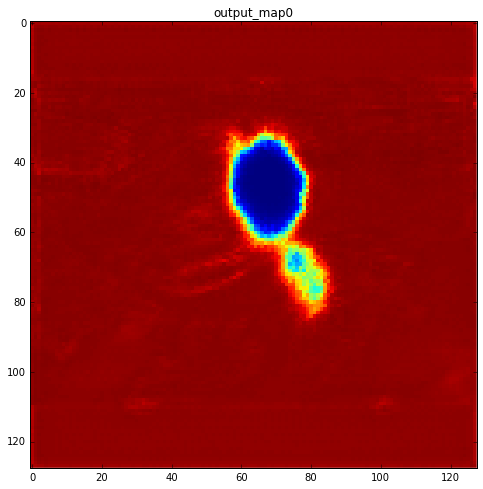

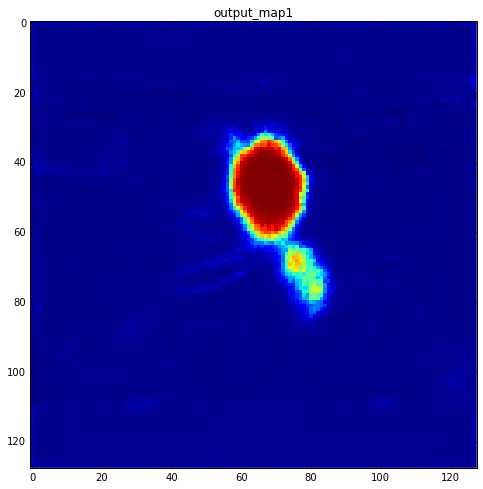

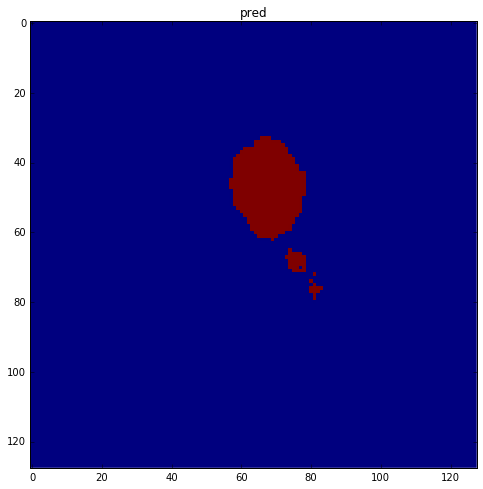

map0 max: 0.996650099754, map1 max: 0.999724805355, pred max: 1


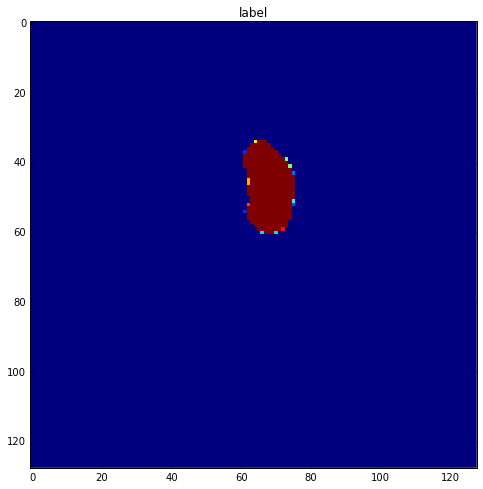

No label, skipping 26_36
No label, skipping 26_35
No label, skipping 26_34
No label, skipping 26_33
No label, skipping 26_32
No label, skipping 26_31
No label, skipping 22_9
No label, skipping 22_8
No label, skipping 22_4
No label, skipping 22_7
No label, skipping 22_6
No label, skipping 22_1
No label, skipping 22_3
No label, skipping 22_2
No label, skipping 35_14
No label, skipping 35_17
step: 8305, loss: 0.00160186260473, dice: [ 0.63316935]
No label, skipping 35_10
No label, skipping 35_19
No label, skipping 36_43
No label, skipping 36_42
step: 8310, loss: 0.00199965690263, dice: [ 0.51811463]
No label, skipping 36_40
No label, skipping 36_47
No label, skipping 36_46
No label, skipping 36_49
No label, skipping 36_48
No label, skipping 30_69
No label, skipping 30_68
No label, skipping 30_63
No label, skipping 30_62
No label, skipping 30_61
No label, skipping 30_67
No label, skipping 30_65
No label, skipping 30_64
No label, skipping 43_120
No label, skipping 5_39
No label, skipping 5_

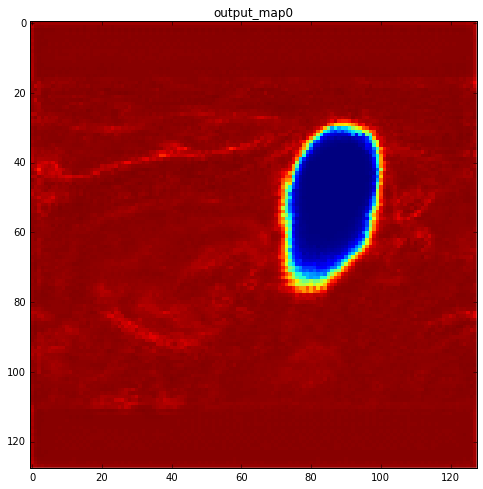

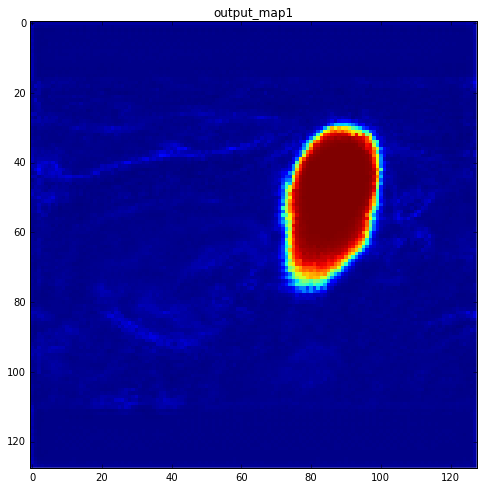

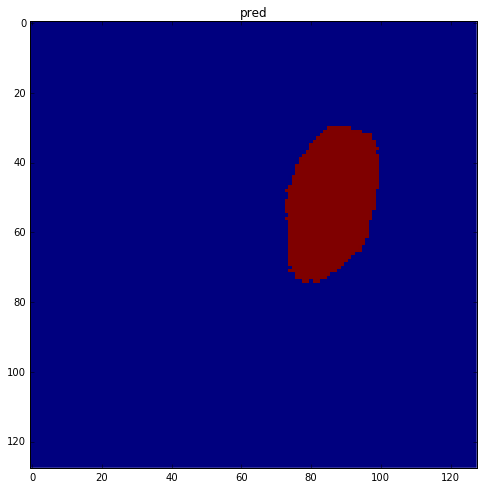

map0 max: 0.994151830673, map1 max: 0.999993264675, pred max: 1


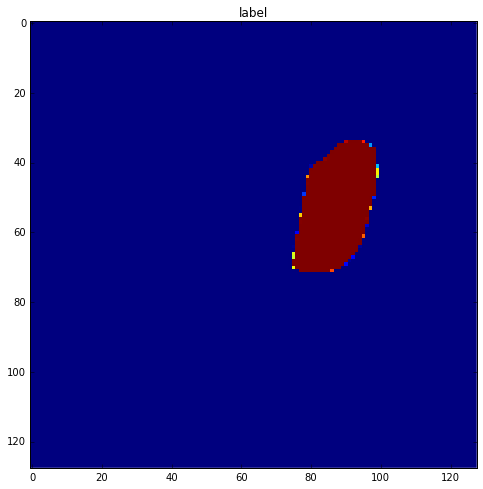

step: 8405, loss: 0.00343452743255, dice: [ 0.54740942]
No label, skipping 11_43
No label, skipping 17_1
No label, skipping 17_3
No label, skipping 43_29
No label, skipping 17_79
No label, skipping 17_77
No label, skipping 17_76
No label, skipping 17_75
No label, skipping 17_74
No label, skipping 17_73
step: 8410, loss: 0.0332279726863, dice: [ 0.60708505]
No label, skipping 43_26
No label, skipping 19_71
No label, skipping 45_49
No label, skipping 45_48
No label, skipping 45_44
No label, skipping 45_47
No label, skipping 45_46
No label, skipping 45_41
No label, skipping 45_40
No label, skipping 45_43
No label, skipping 45_42
No label, skipping 36_109
step: 8415, loss: 0.000943945546169, dice: [ 0.70905828]
No label, skipping 36_103
No label, skipping 36_102
No label, skipping 36_107
No label, skipping 36_106
No label, skipping 23_111
step: 8420, loss: 0.0013377800351, dice: [ 0.66729689]
No label, skipping 23_114
step: 8425, loss: 0.00247479625978, dice: [ 0.43293598]
No label, skippi

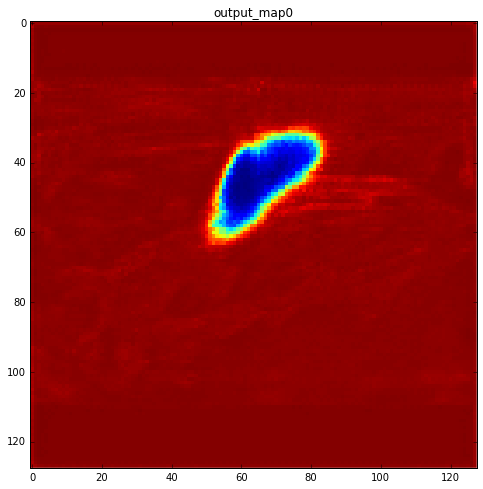

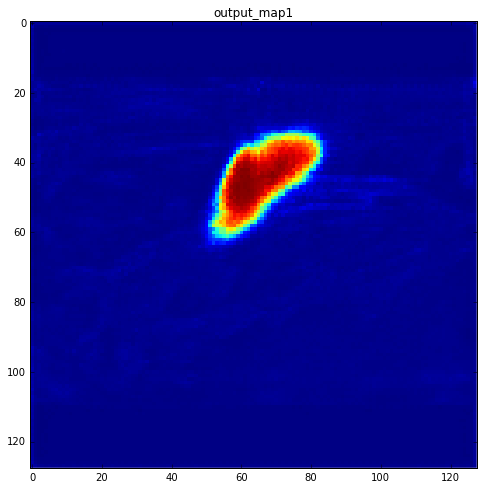

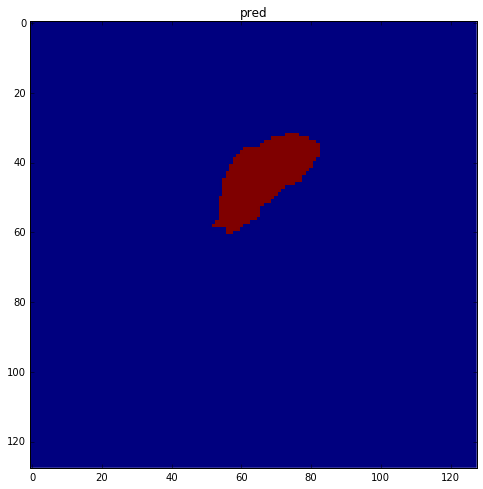

map0 max: 0.993799984455, map1 max: 0.982029378414, pred max: 1


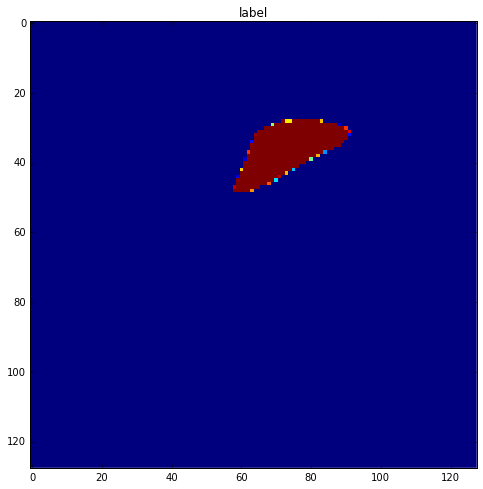

No label, skipping 35_73
No label, skipping 35_72
No label, skipping 35_70
No label, skipping 35_78
No label, skipping 5_99
No label, skipping 5_98
No label, skipping 5_97
No label, skipping 5_96
step: 8505, loss: 0.00157413503621, dice: [ 0.469625]
No label, skipping 5_92
No label, skipping 5_91
No label, skipping 5_90
No label, skipping 47_105
No label, skipping 47_104
No label, skipping 47_107
No label, skipping 47_106
No label, skipping 47_101
No label, skipping 47_100
No label, skipping 47_103
No label, skipping 47_102
No label, skipping 47_109
No label, skipping 13_54
No label, skipping 12_109
No label, skipping 12_108
No label, skipping 12_103
No label, skipping 12_102
No label, skipping 12_101
No label, skipping 12_100
No label, skipping 12_107
No label, skipping 12_106
No label, skipping 12_104
step: 8510, loss: 0.011009933427, dice: [ 0.81751668]
No label, skipping 7_27
step: 8515, loss: 0.0203008521348, dice: [ 0.69224846]
No label, skipping 4_109
No label, skipping 4_108
No

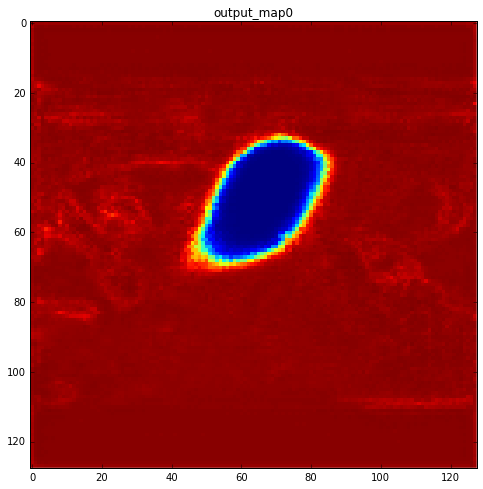

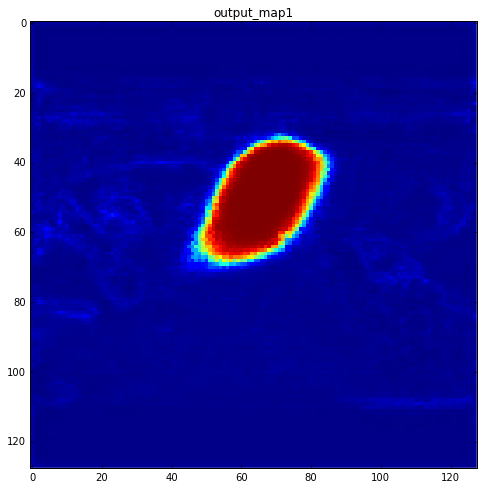

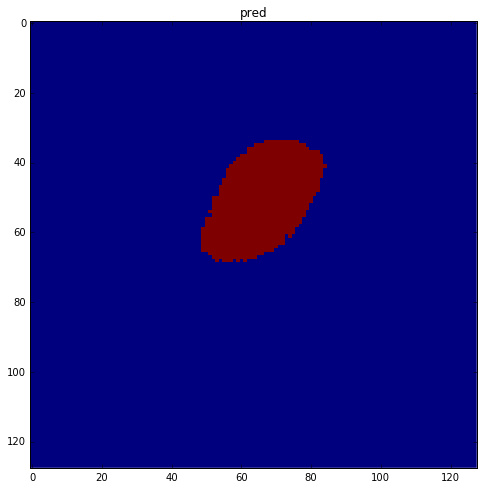

map0 max: 0.995913267136, map1 max: 0.999996423721, pred max: 1


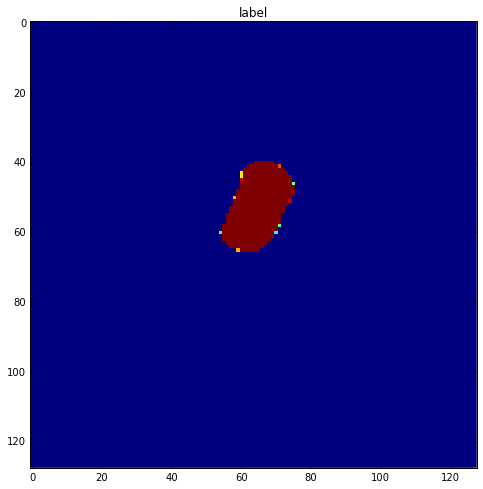

No label, skipping 10_17
No label, skipping 10_10
No label, skipping 10_12
No label, skipping 10_13
No label, skipping 37_97
No label, skipping 37_94
step: 8605, loss: 0.0028747653123, dice: [ 0.4249014]
No label, skipping 22_115
No label, skipping 22_114
No label, skipping 22_117
No label, skipping 22_116
No label, skipping 22_111
No label, skipping 22_110
step: 8610, loss: 0.00532053504139, dice: [ 0.87784302]
No label, skipping 27_111
No label, skipping 12_18
No label, skipping 12_19
No label, skipping 12_13
No label, skipping 12_10
No label, skipping 12_11
No label, skipping 12_16
No label, skipping 12_17
No label, skipping 12_14
No label, skipping 12_15
No label, skipping 8_73
No label, skipping 8_70
No label, skipping 8_71
No label, skipping 8_76
No label, skipping 8_77
No label, skipping 8_74
No label, skipping 8_78
No label, skipping 8_79
No label, skipping 25_90
step: 8615, loss: 0.00232396274805, dice: [ 0.40337926]
No label, skipping 28_120
No label, skipping 7_110
No label,

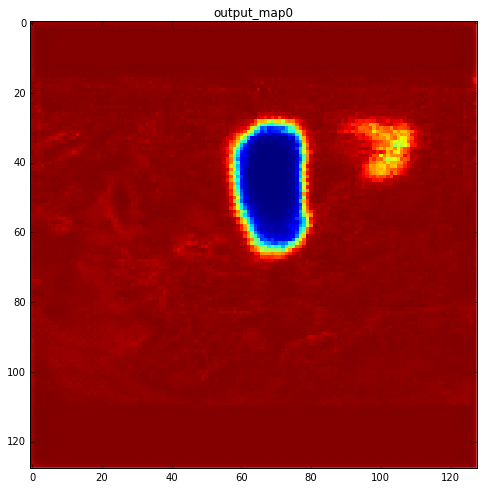

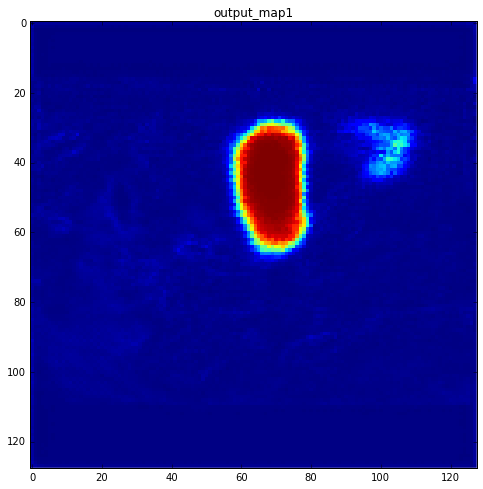

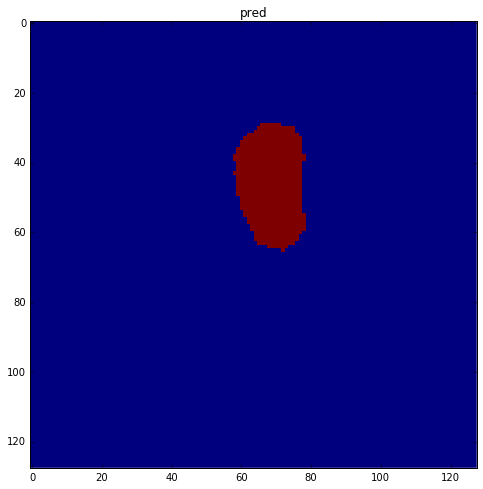

map0 max: 0.992384135723, map1 max: 0.999738752842, pred max: 1


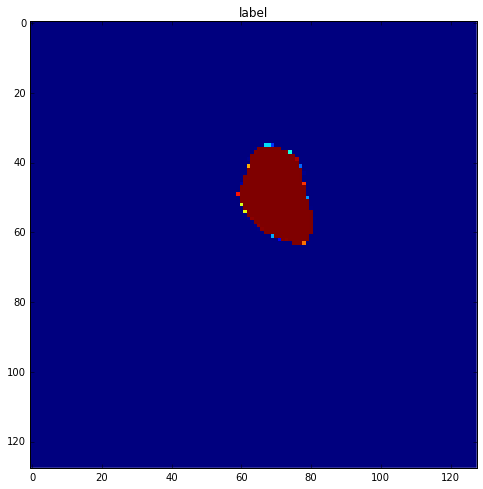

No label, skipping 25_33
No label, skipping 25_30
No label, skipping 25_31
No label, skipping 25_38
No label, skipping 25_39
No label, skipping 47_83
No label, skipping 47_82
No label, skipping 47_81
No label, skipping 47_80
No label, skipping 47_87
No label, skipping 47_86
No label, skipping 47_84
No label, skipping 47_89
No label, skipping 47_88
No label, skipping 1_22
No label, skipping 36_88
step: 8705, loss: 0.00214329431765, dice: [ 0.49533743]
No label, skipping 36_84
No label, skipping 36_83
No label, skipping 36_81
step: 8710, loss: 0.00106193788815, dice: [ 0.59490544]
No label, skipping 38_73
No label, skipping 27_78
No label, skipping 27_79
No label, skipping 27_74
No label, skipping 27_75
No label, skipping 27_76
No label, skipping 27_77
No label, skipping 27_70
No label, skipping 27_71
No label, skipping 27_72
No label, skipping 27_73
No label, skipping 28_59
No label, skipping 28_58
No label, skipping 28_53
No label, skipping 28_52
No label, skipping 28_55
step: 8715, lo

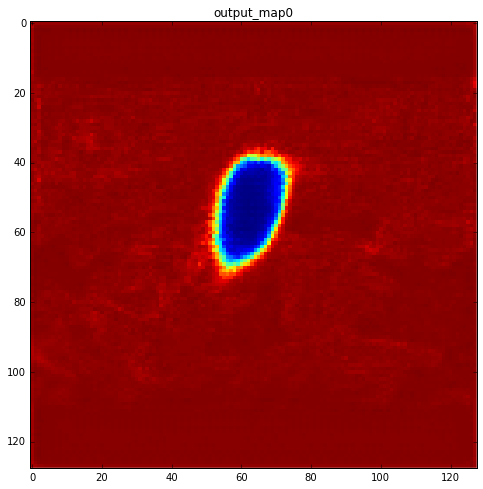

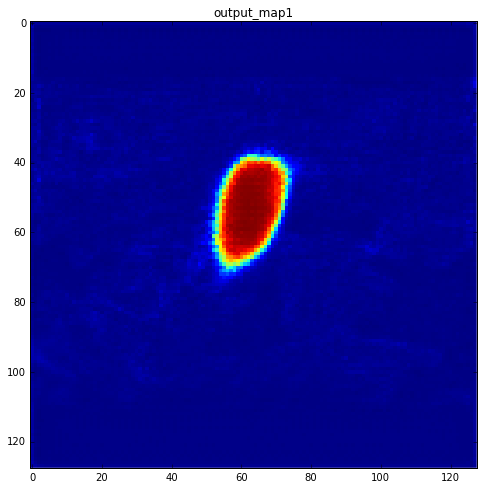

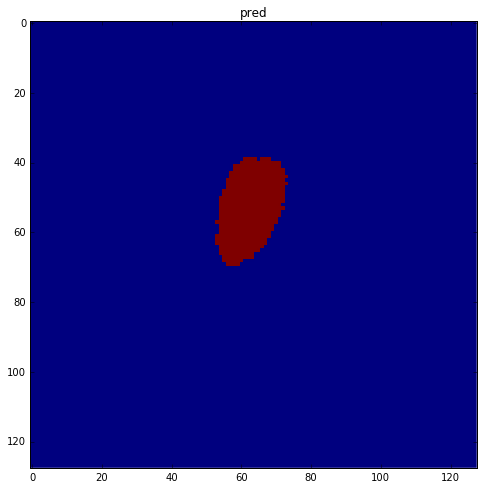

map0 max: 0.992575585842, map1 max: 0.991485059261, pred max: 1


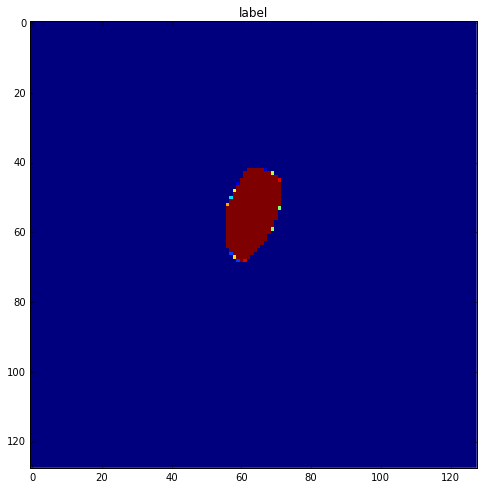

No label, skipping 26_103
No label, skipping 26_100
No label, skipping 26_101
No label, skipping 26_106
No label, skipping 26_107
step: 8805, loss: 0.00234344578348, dice: [ 0.76431781]
step: 8810, loss: 0.00122619478498, dice: [ 0.6289317]
No label, skipping 27_18
No label, skipping 27_19
No label, skipping 27_12
No label, skipping 27_13
No label, skipping 27_10
No label, skipping 27_11
No label, skipping 27_16
No label, skipping 27_17
No label, skipping 27_14
No label, skipping 27_15
No label, skipping 17_60
No label, skipping 17_61
No label, skipping 17_63
No label, skipping 17_64
No label, skipping 43_37
No label, skipping 43_35
No label, skipping 33_26
step: 8815, loss: 0.00165269745048, dice: [ 0.71170104]
No label, skipping 33_25
No label, skipping 33_22
No label, skipping 33_23
No label, skipping 33_20
No label, skipping 33_21
No label, skipping 33_28
step: 8820, loss: 0.00107056600973, dice: [ 0.64554763]
No label, skipping 28_32
No label, skipping 28_34
No label, skipping 28_

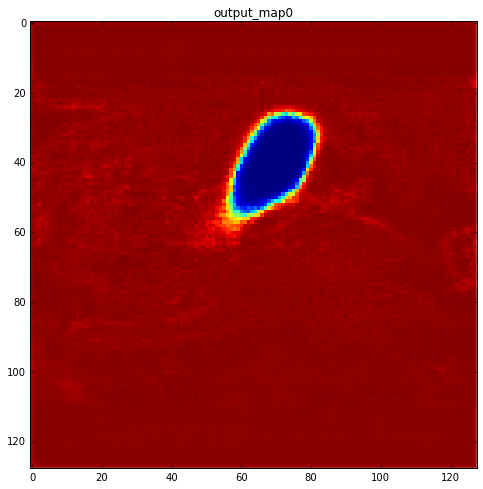

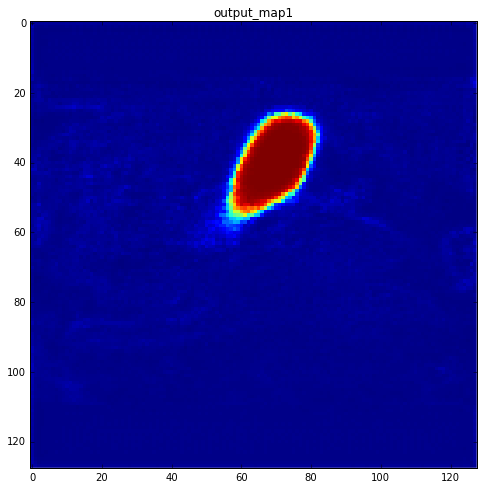

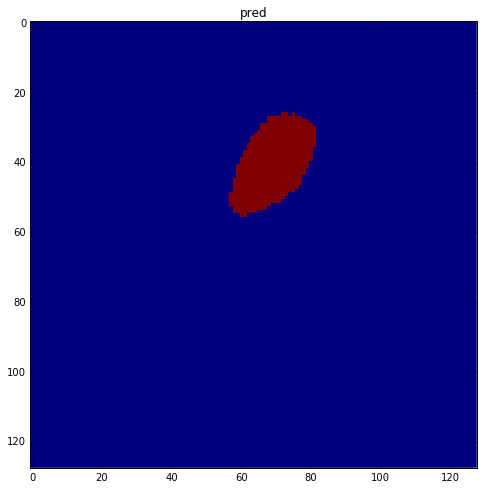

map0 max: 0.995406210423, map1 max: 0.999968588352, pred max: 1


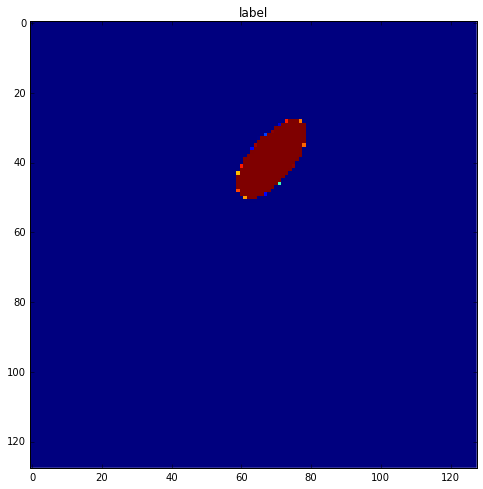

No label, skipping 42_73
No label, skipping 42_72
step: 8905, loss: 0.00132525723893, dice: [ 0.55445242]
No label, skipping 19_2
No label, skipping 19_8
No label, skipping 11_8
step: 8910, loss: 0.00226042000577, dice: [ 0.60680979]
No label, skipping 11_4
No label, skipping 27_30
No label, skipping 27_31
No label, skipping 27_32
No label, skipping 27_33
No label, skipping 27_34
No label, skipping 27_35
No label, skipping 27_36
step: 8915, loss: 0.0459124520421, dice: [ 0.1285671]
No label, skipping 27_38
No label, skipping 27_39
No label, skipping 26_120
No label, skipping 2_29
No label, skipping 2_28
No label, skipping 2_27
No label, skipping 2_26
No label, skipping 2_25
No label, skipping 2_24
No label, skipping 2_22
No label, skipping 2_21
No label, skipping 2_20
step: 8920, loss: 0.00164417631458, dice: [ 0.54824942]
No label, skipping 28_14
No label, skipping 28_13
No label, skipping 28_12
No label, skipping 28_11
No label, skipping 28_10
No label, skipping 15_119
No label, skip

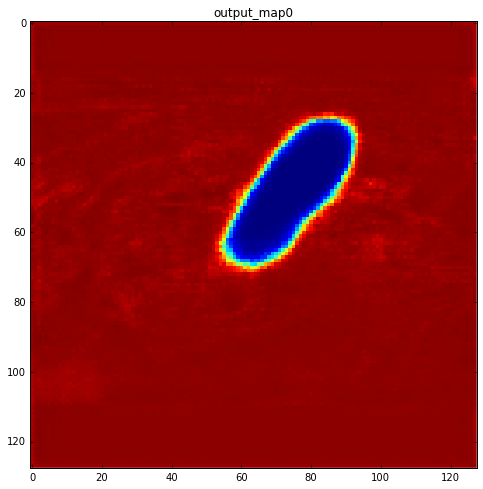

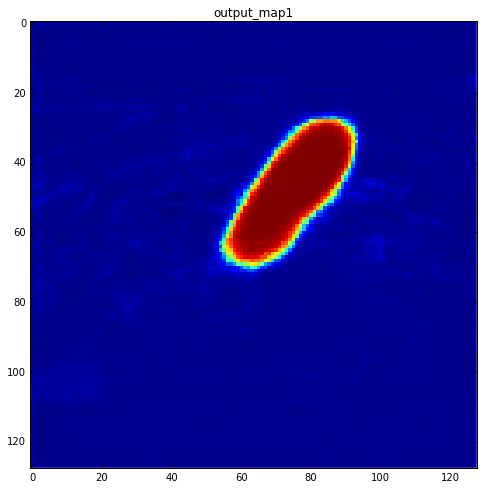

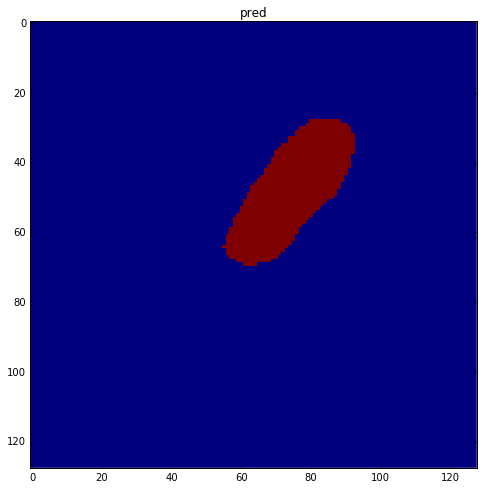

map0 max: 0.996792018414, map1 max: 0.999976873398, pred max: 1


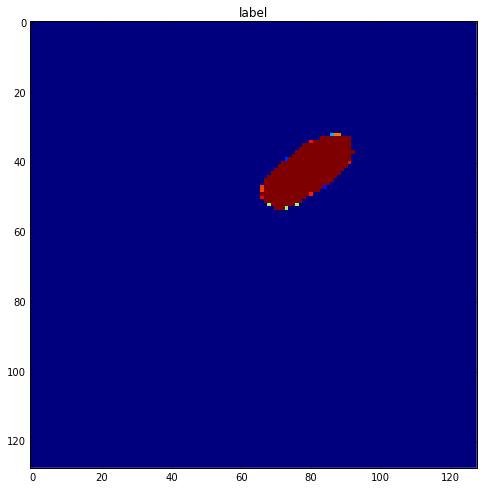

No label, skipping 42_50
step: 9005, loss: 0.000862139975652, dice: [ 0.69892341]
No label, skipping 1_34
No label, skipping 25_50
No label, skipping 25_51
No label, skipping 25_52
step: 9010, loss: 0.00192921073176, dice: [ 0.43683845]
No label, skipping 25_56
No label, skipping 25_57
No label, skipping 25_59
No label, skipping 17_86
No label, skipping 17_87
step: 9015, loss: 0.00203546253033, dice: [ 0.56543946]
No label, skipping 17_85
No label, skipping 17_82
No label, skipping 17_83
No label, skipping 17_80
No label, skipping 17_81
No label, skipping 17_88
No label, skipping 14_93
No label, skipping 14_94
No label, skipping 14_95
No label, skipping 14_96
No label, skipping 14_97
No label, skipping 14_98
No label, skipping 14_99
No label, skipping 11_88
No label, skipping 11_89
step: 9020, loss: 0.00235135899857, dice: [ 0.56899518]
No label, skipping 11_85
No label, skipping 11_87
No label, skipping 11_81
No label, skipping 11_83
No label, skipping 16_68
No label, skipping 33_68
N

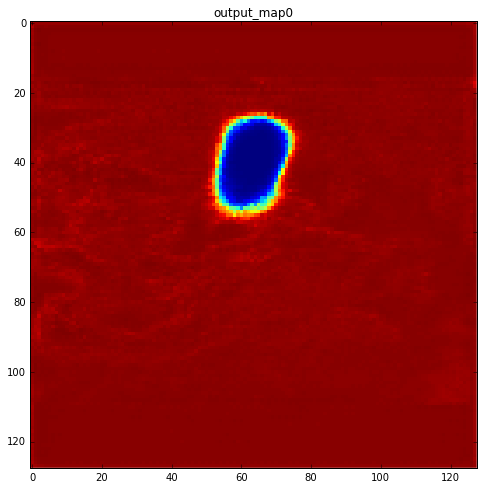

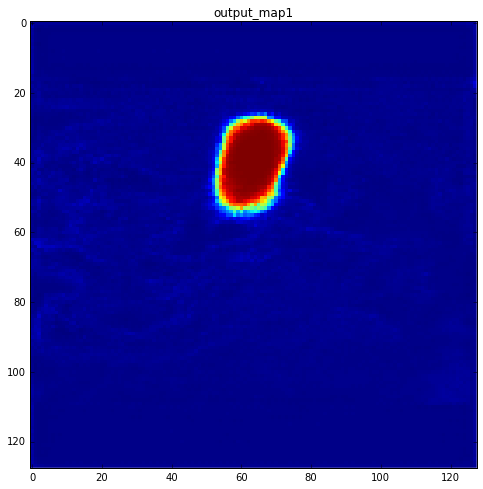

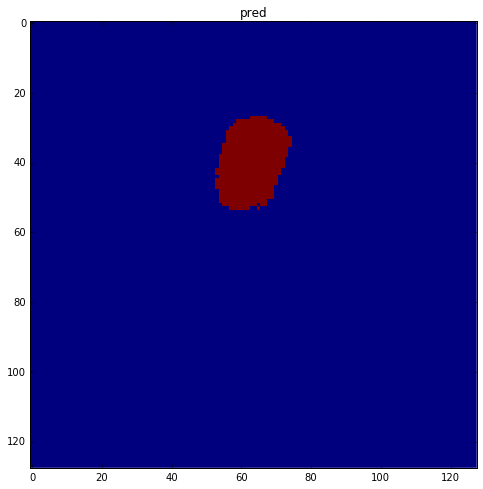

map0 max: 0.995253741741, map1 max: 0.999765276909, pred max: 1


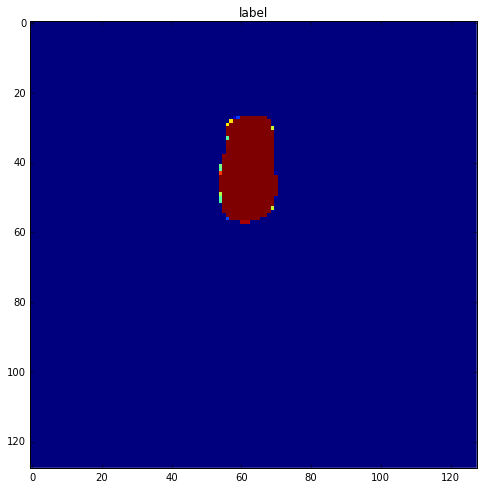

No label, skipping 15_66
No label, skipping 15_67
No label, skipping 15_65
No label, skipping 15_62
No label, skipping 15_63
step: 9105, loss: 0.00324423285201, dice: [ 0.49748307]
No label, skipping 15_68
No label, skipping 15_69
No label, skipping 14_79
No label, skipping 14_76
No label, skipping 14_77
No label, skipping 14_74
No label, skipping 14_75
No label, skipping 14_73
No label, skipping 14_70
step: 9110, loss: 0.00147209095303, dice: [ 0.84098691]
No label, skipping 2_63
No label, skipping 33_41
No label, skipping 33_44
No label, skipping 2_66
No label, skipping 33_46
No label, skipping 33_47
No label, skipping 33_49
No label, skipping 2_69
No label, skipping 2_68
step: 9115, loss: 0.00459590740502, dice: [ 0.64616859]
No label, skipping 20_67
No label, skipping 20_63
step: 9120, loss: 0.00154501467478, dice: [ 0.80964154]
No label, skipping 20_68
No label, skipping 20_69
No label, skipping 35_91
No label, skipping 34_29
step: 9125, loss: 0.000931350223254, dice: [ 0.59858263

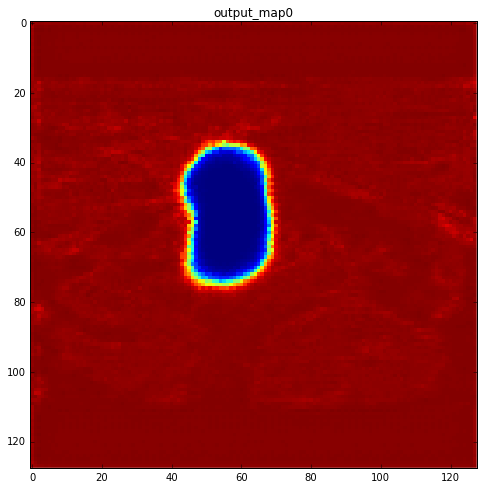

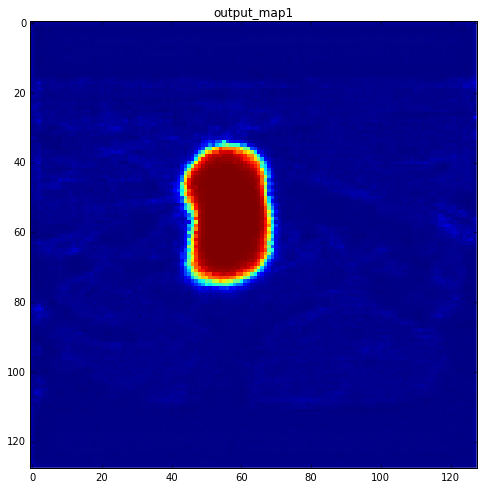

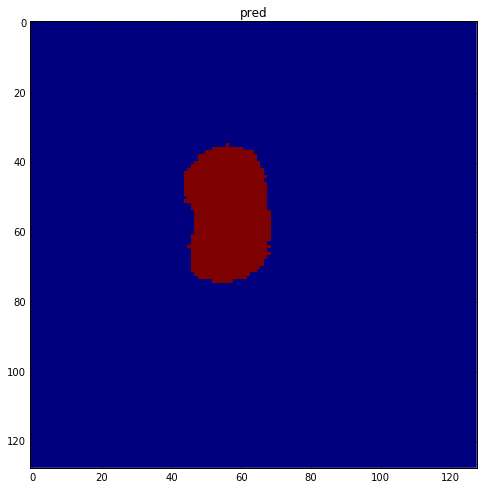

map0 max: 0.99466085434, map1 max: 0.999983072281, pred max: 1


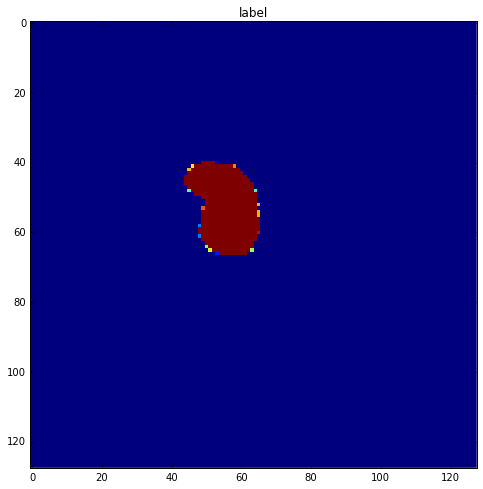

No label, skipping 16_9
No label, skipping 29_76
No label, skipping 29_74
No label, skipping 29_75
No label, skipping 29_70
step: 9205, loss: 0.0016491265269, dice: [ 0.68520069]
No label, skipping 29_79
No label, skipping 20_46
No label, skipping 20_47
No label, skipping 20_40
step: 9210, loss: 0.0022921168711, dice: [ 0.52648073]
step: 9215, loss: 0.0012865747558, dice: [ 0.61083645]
No label, skipping 38_97
No label, skipping 38_94
No label, skipping 38_95
No label, skipping 38_98
No label, skipping 38_99
No label, skipping 21_90
No label, skipping 21_91
No label, skipping 21_93
No label, skipping 21_95
No label, skipping 21_96
No label, skipping 21_97
step: 9220, loss: 0.00133498630021, dice: [ 0.66372573]
No label, skipping 21_99
No label, skipping 34_43
No label, skipping 34_42
step: 9225, loss: 0.000945419131313, dice: [ 0.86182886]
No label, skipping 34_48
No label, skipping 46_93
No label, skipping 46_91
No label, skipping 32_54
No label, skipping 46_96
No label, skipping 46_9

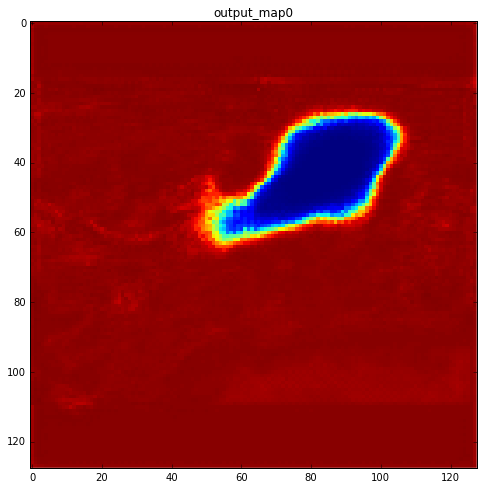

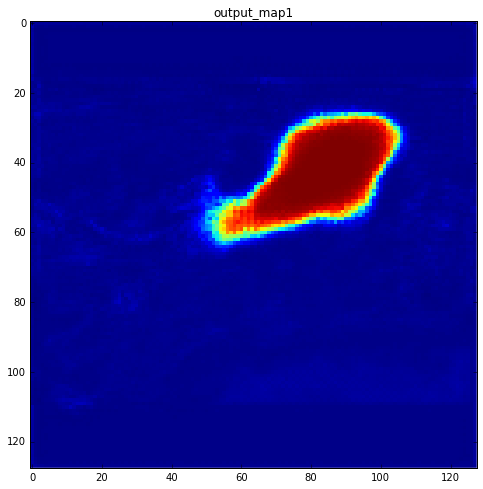

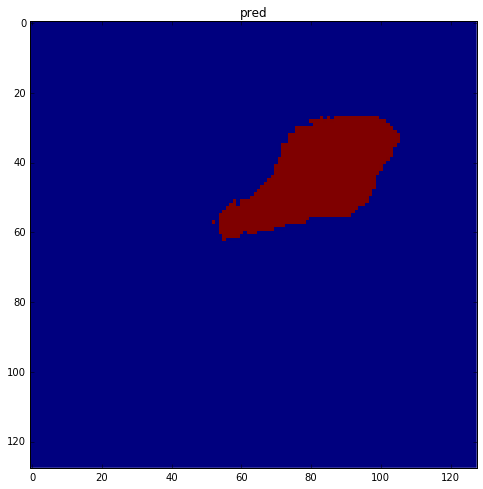

map0 max: 0.996609866619, map1 max: 0.999808847904, pred max: 1


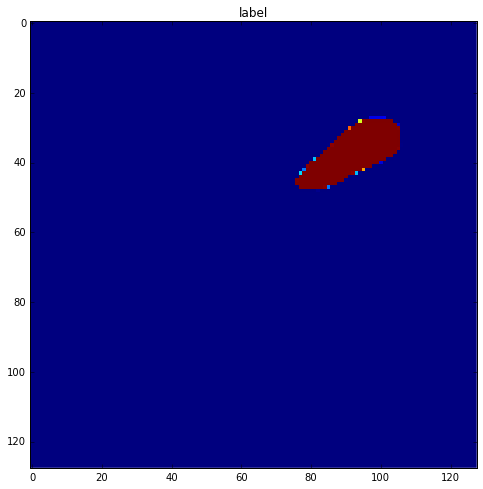

No label, skipping 29_54
No label, skipping 29_55
No label, skipping 29_56
No label, skipping 29_50
No label, skipping 29_53
No label, skipping 4_19
No label, skipping 4_14
No label, skipping 4_15
step: 9305, loss: 0.0374135710299, dice: [ 0.18257202]
No label, skipping 4_17
No label, skipping 4_10
No label, skipping 4_12
No label, skipping 4_13
No label, skipping 20_29
No label, skipping 20_20
step: 9310, loss: 0.00221852818504, dice: [ 0.72972006]
No label, skipping 20_27
No label, skipping 20_24
No label, skipping 21_78
step: 9315, loss: 0.00178076873999, dice: [ 0.7162298]
No label, skipping 21_74
No label, skipping 21_75
No label, skipping 21_72
No label, skipping 21_73
No label, skipping 21_70
No label, skipping 14_56
No label, skipping 34_69
No label, skipping 34_68
step: 9320, loss: 0.000954043702222, dice: [ 0.61629903]
No label, skipping 34_61
No label, skipping 24_28
No label, skipping 24_26
No label, skipping 24_27
No label, skipping 24_24
No label, skipping 24_25
step: 932

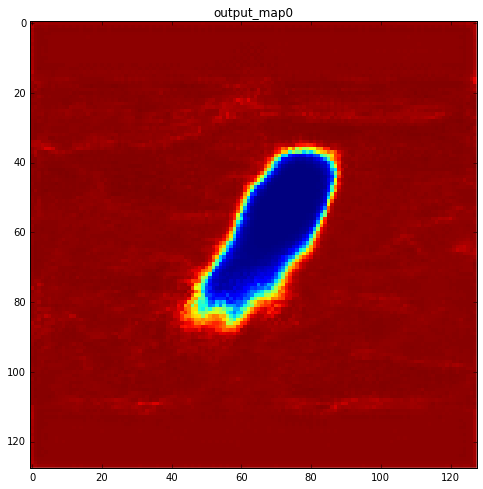

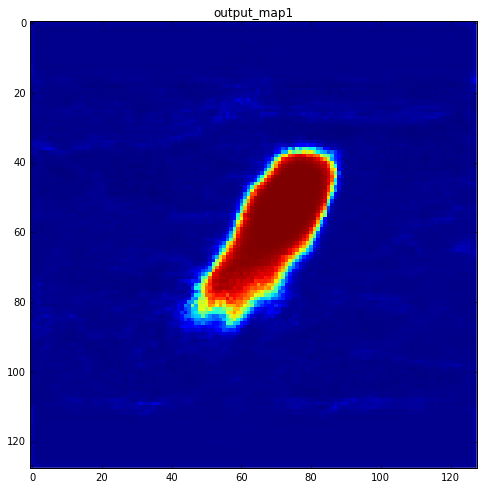

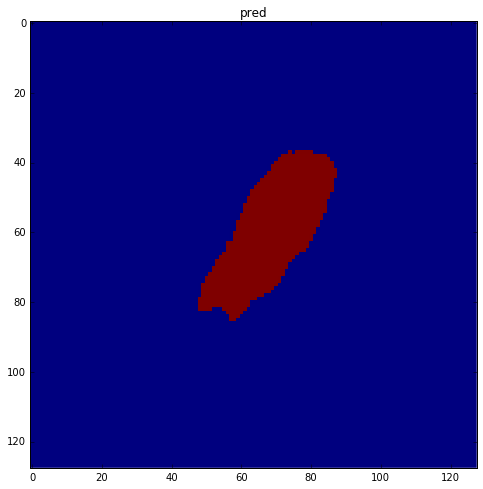

map0 max: 0.998078227043, map1 max: 0.99999153614, pred max: 1


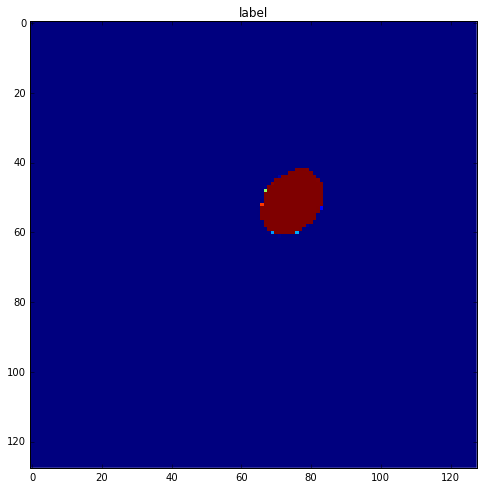

No label, skipping 11_100
No label, skipping 11_101
No label, skipping 11_102
No label, skipping 39_48
No label, skipping 39_49
No label, skipping 39_46
No label, skipping 39_47
No label, skipping 39_44
No label, skipping 39_45
No label, skipping 39_42
No label, skipping 39_43
No label, skipping 39_40
No label, skipping 39_41
No label, skipping 26_9
No label, skipping 45_98
No label, skipping 45_99
No label, skipping 45_92
No label, skipping 45_93
No label, skipping 45_90
step: 9405, loss: 0.000931001559366, dice: [ 0.65050805]
No label, skipping 26_4
No label, skipping 26_7
No label, skipping 26_6
No label, skipping 17_26
No label, skipping 43_75
No label, skipping 43_72
No label, skipping 17_21
No label, skipping 43_70
No label, skipping 43_71
No label, skipping 17_29
No label, skipping 43_78
No label, skipping 43_79
step: 9410, loss: 0.00206981808878, dice: [ 0.56501013]
No label, skipping 29_6
No label, skipping 29_5
No label, skipping 29_9
step: 9415, loss: 0.00144695909694, dice:

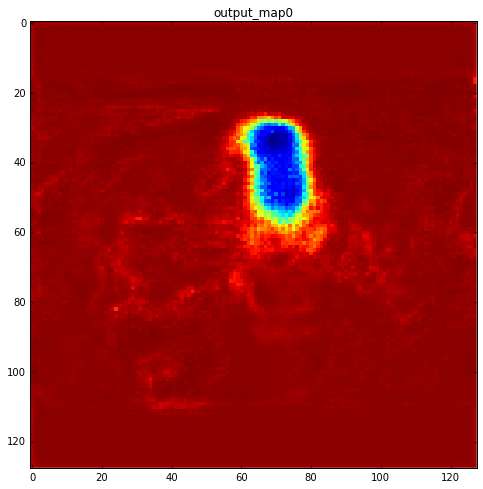

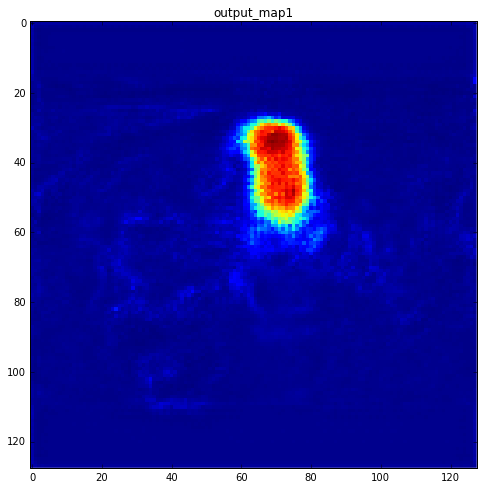

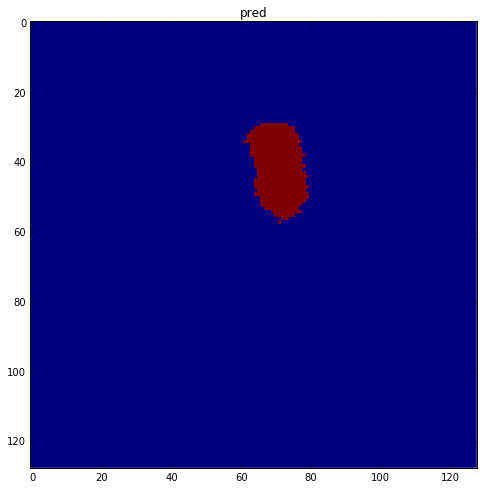

map0 max: 0.997266113758, map1 max: 0.944037556648, pred max: 1


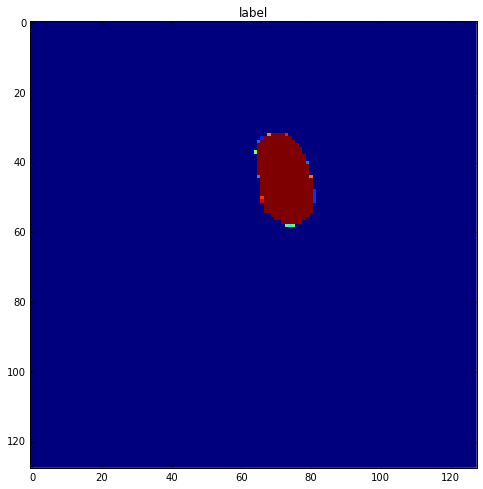

No label, skipping 18_5
No label, skipping 18_3
No label, skipping 18_1
No label, skipping 6_38
No label, skipping 6_30
No label, skipping 6_32
No label, skipping 6_33
No label, skipping 6_34
No label, skipping 6_35
No label, skipping 6_36
No label, skipping 6_37
No label, skipping 4_78
No label, skipping 4_79
No label, skipping 4_76
No label, skipping 4_77
step: 9505, loss: 0.00196570111439, dice: [ 0.53143096]
No label, skipping 4_72
No label, skipping 4_73
No label, skipping 4_70
No label, skipping 4_71
No label, skipping 21_18
No label, skipping 21_19
No label, skipping 21_10
No label, skipping 21_11
No label, skipping 21_12
No label, skipping 21_13
No label, skipping 21_14
No label, skipping 21_15
No label, skipping 21_16
No label, skipping 21_17
No label, skipping 34_105
No label, skipping 34_104
step: 9510, loss: 0.000899621692952, dice: [ 0.82942158]
No label, skipping 34_101
No label, skipping 34_109
No label, skipping 34_108
No label, skipping 22_42
No label, skipping 22_43
N

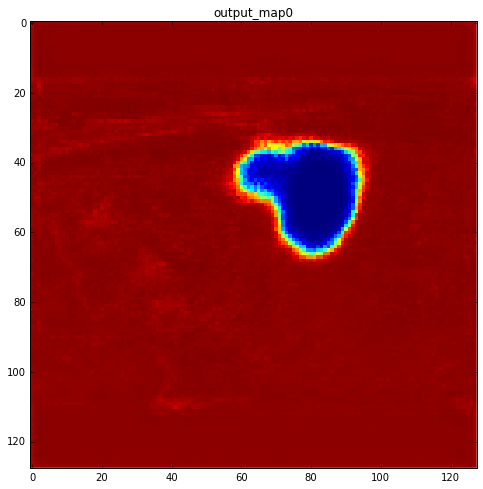

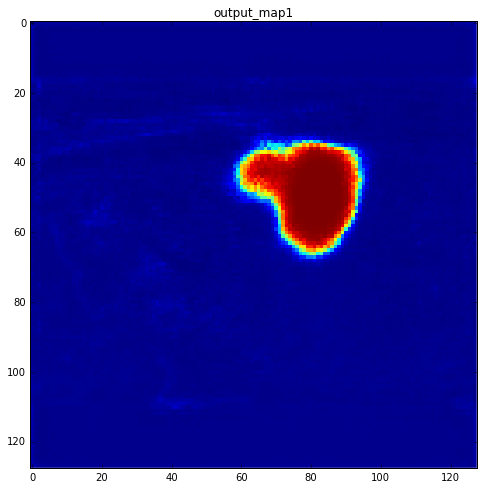

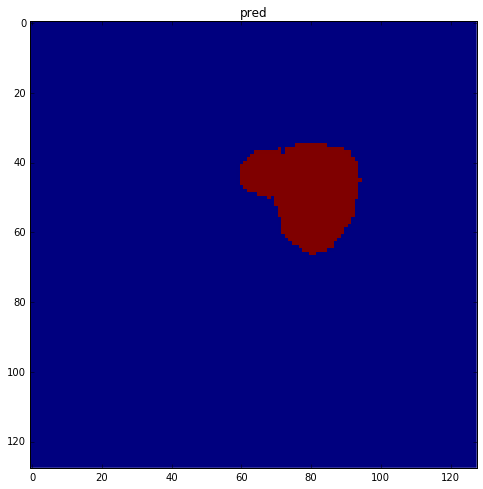

map0 max: 0.997998476028, map1 max: 0.999960958958, pred max: 1


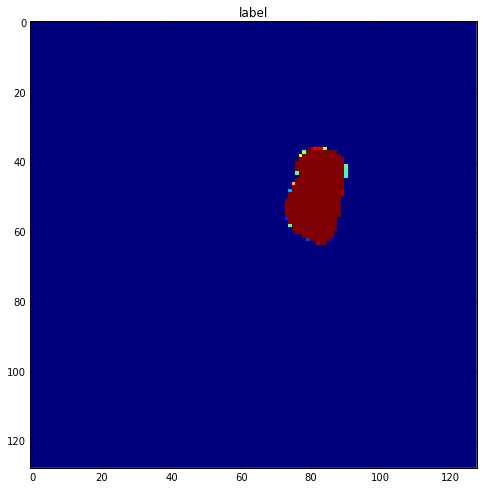

No label, skipping 43_13
No label, skipping 43_14
No label, skipping 43_16
No label, skipping 43_17
No label, skipping 43_19
No label, skipping 45_74
No label, skipping 45_75
No label, skipping 45_77
No label, skipping 45_70
No label, skipping 45_71
No label, skipping 45_72
No label, skipping 45_73
No label, skipping 45_78
No label, skipping 45_79
No label, skipping 10_25
step: 9605, loss: 0.000962004123721, dice: [ 0.64920408]
No label, skipping 10_21
No label, skipping 10_20
No label, skipping 10_23
No label, skipping 10_22
No label, skipping 10_29
No label, skipping 46_113
No label, skipping 46_112
No label, skipping 46_111
No label, skipping 46_110
No label, skipping 46_117
No label, skipping 46_116
No label, skipping 46_114
No label, skipping 46_119
No label, skipping 46_118
No label, skipping 20_88
step: 9610, loss: 0.00280695501715, dice: [ 0.51538324]
No label, skipping 20_81
No label, skipping 20_82
No label, skipping 20_83
No label, skipping 20_84
No label, skipping 20_85
No 

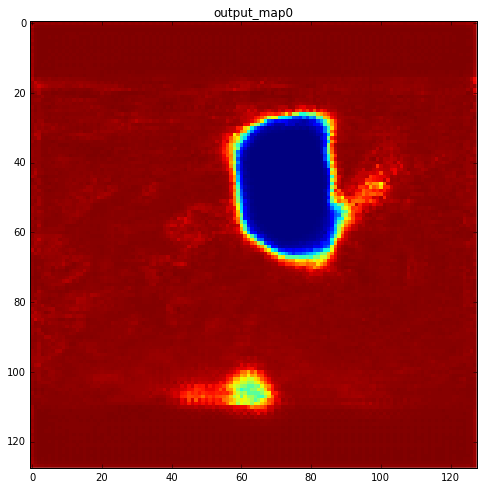

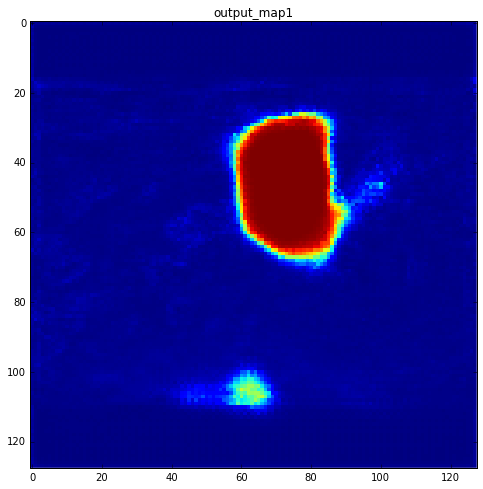

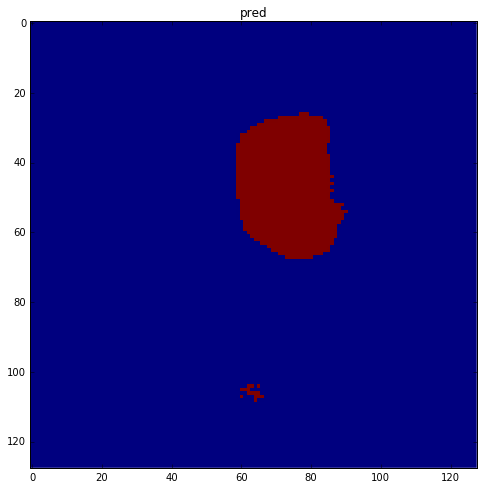

map0 max: 0.995246529579, map1 max: 1.0, pred max: 1


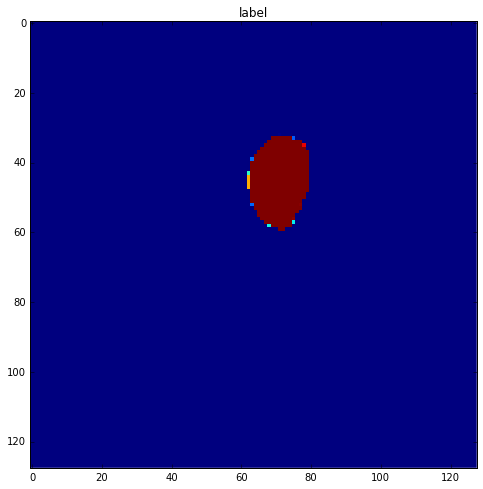

No label, skipping 28_85
No label, skipping 28_86
No label, skipping 28_87
No label, skipping 28_88
No label, skipping 7_18
step: 9705, loss: 0.00146881246474, dice: [ 0.637205]
step: 9710, loss: 0.00144674675539, dice: [ 0.60038853]
No label, skipping 33_71
No label, skipping 2_10
No label, skipping 19_13
No label, skipping 2_11
No label, skipping 1_79
No label, skipping 19_16
step: 9715, loss: 0.00173237314448, dice: [ 0.58039212]
No label, skipping 2_16
No label, skipping 1_76
No label, skipping 1_71
No label, skipping 1_70
No label, skipping 1_73
No label, skipping 2_17
No label, skipping 40_48
No label, skipping 40_49
No label, skipping 33_77
No label, skipping 2_109
No label, skipping 2_108
No label, skipping 2_107
No label, skipping 40_43
No label, skipping 2_105
No label, skipping 40_41
No label, skipping 2_103
No label, skipping 2_102
No label, skipping 40_44
No label, skipping 2_100
No label, skipping 45_38
No label, skipping 45_30
No label, skipping 45_31
No label, skipping 

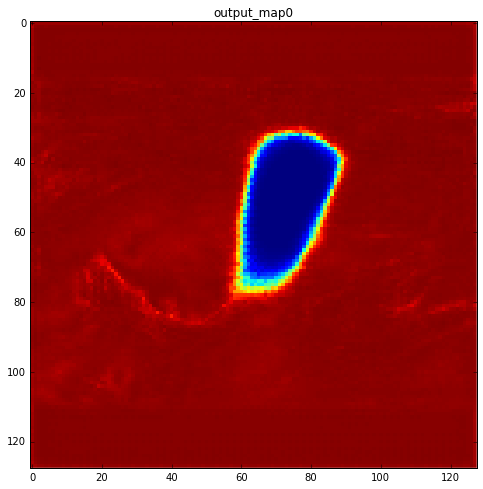

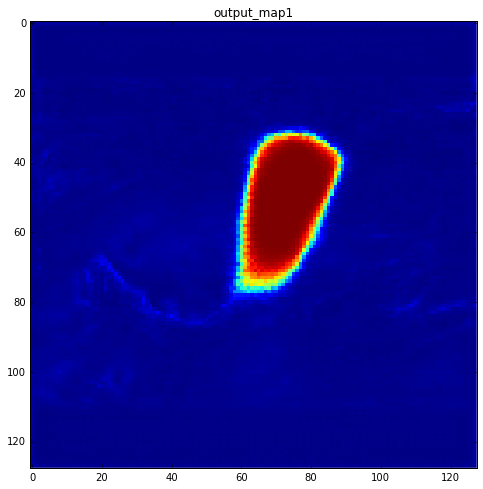

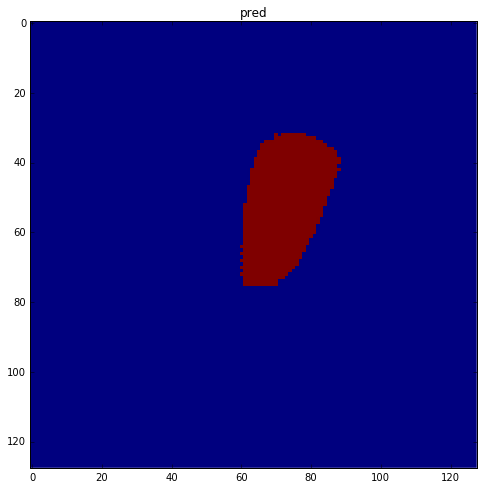

map0 max: 0.996799230576, map1 max: 0.999998152256, pred max: 1


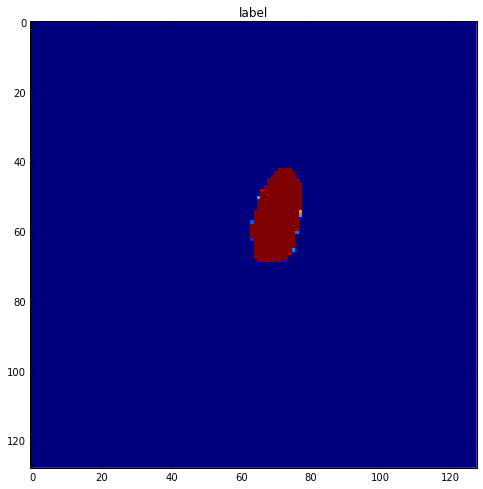

No label, skipping 19_76
No label, skipping 38_63
No label, skipping 38_61
No label, skipping 38_67
No label, skipping 38_66
No label, skipping 38_65
No label, skipping 38_64
No label, skipping 38_68
No label, skipping 9_49
No label, skipping 9_44
step: 9805, loss: 0.00117189134471, dice: [ 0.64086598]
No label, skipping 9_40
No label, skipping 9_42
step: 9810, loss: 0.00145488290582, dice: [ 0.63323998]
step: 9815, loss: 0.00108395912685, dice: [ 0.70127177]
No label, skipping 16_44
No label, skipping 34_96
step: 9820, loss: 0.0010025681695, dice: [ 0.58087456]
No label, skipping 34_95
No label, skipping 34_90
No label, skipping 34_98
No label, skipping 34_99
step: 9825, loss: 0.00194010674022, dice: [ 0.66347659]
No label, skipping 6_98
No label, skipping 6_99
No label, skipping 6_96
No label, skipping 6_97
No label, skipping 6_93
No label, skipping 6_90
step: 9830, loss: 0.00244967546314, dice: [ 0.47423449]
No label, skipping 37_67
step: 9835, loss: 0.00150415091775, dice: [ 0.6071

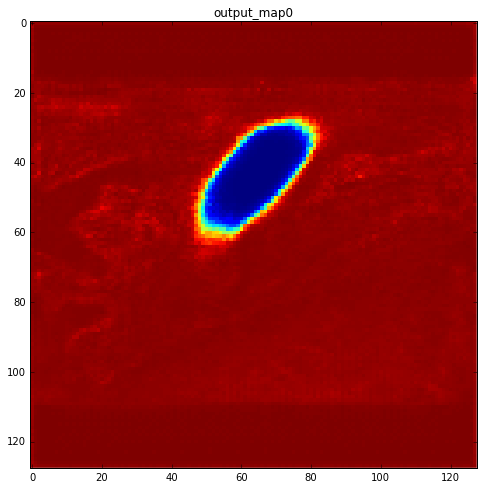

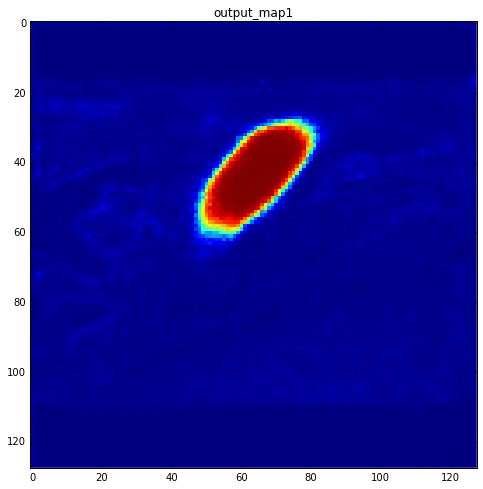

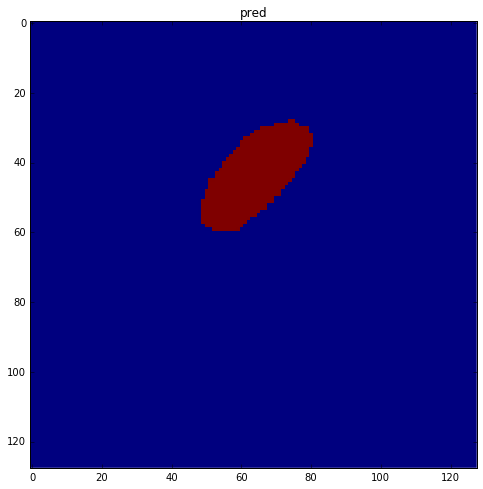

map0 max: 0.995529472828, map1 max: 0.999835133553, pred max: 1


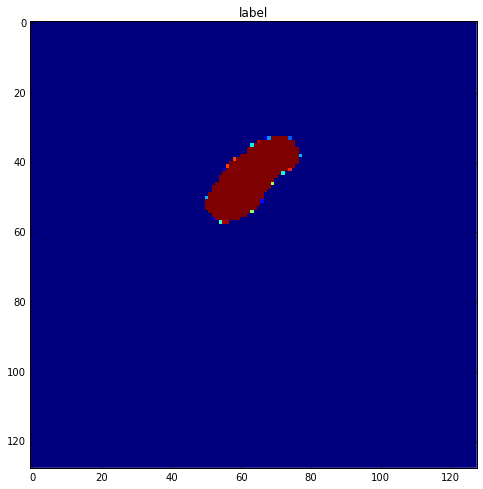

No label, skipping 24_7
No label, skipping 24_3
step: 9905, loss: 0.000994343543425, dice: [ 0.65277702]
No label, skipping 46_35
No label, skipping 46_37
No label, skipping 46_36
No label, skipping 46_30
No label, skipping 46_33
No label, skipping 46_32
No label, skipping 46_39
step: 9910, loss: 0.00227366155013, dice: [ 0.46274945]
step: 9915, loss: 0.00108990666922, dice: [ 0.78383571]
No label, skipping 37_48
step: 9920, loss: 0.00112007488497, dice: [ 0.71573365]
No label, skipping 42_102
No label, skipping 42_103
No label, skipping 42_105
No label, skipping 44_73
No label, skipping 44_72
step: 9925, loss: 0.000858536164742, dice: [ 0.78229785]
No label, skipping 44_75
No label, skipping 44_79
step: 9930, loss: 0.00111512572039, dice: [ 0.66217291]
No label, skipping 46_75
step: 9935, loss: 0.00142601702828, dice: [ 0.83498102]
No label, skipping 8_20
No label, skipping 8_23
No label, skipping 8_22
No label, skipping 8_27
No label, skipping 8_26
No label, skipping 8_29
No label, s

In [14]:
background = 1356132911.0
foreground = 16553089.0
ratio = foreground / (background + foreground)
print("Class ratio: {}".format(ratio))
class_weight = [ratio, 1.0 - ratio]

def cross_entropy(y_,output_map, num_classes=2):
    y_ = tf.cast(y_, tf.int32)
    labels = tf.one_hot(y_, num_classes, on_value=1.0, off_value=0.0,
                        dtype=tf.float32)
    return -tf.reduce_mean(labels*tf.log(tf.clip_by_value(output_map,1e-10,1.0)))

def cross_entropy2(y_, output_map, num_classes=2):
   
    
    output_map = tf.reshape(output_map, [-1, num_classes])
    y_ = tf.reshape(y_, [-1])
    
    y_ = tf.cast(y_, tf.int32)
    labels = tf.one_hot(y_, num_classes, on_value=1.0, off_value=0.0,
                        dtype=tf.float32)
    #cross_entropy = -tf.reduce_sum(
    #      labels * tf.log(tf.clip_by_value(output_map,1e-10,1.0)), reduction_indices=[1])
    cross_entropy = -tf.reduce_sum(
        tf.mul(
          labels * tf.log(tf.clip_by_value(output_map,1e-10,1.0)),
          class_weight),
        reduction_indices=[1])
    print("cross entropy shape: {}".format(cross_entropy.get_shape()))
    cross_entropy_mean = tf.reduce_mean(cross_entropy)
    return cross_entropy_mean

label_batch_one_hot = tf.placeholder("float", shape=[batch, nx, ny, 2])

if network == 'MINE':
    # for 'same' convolution
    cross_entropy_ = cross_entropy2(label_batch_input,output_map)
    #cross_entropy_ = cross_entropy(label_batch_input,output_map)

if network == 'CROP':
    # for 'valid' convolution
    cross_entropy_ = cross_entropy2(crop_label_batch_input, output_map)
    #cross_entropy_ = cross_entropy(crop_label_batch_input, output_map)

learning_rate_ = tf.placeholder(tf.float32, shape=[])
train_step = tf.train.AdamOptimizer(1e-5).minimize(cross_entropy_)
#train_step = tf.train.MomentumOptimizer(learning_rate=learning_rate_,momentum=0.99).minimize(cross_entropy_)

sess.run(tf.initialize_all_variables())

iterations = 10000

display_images = True

def get_labels_one_hot(y_, num_classes=2):
    y_ = tf.cast(y_, tf.int32)
    labels = tf.one_hot(y_, num_classes, on_value=1.0, off_value=0.0,
                        dtype=tf.float32)
    return labels

y_one_hot_ = get_labels_one_hot(label_batch_input)

for i in range(iterations):
    

    # Extract a batch of data
    #X, Y, Y_full = create_batch(nx,ny,1)
    X, _, Y_full = get_nerve_batch(1)
    
    feed_dict_eval = {
        image_batch_input: X,
        label_batch_input: Y_full,
        keep_prob: 1.0,
        phase_train: False,
    } 
    
    feed_dict_train = {
        image_batch_input: X,
        label_batch_input: Y_full,
        keep_prob: 1.0,
        #learning_rate_:np.max(0.01/pow(10.0,(i/15)),1e-6),
        #learning_rate_: 1e-6,
        phase_train: True,
    }
    
    if network == 'CROP':
        feed_dict_eval[crop_label_batch_input] = Y
        feed_dict_train[crop_label_batch_input] = Y
    
    if i % 5 == 0:
        
        dice_value = dice_placeholder.eval(feed_dict=feed_dict_eval)
        loss = cross_entropy_.eval(feed_dict=feed_dict_eval)
        print("step: {}, loss: {}, dice: {}".format(i, loss, dice_value))
        
    if display_images and i % 100 == 0:

        output_map_val = output_map.eval(feed_dict=feed_dict_eval)
        result = pred.eval(feed_dict=feed_dict_eval)

        plt.title('output_map0')
        plt.imshow(output_map_val[0,:,:,0],interpolation='none')
        plt.show()
        
        map0_max = np.amax(output_map_val[0,:,:,0])
        
        plt.title('output_map1')
        plt.imshow(output_map_val[0,:,:,1],interpolation='none')
        plt.show()
        
        map1_max = np.amax(output_map_val[0,:,:,1])

        
        plt.title('pred')
        plt.imshow(result[0,:,:],interpolation='none')
        plt.show()
        
        pred_max = np.amax(result[0,:,:])
        
        print('map0 max: {}, map1 max: {}, pred max: {}'.format(map0_max, map1_max, pred_max))
        
        if network == 'MINE':
            plt.title('label')
            plt.imshow(Y_full[0,:,:],interpolation='none')
            plt.show()
        
        if network == 'CROP':
            plt.title('label_crop')
            plt.imshow(Y[0,:,:],interpolation='none')
            plt.show()
        
        print_one_hot = False
        if print_one_hot:
            label_one_hot = y_one_hot_.eval(feed_dict=feed_dict_eval)
            
            plt.title('one_hot0')
            plt.imshow(label_one_hot[0,:,:,0],interpolation='none')
            plt.show()
            
            plt.title('one_hot1')
            plt.imshow(label_one_hot[0,:,:,1],interpolation='none')
            plt.show()

        extra_debug = False
        if extra_debug: 
            pool_1 = net_parts['pool1'].eval(feed_dict=feed_dict_eval)
            pool_2 = net_parts['pool2'].eval(feed_dict=feed_dict_eval)
            pool_3 = net_parts['pool3'].eval(feed_dict=feed_dict_eval)
            pool_4 = net_parts['pool4'].eval(feed_dict=feed_dict_eval)
            last_downconv = net_parts['last_downconv'].eval(feed_dict=feed_dict_eval)

            plt.title('pool1')
            plt.imshow(pool_1[0,:,:,0],interpolation='none')
            plt.show()
            plt.title('pool2')
            plt.imshow(pool_2[0,:,:,0],interpolation='none')
            plt.show()
            plt.title('pool3')
            plt.imshow(pool_3[0,:,:,0],interpolation='none')
            plt.show()
            plt.title('pool4')
            plt.imshow(pool_4[0,:,:,1],interpolation='none')
            plt.show()
            plt.title('last_downconv')
            plt.imshow(last_downconv[0,:,:,1],interpolation='none')
            plt.show()


            deconv_1 = net_parts['deconv1'].eval(feed_dict=feed_dict_eval)
            deconv_2 = net_parts['deconv2'].eval(feed_dict=feed_dict_eval)
            deconv_3 = net_parts['deconv3'].eval(feed_dict=feed_dict_eval)
            deconv_4 = net_parts['deconv4'].eval(feed_dict=feed_dict_eval)

            plt.title('deconv1')
            plt.imshow(deconv_1[0,:,:,1],interpolation='none')
            plt.show()
            plt.title('deconv2')
            plt.imshow(deconv_2[0,:,:,3],interpolation='none')
            plt.show()
            plt.title('deconv3')
            plt.imshow(deconv_3[0,:,:,0],interpolation='none')
            plt.show()
            plt.title('deconv4')
            plt.imshow(deconv_4[0,:,:,0],interpolation='none')
            plt.show()

    
    train_step.run(feed_dict=feed_dict_train)
        